# Record a guitar

In [5]:
#import pyaudio
#import wave

# CHUNK = 1024
# FORMAT = pyaudio.paInt16
# CHANNELS = 1
# #RATE = 8
# RATE = 44100
# RECORD_SECONDS = 240
# WAVE_OUTPUT_FILENAME = "output.wav"

# p = pyaudio.PyAudio()

# stream = p.open(format=FORMAT,
#                 channels=CHANNELS,
#                 rate=RATE,
#                 input=True,
#                 frames_per_buffer=CHUNK)

# print("* recording")

# frames = []

# for i in range(0, int(RATE / CHUNK * RECORD_SECONDS)):
#     data = stream.read(CHUNK)
#     frames.append(data)

# print("* done recording")

# stream.stop_stream()
# stream.close()
# p.terminate()

# wf = wave.open(WAVE_OUTPUT_FILENAME, 'wb')
# wf.setnchannels(CHANNELS)
# wf.setsampwidth(p.get_sample_size(FORMAT))
# wf.setframerate(RATE)
# wf.writeframes(b''.join(frames))
# wf.close()

* recording
* done recording


# Read the recording as a signal

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import wave

C:\Users\L03040999\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: Numeric-style type codes are deprecated and will result in an error in the future.
  """
C:\Users\L03040999\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  """


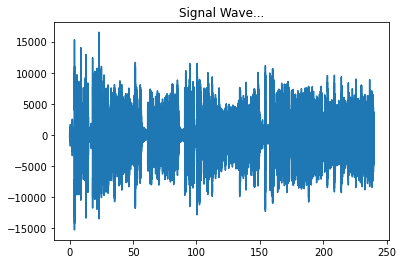

In [2]:
spf = wave.open('sample.wav','r')

#Extract Raw Audio from Wav File
signal = spf.readframes(-1)
signal = np.fromstring(signal, 'Int16')
fs = spf.getframerate()

#If Stereo
if spf.getnchannels() == 2:
    print ('Just mono files')
    sys.exit(0)


Time=np.linspace(0, len(signal)/fs, num=len(signal))

plt.figure(1)
plt.title('Signal Wave...')
plt.plot(Time,signal)
plt.show()

# Get signals to CosmosDB

In [3]:
Time.shape

(10583040,)

In [4]:
signal.shape

(10583040,)

In [5]:
type(Time)

numpy.ndarray

In [6]:
df = pd.DataFrame(data = {'Time':Time,'signal':signal})
df.shape

(10583040, 2)

In [7]:
df

,Time,signal
0,0.000000,232
1,0.000023,-23
2,0.000045,-327
3,0.000068,-243
4,0.000091,113
...,...,...
10583035,239.978141,172
10583036,239.978163,146
10583037,239.978186,127
10583038,239.978209,130


In [24]:
task

{'PartitionKey': 'RHCP',
 'RowKey': '105604',
 'Time': 2.3946260766102885,
 'signal': -94}

In [8]:
from azure.cosmosdb.table.tableservice import TableService
from azure.cosmosdb.table.models import Entity
import time

### Crear tabla en CosmosDB

table_service = TableService(
account_name='', 
account_key='')

table_service.create_table('timevssignal')

### Inicializar cronometro en minutos

start = time.time()/60

n = 1

for t,s in zip(df['Time'],df['signal']):

    task = {'PartitionKey': 'RHCP', 'RowKey': str(n).zfill(3),}
           
    tempdict =  {'Time': t, 'signal': s}
    
    task.update(tempdict)
    
    n += 1
    
    table_service.insert_entity('timevssignal', task)
    
    end = time.time()/60
    
    timedelta = end - start
    
    print(f"{n} registros subidos a CosmosDB. El tiempo transcurrido es de {timedelta:.2f} minutos.")

2 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
3 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
4 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
5 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
6 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
7 registros subidos a CosmosDB. El tiempo transcurrido es de 0.00 minutos.
8 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
9 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
10 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
11 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
12 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
13 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
14 registros subidos a CosmosDB. El tiempo transcurrido es de 0.01 minutos.
15 registros subidos

113 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
114 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
115 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
116 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
117 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
118 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
119 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
120 registros subidos a CosmosDB. El tiempo transcurrido es de 0.08 minutos.
121 registros subidos a CosmosDB. El tiempo transcurrido es de 0.09 minutos.
122 registros subidos a CosmosDB. El tiempo transcurrido es de 0.09 minutos.
123 registros subidos a CosmosDB. El tiempo transcurrido es de 0.09 minutos.
124 registros subidos a CosmosDB. El tiempo transcurrido es de 0.09 minutos.
125 registros subidos a CosmosDB. El tiempo transcurrido es de 0.09 minutos.

224 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
225 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
226 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
227 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
228 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
229 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
230 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
231 registros subidos a CosmosDB. El tiempo transcurrido es de 0.16 minutos.
232 registros subidos a CosmosDB. El tiempo transcurrido es de 0.17 minutos.
233 registros subidos a CosmosDB. El tiempo transcurrido es de 0.17 minutos.
234 registros subidos a CosmosDB. El tiempo transcurrido es de 0.17 minutos.
235 registros subidos a CosmosDB. El tiempo transcurrido es de 0.17 minutos.
236 registros subidos a CosmosDB. El tiempo transcurrido es de 0.17 minutos.

331 registros subidos a CosmosDB. El tiempo transcurrido es de 0.23 minutos.
332 registros subidos a CosmosDB. El tiempo transcurrido es de 0.23 minutos.
333 registros subidos a CosmosDB. El tiempo transcurrido es de 0.23 minutos.
334 registros subidos a CosmosDB. El tiempo transcurrido es de 0.23 minutos.
335 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
336 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
337 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
338 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
339 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
340 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
341 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
342 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.
343 registros subidos a CosmosDB. El tiempo transcurrido es de 0.24 minutos.

440 registros subidos a CosmosDB. El tiempo transcurrido es de 0.31 minutos.
441 registros subidos a CosmosDB. El tiempo transcurrido es de 0.31 minutos.
442 registros subidos a CosmosDB. El tiempo transcurrido es de 0.31 minutos.
443 registros subidos a CosmosDB. El tiempo transcurrido es de 0.31 minutos.
444 registros subidos a CosmosDB. El tiempo transcurrido es de 0.31 minutos.
445 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
446 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
447 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
448 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
449 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
450 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
451 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.
452 registros subidos a CosmosDB. El tiempo transcurrido es de 0.32 minutos.

551 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
552 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
553 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
554 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
555 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
556 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
557 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
558 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
559 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
560 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
561 registros subidos a CosmosDB. El tiempo transcurrido es de 0.39 minutos.
562 registros subidos a CosmosDB. El tiempo transcurrido es de 0.40 minutos.
563 registros subidos a CosmosDB. El tiempo transcurrido es de 0.40 minutos.

659 registros subidos a CosmosDB. El tiempo transcurrido es de 0.46 minutos.
660 registros subidos a CosmosDB. El tiempo transcurrido es de 0.46 minutos.
661 registros subidos a CosmosDB. El tiempo transcurrido es de 0.46 minutos.
662 registros subidos a CosmosDB. El tiempo transcurrido es de 0.46 minutos.
663 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
664 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
665 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
666 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
667 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
668 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
669 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
670 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.
671 registros subidos a CosmosDB. El tiempo transcurrido es de 0.47 minutos.

766 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
767 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
768 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
769 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
770 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
771 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
772 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
773 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
774 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
775 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
776 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
777 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.
778 registros subidos a CosmosDB. El tiempo transcurrido es de 0.54 minutos.

876 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
877 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
878 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
879 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
880 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
881 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
882 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
883 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
884 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
885 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
886 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
887 registros subidos a CosmosDB. El tiempo transcurrido es de 0.62 minutos.
888 registros subidos a CosmosDB. El tiempo transcurrido es de 0.63 minutos.

985 registros subidos a CosmosDB. El tiempo transcurrido es de 0.69 minutos.
986 registros subidos a CosmosDB. El tiempo transcurrido es de 0.69 minutos.
987 registros subidos a CosmosDB. El tiempo transcurrido es de 0.69 minutos.
988 registros subidos a CosmosDB. El tiempo transcurrido es de 0.69 minutos.
989 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
990 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
991 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
992 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
993 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
994 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
995 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
996 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.
997 registros subidos a CosmosDB. El tiempo transcurrido es de 0.70 minutos.

1092 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1093 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1094 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1095 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1096 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1097 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1098 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1099 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1100 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1101 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1102 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1103 registros subidos a CosmosDB. El tiempo transcurrido es de 0.77 minutos.
1104 registros subidos a CosmosDB. El tiempo transcurrido es de 

1199 registros subidos a CosmosDB. El tiempo transcurrido es de 0.84 minutos.
1200 registros subidos a CosmosDB. El tiempo transcurrido es de 0.84 minutos.
1201 registros subidos a CosmosDB. El tiempo transcurrido es de 0.84 minutos.
1202 registros subidos a CosmosDB. El tiempo transcurrido es de 0.84 minutos.
1203 registros subidos a CosmosDB. El tiempo transcurrido es de 0.84 minutos.
1204 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1205 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1206 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1207 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1208 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1209 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1210 registros subidos a CosmosDB. El tiempo transcurrido es de 0.85 minutos.
1211 registros subidos a CosmosDB. El tiempo transcurrido es de 

1306 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1307 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1308 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1309 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1310 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1311 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1312 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1313 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1314 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1315 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1316 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1317 registros subidos a CosmosDB. El tiempo transcurrido es de 0.92 minutos.
1318 registros subidos a CosmosDB. El tiempo transcurrido es de 

1412 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1413 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1414 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1415 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1416 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1417 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1418 registros subidos a CosmosDB. El tiempo transcurrido es de 0.99 minutos.
1419 registros subidos a CosmosDB. El tiempo transcurrido es de 1.00 minutos.
1420 registros subidos a CosmosDB. El tiempo transcurrido es de 1.00 minutos.
1421 registros subidos a CosmosDB. El tiempo transcurrido es de 1.00 minutos.
1422 registros subidos a CosmosDB. El tiempo transcurrido es de 1.00 minutos.
1423 registros subidos a CosmosDB. El tiempo transcurrido es de 1.00 minutos.
1424 registros subidos a CosmosDB. El tiempo transcurrido es de 

1519 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1520 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1521 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1522 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1523 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1524 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1525 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1526 registros subidos a CosmosDB. El tiempo transcurrido es de 1.07 minutos.
1527 registros subidos a CosmosDB. El tiempo transcurrido es de 1.08 minutos.
1528 registros subidos a CosmosDB. El tiempo transcurrido es de 1.08 minutos.
1529 registros subidos a CosmosDB. El tiempo transcurrido es de 1.08 minutos.
1530 registros subidos a CosmosDB. El tiempo transcurrido es de 1.08 minutos.
1531 registros subidos a CosmosDB. El tiempo transcurrido es de 

1627 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1628 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1629 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1630 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1631 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1632 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1633 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1634 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1635 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1636 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1637 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1638 registros subidos a CosmosDB. El tiempo transcurrido es de 1.15 minutos.
1639 registros subidos a CosmosDB. El tiempo transcurrido es de 

1737 registros subidos a CosmosDB. El tiempo transcurrido es de 1.22 minutos.
1738 registros subidos a CosmosDB. El tiempo transcurrido es de 1.22 minutos.
1739 registros subidos a CosmosDB. El tiempo transcurrido es de 1.22 minutos.
1740 registros subidos a CosmosDB. El tiempo transcurrido es de 1.22 minutos.
1741 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1742 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1743 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1744 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1745 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1746 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1747 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1748 registros subidos a CosmosDB. El tiempo transcurrido es de 1.23 minutos.
1749 registros subidos a CosmosDB. El tiempo transcurrido es de 

1843 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1844 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1845 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1846 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1847 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1848 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1849 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1850 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1851 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1852 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1853 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1854 registros subidos a CosmosDB. El tiempo transcurrido es de 1.30 minutos.
1855 registros subidos a CosmosDB. El tiempo transcurrido es de 

1949 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1950 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1951 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1952 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1953 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1954 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1955 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1956 registros subidos a CosmosDB. El tiempo transcurrido es de 1.37 minutos.
1957 registros subidos a CosmosDB. El tiempo transcurrido es de 1.38 minutos.
1958 registros subidos a CosmosDB. El tiempo transcurrido es de 1.38 minutos.
1959 registros subidos a CosmosDB. El tiempo transcurrido es de 1.38 minutos.
1960 registros subidos a CosmosDB. El tiempo transcurrido es de 1.38 minutos.
1961 registros subidos a CosmosDB. El tiempo transcurrido es de 

2060 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2061 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2062 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2063 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2064 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2065 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2066 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2067 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2068 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2069 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2070 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2071 registros subidos a CosmosDB. El tiempo transcurrido es de 1.45 minutos.
2072 registros subidos a CosmosDB. El tiempo transcurrido es de 

2166 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2167 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2168 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2169 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2170 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2171 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2172 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2173 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2174 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2175 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2176 registros subidos a CosmosDB. El tiempo transcurrido es de 1.52 minutos.
2177 registros subidos a CosmosDB. El tiempo transcurrido es de 1.53 minutos.
2178 registros subidos a CosmosDB. El tiempo transcurrido es de 

2274 registros subidos a CosmosDB. El tiempo transcurrido es de 1.60 minutos.
2275 registros subidos a CosmosDB. El tiempo transcurrido es de 1.60 minutos.
2276 registros subidos a CosmosDB. El tiempo transcurrido es de 1.60 minutos.
2277 registros subidos a CosmosDB. El tiempo transcurrido es de 1.60 minutos.
2278 registros subidos a CosmosDB. El tiempo transcurrido es de 1.60 minutos.
2279 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2280 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2281 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2282 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2283 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2284 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2285 registros subidos a CosmosDB. El tiempo transcurrido es de 1.61 minutos.
2286 registros subidos a CosmosDB. El tiempo transcurrido es de 

2381 registros subidos a CosmosDB. El tiempo transcurrido es de 1.68 minutos.
2382 registros subidos a CosmosDB. El tiempo transcurrido es de 1.68 minutos.
2383 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2384 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2385 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2386 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2387 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2388 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2389 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2390 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2391 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2392 registros subidos a CosmosDB. El tiempo transcurrido es de 1.69 minutos.
2393 registros subidos a CosmosDB. El tiempo transcurrido es de 

2489 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2490 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2491 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2492 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2493 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2494 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2495 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2496 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2497 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2498 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2499 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2500 registros subidos a CosmosDB. El tiempo transcurrido es de 1.77 minutos.
2501 registros subidos a CosmosDB. El tiempo transcurrido es de 

2595 registros subidos a CosmosDB. El tiempo transcurrido es de 1.84 minutos.
2596 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2597 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2598 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2599 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2600 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2601 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2602 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2603 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2604 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2605 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2606 registros subidos a CosmosDB. El tiempo transcurrido es de 1.85 minutos.
2607 registros subidos a CosmosDB. El tiempo transcurrido es de 

2701 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2702 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2703 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2704 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2705 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2706 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2707 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2708 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2709 registros subidos a CosmosDB. El tiempo transcurrido es de 1.92 minutos.
2710 registros subidos a CosmosDB. El tiempo transcurrido es de 1.93 minutos.
2711 registros subidos a CosmosDB. El tiempo transcurrido es de 1.93 minutos.
2712 registros subidos a CosmosDB. El tiempo transcurrido es de 1.93 minutos.
2713 registros subidos a CosmosDB. El tiempo transcurrido es de 

2811 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2812 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2813 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2814 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2815 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2816 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2817 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2818 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2819 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2820 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2821 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2822 registros subidos a CosmosDB. El tiempo transcurrido es de 2.00 minutos.
2823 registros subidos a CosmosDB. El tiempo transcurrido es de 

2922 registros subidos a CosmosDB. El tiempo transcurrido es de 2.08 minutos.
2923 registros subidos a CosmosDB. El tiempo transcurrido es de 2.08 minutos.
2924 registros subidos a CosmosDB. El tiempo transcurrido es de 2.08 minutos.
2925 registros subidos a CosmosDB. El tiempo transcurrido es de 2.08 minutos.
2926 registros subidos a CosmosDB. El tiempo transcurrido es de 2.08 minutos.
2927 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2928 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2929 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2930 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2931 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2932 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2933 registros subidos a CosmosDB. El tiempo transcurrido es de 2.09 minutos.
2934 registros subidos a CosmosDB. El tiempo transcurrido es de 

3029 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3030 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3031 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3032 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3033 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3034 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3035 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3036 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3037 registros subidos a CosmosDB. El tiempo transcurrido es de 2.16 minutos.
3038 registros subidos a CosmosDB. El tiempo transcurrido es de 2.17 minutos.
3039 registros subidos a CosmosDB. El tiempo transcurrido es de 2.17 minutos.
3040 registros subidos a CosmosDB. El tiempo transcurrido es de 2.17 minutos.
3041 registros subidos a CosmosDB. El tiempo transcurrido es de 

3136 registros subidos a CosmosDB. El tiempo transcurrido es de 2.23 minutos.
3137 registros subidos a CosmosDB. El tiempo transcurrido es de 2.23 minutos.
3138 registros subidos a CosmosDB. El tiempo transcurrido es de 2.23 minutos.
3139 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3140 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3141 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3142 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3143 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3144 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3145 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3146 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3147 registros subidos a CosmosDB. El tiempo transcurrido es de 2.24 minutos.
3148 registros subidos a CosmosDB. El tiempo transcurrido es de 

3242 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3243 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3244 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3245 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3246 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3247 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3248 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3249 registros subidos a CosmosDB. El tiempo transcurrido es de 2.31 minutos.
3250 registros subidos a CosmosDB. El tiempo transcurrido es de 2.32 minutos.
3251 registros subidos a CosmosDB. El tiempo transcurrido es de 2.32 minutos.
3252 registros subidos a CosmosDB. El tiempo transcurrido es de 2.32 minutos.
3253 registros subidos a CosmosDB. El tiempo transcurrido es de 2.32 minutos.
3254 registros subidos a CosmosDB. El tiempo transcurrido es de 

3348 registros subidos a CosmosDB. El tiempo transcurrido es de 2.38 minutos.
3349 registros subidos a CosmosDB. El tiempo transcurrido es de 2.38 minutos.
3350 registros subidos a CosmosDB. El tiempo transcurrido es de 2.38 minutos.
3351 registros subidos a CosmosDB. El tiempo transcurrido es de 2.38 minutos.
3352 registros subidos a CosmosDB. El tiempo transcurrido es de 2.38 minutos.
3353 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3354 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3355 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3356 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3357 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3358 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3359 registros subidos a CosmosDB. El tiempo transcurrido es de 2.39 minutos.
3360 registros subidos a CosmosDB. El tiempo transcurrido es de 

3455 registros subidos a CosmosDB. El tiempo transcurrido es de 2.45 minutos.
3456 registros subidos a CosmosDB. El tiempo transcurrido es de 2.45 minutos.
3457 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3458 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3459 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3460 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3461 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3462 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3463 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3464 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3465 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3466 registros subidos a CosmosDB. El tiempo transcurrido es de 2.46 minutos.
3467 registros subidos a CosmosDB. El tiempo transcurrido es de 

3562 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3563 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3564 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3565 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3566 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3567 registros subidos a CosmosDB. El tiempo transcurrido es de 2.53 minutos.
3568 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3569 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3570 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3571 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3572 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3573 registros subidos a CosmosDB. El tiempo transcurrido es de 2.54 minutos.
3574 registros subidos a CosmosDB. El tiempo transcurrido es de 

3672 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3673 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3674 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3675 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3676 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3677 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3678 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3679 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3680 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3681 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3682 registros subidos a CosmosDB. El tiempo transcurrido es de 2.61 minutos.
3683 registros subidos a CosmosDB. El tiempo transcurrido es de 2.62 minutos.
3684 registros subidos a CosmosDB. El tiempo transcurrido es de 

3780 registros subidos a CosmosDB. El tiempo transcurrido es de 2.68 minutos.
3781 registros subidos a CosmosDB. El tiempo transcurrido es de 2.68 minutos.
3782 registros subidos a CosmosDB. El tiempo transcurrido es de 2.68 minutos.
3783 registros subidos a CosmosDB. El tiempo transcurrido es de 2.68 minutos.
3784 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3785 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3786 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3787 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3788 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3789 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3790 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3791 registros subidos a CosmosDB. El tiempo transcurrido es de 2.69 minutos.
3792 registros subidos a CosmosDB. El tiempo transcurrido es de 

3888 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3889 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3890 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3891 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3892 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3893 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3894 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3895 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3896 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3897 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3898 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3899 registros subidos a CosmosDB. El tiempo transcurrido es de 2.76 minutos.
3900 registros subidos a CosmosDB. El tiempo transcurrido es de 

3998 registros subidos a CosmosDB. El tiempo transcurrido es de 2.83 minutos.
3999 registros subidos a CosmosDB. El tiempo transcurrido es de 2.83 minutos.
4000 registros subidos a CosmosDB. El tiempo transcurrido es de 2.83 minutos.
4001 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4002 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4003 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4004 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4005 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4006 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4007 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4008 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4009 registros subidos a CosmosDB. El tiempo transcurrido es de 2.84 minutos.
4010 registros subidos a CosmosDB. El tiempo transcurrido es de 

4108 registros subidos a CosmosDB. El tiempo transcurrido es de 2.91 minutos.
4109 registros subidos a CosmosDB. El tiempo transcurrido es de 2.91 minutos.
4110 registros subidos a CosmosDB. El tiempo transcurrido es de 2.91 minutos.
4111 registros subidos a CosmosDB. El tiempo transcurrido es de 2.91 minutos.
4112 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4113 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4114 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4115 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4116 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4117 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4118 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4119 registros subidos a CosmosDB. El tiempo transcurrido es de 2.92 minutos.
4120 registros subidos a CosmosDB. El tiempo transcurrido es de 

4218 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4219 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4220 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4221 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4222 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4223 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4224 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4225 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4226 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4227 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4228 registros subidos a CosmosDB. El tiempo transcurrido es de 2.99 minutos.
4229 registros subidos a CosmosDB. El tiempo transcurrido es de 3.00 minutos.
4230 registros subidos a CosmosDB. El tiempo transcurrido es de 

4327 registros subidos a CosmosDB. El tiempo transcurrido es de 3.06 minutos.
4328 registros subidos a CosmosDB. El tiempo transcurrido es de 3.06 minutos.
4329 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4330 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4331 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4332 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4333 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4334 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4335 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4336 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4337 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4338 registros subidos a CosmosDB. El tiempo transcurrido es de 3.07 minutos.
4339 registros subidos a CosmosDB. El tiempo transcurrido es de 

4434 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4435 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4436 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4437 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4438 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4439 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4440 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4441 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4442 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4443 registros subidos a CosmosDB. El tiempo transcurrido es de 3.14 minutos.
4444 registros subidos a CosmosDB. El tiempo transcurrido es de 3.15 minutos.
4445 registros subidos a CosmosDB. El tiempo transcurrido es de 3.15 minutos.
4446 registros subidos a CosmosDB. El tiempo transcurrido es de 

4542 registros subidos a CosmosDB. El tiempo transcurrido es de 3.21 minutos.
4543 registros subidos a CosmosDB. El tiempo transcurrido es de 3.21 minutos.
4544 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4545 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4546 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4547 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4548 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4549 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4550 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4551 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4552 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4553 registros subidos a CosmosDB. El tiempo transcurrido es de 3.22 minutos.
4554 registros subidos a CosmosDB. El tiempo transcurrido es de 

4652 registros subidos a CosmosDB. El tiempo transcurrido es de 3.29 minutos.
4653 registros subidos a CosmosDB. El tiempo transcurrido es de 3.29 minutos.
4654 registros subidos a CosmosDB. El tiempo transcurrido es de 3.29 minutos.
4655 registros subidos a CosmosDB. El tiempo transcurrido es de 3.29 minutos.
4656 registros subidos a CosmosDB. El tiempo transcurrido es de 3.29 minutos.
4657 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4658 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4659 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4660 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4661 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4662 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4663 registros subidos a CosmosDB. El tiempo transcurrido es de 3.30 minutos.
4664 registros subidos a CosmosDB. El tiempo transcurrido es de 

4762 registros subidos a CosmosDB. El tiempo transcurrido es de 3.37 minutos.
4763 registros subidos a CosmosDB. El tiempo transcurrido es de 3.37 minutos.
4764 registros subidos a CosmosDB. El tiempo transcurrido es de 3.37 minutos.
4765 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4766 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4767 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4768 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4769 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4770 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4771 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4772 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4773 registros subidos a CosmosDB. El tiempo transcurrido es de 3.38 minutos.
4774 registros subidos a CosmosDB. El tiempo transcurrido es de 

4868 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4869 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4870 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4871 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4872 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4873 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4874 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4875 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4876 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4877 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4878 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4879 registros subidos a CosmosDB. El tiempo transcurrido es de 3.45 minutos.
4880 registros subidos a CosmosDB. El tiempo transcurrido es de 

4975 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4976 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4977 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4978 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4979 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4980 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4981 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4982 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4983 registros subidos a CosmosDB. El tiempo transcurrido es de 3.52 minutos.
4984 registros subidos a CosmosDB. El tiempo transcurrido es de 3.53 minutos.
4985 registros subidos a CosmosDB. El tiempo transcurrido es de 3.53 minutos.
4986 registros subidos a CosmosDB. El tiempo transcurrido es de 3.53 minutos.
4987 registros subidos a CosmosDB. El tiempo transcurrido es de 

5085 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5086 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5087 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5088 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5089 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5090 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5091 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5092 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5093 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5094 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5095 registros subidos a CosmosDB. El tiempo transcurrido es de 3.60 minutos.
5096 registros subidos a CosmosDB. El tiempo transcurrido es de 3.61 minutos.
5097 registros subidos a CosmosDB. El tiempo transcurrido es de 

5193 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5194 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5195 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5196 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5197 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5198 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5199 registros subidos a CosmosDB. El tiempo transcurrido es de 3.67 minutos.
5200 registros subidos a CosmosDB. El tiempo transcurrido es de 3.68 minutos.
5201 registros subidos a CosmosDB. El tiempo transcurrido es de 3.68 minutos.
5202 registros subidos a CosmosDB. El tiempo transcurrido es de 3.68 minutos.
5203 registros subidos a CosmosDB. El tiempo transcurrido es de 3.68 minutos.
5204 registros subidos a CosmosDB. El tiempo transcurrido es de 3.68 minutos.
5205 registros subidos a CosmosDB. El tiempo transcurrido es de 

5300 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5301 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5302 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5303 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5304 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5305 registros subidos a CosmosDB. El tiempo transcurrido es de 3.74 minutos.
5306 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5307 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5308 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5309 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5310 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5311 registros subidos a CosmosDB. El tiempo transcurrido es de 3.75 minutos.
5312 registros subidos a CosmosDB. El tiempo transcurrido es de 

5409 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5410 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5411 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5412 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5413 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5414 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5415 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5416 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5417 registros subidos a CosmosDB. El tiempo transcurrido es de 3.82 minutos.
5418 registros subidos a CosmosDB. El tiempo transcurrido es de 3.83 minutos.
5419 registros subidos a CosmosDB. El tiempo transcurrido es de 3.83 minutos.
5420 registros subidos a CosmosDB. El tiempo transcurrido es de 3.83 minutos.
5421 registros subidos a CosmosDB. El tiempo transcurrido es de 

5519 registros subidos a CosmosDB. El tiempo transcurrido es de 3.89 minutos.
5520 registros subidos a CosmosDB. El tiempo transcurrido es de 3.89 minutos.
5521 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5522 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5523 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5524 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5525 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5526 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5527 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5528 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5529 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5530 registros subidos a CosmosDB. El tiempo transcurrido es de 3.90 minutos.
5531 registros subidos a CosmosDB. El tiempo transcurrido es de 

5628 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5629 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5630 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5631 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5632 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5633 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5634 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5635 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5636 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5637 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5638 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5639 registros subidos a CosmosDB. El tiempo transcurrido es de 3.97 minutos.
5640 registros subidos a CosmosDB. El tiempo transcurrido es de 

5737 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5738 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5739 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5740 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5741 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5742 registros subidos a CosmosDB. El tiempo transcurrido es de 4.04 minutos.
5743 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5744 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5745 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5746 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5747 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5748 registros subidos a CosmosDB. El tiempo transcurrido es de 4.05 minutos.
5749 registros subidos a CosmosDB. El tiempo transcurrido es de 

5847 registros subidos a CosmosDB. El tiempo transcurrido es de 4.12 minutos.
5848 registros subidos a CosmosDB. El tiempo transcurrido es de 4.12 minutos.
5849 registros subidos a CosmosDB. El tiempo transcurrido es de 4.12 minutos.
5850 registros subidos a CosmosDB. El tiempo transcurrido es de 4.12 minutos.
5851 registros subidos a CosmosDB. El tiempo transcurrido es de 4.12 minutos.
5852 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5853 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5854 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5855 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5856 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5857 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5858 registros subidos a CosmosDB. El tiempo transcurrido es de 4.13 minutos.
5859 registros subidos a CosmosDB. El tiempo transcurrido es de 

5954 registros subidos a CosmosDB. El tiempo transcurrido es de 4.19 minutos.
5955 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5956 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5957 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5958 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5959 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5960 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5961 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5962 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5963 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5964 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5965 registros subidos a CosmosDB. El tiempo transcurrido es de 4.20 minutos.
5966 registros subidos a CosmosDB. El tiempo transcurrido es de 

6061 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6062 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6063 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6064 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6065 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6066 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6067 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6068 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6069 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6070 registros subidos a CosmosDB. El tiempo transcurrido es de 4.27 minutos.
6071 registros subidos a CosmosDB. El tiempo transcurrido es de 4.28 minutos.
6072 registros subidos a CosmosDB. El tiempo transcurrido es de 4.28 minutos.
6073 registros subidos a CosmosDB. El tiempo transcurrido es de 

6170 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6171 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6172 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6173 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6174 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6175 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6176 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6177 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6178 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6179 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6180 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6181 registros subidos a CosmosDB. El tiempo transcurrido es de 4.35 minutos.
6182 registros subidos a CosmosDB. El tiempo transcurrido es de 

6276 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6277 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6278 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6279 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6280 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6281 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6282 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6283 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6284 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6285 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6286 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6287 registros subidos a CosmosDB. El tiempo transcurrido es de 4.42 minutos.
6288 registros subidos a CosmosDB. El tiempo transcurrido es de 

6382 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6383 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6384 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6385 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6386 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6387 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6388 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6389 registros subidos a CosmosDB. El tiempo transcurrido es de 4.49 minutos.
6390 registros subidos a CosmosDB. El tiempo transcurrido es de 4.50 minutos.
6391 registros subidos a CosmosDB. El tiempo transcurrido es de 4.50 minutos.
6392 registros subidos a CosmosDB. El tiempo transcurrido es de 4.50 minutos.
6393 registros subidos a CosmosDB. El tiempo transcurrido es de 4.50 minutos.
6394 registros subidos a CosmosDB. El tiempo transcurrido es de 

6489 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6490 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6491 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6492 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6493 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6494 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6495 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6496 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6497 registros subidos a CosmosDB. El tiempo transcurrido es de 4.57 minutos.
6498 registros subidos a CosmosDB. El tiempo transcurrido es de 4.58 minutos.
6499 registros subidos a CosmosDB. El tiempo transcurrido es de 4.58 minutos.
6500 registros subidos a CosmosDB. El tiempo transcurrido es de 4.58 minutos.
6501 registros subidos a CosmosDB. El tiempo transcurrido es de 

6598 registros subidos a CosmosDB. El tiempo transcurrido es de 4.64 minutos.
6599 registros subidos a CosmosDB. El tiempo transcurrido es de 4.64 minutos.
6600 registros subidos a CosmosDB. El tiempo transcurrido es de 4.64 minutos.
6601 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6602 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6603 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6604 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6605 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6606 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6607 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6608 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6609 registros subidos a CosmosDB. El tiempo transcurrido es de 4.65 minutos.
6610 registros subidos a CosmosDB. El tiempo transcurrido es de 

6704 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6705 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6706 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6707 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6708 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6709 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6710 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6711 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6712 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6713 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6714 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6715 registros subidos a CosmosDB. El tiempo transcurrido es de 4.72 minutos.
6716 registros subidos a CosmosDB. El tiempo transcurrido es de 

6815 registros subidos a CosmosDB. El tiempo transcurrido es de 4.79 minutos.
6816 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6817 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6818 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6819 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6820 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6821 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6822 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6823 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6824 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6825 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6826 registros subidos a CosmosDB. El tiempo transcurrido es de 4.80 minutos.
6827 registros subidos a CosmosDB. El tiempo transcurrido es de 

6926 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6927 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6928 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6929 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6930 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6931 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6932 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6933 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6934 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6935 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6936 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6937 registros subidos a CosmosDB. El tiempo transcurrido es de 4.88 minutos.
6938 registros subidos a CosmosDB. El tiempo transcurrido es de 

7033 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7034 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7035 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7036 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7037 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7038 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7039 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7040 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7041 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7042 registros subidos a CosmosDB. El tiempo transcurrido es de 4.95 minutos.
7043 registros subidos a CosmosDB. El tiempo transcurrido es de 4.96 minutos.
7044 registros subidos a CosmosDB. El tiempo transcurrido es de 4.96 minutos.
7045 registros subidos a CosmosDB. El tiempo transcurrido es de 

7143 registros subidos a CosmosDB. El tiempo transcurrido es de 5.02 minutos.
7144 registros subidos a CosmosDB. El tiempo transcurrido es de 5.02 minutos.
7145 registros subidos a CosmosDB. El tiempo transcurrido es de 5.02 minutos.
7146 registros subidos a CosmosDB. El tiempo transcurrido es de 5.02 minutos.
7147 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7148 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7149 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7150 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7151 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7152 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7153 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7154 registros subidos a CosmosDB. El tiempo transcurrido es de 5.03 minutos.
7155 registros subidos a CosmosDB. El tiempo transcurrido es de 

7249 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7250 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7251 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7252 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7253 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7254 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7255 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7256 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7257 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7258 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7259 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7260 registros subidos a CosmosDB. El tiempo transcurrido es de 5.12 minutos.
7261 registros subidos a CosmosDB. El tiempo transcurrido es de 

7356 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7357 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7358 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7359 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7360 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7361 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7362 registros subidos a CosmosDB. El tiempo transcurrido es de 5.19 minutos.
7363 registros subidos a CosmosDB. El tiempo transcurrido es de 5.20 minutos.
7364 registros subidos a CosmosDB. El tiempo transcurrido es de 5.20 minutos.
7365 registros subidos a CosmosDB. El tiempo transcurrido es de 5.20 minutos.
7366 registros subidos a CosmosDB. El tiempo transcurrido es de 5.20 minutos.
7367 registros subidos a CosmosDB. El tiempo transcurrido es de 5.20 minutos.
7368 registros subidos a CosmosDB. El tiempo transcurrido es de 

7464 registros subidos a CosmosDB. El tiempo transcurrido es de 5.26 minutos.
7465 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7466 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7467 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7468 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7469 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7470 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7471 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7472 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7473 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7474 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7475 registros subidos a CosmosDB. El tiempo transcurrido es de 5.27 minutos.
7476 registros subidos a CosmosDB. El tiempo transcurrido es de 

7572 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7573 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7574 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7575 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7576 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7577 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7578 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7579 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7580 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7581 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7582 registros subidos a CosmosDB. El tiempo transcurrido es de 5.35 minutos.
7583 registros subidos a CosmosDB. El tiempo transcurrido es de 5.36 minutos.
7584 registros subidos a CosmosDB. El tiempo transcurrido es de 

7680 registros subidos a CosmosDB. El tiempo transcurrido es de 5.42 minutos.
7681 registros subidos a CosmosDB. El tiempo transcurrido es de 5.42 minutos.
7682 registros subidos a CosmosDB. El tiempo transcurrido es de 5.42 minutos.
7683 registros subidos a CosmosDB. El tiempo transcurrido es de 5.42 minutos.
7684 registros subidos a CosmosDB. El tiempo transcurrido es de 5.42 minutos.
7685 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7686 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7687 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7688 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7689 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7690 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7691 registros subidos a CosmosDB. El tiempo transcurrido es de 5.43 minutos.
7692 registros subidos a CosmosDB. El tiempo transcurrido es de 

7787 registros subidos a CosmosDB. El tiempo transcurrido es de 5.49 minutos.
7788 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7789 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7790 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7791 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7792 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7793 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7794 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7795 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7796 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7797 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7798 registros subidos a CosmosDB. El tiempo transcurrido es de 5.50 minutos.
7799 registros subidos a CosmosDB. El tiempo transcurrido es de 

7893 registros subidos a CosmosDB. El tiempo transcurrido es de 5.57 minutos.
7894 registros subidos a CosmosDB. El tiempo transcurrido es de 5.58 minutos.
7895 registros subidos a CosmosDB. El tiempo transcurrido es de 5.58 minutos.
7896 registros subidos a CosmosDB. El tiempo transcurrido es de 5.59 minutos.
7897 registros subidos a CosmosDB. El tiempo transcurrido es de 5.59 minutos.
7898 registros subidos a CosmosDB. El tiempo transcurrido es de 5.59 minutos.
7899 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7900 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7901 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7902 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7903 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7904 registros subidos a CosmosDB. El tiempo transcurrido es de 5.60 minutos.
7905 registros subidos a CosmosDB. El tiempo transcurrido es de 

7999 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8000 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8001 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8002 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8003 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8004 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8005 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8006 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8007 registros subidos a CosmosDB. El tiempo transcurrido es de 5.70 minutos.
8008 registros subidos a CosmosDB. El tiempo transcurrido es de 5.71 minutos.
8009 registros subidos a CosmosDB. El tiempo transcurrido es de 5.71 minutos.
8010 registros subidos a CosmosDB. El tiempo transcurrido es de 5.71 minutos.
8011 registros subidos a CosmosDB. El tiempo transcurrido es de 

8107 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8108 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8109 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8110 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8111 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8112 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8113 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8114 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8115 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8116 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8117 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8118 registros subidos a CosmosDB. El tiempo transcurrido es de 5.78 minutos.
8119 registros subidos a CosmosDB. El tiempo transcurrido es de 

8215 registros subidos a CosmosDB. El tiempo transcurrido es de 5.85 minutos.
8216 registros subidos a CosmosDB. El tiempo transcurrido es de 5.85 minutos.
8217 registros subidos a CosmosDB. El tiempo transcurrido es de 5.85 minutos.
8218 registros subidos a CosmosDB. El tiempo transcurrido es de 5.85 minutos.
8219 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8220 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8221 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8222 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8223 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8224 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8225 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8226 registros subidos a CosmosDB. El tiempo transcurrido es de 5.86 minutos.
8227 registros subidos a CosmosDB. El tiempo transcurrido es de 

8325 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8326 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8327 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8328 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8329 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8330 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8331 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8332 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8333 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8334 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8335 registros subidos a CosmosDB. El tiempo transcurrido es de 5.93 minutos.
8336 registros subidos a CosmosDB. El tiempo transcurrido es de 5.94 minutos.
8337 registros subidos a CosmosDB. El tiempo transcurrido es de 

8433 registros subidos a CosmosDB. El tiempo transcurrido es de 6.00 minutos.
8434 registros subidos a CosmosDB. El tiempo transcurrido es de 6.00 minutos.
8435 registros subidos a CosmosDB. El tiempo transcurrido es de 6.00 minutos.
8436 registros subidos a CosmosDB. El tiempo transcurrido es de 6.00 minutos.
8437 registros subidos a CosmosDB. El tiempo transcurrido es de 6.00 minutos.
8438 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8439 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8440 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8441 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8442 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8443 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8444 registros subidos a CosmosDB. El tiempo transcurrido es de 6.01 minutos.
8445 registros subidos a CosmosDB. El tiempo transcurrido es de 

8540 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8541 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8542 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8543 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8544 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8545 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8546 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8547 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8548 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8549 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8550 registros subidos a CosmosDB. El tiempo transcurrido es de 6.08 minutos.
8551 registros subidos a CosmosDB. El tiempo transcurrido es de 6.09 minutos.
8552 registros subidos a CosmosDB. El tiempo transcurrido es de 

8648 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8649 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8650 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8651 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8652 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8653 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8654 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8655 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8656 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8657 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8658 registros subidos a CosmosDB. El tiempo transcurrido es de 6.16 minutos.
8659 registros subidos a CosmosDB. El tiempo transcurrido es de 6.17 minutos.
8660 registros subidos a CosmosDB. El tiempo transcurrido es de 

8755 registros subidos a CosmosDB. El tiempo transcurrido es de 6.23 minutos.
8756 registros subidos a CosmosDB. El tiempo transcurrido es de 6.23 minutos.
8757 registros subidos a CosmosDB. El tiempo transcurrido es de 6.23 minutos.
8758 registros subidos a CosmosDB. El tiempo transcurrido es de 6.23 minutos.
8759 registros subidos a CosmosDB. El tiempo transcurrido es de 6.23 minutos.
8760 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8761 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8762 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8763 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8764 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8765 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8766 registros subidos a CosmosDB. El tiempo transcurrido es de 6.24 minutos.
8767 registros subidos a CosmosDB. El tiempo transcurrido es de 

8861 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8862 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8863 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8864 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8865 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8866 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8867 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8868 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8869 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8870 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8871 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8872 registros subidos a CosmosDB. El tiempo transcurrido es de 6.31 minutos.
8873 registros subidos a CosmosDB. El tiempo transcurrido es de 

8967 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8968 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8969 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8970 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8971 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8972 registros subidos a CosmosDB. El tiempo transcurrido es de 6.38 minutos.
8973 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8974 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8975 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8976 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8977 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8978 registros subidos a CosmosDB. El tiempo transcurrido es de 6.39 minutos.
8979 registros subidos a CosmosDB. El tiempo transcurrido es de 

9074 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9075 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9076 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9077 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9078 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9079 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9080 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9081 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9082 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9083 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9084 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9085 registros subidos a CosmosDB. El tiempo transcurrido es de 6.46 minutos.
9086 registros subidos a CosmosDB. El tiempo transcurrido es de 

9183 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9184 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9185 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9186 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9187 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9188 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9189 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9190 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9191 registros subidos a CosmosDB. El tiempo transcurrido es de 6.53 minutos.
9192 registros subidos a CosmosDB. El tiempo transcurrido es de 6.54 minutos.
9193 registros subidos a CosmosDB. El tiempo transcurrido es de 6.54 minutos.
9194 registros subidos a CosmosDB. El tiempo transcurrido es de 6.54 minutos.
9195 registros subidos a CosmosDB. El tiempo transcurrido es de 

9292 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9293 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9294 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9295 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9296 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9297 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9298 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9299 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9300 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9301 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9302 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9303 registros subidos a CosmosDB. El tiempo transcurrido es de 6.61 minutos.
9304 registros subidos a CosmosDB. El tiempo transcurrido es de 

9403 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9404 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9405 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9406 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9407 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9408 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9409 registros subidos a CosmosDB. El tiempo transcurrido es de 6.68 minutos.
9410 registros subidos a CosmosDB. El tiempo transcurrido es de 6.69 minutos.
9411 registros subidos a CosmosDB. El tiempo transcurrido es de 6.69 minutos.
9412 registros subidos a CosmosDB. El tiempo transcurrido es de 6.69 minutos.
9413 registros subidos a CosmosDB. El tiempo transcurrido es de 6.69 minutos.
9414 registros subidos a CosmosDB. El tiempo transcurrido es de 6.69 minutos.
9415 registros subidos a CosmosDB. El tiempo transcurrido es de 

9509 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9510 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9511 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9512 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9513 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9514 registros subidos a CosmosDB. El tiempo transcurrido es de 6.75 minutos.
9515 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9516 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9517 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9518 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9519 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9520 registros subidos a CosmosDB. El tiempo transcurrido es de 6.76 minutos.
9521 registros subidos a CosmosDB. El tiempo transcurrido es de 

9619 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9620 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9621 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9622 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9623 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9624 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9625 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9626 registros subidos a CosmosDB. El tiempo transcurrido es de 6.83 minutos.
9627 registros subidos a CosmosDB. El tiempo transcurrido es de 6.84 minutos.
9628 registros subidos a CosmosDB. El tiempo transcurrido es de 6.84 minutos.
9629 registros subidos a CosmosDB. El tiempo transcurrido es de 6.84 minutos.
9630 registros subidos a CosmosDB. El tiempo transcurrido es de 6.84 minutos.
9631 registros subidos a CosmosDB. El tiempo transcurrido es de 

9728 registros subidos a CosmosDB. El tiempo transcurrido es de 6.90 minutos.
9729 registros subidos a CosmosDB. El tiempo transcurrido es de 6.90 minutos.
9730 registros subidos a CosmosDB. El tiempo transcurrido es de 6.90 minutos.
9731 registros subidos a CosmosDB. El tiempo transcurrido es de 6.90 minutos.
9732 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9733 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9734 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9735 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9736 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9737 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9738 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9739 registros subidos a CosmosDB. El tiempo transcurrido es de 6.91 minutos.
9740 registros subidos a CosmosDB. El tiempo transcurrido es de 

9834 registros subidos a CosmosDB. El tiempo transcurrido es de 6.97 minutos.
9835 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9836 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9837 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9838 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9839 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9840 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9841 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9842 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9843 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9844 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9845 registros subidos a CosmosDB. El tiempo transcurrido es de 6.98 minutos.
9846 registros subidos a CosmosDB. El tiempo transcurrido es de 

9943 registros subidos a CosmosDB. El tiempo transcurrido es de 7.05 minutos.
9944 registros subidos a CosmosDB. El tiempo transcurrido es de 7.05 minutos.
9945 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9946 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9947 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9948 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9949 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9950 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9951 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9952 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9953 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9954 registros subidos a CosmosDB. El tiempo transcurrido es de 7.06 minutos.
9955 registros subidos a CosmosDB. El tiempo transcurrido es de 

10051 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10052 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10053 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10054 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10055 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10056 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10057 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10058 registros subidos a CosmosDB. El tiempo transcurrido es de 7.13 minutos.
10059 registros subidos a CosmosDB. El tiempo transcurrido es de 7.14 minutos.
10060 registros subidos a CosmosDB. El tiempo transcurrido es de 7.14 minutos.
10061 registros subidos a CosmosDB. El tiempo transcurrido es de 7.14 minutos.
10062 registros subidos a CosmosDB. El tiempo transcurrido es de 7.14 minutos.
10063 registros subidos a CosmosDB. El tiempo transc

10155 registros subidos a CosmosDB. El tiempo transcurrido es de 7.20 minutos.
10156 registros subidos a CosmosDB. El tiempo transcurrido es de 7.20 minutos.
10157 registros subidos a CosmosDB. El tiempo transcurrido es de 7.20 minutos.
10158 registros subidos a CosmosDB. El tiempo transcurrido es de 7.20 minutos.
10159 registros subidos a CosmosDB. El tiempo transcurrido es de 7.20 minutos.
10160 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10161 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10162 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10163 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10164 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10165 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10166 registros subidos a CosmosDB. El tiempo transcurrido es de 7.21 minutos.
10167 registros subidos a CosmosDB. El tiempo transc

10262 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10263 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10264 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10265 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10266 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10267 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10268 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10269 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10270 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10271 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10272 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10273 registros subidos a CosmosDB. El tiempo transcurrido es de 7.28 minutos.
10274 registros subidos a CosmosDB. El tiempo transc

10370 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10371 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10372 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10373 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10374 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10375 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10376 registros subidos a CosmosDB. El tiempo transcurrido es de 7.35 minutos.
10377 registros subidos a CosmosDB. El tiempo transcurrido es de 7.36 minutos.
10378 registros subidos a CosmosDB. El tiempo transcurrido es de 7.36 minutos.
10379 registros subidos a CosmosDB. El tiempo transcurrido es de 7.36 minutos.
10380 registros subidos a CosmosDB. El tiempo transcurrido es de 7.36 minutos.
10381 registros subidos a CosmosDB. El tiempo transcurrido es de 7.36 minutos.
10382 registros subidos a CosmosDB. El tiempo transc

10474 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10475 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10476 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10477 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10478 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10479 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10480 registros subidos a CosmosDB. El tiempo transcurrido es de 7.42 minutos.
10481 registros subidos a CosmosDB. El tiempo transcurrido es de 7.43 minutos.
10482 registros subidos a CosmosDB. El tiempo transcurrido es de 7.43 minutos.
10483 registros subidos a CosmosDB. El tiempo transcurrido es de 7.43 minutos.
10484 registros subidos a CosmosDB. El tiempo transcurrido es de 7.43 minutos.
10485 registros subidos a CosmosDB. El tiempo transcurrido es de 7.43 minutos.
10486 registros subidos a CosmosDB. El tiempo transc

10583 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10584 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10585 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10586 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10587 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10588 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10589 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10590 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10591 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10592 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10593 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10594 registros subidos a CosmosDB. El tiempo transcurrido es de 7.50 minutos.
10595 registros subidos a CosmosDB. El tiempo transc

10691 registros subidos a CosmosDB. El tiempo transcurrido es de 7.57 minutos.
10692 registros subidos a CosmosDB. El tiempo transcurrido es de 7.57 minutos.
10693 registros subidos a CosmosDB. El tiempo transcurrido es de 7.57 minutos.
10694 registros subidos a CosmosDB. El tiempo transcurrido es de 7.57 minutos.
10695 registros subidos a CosmosDB. El tiempo transcurrido es de 7.57 minutos.
10696 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10697 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10698 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10699 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10700 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10701 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10702 registros subidos a CosmosDB. El tiempo transcurrido es de 7.58 minutos.
10703 registros subidos a CosmosDB. El tiempo transc

10799 registros subidos a CosmosDB. El tiempo transcurrido es de 7.64 minutos.
10800 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10801 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10802 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10803 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10804 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10805 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10806 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10807 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10808 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10809 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10810 registros subidos a CosmosDB. El tiempo transcurrido es de 7.65 minutos.
10811 registros subidos a CosmosDB. El tiempo transc

10903 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10904 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10905 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10906 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10907 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10908 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10909 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10910 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10911 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10912 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10913 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10914 registros subidos a CosmosDB. El tiempo transcurrido es de 7.72 minutos.
10915 registros subidos a CosmosDB. El tiempo transc

11012 registros subidos a CosmosDB. El tiempo transcurrido es de 7.79 minutos.
11013 registros subidos a CosmosDB. El tiempo transcurrido es de 7.79 minutos.
11014 registros subidos a CosmosDB. El tiempo transcurrido es de 7.79 minutos.
11015 registros subidos a CosmosDB. El tiempo transcurrido es de 7.79 minutos.
11016 registros subidos a CosmosDB. El tiempo transcurrido es de 7.79 minutos.
11017 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11018 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11019 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11020 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11021 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11022 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11023 registros subidos a CosmosDB. El tiempo transcurrido es de 7.80 minutos.
11024 registros subidos a CosmosDB. El tiempo transc

11118 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11119 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11120 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11121 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11122 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11123 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11124 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11125 registros subidos a CosmosDB. El tiempo transcurrido es de 7.87 minutos.
11126 registros subidos a CosmosDB. El tiempo transcurrido es de 7.88 minutos.
11127 registros subidos a CosmosDB. El tiempo transcurrido es de 7.88 minutos.
11128 registros subidos a CosmosDB. El tiempo transcurrido es de 7.88 minutos.
11129 registros subidos a CosmosDB. El tiempo transcurrido es de 7.88 minutos.
11130 registros subidos a CosmosDB. El tiempo transc

11225 registros subidos a CosmosDB. El tiempo transcurrido es de 7.94 minutos.
11226 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11227 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11228 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11229 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11230 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11231 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11232 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11233 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11234 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11235 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11236 registros subidos a CosmosDB. El tiempo transcurrido es de 7.95 minutos.
11237 registros subidos a CosmosDB. El tiempo transc

11329 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11330 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11331 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11332 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11333 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11334 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11335 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11336 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11337 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11338 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11339 registros subidos a CosmosDB. El tiempo transcurrido es de 8.02 minutos.
11340 registros subidos a CosmosDB. El tiempo transcurrido es de 8.03 minutos.
11341 registros subidos a CosmosDB. El tiempo transc

11436 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11437 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11438 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11439 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11440 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11441 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11442 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11443 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11444 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11445 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11446 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11447 registros subidos a CosmosDB. El tiempo transcurrido es de 8.10 minutos.
11448 registros subidos a CosmosDB. El tiempo transc

11544 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11545 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11546 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11547 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11548 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11549 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11550 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11551 registros subidos a CosmosDB. El tiempo transcurrido es de 8.17 minutos.
11552 registros subidos a CosmosDB. El tiempo transcurrido es de 8.18 minutos.
11553 registros subidos a CosmosDB. El tiempo transcurrido es de 8.18 minutos.
11554 registros subidos a CosmosDB. El tiempo transcurrido es de 8.18 minutos.
11555 registros subidos a CosmosDB. El tiempo transcurrido es de 8.18 minutos.
11556 registros subidos a CosmosDB. El tiempo transc

11650 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11651 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11652 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11653 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11654 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11655 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11656 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11657 registros subidos a CosmosDB. El tiempo transcurrido es de 8.24 minutos.
11658 registros subidos a CosmosDB. El tiempo transcurrido es de 8.25 minutos.
11659 registros subidos a CosmosDB. El tiempo transcurrido es de 8.25 minutos.
11660 registros subidos a CosmosDB. El tiempo transcurrido es de 8.25 minutos.
11661 registros subidos a CosmosDB. El tiempo transcurrido es de 8.25 minutos.
11662 registros subidos a CosmosDB. El tiempo transc

11757 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11758 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11759 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11760 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11761 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11762 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11763 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11764 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11765 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11766 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11767 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11768 registros subidos a CosmosDB. El tiempo transcurrido es de 8.32 minutos.
11769 registros subidos a CosmosDB. El tiempo transc

11862 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11863 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11864 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11865 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11866 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11867 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11868 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11869 registros subidos a CosmosDB. El tiempo transcurrido es de 8.39 minutos.
11870 registros subidos a CosmosDB. El tiempo transcurrido es de 8.40 minutos.
11871 registros subidos a CosmosDB. El tiempo transcurrido es de 8.40 minutos.
11872 registros subidos a CosmosDB. El tiempo transcurrido es de 8.40 minutos.
11873 registros subidos a CosmosDB. El tiempo transcurrido es de 8.40 minutos.
11874 registros subidos a CosmosDB. El tiempo transc

11966 registros subidos a CosmosDB. El tiempo transcurrido es de 8.46 minutos.
11967 registros subidos a CosmosDB. El tiempo transcurrido es de 8.46 minutos.
11968 registros subidos a CosmosDB. El tiempo transcurrido es de 8.46 minutos.
11969 registros subidos a CosmosDB. El tiempo transcurrido es de 8.46 minutos.
11970 registros subidos a CosmosDB. El tiempo transcurrido es de 8.46 minutos.
11971 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11972 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11973 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11974 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11975 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11976 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11977 registros subidos a CosmosDB. El tiempo transcurrido es de 8.47 minutos.
11978 registros subidos a CosmosDB. El tiempo transc

12070 registros subidos a CosmosDB. El tiempo transcurrido es de 8.53 minutos.
12071 registros subidos a CosmosDB. El tiempo transcurrido es de 8.53 minutos.
12072 registros subidos a CosmosDB. El tiempo transcurrido es de 8.53 minutos.
12073 registros subidos a CosmosDB. El tiempo transcurrido es de 8.53 minutos.
12074 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12075 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12076 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12077 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12078 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12079 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12080 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12081 registros subidos a CosmosDB. El tiempo transcurrido es de 8.54 minutos.
12082 registros subidos a CosmosDB. El tiempo transc

12174 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12175 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12176 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12177 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12178 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12179 registros subidos a CosmosDB. El tiempo transcurrido es de 8.63 minutos.
12180 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12181 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12182 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12183 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12184 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12185 registros subidos a CosmosDB. El tiempo transcurrido es de 8.64 minutos.
12186 registros subidos a CosmosDB. El tiempo transc

12283 registros subidos a CosmosDB. El tiempo transcurrido es de 8.73 minutos.
12284 registros subidos a CosmosDB. El tiempo transcurrido es de 8.73 minutos.
12285 registros subidos a CosmosDB. El tiempo transcurrido es de 8.73 minutos.
12286 registros subidos a CosmosDB. El tiempo transcurrido es de 8.73 minutos.
12287 registros subidos a CosmosDB. El tiempo transcurrido es de 8.73 minutos.
12288 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12289 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12290 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12291 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12292 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12293 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12294 registros subidos a CosmosDB. El tiempo transcurrido es de 8.74 minutos.
12295 registros subidos a CosmosDB. El tiempo transc

12390 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12391 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12392 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12393 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12394 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12395 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12396 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12397 registros subidos a CosmosDB. El tiempo transcurrido es de 8.81 minutos.
12398 registros subidos a CosmosDB. El tiempo transcurrido es de 8.82 minutos.
12399 registros subidos a CosmosDB. El tiempo transcurrido es de 8.82 minutos.
12400 registros subidos a CosmosDB. El tiempo transcurrido es de 8.82 minutos.
12401 registros subidos a CosmosDB. El tiempo transcurrido es de 8.82 minutos.
12402 registros subidos a CosmosDB. El tiempo transc

12495 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12496 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12497 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12498 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12499 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12500 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12501 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12502 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12503 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12504 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12505 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12506 registros subidos a CosmosDB. El tiempo transcurrido es de 8.89 minutos.
12507 registros subidos a CosmosDB. El tiempo transc

12602 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12603 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12604 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12605 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12606 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12607 registros subidos a CosmosDB. El tiempo transcurrido es de 8.96 minutos.
12608 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12609 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12610 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12611 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12612 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12613 registros subidos a CosmosDB. El tiempo transcurrido es de 8.97 minutos.
12614 registros subidos a CosmosDB. El tiempo transc

12709 registros subidos a CosmosDB. El tiempo transcurrido es de 9.09 minutos.
12710 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12711 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12712 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12713 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12714 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12715 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12716 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12717 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12718 registros subidos a CosmosDB. El tiempo transcurrido es de 9.10 minutos.
12719 registros subidos a CosmosDB. El tiempo transcurrido es de 9.11 minutos.
12720 registros subidos a CosmosDB. El tiempo transcurrido es de 9.11 minutos.
12721 registros subidos a CosmosDB. El tiempo transc

12817 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12818 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12819 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12820 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12821 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12822 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12823 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12824 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12825 registros subidos a CosmosDB. El tiempo transcurrido es de 9.19 minutos.
12826 registros subidos a CosmosDB. El tiempo transcurrido es de 9.20 minutos.
12827 registros subidos a CosmosDB. El tiempo transcurrido es de 9.20 minutos.
12828 registros subidos a CosmosDB. El tiempo transcurrido es de 9.20 minutos.
12829 registros subidos a CosmosDB. El tiempo transc

12925 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12926 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12927 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12928 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12929 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12930 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12931 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12932 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12933 registros subidos a CosmosDB. El tiempo transcurrido es de 9.27 minutos.
12934 registros subidos a CosmosDB. El tiempo transcurrido es de 9.28 minutos.
12935 registros subidos a CosmosDB. El tiempo transcurrido es de 9.28 minutos.
12936 registros subidos a CosmosDB. El tiempo transcurrido es de 9.28 minutos.
12937 registros subidos a CosmosDB. El tiempo transc

13029 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13030 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13031 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13032 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13033 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13034 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13035 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13036 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13037 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13038 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13039 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13040 registros subidos a CosmosDB. El tiempo transcurrido es de 9.35 minutos.
13041 registros subidos a CosmosDB. El tiempo transc

13135 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13136 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13137 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13138 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13139 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13140 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13141 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13142 registros subidos a CosmosDB. El tiempo transcurrido es de 9.42 minutos.
13143 registros subidos a CosmosDB. El tiempo transcurrido es de 9.43 minutos.
13144 registros subidos a CosmosDB. El tiempo transcurrido es de 9.43 minutos.
13145 registros subidos a CosmosDB. El tiempo transcurrido es de 9.43 minutos.
13146 registros subidos a CosmosDB. El tiempo transcurrido es de 9.43 minutos.
13147 registros subidos a CosmosDB. El tiempo transc

13240 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13241 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13242 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13243 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13244 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13245 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13246 registros subidos a CosmosDB. El tiempo transcurrido es de 9.51 minutos.
13247 registros subidos a CosmosDB. El tiempo transcurrido es de 9.52 minutos.
13248 registros subidos a CosmosDB. El tiempo transcurrido es de 9.52 minutos.
13249 registros subidos a CosmosDB. El tiempo transcurrido es de 9.52 minutos.
13250 registros subidos a CosmosDB. El tiempo transcurrido es de 9.52 minutos.
13251 registros subidos a CosmosDB. El tiempo transcurrido es de 9.53 minutos.
13252 registros subidos a CosmosDB. El tiempo transc

13346 registros subidos a CosmosDB. El tiempo transcurrido es de 9.61 minutos.
13347 registros subidos a CosmosDB. El tiempo transcurrido es de 9.61 minutos.
13348 registros subidos a CosmosDB. El tiempo transcurrido es de 9.61 minutos.
13349 registros subidos a CosmosDB. El tiempo transcurrido es de 9.61 minutos.
13350 registros subidos a CosmosDB. El tiempo transcurrido es de 9.61 minutos.
13351 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13352 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13353 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13354 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13355 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13356 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13357 registros subidos a CosmosDB. El tiempo transcurrido es de 9.62 minutos.
13358 registros subidos a CosmosDB. El tiempo transc

13451 registros subidos a CosmosDB. El tiempo transcurrido es de 9.73 minutos.
13452 registros subidos a CosmosDB. El tiempo transcurrido es de 9.73 minutos.
13453 registros subidos a CosmosDB. El tiempo transcurrido es de 9.73 minutos.
13454 registros subidos a CosmosDB. El tiempo transcurrido es de 9.73 minutos.
13455 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13456 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13457 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13458 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13459 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13460 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13461 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13462 registros subidos a CosmosDB. El tiempo transcurrido es de 9.74 minutos.
13463 registros subidos a CosmosDB. El tiempo transc

13556 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13557 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13558 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13559 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13560 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13561 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13562 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13563 registros subidos a CosmosDB. El tiempo transcurrido es de 9.86 minutos.
13564 registros subidos a CosmosDB. El tiempo transcurrido es de 9.87 minutos.
13565 registros subidos a CosmosDB. El tiempo transcurrido es de 9.87 minutos.
13566 registros subidos a CosmosDB. El tiempo transcurrido es de 9.87 minutos.
13567 registros subidos a CosmosDB. El tiempo transcurrido es de 9.87 minutos.
13568 registros subidos a CosmosDB. El tiempo transc

13662 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13663 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13664 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13665 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13666 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13667 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13668 registros subidos a CosmosDB. El tiempo transcurrido es de 10.00 minutos.
13669 registros subidos a CosmosDB. El tiempo transcurrido es de 10.01 minutos.
13670 registros subidos a CosmosDB. El tiempo transcurrido es de 10.01 minutos.
13671 registros subidos a CosmosDB. El tiempo transcurrido es de 10.01 minutos.
13672 registros subidos a CosmosDB. El tiempo transcurrido es de 10.01 minutos.
13673 registros subidos a CosmosDB. El tiempo transcurrido es de 10.01 minutos.
13674 registros subidos a CosmosDB. El t

13766 registros subidos a CosmosDB. El tiempo transcurrido es de 10.12 minutos.
13767 registros subidos a CosmosDB. El tiempo transcurrido es de 10.12 minutos.
13768 registros subidos a CosmosDB. El tiempo transcurrido es de 10.12 minutos.
13769 registros subidos a CosmosDB. El tiempo transcurrido es de 10.12 minutos.
13770 registros subidos a CosmosDB. El tiempo transcurrido es de 10.12 minutos.
13771 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13772 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13773 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13774 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13775 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13776 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13777 registros subidos a CosmosDB. El tiempo transcurrido es de 10.13 minutos.
13778 registros subidos a CosmosDB. El t

13873 registros subidos a CosmosDB. El tiempo transcurrido es de 10.23 minutos.
13874 registros subidos a CosmosDB. El tiempo transcurrido es de 10.23 minutos.
13875 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13876 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13877 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13878 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13879 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13880 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13881 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13882 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13883 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13884 registros subidos a CosmosDB. El tiempo transcurrido es de 10.24 minutos.
13885 registros subidos a CosmosDB. El t

13977 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13978 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13979 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13980 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13981 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13982 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13983 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13984 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13985 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13986 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13987 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13988 registros subidos a CosmosDB. El tiempo transcurrido es de 10.31 minutos.
13989 registros subidos a CosmosDB. El t

14084 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14085 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14086 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14087 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14088 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14089 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14090 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14091 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14092 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14093 registros subidos a CosmosDB. El tiempo transcurrido es de 10.38 minutos.
14094 registros subidos a CosmosDB. El tiempo transcurrido es de 10.39 minutos.
14095 registros subidos a CosmosDB. El tiempo transcurrido es de 10.39 minutos.
14096 registros subidos a CosmosDB. El t

14187 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14188 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14189 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14190 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14191 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14192 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14193 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14194 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14195 registros subidos a CosmosDB. El tiempo transcurrido es de 10.45 minutos.
14196 registros subidos a CosmosDB. El tiempo transcurrido es de 10.46 minutos.
14197 registros subidos a CosmosDB. El tiempo transcurrido es de 10.46 minutos.
14198 registros subidos a CosmosDB. El tiempo transcurrido es de 10.46 minutos.
14199 registros subidos a CosmosDB. El t

14292 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14293 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14294 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14295 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14296 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14297 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14298 registros subidos a CosmosDB. El tiempo transcurrido es de 10.52 minutos.
14299 registros subidos a CosmosDB. El tiempo transcurrido es de 10.53 minutos.
14300 registros subidos a CosmosDB. El tiempo transcurrido es de 10.53 minutos.
14301 registros subidos a CosmosDB. El tiempo transcurrido es de 10.53 minutos.
14302 registros subidos a CosmosDB. El tiempo transcurrido es de 10.53 minutos.
14303 registros subidos a CosmosDB. El tiempo transcurrido es de 10.53 minutos.
14304 registros subidos a CosmosDB. El t

14395 registros subidos a CosmosDB. El tiempo transcurrido es de 10.59 minutos.
14396 registros subidos a CosmosDB. El tiempo transcurrido es de 10.59 minutos.
14397 registros subidos a CosmosDB. El tiempo transcurrido es de 10.59 minutos.
14398 registros subidos a CosmosDB. El tiempo transcurrido es de 10.59 minutos.
14399 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14400 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14401 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14402 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14403 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14404 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14405 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14406 registros subidos a CosmosDB. El tiempo transcurrido es de 10.60 minutos.
14407 registros subidos a CosmosDB. El t

14500 registros subidos a CosmosDB. El tiempo transcurrido es de 10.66 minutos.
14501 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14502 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14503 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14504 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14505 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14506 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14507 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14508 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14509 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14510 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14511 registros subidos a CosmosDB. El tiempo transcurrido es de 10.67 minutos.
14512 registros subidos a CosmosDB. El t

14607 registros subidos a CosmosDB. El tiempo transcurrido es de 10.74 minutos.
14608 registros subidos a CosmosDB. El tiempo transcurrido es de 10.74 minutos.
14609 registros subidos a CosmosDB. El tiempo transcurrido es de 10.74 minutos.
14610 registros subidos a CosmosDB. El tiempo transcurrido es de 10.74 minutos.
14611 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14612 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14613 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14614 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14615 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14616 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14617 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14618 registros subidos a CosmosDB. El tiempo transcurrido es de 10.75 minutos.
14619 registros subidos a CosmosDB. El t

14710 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14711 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14712 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14713 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14714 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14715 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14716 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14717 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14718 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14719 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14720 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14721 registros subidos a CosmosDB. El tiempo transcurrido es de 10.82 minutos.
14722 registros subidos a CosmosDB. El t

14817 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14818 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14819 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14820 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14821 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14822 registros subidos a CosmosDB. El tiempo transcurrido es de 10.89 minutos.
14823 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14824 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14825 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14826 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14827 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14828 registros subidos a CosmosDB. El tiempo transcurrido es de 10.90 minutos.
14829 registros subidos a CosmosDB. El t

14920 registros subidos a CosmosDB. El tiempo transcurrido es de 10.96 minutos.
14921 registros subidos a CosmosDB. El tiempo transcurrido es de 10.96 minutos.
14922 registros subidos a CosmosDB. El tiempo transcurrido es de 10.96 minutos.
14923 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14924 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14925 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14926 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14927 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14928 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14929 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14930 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14931 registros subidos a CosmosDB. El tiempo transcurrido es de 10.97 minutos.
14932 registros subidos a CosmosDB. El t

15024 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15025 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15026 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15027 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15028 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15029 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15030 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15031 registros subidos a CosmosDB. El tiempo transcurrido es de 11.04 minutos.
15032 registros subidos a CosmosDB. El tiempo transcurrido es de 11.05 minutos.
15033 registros subidos a CosmosDB. El tiempo transcurrido es de 11.05 minutos.
15034 registros subidos a CosmosDB. El tiempo transcurrido es de 11.05 minutos.
15035 registros subidos a CosmosDB. El tiempo transcurrido es de 11.05 minutos.
15036 registros subidos a CosmosDB. El t

15128 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15129 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15130 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15131 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15132 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15133 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15134 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15135 registros subidos a CosmosDB. El tiempo transcurrido es de 11.12 minutos.
15136 registros subidos a CosmosDB. El tiempo transcurrido es de 11.13 minutos.
15137 registros subidos a CosmosDB. El tiempo transcurrido es de 11.13 minutos.
15138 registros subidos a CosmosDB. El tiempo transcurrido es de 11.13 minutos.
15139 registros subidos a CosmosDB. El tiempo transcurrido es de 11.13 minutos.
15140 registros subidos a CosmosDB. El t

15235 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15236 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15237 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15238 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15239 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15240 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15241 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15242 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15243 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15244 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15245 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15246 registros subidos a CosmosDB. El tiempo transcurrido es de 11.20 minutos.
15247 registros subidos a CosmosDB. El t

15342 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15343 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15344 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15345 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15346 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15347 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15348 registros subidos a CosmosDB. El tiempo transcurrido es de 11.27 minutos.
15349 registros subidos a CosmosDB. El tiempo transcurrido es de 11.28 minutos.
15350 registros subidos a CosmosDB. El tiempo transcurrido es de 11.28 minutos.
15351 registros subidos a CosmosDB. El tiempo transcurrido es de 11.28 minutos.
15352 registros subidos a CosmosDB. El tiempo transcurrido es de 11.28 minutos.
15353 registros subidos a CosmosDB. El tiempo transcurrido es de 11.28 minutos.
15354 registros subidos a CosmosDB. El t

15449 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15450 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15451 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15452 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15453 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15454 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15455 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15456 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15457 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15458 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15459 registros subidos a CosmosDB. El tiempo transcurrido es de 11.35 minutos.
15460 registros subidos a CosmosDB. El tiempo transcurrido es de 11.36 minutos.
15461 registros subidos a CosmosDB. El t

15553 registros subidos a CosmosDB. El tiempo transcurrido es de 11.42 minutos.
15554 registros subidos a CosmosDB. El tiempo transcurrido es de 11.42 minutos.
15555 registros subidos a CosmosDB. El tiempo transcurrido es de 11.42 minutos.
15556 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15557 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15558 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15559 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15560 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15561 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15562 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15563 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15564 registros subidos a CosmosDB. El tiempo transcurrido es de 11.43 minutos.
15565 registros subidos a CosmosDB. El t

15656 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15657 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15658 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15659 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15660 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15661 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15662 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15663 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15664 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15665 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15666 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15667 registros subidos a CosmosDB. El tiempo transcurrido es de 11.50 minutos.
15668 registros subidos a CosmosDB. El t

15760 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15761 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15762 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15763 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15764 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15765 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15766 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15767 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15768 registros subidos a CosmosDB. El tiempo transcurrido es de 11.58 minutos.
15769 registros subidos a CosmosDB. El tiempo transcurrido es de 11.59 minutos.
15770 registros subidos a CosmosDB. El tiempo transcurrido es de 11.59 minutos.
15771 registros subidos a CosmosDB. El tiempo transcurrido es de 11.59 minutos.
15772 registros subidos a CosmosDB. El t

15865 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15866 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15867 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15868 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15869 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15870 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15871 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15872 registros subidos a CosmosDB. El tiempo transcurrido es de 11.67 minutos.
15873 registros subidos a CosmosDB. El tiempo transcurrido es de 11.68 minutos.
15874 registros subidos a CosmosDB. El tiempo transcurrido es de 11.68 minutos.
15875 registros subidos a CosmosDB. El tiempo transcurrido es de 11.68 minutos.
15876 registros subidos a CosmosDB. El tiempo transcurrido es de 11.68 minutos.
15877 registros subidos a CosmosDB. El t

15970 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15971 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15972 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15973 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15974 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15975 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15976 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15977 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15978 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15979 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15980 registros subidos a CosmosDB. El tiempo transcurrido es de 11.75 minutos.
15981 registros subidos a CosmosDB. El tiempo transcurrido es de 11.76 minutos.
15982 registros subidos a CosmosDB. El t

16073 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16074 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16075 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16076 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16077 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16078 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16079 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16080 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16081 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16082 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16083 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16084 registros subidos a CosmosDB. El tiempo transcurrido es de 11.83 minutos.
16085 registros subidos a CosmosDB. El t

16176 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16177 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16178 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16179 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16180 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16181 registros subidos a CosmosDB. El tiempo transcurrido es de 11.91 minutos.
16182 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16183 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16184 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16185 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16186 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16187 registros subidos a CosmosDB. El tiempo transcurrido es de 11.92 minutos.
16188 registros subidos a CosmosDB. El t

16280 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16281 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16282 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16283 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16284 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16285 registros subidos a CosmosDB. El tiempo transcurrido es de 11.99 minutos.
16286 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16287 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16288 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16289 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16290 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16291 registros subidos a CosmosDB. El tiempo transcurrido es de 12.00 minutos.
16292 registros subidos a CosmosDB. El t

16384 registros subidos a CosmosDB. El tiempo transcurrido es de 12.09 minutos.
16385 registros subidos a CosmosDB. El tiempo transcurrido es de 12.09 minutos.
16386 registros subidos a CosmosDB. El tiempo transcurrido es de 12.09 minutos.
16387 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16388 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16389 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16390 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16391 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16392 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16393 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16394 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16395 registros subidos a CosmosDB. El tiempo transcurrido es de 12.10 minutos.
16396 registros subidos a CosmosDB. El t

16490 registros subidos a CosmosDB. El tiempo transcurrido es de 12.18 minutos.
16491 registros subidos a CosmosDB. El tiempo transcurrido es de 12.18 minutos.
16492 registros subidos a CosmosDB. El tiempo transcurrido es de 12.18 minutos.
16493 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16494 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16495 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16496 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16497 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16498 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16499 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16500 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16501 registros subidos a CosmosDB. El tiempo transcurrido es de 12.19 minutos.
16502 registros subidos a CosmosDB. El t

16593 registros subidos a CosmosDB. El tiempo transcurrido es de 12.26 minutos.
16594 registros subidos a CosmosDB. El tiempo transcurrido es de 12.26 minutos.
16595 registros subidos a CosmosDB. El tiempo transcurrido es de 12.26 minutos.
16596 registros subidos a CosmosDB. El tiempo transcurrido es de 12.26 minutos.
16597 registros subidos a CosmosDB. El tiempo transcurrido es de 12.26 minutos.
16598 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16599 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16600 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16601 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16602 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16603 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16604 registros subidos a CosmosDB. El tiempo transcurrido es de 12.27 minutos.
16605 registros subidos a CosmosDB. El t

16698 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16699 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16700 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16701 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16702 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16703 registros subidos a CosmosDB. El tiempo transcurrido es de 12.34 minutos.
16704 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16705 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16706 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16707 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16708 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16709 registros subidos a CosmosDB. El tiempo transcurrido es de 12.35 minutos.
16710 registros subidos a CosmosDB. El t

16802 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16803 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16804 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16805 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16806 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16807 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16808 registros subidos a CosmosDB. El tiempo transcurrido es de 12.42 minutos.
16809 registros subidos a CosmosDB. El tiempo transcurrido es de 12.43 minutos.
16810 registros subidos a CosmosDB. El tiempo transcurrido es de 12.43 minutos.
16811 registros subidos a CosmosDB. El tiempo transcurrido es de 12.43 minutos.
16812 registros subidos a CosmosDB. El tiempo transcurrido es de 12.43 minutos.
16813 registros subidos a CosmosDB. El tiempo transcurrido es de 12.43 minutos.
16814 registros subidos a CosmosDB. El t

16908 registros subidos a CosmosDB. El tiempo transcurrido es de 12.50 minutos.
16909 registros subidos a CosmosDB. El tiempo transcurrido es de 12.50 minutos.
16910 registros subidos a CosmosDB. El tiempo transcurrido es de 12.50 minutos.
16911 registros subidos a CosmosDB. El tiempo transcurrido es de 12.50 minutos.
16912 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16913 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16914 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16915 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16916 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16917 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16918 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16919 registros subidos a CosmosDB. El tiempo transcurrido es de 12.51 minutos.
16920 registros subidos a CosmosDB. El t

17011 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17012 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17013 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17014 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17015 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17016 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17017 registros subidos a CosmosDB. El tiempo transcurrido es de 12.58 minutos.
17018 registros subidos a CosmosDB. El tiempo transcurrido es de 12.59 minutos.
17019 registros subidos a CosmosDB. El tiempo transcurrido es de 12.59 minutos.
17020 registros subidos a CosmosDB. El tiempo transcurrido es de 12.59 minutos.
17021 registros subidos a CosmosDB. El tiempo transcurrido es de 12.59 minutos.
17022 registros subidos a CosmosDB. El tiempo transcurrido es de 12.59 minutos.
17023 registros subidos a CosmosDB. El t

17117 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17118 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17119 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17120 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17121 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17122 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17123 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17124 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17125 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17126 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17127 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17128 registros subidos a CosmosDB. El tiempo transcurrido es de 12.66 minutos.
17129 registros subidos a CosmosDB. El t

17220 registros subidos a CosmosDB. El tiempo transcurrido es de 12.73 minutos.
17221 registros subidos a CosmosDB. El tiempo transcurrido es de 12.73 minutos.
17222 registros subidos a CosmosDB. El tiempo transcurrido es de 12.73 minutos.
17223 registros subidos a CosmosDB. El tiempo transcurrido es de 12.73 minutos.
17224 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17225 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17226 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17227 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17228 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17229 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17230 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17231 registros subidos a CosmosDB. El tiempo transcurrido es de 12.74 minutos.
17232 registros subidos a CosmosDB. El t

17327 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17328 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17329 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17330 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17331 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17332 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17333 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17334 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17335 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17336 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17337 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17338 registros subidos a CosmosDB. El tiempo transcurrido es de 12.82 minutos.
17339 registros subidos a CosmosDB. El t

17432 registros subidos a CosmosDB. El tiempo transcurrido es de 12.89 minutos.
17433 registros subidos a CosmosDB. El tiempo transcurrido es de 12.89 minutos.
17434 registros subidos a CosmosDB. El tiempo transcurrido es de 12.89 minutos.
17435 registros subidos a CosmosDB. El tiempo transcurrido es de 12.89 minutos.
17436 registros subidos a CosmosDB. El tiempo transcurrido es de 12.89 minutos.
17437 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17438 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17439 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17440 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17441 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17442 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17443 registros subidos a CosmosDB. El tiempo transcurrido es de 12.90 minutos.
17444 registros subidos a CosmosDB. El t

17538 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17539 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17540 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17541 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17542 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17543 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17544 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17545 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17546 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17547 registros subidos a CosmosDB. El tiempo transcurrido es de 12.97 minutos.
17548 registros subidos a CosmosDB. El tiempo transcurrido es de 12.98 minutos.
17549 registros subidos a CosmosDB. El tiempo transcurrido es de 12.98 minutos.
17550 registros subidos a CosmosDB. El t

17642 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17643 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17644 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17645 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17646 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17647 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17648 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17649 registros subidos a CosmosDB. El tiempo transcurrido es de 13.05 minutos.
17650 registros subidos a CosmosDB. El tiempo transcurrido es de 13.06 minutos.
17651 registros subidos a CosmosDB. El tiempo transcurrido es de 13.06 minutos.
17652 registros subidos a CosmosDB. El tiempo transcurrido es de 13.06 minutos.
17653 registros subidos a CosmosDB. El tiempo transcurrido es de 13.06 minutos.
17654 registros subidos a CosmosDB. El t

17749 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17750 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17751 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17752 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17753 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17754 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17755 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17756 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17757 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17758 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17759 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17760 registros subidos a CosmosDB. El tiempo transcurrido es de 13.13 minutos.
17761 registros subidos a CosmosDB. El t

17856 registros subidos a CosmosDB. El tiempo transcurrido es de 13.20 minutos.
17857 registros subidos a CosmosDB. El tiempo transcurrido es de 13.20 minutos.
17858 registros subidos a CosmosDB. El tiempo transcurrido es de 13.20 minutos.
17859 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17860 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17861 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17862 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17863 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17864 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17865 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17866 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17867 registros subidos a CosmosDB. El tiempo transcurrido es de 13.21 minutos.
17868 registros subidos a CosmosDB. El t

17959 registros subidos a CosmosDB. El tiempo transcurrido es de 13.27 minutos.
17960 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17961 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17962 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17963 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17964 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17965 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17966 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17967 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17968 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17969 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17970 registros subidos a CosmosDB. El tiempo transcurrido es de 13.28 minutos.
17971 registros subidos a CosmosDB. El t

18066 registros subidos a CosmosDB. El tiempo transcurrido es de 13.36 minutos.
18067 registros subidos a CosmosDB. El tiempo transcurrido es de 13.36 minutos.
18068 registros subidos a CosmosDB. El tiempo transcurrido es de 13.36 minutos.
18069 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18070 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18071 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18072 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18073 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18074 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18075 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18076 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18077 registros subidos a CosmosDB. El tiempo transcurrido es de 13.37 minutos.
18078 registros subidos a CosmosDB. El t

18170 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18171 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18172 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18173 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18174 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18175 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18176 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18177 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18178 registros subidos a CosmosDB. El tiempo transcurrido es de 13.44 minutos.
18179 registros subidos a CosmosDB. El tiempo transcurrido es de 13.45 minutos.
18180 registros subidos a CosmosDB. El tiempo transcurrido es de 13.45 minutos.
18181 registros subidos a CosmosDB. El tiempo transcurrido es de 13.45 minutos.
18182 registros subidos a CosmosDB. El t

18273 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18274 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18275 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18276 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18277 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18278 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18279 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18280 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18281 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18282 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18283 registros subidos a CosmosDB. El tiempo transcurrido es de 13.52 minutos.
18284 registros subidos a CosmosDB. El tiempo transcurrido es de 13.53 minutos.
18285 registros subidos a CosmosDB. El t

18380 registros subidos a CosmosDB. El tiempo transcurrido es de 13.60 minutos.
18381 registros subidos a CosmosDB. El tiempo transcurrido es de 13.60 minutos.
18382 registros subidos a CosmosDB. El tiempo transcurrido es de 13.60 minutos.
18383 registros subidos a CosmosDB. El tiempo transcurrido es de 13.60 minutos.
18384 registros subidos a CosmosDB. El tiempo transcurrido es de 13.60 minutos.
18385 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18386 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18387 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18388 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18389 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18390 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18391 registros subidos a CosmosDB. El tiempo transcurrido es de 13.61 minutos.
18392 registros subidos a CosmosDB. El t

18485 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18486 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18487 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18488 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18489 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18490 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18491 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18492 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18493 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18494 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18495 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18496 registros subidos a CosmosDB. El tiempo transcurrido es de 13.68 minutos.
18497 registros subidos a CosmosDB. El t

18593 registros subidos a CosmosDB. El tiempo transcurrido es de 13.75 minutos.
18594 registros subidos a CosmosDB. El tiempo transcurrido es de 13.75 minutos.
18595 registros subidos a CosmosDB. El tiempo transcurrido es de 13.75 minutos.
18596 registros subidos a CosmosDB. El tiempo transcurrido es de 13.75 minutos.
18597 registros subidos a CosmosDB. El tiempo transcurrido es de 13.75 minutos.
18598 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18599 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18600 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18601 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18602 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18603 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18604 registros subidos a CosmosDB. El tiempo transcurrido es de 13.76 minutos.
18605 registros subidos a CosmosDB. El t

18698 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18699 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18700 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18701 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18702 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18703 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18704 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18705 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18706 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18707 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18708 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18709 registros subidos a CosmosDB. El tiempo transcurrido es de 13.83 minutos.
18710 registros subidos a CosmosDB. El t

18803 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18804 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18805 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18806 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18807 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18808 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18809 registros subidos a CosmosDB. El tiempo transcurrido es de 13.90 minutos.
18810 registros subidos a CosmosDB. El tiempo transcurrido es de 13.91 minutos.
18811 registros subidos a CosmosDB. El tiempo transcurrido es de 13.91 minutos.
18812 registros subidos a CosmosDB. El tiempo transcurrido es de 13.91 minutos.
18813 registros subidos a CosmosDB. El tiempo transcurrido es de 13.91 minutos.
18814 registros subidos a CosmosDB. El tiempo transcurrido es de 13.91 minutos.
18815 registros subidos a CosmosDB. El t

18910 registros subidos a CosmosDB. El tiempo transcurrido es de 13.97 minutos.
18911 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18912 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18913 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18914 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18915 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18916 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18917 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18918 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18919 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18920 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18921 registros subidos a CosmosDB. El tiempo transcurrido es de 13.98 minutos.
18922 registros subidos a CosmosDB. El t

19013 registros subidos a CosmosDB. El tiempo transcurrido es de 14.05 minutos.
19014 registros subidos a CosmosDB. El tiempo transcurrido es de 14.05 minutos.
19015 registros subidos a CosmosDB. El tiempo transcurrido es de 14.05 minutos.
19016 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19017 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19018 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19019 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19020 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19021 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19022 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19023 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19024 registros subidos a CosmosDB. El tiempo transcurrido es de 14.06 minutos.
19025 registros subidos a CosmosDB. El t

19116 registros subidos a CosmosDB. El tiempo transcurrido es de 14.14 minutos.
19117 registros subidos a CosmosDB. El tiempo transcurrido es de 14.14 minutos.
19118 registros subidos a CosmosDB. El tiempo transcurrido es de 14.14 minutos.
19119 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19120 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19121 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19122 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19123 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19124 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19125 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19126 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19127 registros subidos a CosmosDB. El tiempo transcurrido es de 14.15 minutos.
19128 registros subidos a CosmosDB. El t

19222 registros subidos a CosmosDB. El tiempo transcurrido es de 14.22 minutos.
19223 registros subidos a CosmosDB. El tiempo transcurrido es de 14.22 minutos.
19224 registros subidos a CosmosDB. El tiempo transcurrido es de 14.22 minutos.
19225 registros subidos a CosmosDB. El tiempo transcurrido es de 14.22 minutos.
19226 registros subidos a CosmosDB. El tiempo transcurrido es de 14.22 minutos.
19227 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19228 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19229 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19230 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19231 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19232 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19233 registros subidos a CosmosDB. El tiempo transcurrido es de 14.23 minutos.
19234 registros subidos a CosmosDB. El t

19329 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19330 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19331 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19332 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19333 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19334 registros subidos a CosmosDB. El tiempo transcurrido es de 14.30 minutos.
19335 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19336 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19337 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19338 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19339 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19340 registros subidos a CosmosDB. El tiempo transcurrido es de 14.31 minutos.
19341 registros subidos a CosmosDB. El t

19433 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19434 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19435 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19436 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19437 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19438 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19439 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19440 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19441 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19442 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19443 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19444 registros subidos a CosmosDB. El tiempo transcurrido es de 14.38 minutos.
19445 registros subidos a CosmosDB. El t

19538 registros subidos a CosmosDB. El tiempo transcurrido es de 14.45 minutos.
19539 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19540 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19541 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19542 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19543 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19544 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19545 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19546 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19547 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19548 registros subidos a CosmosDB. El tiempo transcurrido es de 14.46 minutos.
19549 registros subidos a CosmosDB. El tiempo transcurrido es de 14.47 minutos.
19550 registros subidos a CosmosDB. El t

19641 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19642 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19643 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19644 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19645 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19646 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19647 registros subidos a CosmosDB. El tiempo transcurrido es de 14.53 minutos.
19648 registros subidos a CosmosDB. El tiempo transcurrido es de 14.54 minutos.
19649 registros subidos a CosmosDB. El tiempo transcurrido es de 14.54 minutos.
19650 registros subidos a CosmosDB. El tiempo transcurrido es de 14.54 minutos.
19651 registros subidos a CosmosDB. El tiempo transcurrido es de 14.54 minutos.
19652 registros subidos a CosmosDB. El tiempo transcurrido es de 14.54 minutos.
19653 registros subidos a CosmosDB. El t

19744 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19745 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19746 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19747 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19748 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19749 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19750 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19751 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19752 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19753 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19754 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19755 registros subidos a CosmosDB. El tiempo transcurrido es de 14.61 minutos.
19756 registros subidos a CosmosDB. El t

19852 registros subidos a CosmosDB. El tiempo transcurrido es de 14.68 minutos.
19853 registros subidos a CosmosDB. El tiempo transcurrido es de 14.68 minutos.
19854 registros subidos a CosmosDB. El tiempo transcurrido es de 14.68 minutos.
19855 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19856 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19857 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19858 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19859 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19860 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19861 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19862 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19863 registros subidos a CosmosDB. El tiempo transcurrido es de 14.69 minutos.
19864 registros subidos a CosmosDB. El t

19957 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19958 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19959 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19960 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19961 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19962 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19963 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19964 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19965 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19966 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19967 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19968 registros subidos a CosmosDB. El tiempo transcurrido es de 14.76 minutos.
19969 registros subidos a CosmosDB. El t

20062 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20063 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20064 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20065 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20066 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20067 registros subidos a CosmosDB. El tiempo transcurrido es de 14.84 minutos.
20068 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20069 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20070 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20071 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20072 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20073 registros subidos a CosmosDB. El tiempo transcurrido es de 14.85 minutos.
20074 registros subidos a CosmosDB. El t

20167 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20168 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20169 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20170 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20171 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20172 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20173 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20174 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20175 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20176 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20177 registros subidos a CosmosDB. El tiempo transcurrido es de 14.92 minutos.
20178 registros subidos a CosmosDB. El tiempo transcurrido es de 14.93 minutos.
20179 registros subidos a CosmosDB. El t

20271 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20272 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20273 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20274 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20275 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20276 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20277 registros subidos a CosmosDB. El tiempo transcurrido es de 14.99 minutos.
20278 registros subidos a CosmosDB. El tiempo transcurrido es de 15.00 minutos.
20279 registros subidos a CosmosDB. El tiempo transcurrido es de 15.00 minutos.
20280 registros subidos a CosmosDB. El tiempo transcurrido es de 15.00 minutos.
20281 registros subidos a CosmosDB. El tiempo transcurrido es de 15.00 minutos.
20282 registros subidos a CosmosDB. El tiempo transcurrido es de 15.00 minutos.
20283 registros subidos a CosmosDB. El t

20374 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20375 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20376 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20377 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20378 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20379 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20380 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20381 registros subidos a CosmosDB. El tiempo transcurrido es de 15.07 minutos.
20382 registros subidos a CosmosDB. El tiempo transcurrido es de 15.09 minutos.
20383 registros subidos a CosmosDB. El tiempo transcurrido es de 15.09 minutos.
20384 registros subidos a CosmosDB. El tiempo transcurrido es de 15.10 minutos.
20385 registros subidos a CosmosDB. El tiempo transcurrido es de 15.11 minutos.
20386 registros subidos a CosmosDB. El t

20479 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20480 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20481 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20482 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20483 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20484 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20485 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20486 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20487 registros subidos a CosmosDB. El tiempo transcurrido es de 15.22 minutos.
20488 registros subidos a CosmosDB. El tiempo transcurrido es de 15.23 minutos.
20489 registros subidos a CosmosDB. El tiempo transcurrido es de 15.23 minutos.
20490 registros subidos a CosmosDB. El tiempo transcurrido es de 15.23 minutos.
20491 registros subidos a CosmosDB. El t

20585 registros subidos a CosmosDB. El tiempo transcurrido es de 15.29 minutos.
20586 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20587 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20588 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20589 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20590 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20591 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20592 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20593 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20594 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20595 registros subidos a CosmosDB. El tiempo transcurrido es de 15.30 minutos.
20596 registros subidos a CosmosDB. El tiempo transcurrido es de 15.31 minutos.
20597 registros subidos a CosmosDB. El t

20692 registros subidos a CosmosDB. El tiempo transcurrido es de 15.37 minutos.
20693 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20694 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20695 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20696 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20697 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20698 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20699 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20700 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20701 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20702 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20703 registros subidos a CosmosDB. El tiempo transcurrido es de 15.38 minutos.
20704 registros subidos a CosmosDB. El t

20799 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20800 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20801 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20802 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20803 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20804 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20805 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20806 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20807 registros subidos a CosmosDB. El tiempo transcurrido es de 15.46 minutos.
20808 registros subidos a CosmosDB. El tiempo transcurrido es de 15.47 minutos.
20809 registros subidos a CosmosDB. El tiempo transcurrido es de 15.47 minutos.
20810 registros subidos a CosmosDB. El tiempo transcurrido es de 15.47 minutos.
20811 registros subidos a CosmosDB. El t

20906 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20907 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20908 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20909 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20910 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20911 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20912 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20913 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20914 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20915 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20916 registros subidos a CosmosDB. El tiempo transcurrido es de 15.54 minutos.
20917 registros subidos a CosmosDB. El tiempo transcurrido es de 15.55 minutos.
20918 registros subidos a CosmosDB. El t

21010 registros subidos a CosmosDB. El tiempo transcurrido es de 15.61 minutos.
21011 registros subidos a CosmosDB. El tiempo transcurrido es de 15.61 minutos.
21012 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21013 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21014 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21015 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21016 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21017 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21018 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21019 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21020 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21021 registros subidos a CosmosDB. El tiempo transcurrido es de 15.62 minutos.
21022 registros subidos a CosmosDB. El t

21113 registros subidos a CosmosDB. El tiempo transcurrido es de 15.69 minutos.
21114 registros subidos a CosmosDB. El tiempo transcurrido es de 15.69 minutos.
21115 registros subidos a CosmosDB. El tiempo transcurrido es de 15.69 minutos.
21116 registros subidos a CosmosDB. El tiempo transcurrido es de 15.69 minutos.
21117 registros subidos a CosmosDB. El tiempo transcurrido es de 15.69 minutos.
21118 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21119 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21120 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21121 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21122 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21123 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21124 registros subidos a CosmosDB. El tiempo transcurrido es de 15.70 minutos.
21125 registros subidos a CosmosDB. El t

21217 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21218 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21219 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21220 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21221 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21222 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21223 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21224 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21225 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21226 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21227 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21228 registros subidos a CosmosDB. El tiempo transcurrido es de 15.77 minutos.
21229 registros subidos a CosmosDB. El t

21325 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21326 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21327 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21328 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21329 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21330 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21331 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21332 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21333 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21334 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21335 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21336 registros subidos a CosmosDB. El tiempo transcurrido es de 15.85 minutos.
21337 registros subidos a CosmosDB. El t

21431 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21432 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21433 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21434 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21435 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21436 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21437 registros subidos a CosmosDB. El tiempo transcurrido es de 15.92 minutos.
21438 registros subidos a CosmosDB. El tiempo transcurrido es de 15.93 minutos.
21439 registros subidos a CosmosDB. El tiempo transcurrido es de 15.93 minutos.
21440 registros subidos a CosmosDB. El tiempo transcurrido es de 15.93 minutos.
21441 registros subidos a CosmosDB. El tiempo transcurrido es de 15.93 minutos.
21442 registros subidos a CosmosDB. El tiempo transcurrido es de 15.93 minutos.
21443 registros subidos a CosmosDB. El t

21538 registros subidos a CosmosDB. El tiempo transcurrido es de 15.99 minutos.
21539 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21540 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21541 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21542 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21543 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21544 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21545 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21546 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21547 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21548 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21549 registros subidos a CosmosDB. El tiempo transcurrido es de 16.00 minutos.
21550 registros subidos a CosmosDB. El t

21645 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21646 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21647 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21648 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21649 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21650 registros subidos a CosmosDB. El tiempo transcurrido es de 16.07 minutos.
21651 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21652 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21653 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21654 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21655 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21656 registros subidos a CosmosDB. El tiempo transcurrido es de 16.08 minutos.
21657 registros subidos a CosmosDB. El t

21749 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21750 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21751 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21752 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21753 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21754 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21755 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21756 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21757 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21758 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21759 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21760 registros subidos a CosmosDB. El tiempo transcurrido es de 16.15 minutos.
21761 registros subidos a CosmosDB. El t

21855 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21856 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21857 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21858 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21859 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21860 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21861 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21862 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21863 registros subidos a CosmosDB. El tiempo transcurrido es de 16.22 minutos.
21864 registros subidos a CosmosDB. El tiempo transcurrido es de 16.23 minutos.
21865 registros subidos a CosmosDB. El tiempo transcurrido es de 16.23 minutos.
21866 registros subidos a CosmosDB. El tiempo transcurrido es de 16.23 minutos.
21867 registros subidos a CosmosDB. El t

21960 registros subidos a CosmosDB. El tiempo transcurrido es de 16.29 minutos.
21961 registros subidos a CosmosDB. El tiempo transcurrido es de 16.29 minutos.
21962 registros subidos a CosmosDB. El tiempo transcurrido es de 16.29 minutos.
21963 registros subidos a CosmosDB. El tiempo transcurrido es de 16.29 minutos.
21964 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21965 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21966 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21967 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21968 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21969 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21970 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21971 registros subidos a CosmosDB. El tiempo transcurrido es de 16.30 minutos.
21972 registros subidos a CosmosDB. El t

22065 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22066 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22067 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22068 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22069 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22070 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22071 registros subidos a CosmosDB. El tiempo transcurrido es de 16.37 minutos.
22072 registros subidos a CosmosDB. El tiempo transcurrido es de 16.38 minutos.
22073 registros subidos a CosmosDB. El tiempo transcurrido es de 16.38 minutos.
22074 registros subidos a CosmosDB. El tiempo transcurrido es de 16.38 minutos.
22075 registros subidos a CosmosDB. El tiempo transcurrido es de 16.38 minutos.
22076 registros subidos a CosmosDB. El tiempo transcurrido es de 16.38 minutos.
22077 registros subidos a CosmosDB. El t

22168 registros subidos a CosmosDB. El tiempo transcurrido es de 16.44 minutos.
22169 registros subidos a CosmosDB. El tiempo transcurrido es de 16.44 minutos.
22170 registros subidos a CosmosDB. El tiempo transcurrido es de 16.44 minutos.
22171 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22172 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22173 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22174 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22175 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22176 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22177 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22178 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22179 registros subidos a CosmosDB. El tiempo transcurrido es de 16.45 minutos.
22180 registros subidos a CosmosDB. El t

22271 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22272 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22273 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22274 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22275 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22276 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22277 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22278 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22279 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22280 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22281 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22282 registros subidos a CosmosDB. El tiempo transcurrido es de 16.52 minutos.
22283 registros subidos a CosmosDB. El t

22376 registros subidos a CosmosDB. El tiempo transcurrido es de 16.59 minutos.
22377 registros subidos a CosmosDB. El tiempo transcurrido es de 16.59 minutos.
22378 registros subidos a CosmosDB. El tiempo transcurrido es de 16.59 minutos.
22379 registros subidos a CosmosDB. El tiempo transcurrido es de 16.59 minutos.
22380 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22381 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22382 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22383 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22384 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22385 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22386 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22387 registros subidos a CosmosDB. El tiempo transcurrido es de 16.60 minutos.
22388 registros subidos a CosmosDB. El t

22483 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22484 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22485 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22486 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22487 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22488 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22489 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22490 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22491 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22492 registros subidos a CosmosDB. El tiempo transcurrido es de 16.67 minutos.
22493 registros subidos a CosmosDB. El tiempo transcurrido es de 16.68 minutos.
22494 registros subidos a CosmosDB. El tiempo transcurrido es de 16.68 minutos.
22495 registros subidos a CosmosDB. El t

22590 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22591 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22592 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22593 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22594 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22595 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22596 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22597 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22598 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22599 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22600 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22601 registros subidos a CosmosDB. El tiempo transcurrido es de 16.75 minutos.
22602 registros subidos a CosmosDB. El t

22694 registros subidos a CosmosDB. El tiempo transcurrido es de 16.82 minutos.
22695 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22696 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22697 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22698 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22699 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22700 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22701 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22702 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22703 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22704 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22705 registros subidos a CosmosDB. El tiempo transcurrido es de 16.83 minutos.
22706 registros subidos a CosmosDB. El t

22800 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22801 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22802 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22803 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22804 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22805 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22806 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22807 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22808 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22809 registros subidos a CosmosDB. El tiempo transcurrido es de 16.91 minutos.
22810 registros subidos a CosmosDB. El tiempo transcurrido es de 16.92 minutos.
22811 registros subidos a CosmosDB. El tiempo transcurrido es de 16.92 minutos.
22812 registros subidos a CosmosDB. El t

22903 registros subidos a CosmosDB. El tiempo transcurrido es de 16.98 minutos.
22904 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22905 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22906 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22907 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22908 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22909 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22910 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22911 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22912 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22913 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22914 registros subidos a CosmosDB. El tiempo transcurrido es de 16.99 minutos.
22915 registros subidos a CosmosDB. El t

23006 registros subidos a CosmosDB. El tiempo transcurrido es de 17.06 minutos.
23007 registros subidos a CosmosDB. El tiempo transcurrido es de 17.06 minutos.
23008 registros subidos a CosmosDB. El tiempo transcurrido es de 17.06 minutos.
23009 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23010 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23011 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23012 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23013 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23014 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23015 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23016 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23017 registros subidos a CosmosDB. El tiempo transcurrido es de 17.07 minutos.
23018 registros subidos a CosmosDB. El t

23111 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23112 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23113 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23114 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23115 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23116 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23117 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23118 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23119 registros subidos a CosmosDB. El tiempo transcurrido es de 17.14 minutos.
23120 registros subidos a CosmosDB. El tiempo transcurrido es de 17.15 minutos.
23121 registros subidos a CosmosDB. El tiempo transcurrido es de 17.15 minutos.
23122 registros subidos a CosmosDB. El tiempo transcurrido es de 17.15 minutos.
23123 registros subidos a CosmosDB. El t

23217 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23218 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23219 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23220 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23221 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23222 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23223 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23224 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23225 registros subidos a CosmosDB. El tiempo transcurrido es de 17.22 minutos.
23226 registros subidos a CosmosDB. El tiempo transcurrido es de 17.23 minutos.
23227 registros subidos a CosmosDB. El tiempo transcurrido es de 17.23 minutos.
23228 registros subidos a CosmosDB. El tiempo transcurrido es de 17.23 minutos.
23229 registros subidos a CosmosDB. El t

23322 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23323 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23324 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23325 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23326 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23327 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23328 registros subidos a CosmosDB. El tiempo transcurrido es de 17.30 minutos.
23329 registros subidos a CosmosDB. El tiempo transcurrido es de 17.31 minutos.
23330 registros subidos a CosmosDB. El tiempo transcurrido es de 17.31 minutos.
23331 registros subidos a CosmosDB. El tiempo transcurrido es de 17.31 minutos.
23332 registros subidos a CosmosDB. El tiempo transcurrido es de 17.31 minutos.
23333 registros subidos a CosmosDB. El tiempo transcurrido es de 17.31 minutos.
23334 registros subidos a CosmosDB. El t

23425 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23426 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23427 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23428 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23429 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23430 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23431 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23432 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23433 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23434 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23435 registros subidos a CosmosDB. El tiempo transcurrido es de 17.38 minutos.
23436 registros subidos a CosmosDB. El tiempo transcurrido es de 17.39 minutos.
23437 registros subidos a CosmosDB. El t

23532 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23533 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23534 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23535 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23536 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23537 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23538 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23539 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23540 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23541 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23542 registros subidos a CosmosDB. El tiempo transcurrido es de 17.46 minutos.
23543 registros subidos a CosmosDB. El tiempo transcurrido es de 17.47 minutos.
23544 registros subidos a CosmosDB. El t

23638 registros subidos a CosmosDB. El tiempo transcurrido es de 17.53 minutos.
23639 registros subidos a CosmosDB. El tiempo transcurrido es de 17.53 minutos.
23640 registros subidos a CosmosDB. El tiempo transcurrido es de 17.53 minutos.
23641 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23642 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23643 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23644 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23645 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23646 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23647 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23648 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23649 registros subidos a CosmosDB. El tiempo transcurrido es de 17.54 minutos.
23650 registros subidos a CosmosDB. El t

23741 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23742 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23743 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23744 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23745 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23746 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23747 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23748 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23749 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23750 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23751 registros subidos a CosmosDB. El tiempo transcurrido es de 17.61 minutos.
23752 registros subidos a CosmosDB. El tiempo transcurrido es de 17.62 minutos.
23753 registros subidos a CosmosDB. El t

23947 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23948 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23949 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23950 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23951 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23952 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23953 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23954 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23955 registros subidos a CosmosDB. El tiempo transcurrido es de 17.76 minutos.
23956 registros subidos a CosmosDB. El tiempo transcurrido es de 17.77 minutos.
23957 registros subidos a CosmosDB. El tiempo transcurrido es de 17.77 minutos.
23958 registros subidos a CosmosDB. El tiempo transcurrido es de 17.77 minutos.
23959 registros subidos a CosmosDB. El t

24050 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24051 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24052 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24053 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24054 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24055 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24056 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24057 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24058 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24059 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24060 registros subidos a CosmosDB. El tiempo transcurrido es de 17.84 minutos.
24061 registros subidos a CosmosDB. El tiempo transcurrido es de 17.85 minutos.
24062 registros subidos a CosmosDB. El t

24158 registros subidos a CosmosDB. El tiempo transcurrido es de 17.91 minutos.
24159 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24160 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24161 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24162 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24163 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24164 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24165 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24166 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24167 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24168 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24169 registros subidos a CosmosDB. El tiempo transcurrido es de 17.92 minutos.
24170 registros subidos a CosmosDB. El t

24261 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24262 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24263 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24264 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24265 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24266 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24267 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24268 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24269 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24270 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24271 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24272 registros subidos a CosmosDB. El tiempo transcurrido es de 17.99 minutos.
24273 registros subidos a CosmosDB. El t

24364 registros subidos a CosmosDB. El tiempo transcurrido es de 18.07 minutos.
24365 registros subidos a CosmosDB. El tiempo transcurrido es de 18.07 minutos.
24366 registros subidos a CosmosDB. El tiempo transcurrido es de 18.07 minutos.
24367 registros subidos a CosmosDB. El tiempo transcurrido es de 18.07 minutos.
24368 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24369 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24370 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24371 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24372 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24373 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24374 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24375 registros subidos a CosmosDB. El tiempo transcurrido es de 18.08 minutos.
24376 registros subidos a CosmosDB. El t

24468 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24469 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24470 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24471 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24472 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24473 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24474 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24475 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24476 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24477 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24478 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24479 registros subidos a CosmosDB. El tiempo transcurrido es de 18.16 minutos.
24480 registros subidos a CosmosDB. El t

24574 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24575 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24576 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24577 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24578 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24579 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24580 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24581 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24582 registros subidos a CosmosDB. El tiempo transcurrido es de 18.23 minutos.
24583 registros subidos a CosmosDB. El tiempo transcurrido es de 18.24 minutos.
24584 registros subidos a CosmosDB. El tiempo transcurrido es de 18.24 minutos.
24585 registros subidos a CosmosDB. El tiempo transcurrido es de 18.24 minutos.
24586 registros subidos a CosmosDB. El t

24677 registros subidos a CosmosDB. El tiempo transcurrido es de 18.30 minutos.
24678 registros subidos a CosmosDB. El tiempo transcurrido es de 18.30 minutos.
24679 registros subidos a CosmosDB. El tiempo transcurrido es de 18.30 minutos.
24680 registros subidos a CosmosDB. El tiempo transcurrido es de 18.30 minutos.
24681 registros subidos a CosmosDB. El tiempo transcurrido es de 18.30 minutos.
24682 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24683 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24684 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24685 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24686 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24687 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24688 registros subidos a CosmosDB. El tiempo transcurrido es de 18.31 minutos.
24689 registros subidos a CosmosDB. El t

24782 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24783 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24784 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24785 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24786 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24787 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24788 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24789 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24790 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24791 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24792 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24793 registros subidos a CosmosDB. El tiempo transcurrido es de 18.38 minutos.
24794 registros subidos a CosmosDB. El t

24887 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24888 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24889 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24890 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24891 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24892 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24893 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24894 registros subidos a CosmosDB. El tiempo transcurrido es de 18.45 minutos.
24895 registros subidos a CosmosDB. El tiempo transcurrido es de 18.46 minutos.
24896 registros subidos a CosmosDB. El tiempo transcurrido es de 18.46 minutos.
24897 registros subidos a CosmosDB. El tiempo transcurrido es de 18.46 minutos.
24898 registros subidos a CosmosDB. El tiempo transcurrido es de 18.46 minutos.
24899 registros subidos a CosmosDB. El t

24990 registros subidos a CosmosDB. El tiempo transcurrido es de 18.52 minutos.
24991 registros subidos a CosmosDB. El tiempo transcurrido es de 18.52 minutos.
24992 registros subidos a CosmosDB. El tiempo transcurrido es de 18.52 minutos.
24993 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24994 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24995 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24996 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24997 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24998 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
24999 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
25000 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
25001 registros subidos a CosmosDB. El tiempo transcurrido es de 18.53 minutos.
25002 registros subidos a CosmosDB. El t

25094 registros subidos a CosmosDB. El tiempo transcurrido es de 18.60 minutos.
25095 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25096 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25097 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25098 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25099 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25100 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25101 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25102 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25103 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25104 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25105 registros subidos a CosmosDB. El tiempo transcurrido es de 18.61 minutos.
25106 registros subidos a CosmosDB. El t

25198 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25199 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25200 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25201 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25202 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25203 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25204 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25205 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25206 registros subidos a CosmosDB. El tiempo transcurrido es de 18.68 minutos.
25207 registros subidos a CosmosDB. El tiempo transcurrido es de 18.69 minutos.
25208 registros subidos a CosmosDB. El tiempo transcurrido es de 18.69 minutos.
25209 registros subidos a CosmosDB. El tiempo transcurrido es de 18.69 minutos.
25210 registros subidos a CosmosDB. El t

25303 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25304 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25305 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25306 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25307 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25308 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25309 registros subidos a CosmosDB. El tiempo transcurrido es de 18.80 minutos.
25310 registros subidos a CosmosDB. El tiempo transcurrido es de 18.81 minutos.
25311 registros subidos a CosmosDB. El tiempo transcurrido es de 18.81 minutos.
25312 registros subidos a CosmosDB. El tiempo transcurrido es de 18.81 minutos.
25313 registros subidos a CosmosDB. El tiempo transcurrido es de 18.81 minutos.
25314 registros subidos a CosmosDB. El tiempo transcurrido es de 18.81 minutos.
25315 registros subidos a CosmosDB. El t

25411 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25412 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25413 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25414 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25415 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25416 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25417 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25418 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25419 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25420 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25421 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25422 registros subidos a CosmosDB. El tiempo transcurrido es de 18.88 minutos.
25423 registros subidos a CosmosDB. El t

25516 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25517 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25518 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25519 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25520 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25521 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25522 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25523 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25524 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25525 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25526 registros subidos a CosmosDB. El tiempo transcurrido es de 18.95 minutos.
25527 registros subidos a CosmosDB. El tiempo transcurrido es de 18.96 minutos.
25528 registros subidos a CosmosDB. El t

25620 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25621 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25622 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25623 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25624 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25625 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25626 registros subidos a CosmosDB. El tiempo transcurrido es de 19.02 minutos.
25627 registros subidos a CosmosDB. El tiempo transcurrido es de 19.03 minutos.
25628 registros subidos a CosmosDB. El tiempo transcurrido es de 19.03 minutos.
25629 registros subidos a CosmosDB. El tiempo transcurrido es de 19.03 minutos.
25630 registros subidos a CosmosDB. El tiempo transcurrido es de 19.03 minutos.
25631 registros subidos a CosmosDB. El tiempo transcurrido es de 19.03 minutos.
25632 registros subidos a CosmosDB. El t

25727 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25728 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25729 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25730 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25731 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25732 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25733 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25734 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25735 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25736 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25737 registros subidos a CosmosDB. El tiempo transcurrido es de 19.11 minutos.
25738 registros subidos a CosmosDB. El tiempo transcurrido es de 19.12 minutos.
25739 registros subidos a CosmosDB. El t

25831 registros subidos a CosmosDB. El tiempo transcurrido es de 19.18 minutos.
25832 registros subidos a CosmosDB. El tiempo transcurrido es de 19.18 minutos.
25833 registros subidos a CosmosDB. El tiempo transcurrido es de 19.18 minutos.
25834 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25835 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25836 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25837 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25838 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25839 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25840 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25841 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25842 registros subidos a CosmosDB. El tiempo transcurrido es de 19.19 minutos.
25843 registros subidos a CosmosDB. El t

25935 registros subidos a CosmosDB. El tiempo transcurrido es de 19.26 minutos.
25936 registros subidos a CosmosDB. El tiempo transcurrido es de 19.26 minutos.
25937 registros subidos a CosmosDB. El tiempo transcurrido es de 19.26 minutos.
25938 registros subidos a CosmosDB. El tiempo transcurrido es de 19.26 minutos.
25939 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25940 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25941 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25942 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25943 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25944 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25945 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25946 registros subidos a CosmosDB. El tiempo transcurrido es de 19.27 minutos.
25947 registros subidos a CosmosDB. El t

26041 registros subidos a CosmosDB. El tiempo transcurrido es de 19.34 minutos.
26042 registros subidos a CosmosDB. El tiempo transcurrido es de 19.34 minutos.
26043 registros subidos a CosmosDB. El tiempo transcurrido es de 19.34 minutos.
26044 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26045 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26046 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26047 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26048 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26049 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26050 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26051 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26052 registros subidos a CosmosDB. El tiempo transcurrido es de 19.35 minutos.
26053 registros subidos a CosmosDB. El t

26146 registros subidos a CosmosDB. El tiempo transcurrido es de 19.42 minutos.
26147 registros subidos a CosmosDB. El tiempo transcurrido es de 19.42 minutos.
26148 registros subidos a CosmosDB. El tiempo transcurrido es de 19.42 minutos.
26149 registros subidos a CosmosDB. El tiempo transcurrido es de 19.42 minutos.
26150 registros subidos a CosmosDB. El tiempo transcurrido es de 19.42 minutos.
26151 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26152 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26153 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26154 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26155 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26156 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26157 registros subidos a CosmosDB. El tiempo transcurrido es de 19.43 minutos.
26158 registros subidos a CosmosDB. El t

26252 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26253 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26254 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26255 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26256 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26257 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26258 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26259 registros subidos a CosmosDB. El tiempo transcurrido es de 19.50 minutos.
26260 registros subidos a CosmosDB. El tiempo transcurrido es de 19.51 minutos.
26261 registros subidos a CosmosDB. El tiempo transcurrido es de 19.51 minutos.
26262 registros subidos a CosmosDB. El tiempo transcurrido es de 19.51 minutos.
26263 registros subidos a CosmosDB. El tiempo transcurrido es de 19.51 minutos.
26264 registros subidos a CosmosDB. El t

26355 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26356 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26357 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26358 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26359 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26360 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26361 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26362 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26363 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26364 registros subidos a CosmosDB. El tiempo transcurrido es de 19.58 minutos.
26365 registros subidos a CosmosDB. El tiempo transcurrido es de 19.59 minutos.
26366 registros subidos a CosmosDB. El tiempo transcurrido es de 19.59 minutos.
26367 registros subidos a CosmosDB. El t

26459 registros subidos a CosmosDB. El tiempo transcurrido es de 19.65 minutos.
26460 registros subidos a CosmosDB. El tiempo transcurrido es de 19.65 minutos.
26461 registros subidos a CosmosDB. El tiempo transcurrido es de 19.65 minutos.
26462 registros subidos a CosmosDB. El tiempo transcurrido es de 19.65 minutos.
26463 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26464 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26465 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26466 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26467 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26468 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26469 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26470 registros subidos a CosmosDB. El tiempo transcurrido es de 19.66 minutos.
26471 registros subidos a CosmosDB. El t

26566 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26567 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26568 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26569 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26570 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26571 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26572 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26573 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26574 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26575 registros subidos a CosmosDB. El tiempo transcurrido es de 19.73 minutos.
26576 registros subidos a CosmosDB. El tiempo transcurrido es de 19.74 minutos.
26577 registros subidos a CosmosDB. El tiempo transcurrido es de 19.74 minutos.
26578 registros subidos a CosmosDB. El t

26673 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26674 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26675 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26676 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26677 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26678 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26679 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26680 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26681 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26682 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26683 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26684 registros subidos a CosmosDB. El tiempo transcurrido es de 19.81 minutos.
26685 registros subidos a CosmosDB. El t

26779 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26780 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26781 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26782 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26783 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26784 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26785 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26786 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26787 registros subidos a CosmosDB. El tiempo transcurrido es de 19.88 minutos.
26788 registros subidos a CosmosDB. El tiempo transcurrido es de 19.89 minutos.
26789 registros subidos a CosmosDB. El tiempo transcurrido es de 19.89 minutos.
26790 registros subidos a CosmosDB. El tiempo transcurrido es de 19.89 minutos.
26791 registros subidos a CosmosDB. El t

26884 registros subidos a CosmosDB. El tiempo transcurrido es de 19.95 minutos.
26885 registros subidos a CosmosDB. El tiempo transcurrido es de 19.95 minutos.
26886 registros subidos a CosmosDB. El tiempo transcurrido es de 19.95 minutos.
26887 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26888 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26889 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26890 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26891 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26892 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26893 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26894 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26895 registros subidos a CosmosDB. El tiempo transcurrido es de 19.96 minutos.
26896 registros subidos a CosmosDB. El t

26988 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26989 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26990 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26991 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26992 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26993 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26994 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26995 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26996 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26997 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26998 registros subidos a CosmosDB. El tiempo transcurrido es de 20.03 minutos.
26999 registros subidos a CosmosDB. El tiempo transcurrido es de 20.04 minutos.
27000 registros subidos a CosmosDB. El t

27091 registros subidos a CosmosDB. El tiempo transcurrido es de 20.10 minutos.
27092 registros subidos a CosmosDB. El tiempo transcurrido es de 20.10 minutos.
27093 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27094 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27095 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27096 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27097 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27098 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27099 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27100 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27101 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27102 registros subidos a CosmosDB. El tiempo transcurrido es de 20.11 minutos.
27103 registros subidos a CosmosDB. El t

27194 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27195 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27196 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27197 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27198 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27199 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27200 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27201 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27202 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27203 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27204 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27205 registros subidos a CosmosDB. El tiempo transcurrido es de 20.18 minutos.
27206 registros subidos a CosmosDB. El t

27300 registros subidos a CosmosDB. El tiempo transcurrido es de 20.25 minutos.
27301 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27302 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27303 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27304 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27305 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27306 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27307 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27308 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27309 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27310 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27311 registros subidos a CosmosDB. El tiempo transcurrido es de 20.26 minutos.
27312 registros subidos a CosmosDB. El t

27406 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27407 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27408 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27409 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27410 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27411 registros subidos a CosmosDB. El tiempo transcurrido es de 20.33 minutos.
27412 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27413 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27414 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27415 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27416 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27417 registros subidos a CosmosDB. El tiempo transcurrido es de 20.34 minutos.
27418 registros subidos a CosmosDB. El t

27510 registros subidos a CosmosDB. El tiempo transcurrido es de 20.40 minutos.
27511 registros subidos a CosmosDB. El tiempo transcurrido es de 20.40 minutos.
27512 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27513 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27514 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27515 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27516 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27517 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27518 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27519 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27520 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27521 registros subidos a CosmosDB. El tiempo transcurrido es de 20.41 minutos.
27522 registros subidos a CosmosDB. El t

27614 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27615 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27616 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27617 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27618 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27619 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27620 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27621 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27622 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27623 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27624 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27625 registros subidos a CosmosDB. El tiempo transcurrido es de 20.48 minutos.
27626 registros subidos a CosmosDB. El t

27717 registros subidos a CosmosDB. El tiempo transcurrido es de 20.55 minutos.
27718 registros subidos a CosmosDB. El tiempo transcurrido es de 20.55 minutos.
27719 registros subidos a CosmosDB. El tiempo transcurrido es de 20.55 minutos.
27720 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27721 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27722 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27723 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27724 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27725 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27726 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27727 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27728 registros subidos a CosmosDB. El tiempo transcurrido es de 20.56 minutos.
27729 registros subidos a CosmosDB. El t

27822 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27823 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27824 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27825 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27826 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27827 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27828 registros subidos a CosmosDB. El tiempo transcurrido es de 20.63 minutos.
27829 registros subidos a CosmosDB. El tiempo transcurrido es de 20.64 minutos.
27830 registros subidos a CosmosDB. El tiempo transcurrido es de 20.64 minutos.
27831 registros subidos a CosmosDB. El tiempo transcurrido es de 20.64 minutos.
27832 registros subidos a CosmosDB. El tiempo transcurrido es de 20.64 minutos.
27833 registros subidos a CosmosDB. El tiempo transcurrido es de 20.64 minutos.
27834 registros subidos a CosmosDB. El t

27927 registros subidos a CosmosDB. El tiempo transcurrido es de 20.70 minutos.
27928 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27929 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27930 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27931 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27932 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27933 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27934 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27935 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27936 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27937 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27938 registros subidos a CosmosDB. El tiempo transcurrido es de 20.71 minutos.
27939 registros subidos a CosmosDB. El t

28033 registros subidos a CosmosDB. El tiempo transcurrido es de 20.78 minutos.
28034 registros subidos a CosmosDB. El tiempo transcurrido es de 20.78 minutos.
28035 registros subidos a CosmosDB. El tiempo transcurrido es de 20.78 minutos.
28036 registros subidos a CosmosDB. El tiempo transcurrido es de 20.78 minutos.
28037 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28038 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28039 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28040 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28041 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28042 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28043 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28044 registros subidos a CosmosDB. El tiempo transcurrido es de 20.79 minutos.
28045 registros subidos a CosmosDB. El t

28136 registros subidos a CosmosDB. El tiempo transcurrido es de 20.86 minutos.
28137 registros subidos a CosmosDB. El tiempo transcurrido es de 20.86 minutos.
28138 registros subidos a CosmosDB. El tiempo transcurrido es de 20.86 minutos.
28139 registros subidos a CosmosDB. El tiempo transcurrido es de 20.86 minutos.
28140 registros subidos a CosmosDB. El tiempo transcurrido es de 20.86 minutos.
28141 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28142 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28143 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28144 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28145 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28146 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28147 registros subidos a CosmosDB. El tiempo transcurrido es de 20.87 minutos.
28148 registros subidos a CosmosDB. El t

28241 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28242 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28243 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28244 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28245 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28246 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28247 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28248 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28249 registros subidos a CosmosDB. El tiempo transcurrido es de 20.94 minutos.
28250 registros subidos a CosmosDB. El tiempo transcurrido es de 20.95 minutos.
28251 registros subidos a CosmosDB. El tiempo transcurrido es de 20.95 minutos.
28252 registros subidos a CosmosDB. El tiempo transcurrido es de 20.95 minutos.
28253 registros subidos a CosmosDB. El t

28344 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28345 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28346 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28347 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28348 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28349 registros subidos a CosmosDB. El tiempo transcurrido es de 21.01 minutos.
28350 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28351 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28352 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28353 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28354 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28355 registros subidos a CosmosDB. El tiempo transcurrido es de 21.02 minutos.
28356 registros subidos a CosmosDB. El t

28449 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28450 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28451 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28452 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28453 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28454 registros subidos a CosmosDB. El tiempo transcurrido es de 21.09 minutos.
28455 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28456 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28457 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28458 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28459 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28460 registros subidos a CosmosDB. El tiempo transcurrido es de 21.10 minutos.
28461 registros subidos a CosmosDB. El t

28553 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28554 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28555 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28556 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28557 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28558 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28559 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28560 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28561 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28562 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28563 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28564 registros subidos a CosmosDB. El tiempo transcurrido es de 21.17 minutos.
28565 registros subidos a CosmosDB. El t

28660 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28661 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28662 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28663 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28664 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28665 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28666 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28667 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28668 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28669 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28670 registros subidos a CosmosDB. El tiempo transcurrido es de 21.27 minutos.
28671 registros subidos a CosmosDB. El tiempo transcurrido es de 21.28 minutos.
28672 registros subidos a CosmosDB. El t

28763 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28764 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28765 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28766 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28767 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28768 registros subidos a CosmosDB. El tiempo transcurrido es de 21.35 minutos.
28769 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28770 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28771 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28772 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28773 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28774 registros subidos a CosmosDB. El tiempo transcurrido es de 21.36 minutos.
28775 registros subidos a CosmosDB. El t

28869 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28870 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28871 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28872 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28873 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28874 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28875 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28876 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28877 registros subidos a CosmosDB. El tiempo transcurrido es de 21.43 minutos.
28878 registros subidos a CosmosDB. El tiempo transcurrido es de 21.44 minutos.
28879 registros subidos a CosmosDB. El tiempo transcurrido es de 21.44 minutos.
28880 registros subidos a CosmosDB. El tiempo transcurrido es de 21.44 minutos.
28881 registros subidos a CosmosDB. El t

28973 registros subidos a CosmosDB. El tiempo transcurrido es de 21.50 minutos.
28974 registros subidos a CosmosDB. El tiempo transcurrido es de 21.50 minutos.
28975 registros subidos a CosmosDB. El tiempo transcurrido es de 21.50 minutos.
28976 registros subidos a CosmosDB. El tiempo transcurrido es de 21.50 minutos.
28977 registros subidos a CosmosDB. El tiempo transcurrido es de 21.50 minutos.
28978 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28979 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28980 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28981 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28982 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28983 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28984 registros subidos a CosmosDB. El tiempo transcurrido es de 21.51 minutos.
28985 registros subidos a CosmosDB. El t

29080 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29081 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29082 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29083 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29084 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29085 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29086 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29087 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29088 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29089 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29090 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29091 registros subidos a CosmosDB. El tiempo transcurrido es de 21.59 minutos.
29092 registros subidos a CosmosDB. El t

29186 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29187 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29188 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29189 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29190 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29191 registros subidos a CosmosDB. El tiempo transcurrido es de 21.66 minutos.
29192 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29193 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29194 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29195 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29196 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29197 registros subidos a CosmosDB. El tiempo transcurrido es de 21.67 minutos.
29198 registros subidos a CosmosDB. El t

29290 registros subidos a CosmosDB. El tiempo transcurrido es de 21.74 minutos.
29291 registros subidos a CosmosDB. El tiempo transcurrido es de 21.74 minutos.
29292 registros subidos a CosmosDB. El tiempo transcurrido es de 21.74 minutos.
29293 registros subidos a CosmosDB. El tiempo transcurrido es de 21.74 minutos.
29294 registros subidos a CosmosDB. El tiempo transcurrido es de 21.74 minutos.
29295 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29296 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29297 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29298 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29299 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29300 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29301 registros subidos a CosmosDB. El tiempo transcurrido es de 21.75 minutos.
29302 registros subidos a CosmosDB. El t

29394 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29395 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29396 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29397 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29398 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29399 registros subidos a CosmosDB. El tiempo transcurrido es de 21.82 minutos.
29400 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29401 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29402 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29403 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29404 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29405 registros subidos a CosmosDB. El tiempo transcurrido es de 21.83 minutos.
29406 registros subidos a CosmosDB. El t

29499 registros subidos a CosmosDB. El tiempo transcurrido es de 21.90 minutos.
29500 registros subidos a CosmosDB. El tiempo transcurrido es de 21.90 minutos.
29501 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29502 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29503 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29504 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29505 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29506 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29507 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29508 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29509 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29510 registros subidos a CosmosDB. El tiempo transcurrido es de 21.91 minutos.
29511 registros subidos a CosmosDB. El t

29607 registros subidos a CosmosDB. El tiempo transcurrido es de 21.98 minutos.
29608 registros subidos a CosmosDB. El tiempo transcurrido es de 21.98 minutos.
29609 registros subidos a CosmosDB. El tiempo transcurrido es de 21.98 minutos.
29610 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29611 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29612 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29613 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29614 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29615 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29616 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29617 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29618 registros subidos a CosmosDB. El tiempo transcurrido es de 21.99 minutos.
29619 registros subidos a CosmosDB. El t

29714 registros subidos a CosmosDB. El tiempo transcurrido es de 22.06 minutos.
29715 registros subidos a CosmosDB. El tiempo transcurrido es de 22.06 minutos.
29716 registros subidos a CosmosDB. El tiempo transcurrido es de 22.06 minutos.
29717 registros subidos a CosmosDB. El tiempo transcurrido es de 22.06 minutos.
29718 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29719 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29720 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29721 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29722 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29723 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29724 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29725 registros subidos a CosmosDB. El tiempo transcurrido es de 22.07 minutos.
29726 registros subidos a CosmosDB. El t

29820 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29821 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29822 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29823 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29824 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29825 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29826 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29827 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29828 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29829 registros subidos a CosmosDB. El tiempo transcurrido es de 22.15 minutos.
29830 registros subidos a CosmosDB. El tiempo transcurrido es de 22.16 minutos.
29831 registros subidos a CosmosDB. El tiempo transcurrido es de 22.16 minutos.
29832 registros subidos a CosmosDB. El t

29925 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29926 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29927 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29928 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29929 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29930 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29931 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29932 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29933 registros subidos a CosmosDB. El tiempo transcurrido es de 22.23 minutos.
29934 registros subidos a CosmosDB. El tiempo transcurrido es de 22.24 minutos.
29935 registros subidos a CosmosDB. El tiempo transcurrido es de 22.24 minutos.
29936 registros subidos a CosmosDB. El tiempo transcurrido es de 22.24 minutos.
29937 registros subidos a CosmosDB. El t

30033 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30034 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30035 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30036 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30037 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30038 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30039 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30040 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30041 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30042 registros subidos a CosmosDB. El tiempo transcurrido es de 22.32 minutos.
30043 registros subidos a CosmosDB. El tiempo transcurrido es de 22.33 minutos.
30044 registros subidos a CosmosDB. El tiempo transcurrido es de 22.33 minutos.
30045 registros subidos a CosmosDB. El t

30139 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30140 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30141 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30142 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30143 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30144 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30145 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30146 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30147 registros subidos a CosmosDB. El tiempo transcurrido es de 22.40 minutos.
30148 registros subidos a CosmosDB. El tiempo transcurrido es de 22.41 minutos.
30149 registros subidos a CosmosDB. El tiempo transcurrido es de 22.41 minutos.
30150 registros subidos a CosmosDB. El tiempo transcurrido es de 22.41 minutos.
30151 registros subidos a CosmosDB. El t

30242 registros subidos a CosmosDB. El tiempo transcurrido es de 22.47 minutos.
30243 registros subidos a CosmosDB. El tiempo transcurrido es de 22.47 minutos.
30244 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30245 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30246 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30247 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30248 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30249 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30250 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30251 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30252 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30253 registros subidos a CosmosDB. El tiempo transcurrido es de 22.48 minutos.
30254 registros subidos a CosmosDB. El t

30348 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30349 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30350 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30351 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30352 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30353 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30354 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30355 registros subidos a CosmosDB. El tiempo transcurrido es de 22.56 minutos.
30356 registros subidos a CosmosDB. El tiempo transcurrido es de 22.57 minutos.
30357 registros subidos a CosmosDB. El tiempo transcurrido es de 22.57 minutos.
30358 registros subidos a CosmosDB. El tiempo transcurrido es de 22.57 minutos.
30359 registros subidos a CosmosDB. El tiempo transcurrido es de 22.57 minutos.
30360 registros subidos a CosmosDB. El t

30452 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30453 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30454 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30455 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30456 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30457 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30458 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30459 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30460 registros subidos a CosmosDB. El tiempo transcurrido es de 22.64 minutos.
30461 registros subidos a CosmosDB. El tiempo transcurrido es de 22.65 minutos.
30462 registros subidos a CosmosDB. El tiempo transcurrido es de 22.65 minutos.
30463 registros subidos a CosmosDB. El tiempo transcurrido es de 22.65 minutos.
30464 registros subidos a CosmosDB. El t

30556 registros subidos a CosmosDB. El tiempo transcurrido es de 22.72 minutos.
30557 registros subidos a CosmosDB. El tiempo transcurrido es de 22.72 minutos.
30558 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30559 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30560 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30561 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30562 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30563 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30564 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30565 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30566 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30567 registros subidos a CosmosDB. El tiempo transcurrido es de 22.73 minutos.
30568 registros subidos a CosmosDB. El t

30659 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30660 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30661 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30662 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30663 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30664 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30665 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30666 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30667 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30668 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30669 registros subidos a CosmosDB. El tiempo transcurrido es de 22.80 minutos.
30670 registros subidos a CosmosDB. El tiempo transcurrido es de 22.81 minutos.
30671 registros subidos a CosmosDB. El t

30763 registros subidos a CosmosDB. El tiempo transcurrido es de 22.87 minutos.
30764 registros subidos a CosmosDB. El tiempo transcurrido es de 22.87 minutos.
30765 registros subidos a CosmosDB. El tiempo transcurrido es de 22.87 minutos.
30766 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30767 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30768 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30769 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30770 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30771 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30772 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30773 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30774 registros subidos a CosmosDB. El tiempo transcurrido es de 22.88 minutos.
30775 registros subidos a CosmosDB. El t

30868 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30869 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30870 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30871 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30872 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30873 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30874 registros subidos a CosmosDB. El tiempo transcurrido es de 22.95 minutos.
30875 registros subidos a CosmosDB. El tiempo transcurrido es de 22.96 minutos.
30876 registros subidos a CosmosDB. El tiempo transcurrido es de 22.96 minutos.
30877 registros subidos a CosmosDB. El tiempo transcurrido es de 22.96 minutos.
30878 registros subidos a CosmosDB. El tiempo transcurrido es de 22.96 minutos.
30879 registros subidos a CosmosDB. El tiempo transcurrido es de 22.96 minutos.
30880 registros subidos a CosmosDB. El t

30973 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30974 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30975 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30976 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30977 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30978 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30979 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30980 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30981 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30982 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30983 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30984 registros subidos a CosmosDB. El tiempo transcurrido es de 23.03 minutos.
30985 registros subidos a CosmosDB. El t

31078 registros subidos a CosmosDB. El tiempo transcurrido es de 23.10 minutos.
31079 registros subidos a CosmosDB. El tiempo transcurrido es de 23.10 minutos.
31080 registros subidos a CosmosDB. El tiempo transcurrido es de 23.10 minutos.
31081 registros subidos a CosmosDB. El tiempo transcurrido es de 23.10 minutos.
31082 registros subidos a CosmosDB. El tiempo transcurrido es de 23.10 minutos.
31083 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31084 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31085 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31086 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31087 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31088 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31089 registros subidos a CosmosDB. El tiempo transcurrido es de 23.11 minutos.
31090 registros subidos a CosmosDB. El t

31182 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31183 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31184 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31185 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31186 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31187 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31188 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31189 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31190 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31191 registros subidos a CosmosDB. El tiempo transcurrido es de 23.18 minutos.
31192 registros subidos a CosmosDB. El tiempo transcurrido es de 23.19 minutos.
31193 registros subidos a CosmosDB. El tiempo transcurrido es de 23.19 minutos.
31194 registros subidos a CosmosDB. El t

31285 registros subidos a CosmosDB. El tiempo transcurrido es de 23.29 minutos.
31286 registros subidos a CosmosDB. El tiempo transcurrido es de 23.29 minutos.
31287 registros subidos a CosmosDB. El tiempo transcurrido es de 23.29 minutos.
31288 registros subidos a CosmosDB. El tiempo transcurrido es de 23.29 minutos.
31289 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31290 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31291 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31292 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31293 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31294 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31295 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31296 registros subidos a CosmosDB. El tiempo transcurrido es de 23.30 minutos.
31297 registros subidos a CosmosDB. El t

31390 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31391 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31392 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31393 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31394 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31395 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31396 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31397 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31398 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31399 registros subidos a CosmosDB. El tiempo transcurrido es de 23.37 minutos.
31400 registros subidos a CosmosDB. El tiempo transcurrido es de 23.38 minutos.
31401 registros subidos a CosmosDB. El tiempo transcurrido es de 23.38 minutos.
31402 registros subidos a CosmosDB. El t

31493 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31494 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31495 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31496 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31497 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31498 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31499 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31500 registros subidos a CosmosDB. El tiempo transcurrido es de 23.44 minutos.
31501 registros subidos a CosmosDB. El tiempo transcurrido es de 23.45 minutos.
31502 registros subidos a CosmosDB. El tiempo transcurrido es de 23.45 minutos.
31503 registros subidos a CosmosDB. El tiempo transcurrido es de 23.45 minutos.
31504 registros subidos a CosmosDB. El tiempo transcurrido es de 23.45 minutos.
31505 registros subidos a CosmosDB. El t

31596 registros subidos a CosmosDB. El tiempo transcurrido es de 23.51 minutos.
31597 registros subidos a CosmosDB. El tiempo transcurrido es de 23.51 minutos.
31598 registros subidos a CosmosDB. El tiempo transcurrido es de 23.51 minutos.
31599 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31600 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31601 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31602 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31603 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31604 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31605 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31606 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31607 registros subidos a CosmosDB. El tiempo transcurrido es de 23.52 minutos.
31608 registros subidos a CosmosDB. El t

31699 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31700 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31701 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31702 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31703 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31704 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31705 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31706 registros subidos a CosmosDB. El tiempo transcurrido es de 23.59 minutos.
31707 registros subidos a CosmosDB. El tiempo transcurrido es de 23.60 minutos.
31708 registros subidos a CosmosDB. El tiempo transcurrido es de 23.60 minutos.
31709 registros subidos a CosmosDB. El tiempo transcurrido es de 23.60 minutos.
31710 registros subidos a CosmosDB. El tiempo transcurrido es de 23.60 minutos.
31711 registros subidos a CosmosDB. El t

31806 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31807 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31808 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31809 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31810 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31811 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31812 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31813 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31814 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31815 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31816 registros subidos a CosmosDB. El tiempo transcurrido es de 23.67 minutos.
31817 registros subidos a CosmosDB. El tiempo transcurrido es de 23.68 minutos.
31818 registros subidos a CosmosDB. El t

31910 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31911 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31912 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31913 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31914 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31915 registros subidos a CosmosDB. El tiempo transcurrido es de 23.74 minutos.
31916 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31917 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31918 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31919 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31920 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31921 registros subidos a CosmosDB. El tiempo transcurrido es de 23.75 minutos.
31922 registros subidos a CosmosDB. El t

32014 registros subidos a CosmosDB. El tiempo transcurrido es de 23.81 minutos.
32015 registros subidos a CosmosDB. El tiempo transcurrido es de 23.81 minutos.
32016 registros subidos a CosmosDB. El tiempo transcurrido es de 23.81 minutos.
32017 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32018 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32019 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32020 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32021 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32022 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32023 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32024 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32025 registros subidos a CosmosDB. El tiempo transcurrido es de 23.82 minutos.
32026 registros subidos a CosmosDB. El t

32119 registros subidos a CosmosDB. El tiempo transcurrido es de 23.89 minutos.
32120 registros subidos a CosmosDB. El tiempo transcurrido es de 23.89 minutos.
32121 registros subidos a CosmosDB. El tiempo transcurrido es de 23.89 minutos.
32122 registros subidos a CosmosDB. El tiempo transcurrido es de 23.89 minutos.
32123 registros subidos a CosmosDB. El tiempo transcurrido es de 23.89 minutos.
32124 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32125 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32126 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32127 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32128 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32129 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32130 registros subidos a CosmosDB. El tiempo transcurrido es de 23.90 minutos.
32131 registros subidos a CosmosDB. El t

32226 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32227 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32228 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32229 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32230 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32231 registros subidos a CosmosDB. El tiempo transcurrido es de 23.97 minutos.
32232 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32233 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32234 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32235 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32236 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32237 registros subidos a CosmosDB. El tiempo transcurrido es de 23.98 minutos.
32238 registros subidos a CosmosDB. El t

32331 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32332 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32333 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32334 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32335 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32336 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32337 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32338 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32339 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32340 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32341 registros subidos a CosmosDB. El tiempo transcurrido es de 24.05 minutos.
32342 registros subidos a CosmosDB. El tiempo transcurrido es de 24.06 minutos.
32343 registros subidos a CosmosDB. El t

32435 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32436 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32437 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32438 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32439 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32440 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32441 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32442 registros subidos a CosmosDB. El tiempo transcurrido es de 24.13 minutos.
32443 registros subidos a CosmosDB. El tiempo transcurrido es de 24.14 minutos.
32444 registros subidos a CosmosDB. El tiempo transcurrido es de 24.14 minutos.
32445 registros subidos a CosmosDB. El tiempo transcurrido es de 24.14 minutos.
32446 registros subidos a CosmosDB. El tiempo transcurrido es de 24.14 minutos.
32447 registros subidos a CosmosDB. El t

32539 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32540 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32541 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32542 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32543 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32544 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32545 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32546 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32547 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32548 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32549 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32550 registros subidos a CosmosDB. El tiempo transcurrido es de 24.21 minutos.
32551 registros subidos a CosmosDB. El t

32645 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32646 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32647 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32648 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32649 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32650 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32651 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32652 registros subidos a CosmosDB. El tiempo transcurrido es de 24.28 minutos.
32653 registros subidos a CosmosDB. El tiempo transcurrido es de 24.29 minutos.
32654 registros subidos a CosmosDB. El tiempo transcurrido es de 24.29 minutos.
32655 registros subidos a CosmosDB. El tiempo transcurrido es de 24.29 minutos.
32656 registros subidos a CosmosDB. El tiempo transcurrido es de 24.29 minutos.
32657 registros subidos a CosmosDB. El t

32748 registros subidos a CosmosDB. El tiempo transcurrido es de 24.35 minutos.
32749 registros subidos a CosmosDB. El tiempo transcurrido es de 24.35 minutos.
32750 registros subidos a CosmosDB. El tiempo transcurrido es de 24.35 minutos.
32751 registros subidos a CosmosDB. El tiempo transcurrido es de 24.35 minutos.
32752 registros subidos a CosmosDB. El tiempo transcurrido es de 24.35 minutos.
32753 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32754 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32755 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32756 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32757 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32758 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32759 registros subidos a CosmosDB. El tiempo transcurrido es de 24.36 minutos.
32760 registros subidos a CosmosDB. El t

32851 registros subidos a CosmosDB. El tiempo transcurrido es de 24.42 minutos.
32852 registros subidos a CosmosDB. El tiempo transcurrido es de 24.42 minutos.
32853 registros subidos a CosmosDB. El tiempo transcurrido es de 24.42 minutos.
32854 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32855 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32856 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32857 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32858 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32859 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32860 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32861 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32862 registros subidos a CosmosDB. El tiempo transcurrido es de 24.43 minutos.
32863 registros subidos a CosmosDB. El t

32954 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32955 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32956 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32957 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32958 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32959 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32960 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32961 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32962 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32963 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32964 registros subidos a CosmosDB. El tiempo transcurrido es de 24.50 minutos.
32965 registros subidos a CosmosDB. El tiempo transcurrido es de 24.51 minutos.
32966 registros subidos a CosmosDB. El t

33060 registros subidos a CosmosDB. El tiempo transcurrido es de 24.57 minutos.
33061 registros subidos a CosmosDB. El tiempo transcurrido es de 24.57 minutos.
33062 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33063 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33064 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33065 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33066 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33067 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33068 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33069 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33070 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33071 registros subidos a CosmosDB. El tiempo transcurrido es de 24.58 minutos.
33072 registros subidos a CosmosDB. El t

33165 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33166 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33167 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33168 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33169 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33170 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33171 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33172 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33173 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33174 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33175 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33176 registros subidos a CosmosDB. El tiempo transcurrido es de 24.65 minutos.
33177 registros subidos a CosmosDB. El t

33270 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33271 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33272 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33273 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33274 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33275 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33276 registros subidos a CosmosDB. El tiempo transcurrido es de 24.72 minutos.
33277 registros subidos a CosmosDB. El tiempo transcurrido es de 24.73 minutos.
33278 registros subidos a CosmosDB. El tiempo transcurrido es de 24.73 minutos.
33279 registros subidos a CosmosDB. El tiempo transcurrido es de 24.73 minutos.
33280 registros subidos a CosmosDB. El tiempo transcurrido es de 24.73 minutos.
33281 registros subidos a CosmosDB. El tiempo transcurrido es de 24.73 minutos.
33282 registros subidos a CosmosDB. El t

33375 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33376 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33377 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33378 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33379 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33380 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33381 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33382 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33383 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33384 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33385 registros subidos a CosmosDB. El tiempo transcurrido es de 24.80 minutos.
33386 registros subidos a CosmosDB. El tiempo transcurrido es de 24.81 minutos.
33387 registros subidos a CosmosDB. El t

33479 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33480 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33481 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33482 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33483 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33484 registros subidos a CosmosDB. El tiempo transcurrido es de 24.87 minutos.
33485 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33486 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33487 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33488 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33489 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33490 registros subidos a CosmosDB. El tiempo transcurrido es de 24.88 minutos.
33491 registros subidos a CosmosDB. El t

33583 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33584 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33585 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33586 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33587 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33588 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33589 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33590 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33591 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33592 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33593 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33594 registros subidos a CosmosDB. El tiempo transcurrido es de 24.95 minutos.
33595 registros subidos a CosmosDB. El t

33690 registros subidos a CosmosDB. El tiempo transcurrido es de 25.02 minutos.
33691 registros subidos a CosmosDB. El tiempo transcurrido es de 25.02 minutos.
33692 registros subidos a CosmosDB. El tiempo transcurrido es de 25.02 minutos.
33693 registros subidos a CosmosDB. El tiempo transcurrido es de 25.02 minutos.
33694 registros subidos a CosmosDB. El tiempo transcurrido es de 25.02 minutos.
33695 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33696 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33697 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33698 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33699 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33700 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33701 registros subidos a CosmosDB. El tiempo transcurrido es de 25.03 minutos.
33702 registros subidos a CosmosDB. El t

33794 registros subidos a CosmosDB. El tiempo transcurrido es de 25.10 minutos.
33795 registros subidos a CosmosDB. El tiempo transcurrido es de 25.10 minutos.
33796 registros subidos a CosmosDB. El tiempo transcurrido es de 25.10 minutos.
33797 registros subidos a CosmosDB. El tiempo transcurrido es de 25.10 minutos.
33798 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33799 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33800 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33801 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33802 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33803 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33804 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33805 registros subidos a CosmosDB. El tiempo transcurrido es de 25.11 minutos.
33806 registros subidos a CosmosDB. El t

33901 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33902 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33903 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33904 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33905 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33906 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33907 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33908 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33909 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33910 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33911 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33912 registros subidos a CosmosDB. El tiempo transcurrido es de 25.18 minutos.
33913 registros subidos a CosmosDB. El t

34004 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34005 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34006 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34007 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34008 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34009 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34010 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34011 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34012 registros subidos a CosmosDB. El tiempo transcurrido es de 25.25 minutos.
34013 registros subidos a CosmosDB. El tiempo transcurrido es de 25.26 minutos.
34014 registros subidos a CosmosDB. El tiempo transcurrido es de 25.26 minutos.
34015 registros subidos a CosmosDB. El tiempo transcurrido es de 25.26 minutos.
34016 registros subidos a CosmosDB. El t

34111 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34112 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34113 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34114 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34115 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34116 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34117 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34118 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34119 registros subidos a CosmosDB. El tiempo transcurrido es de 25.33 minutos.
34120 registros subidos a CosmosDB. El tiempo transcurrido es de 25.34 minutos.
34121 registros subidos a CosmosDB. El tiempo transcurrido es de 25.34 minutos.
34122 registros subidos a CosmosDB. El tiempo transcurrido es de 25.34 minutos.
34123 registros subidos a CosmosDB. El t

34218 registros subidos a CosmosDB. El tiempo transcurrido es de 25.40 minutos.
34219 registros subidos a CosmosDB. El tiempo transcurrido es de 25.40 minutos.
34220 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34221 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34222 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34223 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34224 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34225 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34226 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34227 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34228 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34229 registros subidos a CosmosDB. El tiempo transcurrido es de 25.41 minutos.
34230 registros subidos a CosmosDB. El t

34325 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34326 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34327 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34328 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34329 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34330 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34331 registros subidos a CosmosDB. El tiempo transcurrido es de 25.48 minutos.
34332 registros subidos a CosmosDB. El tiempo transcurrido es de 25.49 minutos.
34333 registros subidos a CosmosDB. El tiempo transcurrido es de 25.49 minutos.
34334 registros subidos a CosmosDB. El tiempo transcurrido es de 25.49 minutos.
34335 registros subidos a CosmosDB. El tiempo transcurrido es de 25.49 minutos.
34336 registros subidos a CosmosDB. El tiempo transcurrido es de 25.49 minutos.
34337 registros subidos a CosmosDB. El t

34432 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34433 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34434 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34435 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34436 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34437 registros subidos a CosmosDB. El tiempo transcurrido es de 25.56 minutos.
34438 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34439 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34440 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34441 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34442 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34443 registros subidos a CosmosDB. El tiempo transcurrido es de 25.57 minutos.
34444 registros subidos a CosmosDB. El t

34537 registros subidos a CosmosDB. El tiempo transcurrido es de 25.64 minutos.
34538 registros subidos a CosmosDB. El tiempo transcurrido es de 25.64 minutos.
34539 registros subidos a CosmosDB. El tiempo transcurrido es de 25.64 minutos.
34540 registros subidos a CosmosDB. El tiempo transcurrido es de 25.64 minutos.
34541 registros subidos a CosmosDB. El tiempo transcurrido es de 25.64 minutos.
34542 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34543 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34544 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34545 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34546 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34547 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34548 registros subidos a CosmosDB. El tiempo transcurrido es de 25.65 minutos.
34549 registros subidos a CosmosDB. El t

34642 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34643 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34644 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34645 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34646 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34647 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34648 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34649 registros subidos a CosmosDB. El tiempo transcurrido es de 25.72 minutos.
34650 registros subidos a CosmosDB. El tiempo transcurrido es de 25.73 minutos.
34651 registros subidos a CosmosDB. El tiempo transcurrido es de 25.73 minutos.
34652 registros subidos a CosmosDB. El tiempo transcurrido es de 25.73 minutos.
34653 registros subidos a CosmosDB. El tiempo transcurrido es de 25.73 minutos.
34654 registros subidos a CosmosDB. El t

34747 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34748 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34749 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34750 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34751 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34752 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34753 registros subidos a CosmosDB. El tiempo transcurrido es de 25.80 minutos.
34754 registros subidos a CosmosDB. El tiempo transcurrido es de 25.81 minutos.
34755 registros subidos a CosmosDB. El tiempo transcurrido es de 25.81 minutos.
34756 registros subidos a CosmosDB. El tiempo transcurrido es de 25.81 minutos.
34757 registros subidos a CosmosDB. El tiempo transcurrido es de 25.81 minutos.
34758 registros subidos a CosmosDB. El tiempo transcurrido es de 25.81 minutos.
34759 registros subidos a CosmosDB. El t

34853 registros subidos a CosmosDB. El tiempo transcurrido es de 25.88 minutos.
34854 registros subidos a CosmosDB. El tiempo transcurrido es de 25.88 minutos.
34855 registros subidos a CosmosDB. El tiempo transcurrido es de 25.88 minutos.
34856 registros subidos a CosmosDB. El tiempo transcurrido es de 25.88 minutos.
34857 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34858 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34859 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34860 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34861 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34862 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34863 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34864 registros subidos a CosmosDB. El tiempo transcurrido es de 25.89 minutos.
34865 registros subidos a CosmosDB. El t

34958 registros subidos a CosmosDB. El tiempo transcurrido es de 25.96 minutos.
34959 registros subidos a CosmosDB. El tiempo transcurrido es de 25.96 minutos.
34960 registros subidos a CosmosDB. El tiempo transcurrido es de 25.96 minutos.
34961 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34962 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34963 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34964 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34965 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34966 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34967 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34968 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34969 registros subidos a CosmosDB. El tiempo transcurrido es de 25.97 minutos.
34970 registros subidos a CosmosDB. El t

35064 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35065 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35066 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35067 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35068 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35069 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35070 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35071 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35072 registros subidos a CosmosDB. El tiempo transcurrido es de 26.04 minutos.
35073 registros subidos a CosmosDB. El tiempo transcurrido es de 26.05 minutos.
35074 registros subidos a CosmosDB. El tiempo transcurrido es de 26.05 minutos.
35075 registros subidos a CosmosDB. El tiempo transcurrido es de 26.05 minutos.
35076 registros subidos a CosmosDB. El t

35171 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35172 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35173 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35174 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35175 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35176 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35177 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35178 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35179 registros subidos a CosmosDB. El tiempo transcurrido es de 26.12 minutos.
35180 registros subidos a CosmosDB. El tiempo transcurrido es de 26.13 minutos.
35181 registros subidos a CosmosDB. El tiempo transcurrido es de 26.13 minutos.
35182 registros subidos a CosmosDB. El tiempo transcurrido es de 26.13 minutos.
35183 registros subidos a CosmosDB. El t

35278 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35279 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35280 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35281 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35282 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35283 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35284 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35285 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35286 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35287 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35288 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35289 registros subidos a CosmosDB. El tiempo transcurrido es de 26.20 minutos.
35290 registros subidos a CosmosDB. El t

35383 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35384 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35385 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35386 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35387 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35388 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35389 registros subidos a CosmosDB. El tiempo transcurrido es de 26.27 minutos.
35390 registros subidos a CosmosDB. El tiempo transcurrido es de 26.28 minutos.
35391 registros subidos a CosmosDB. El tiempo transcurrido es de 26.28 minutos.
35392 registros subidos a CosmosDB. El tiempo transcurrido es de 26.28 minutos.
35393 registros subidos a CosmosDB. El tiempo transcurrido es de 26.28 minutos.
35394 registros subidos a CosmosDB. El tiempo transcurrido es de 26.28 minutos.
35395 registros subidos a CosmosDB. El t

35490 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35491 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35492 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35493 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35494 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35495 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35496 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35497 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35498 registros subidos a CosmosDB. El tiempo transcurrido es de 26.35 minutos.
35499 registros subidos a CosmosDB. El tiempo transcurrido es de 26.36 minutos.
35500 registros subidos a CosmosDB. El tiempo transcurrido es de 26.36 minutos.
35501 registros subidos a CosmosDB. El tiempo transcurrido es de 26.36 minutos.
35502 registros subidos a CosmosDB. El t

35597 registros subidos a CosmosDB. El tiempo transcurrido es de 26.42 minutos.
35598 registros subidos a CosmosDB. El tiempo transcurrido es de 26.42 minutos.
35599 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35600 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35601 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35602 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35603 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35604 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35605 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35606 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35607 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35608 registros subidos a CosmosDB. El tiempo transcurrido es de 26.43 minutos.
35609 registros subidos a CosmosDB. El t

35703 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35704 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35705 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35706 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35707 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35708 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35709 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35710 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35711 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35712 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35713 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35714 registros subidos a CosmosDB. El tiempo transcurrido es de 26.51 minutos.
35715 registros subidos a CosmosDB. El t

35810 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35811 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35812 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35813 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35814 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35815 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35816 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35817 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35818 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35819 registros subidos a CosmosDB. El tiempo transcurrido es de 26.59 minutos.
35820 registros subidos a CosmosDB. El tiempo transcurrido es de 26.60 minutos.
35821 registros subidos a CosmosDB. El tiempo transcurrido es de 26.60 minutos.
35822 registros subidos a CosmosDB. El t

35913 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35914 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35915 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35916 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35917 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35918 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35919 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35920 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35921 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35922 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35923 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35924 registros subidos a CosmosDB. El tiempo transcurrido es de 26.67 minutos.
35925 registros subidos a CosmosDB. El t

36020 registros subidos a CosmosDB. El tiempo transcurrido es de 26.74 minutos.
36021 registros subidos a CosmosDB. El tiempo transcurrido es de 26.74 minutos.
36022 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36023 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36024 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36025 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36026 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36027 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36028 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36029 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36030 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36031 registros subidos a CosmosDB. El tiempo transcurrido es de 26.75 minutos.
36032 registros subidos a CosmosDB. El t

36127 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36128 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36129 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36130 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36131 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36132 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36133 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36134 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36135 registros subidos a CosmosDB. El tiempo transcurrido es de 26.84 minutos.
36136 registros subidos a CosmosDB. El tiempo transcurrido es de 26.85 minutos.
36137 registros subidos a CosmosDB. El tiempo transcurrido es de 26.85 minutos.
36138 registros subidos a CosmosDB. El tiempo transcurrido es de 26.85 minutos.
36139 registros subidos a CosmosDB. El t

36234 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36235 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36236 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36237 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36238 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36239 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36240 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36241 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36242 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36243 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36244 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36245 registros subidos a CosmosDB. El tiempo transcurrido es de 26.92 minutos.
36246 registros subidos a CosmosDB. El t

36339 registros subidos a CosmosDB. El tiempo transcurrido es de 26.99 minutos.
36340 registros subidos a CosmosDB. El tiempo transcurrido es de 26.99 minutos.
36341 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36342 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36343 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36344 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36345 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36346 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36347 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36348 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36349 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36350 registros subidos a CosmosDB. El tiempo transcurrido es de 27.00 minutos.
36351 registros subidos a CosmosDB. El t

36444 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36445 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36446 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36447 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36448 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36449 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36450 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36451 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36452 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36453 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36454 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36455 registros subidos a CosmosDB. El tiempo transcurrido es de 27.08 minutos.
36456 registros subidos a CosmosDB. El t

36551 registros subidos a CosmosDB. El tiempo transcurrido es de 27.15 minutos.
36552 registros subidos a CosmosDB. El tiempo transcurrido es de 27.15 minutos.
36553 registros subidos a CosmosDB. El tiempo transcurrido es de 27.15 minutos.
36554 registros subidos a CosmosDB. El tiempo transcurrido es de 27.15 minutos.
36555 registros subidos a CosmosDB. El tiempo transcurrido es de 27.15 minutos.
36556 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36557 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36558 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36559 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36560 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36561 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36562 registros subidos a CosmosDB. El tiempo transcurrido es de 27.16 minutos.
36563 registros subidos a CosmosDB. El t

36658 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36659 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36660 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36661 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36662 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36663 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36664 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36665 registros subidos a CosmosDB. El tiempo transcurrido es de 27.23 minutos.
36666 registros subidos a CosmosDB. El tiempo transcurrido es de 27.24 minutos.
36667 registros subidos a CosmosDB. El tiempo transcurrido es de 27.24 minutos.
36668 registros subidos a CosmosDB. El tiempo transcurrido es de 27.24 minutos.
36669 registros subidos a CosmosDB. El tiempo transcurrido es de 27.24 minutos.
36670 registros subidos a CosmosDB. El t

36762 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36763 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36764 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36765 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36766 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36767 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36768 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36769 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36770 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36771 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36772 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36773 registros subidos a CosmosDB. El tiempo transcurrido es de 27.31 minutos.
36774 registros subidos a CosmosDB. El t

36866 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36867 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36868 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36869 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36870 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36871 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36872 registros subidos a CosmosDB. El tiempo transcurrido es de 27.39 minutos.
36873 registros subidos a CosmosDB. El tiempo transcurrido es de 27.40 minutos.
36874 registros subidos a CosmosDB. El tiempo transcurrido es de 27.40 minutos.
36875 registros subidos a CosmosDB. El tiempo transcurrido es de 27.40 minutos.
36876 registros subidos a CosmosDB. El tiempo transcurrido es de 27.40 minutos.
36877 registros subidos a CosmosDB. El tiempo transcurrido es de 27.40 minutos.
36878 registros subidos a CosmosDB. El t

36971 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36972 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36973 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36974 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36975 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36976 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36977 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36978 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36979 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36980 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36981 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36982 registros subidos a CosmosDB. El tiempo transcurrido es de 27.47 minutos.
36983 registros subidos a CosmosDB. El t

37074 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37075 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37076 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37077 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37078 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37079 registros subidos a CosmosDB. El tiempo transcurrido es de 27.54 minutos.
37080 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37081 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37082 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37083 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37084 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37085 registros subidos a CosmosDB. El tiempo transcurrido es de 27.55 minutos.
37086 registros subidos a CosmosDB. El t

37179 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37180 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37181 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37182 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37183 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37184 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37185 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37186 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37187 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37188 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37189 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37190 registros subidos a CosmosDB. El tiempo transcurrido es de 27.62 minutos.
37191 registros subidos a CosmosDB. El t

37283 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37284 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37285 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37286 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37287 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37288 registros subidos a CosmosDB. El tiempo transcurrido es de 27.70 minutos.
37289 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37290 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37291 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37292 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37293 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37294 registros subidos a CosmosDB. El tiempo transcurrido es de 27.71 minutos.
37295 registros subidos a CosmosDB. El t

37386 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37387 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37388 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37389 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37390 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37391 registros subidos a CosmosDB. El tiempo transcurrido es de 27.78 minutos.
37392 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37393 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37394 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37395 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37396 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37397 registros subidos a CosmosDB. El tiempo transcurrido es de 27.79 minutos.
37398 registros subidos a CosmosDB. El t

37489 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37490 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37491 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37492 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37493 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37494 registros subidos a CosmosDB. El tiempo transcurrido es de 27.86 minutos.
37495 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37496 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37497 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37498 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37499 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37500 registros subidos a CosmosDB. El tiempo transcurrido es de 27.87 minutos.
37501 registros subidos a CosmosDB. El t

37595 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37596 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37597 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37598 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37599 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37600 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37601 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37602 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37603 registros subidos a CosmosDB. El tiempo transcurrido es de 27.94 minutos.
37604 registros subidos a CosmosDB. El tiempo transcurrido es de 27.95 minutos.
37605 registros subidos a CosmosDB. El tiempo transcurrido es de 27.95 minutos.
37606 registros subidos a CosmosDB. El tiempo transcurrido es de 27.95 minutos.
37607 registros subidos a CosmosDB. El t

37700 registros subidos a CosmosDB. El tiempo transcurrido es de 28.01 minutos.
37701 registros subidos a CosmosDB. El tiempo transcurrido es de 28.01 minutos.
37702 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37703 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37704 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37705 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37706 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37707 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37708 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37709 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37710 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37711 registros subidos a CosmosDB. El tiempo transcurrido es de 28.02 minutos.
37712 registros subidos a CosmosDB. El t

37805 registros subidos a CosmosDB. El tiempo transcurrido es de 28.10 minutos.
37806 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37807 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37808 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37809 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37810 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37811 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37812 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37813 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37814 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37815 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37816 registros subidos a CosmosDB. El tiempo transcurrido es de 28.11 minutos.
37817 registros subidos a CosmosDB. El t

37910 registros subidos a CosmosDB. El tiempo transcurrido es de 28.18 minutos.
37911 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37912 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37913 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37914 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37915 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37916 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37917 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37918 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37919 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37920 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37921 registros subidos a CosmosDB. El tiempo transcurrido es de 28.19 minutos.
37922 registros subidos a CosmosDB. El t

38016 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38017 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38018 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38019 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38020 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38021 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38022 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38023 registros subidos a CosmosDB. El tiempo transcurrido es de 28.26 minutos.
38024 registros subidos a CosmosDB. El tiempo transcurrido es de 28.27 minutos.
38025 registros subidos a CosmosDB. El tiempo transcurrido es de 28.27 minutos.
38026 registros subidos a CosmosDB. El tiempo transcurrido es de 28.27 minutos.
38027 registros subidos a CosmosDB. El tiempo transcurrido es de 28.27 minutos.
38028 registros subidos a CosmosDB. El t

38120 registros subidos a CosmosDB. El tiempo transcurrido es de 28.33 minutos.
38121 registros subidos a CosmosDB. El tiempo transcurrido es de 28.33 minutos.
38122 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38123 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38124 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38125 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38126 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38127 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38128 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38129 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38130 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38131 registros subidos a CosmosDB. El tiempo transcurrido es de 28.34 minutos.
38132 registros subidos a CosmosDB. El t

38227 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38228 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38229 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38230 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38231 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38232 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38233 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38234 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38235 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38236 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38237 registros subidos a CosmosDB. El tiempo transcurrido es de 28.42 minutos.
38238 registros subidos a CosmosDB. El tiempo transcurrido es de 28.43 minutos.
38239 registros subidos a CosmosDB. El t

38333 registros subidos a CosmosDB. El tiempo transcurrido es de 28.49 minutos.
38334 registros subidos a CosmosDB. El tiempo transcurrido es de 28.49 minutos.
38335 registros subidos a CosmosDB. El tiempo transcurrido es de 28.49 minutos.
38336 registros subidos a CosmosDB. El tiempo transcurrido es de 28.49 minutos.
38337 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38338 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38339 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38340 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38341 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38342 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38343 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38344 registros subidos a CosmosDB. El tiempo transcurrido es de 28.50 minutos.
38345 registros subidos a CosmosDB. El t

38437 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38438 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38439 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38440 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38441 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38442 registros subidos a CosmosDB. El tiempo transcurrido es de 28.57 minutos.
38443 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38444 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38445 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38446 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38447 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38448 registros subidos a CosmosDB. El tiempo transcurrido es de 28.58 minutos.
38449 registros subidos a CosmosDB. El t

38542 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38543 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38544 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38545 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38546 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38547 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38548 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38549 registros subidos a CosmosDB. El tiempo transcurrido es de 28.65 minutos.
38550 registros subidos a CosmosDB. El tiempo transcurrido es de 28.66 minutos.
38551 registros subidos a CosmosDB. El tiempo transcurrido es de 28.66 minutos.
38552 registros subidos a CosmosDB. El tiempo transcurrido es de 28.66 minutos.
38553 registros subidos a CosmosDB. El tiempo transcurrido es de 28.66 minutos.
38554 registros subidos a CosmosDB. El t

38646 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38647 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38648 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38649 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38650 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38651 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38652 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38653 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38654 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38655 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38656 registros subidos a CosmosDB. El tiempo transcurrido es de 28.73 minutos.
38657 registros subidos a CosmosDB. El tiempo transcurrido es de 28.74 minutos.
38658 registros subidos a CosmosDB. El t

38751 registros subidos a CosmosDB. El tiempo transcurrido es de 28.81 minutos.
38752 registros subidos a CosmosDB. El tiempo transcurrido es de 28.81 minutos.
38753 registros subidos a CosmosDB. El tiempo transcurrido es de 28.81 minutos.
38754 registros subidos a CosmosDB. El tiempo transcurrido es de 28.81 minutos.
38755 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38756 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38757 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38758 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38759 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38760 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38761 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38762 registros subidos a CosmosDB. El tiempo transcurrido es de 28.82 minutos.
38763 registros subidos a CosmosDB. El t

38856 registros subidos a CosmosDB. El tiempo transcurrido es de 28.89 minutos.
38857 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38858 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38859 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38860 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38861 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38862 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38863 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38864 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38865 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38866 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38867 registros subidos a CosmosDB. El tiempo transcurrido es de 28.90 minutos.
38868 registros subidos a CosmosDB. El t

38960 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38961 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38962 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38963 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38964 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38965 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38966 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38967 registros subidos a CosmosDB. El tiempo transcurrido es de 28.97 minutos.
38968 registros subidos a CosmosDB. El tiempo transcurrido es de 28.98 minutos.
38969 registros subidos a CosmosDB. El tiempo transcurrido es de 28.98 minutos.
38970 registros subidos a CosmosDB. El tiempo transcurrido es de 28.98 minutos.
38971 registros subidos a CosmosDB. El tiempo transcurrido es de 28.98 minutos.
38972 registros subidos a CosmosDB. El t

39063 registros subidos a CosmosDB. El tiempo transcurrido es de 29.04 minutos.
39064 registros subidos a CosmosDB. El tiempo transcurrido es de 29.04 minutos.
39065 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39066 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39067 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39068 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39069 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39070 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39071 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39072 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39073 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39074 registros subidos a CosmosDB. El tiempo transcurrido es de 29.05 minutos.
39075 registros subidos a CosmosDB. El t

39168 registros subidos a CosmosDB. El tiempo transcurrido es de 29.12 minutos.
39169 registros subidos a CosmosDB. El tiempo transcurrido es de 29.12 minutos.
39170 registros subidos a CosmosDB. El tiempo transcurrido es de 29.12 minutos.
39171 registros subidos a CosmosDB. El tiempo transcurrido es de 29.12 minutos.
39172 registros subidos a CosmosDB. El tiempo transcurrido es de 29.12 minutos.
39173 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39174 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39175 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39176 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39177 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39178 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39179 registros subidos a CosmosDB. El tiempo transcurrido es de 29.13 minutos.
39180 registros subidos a CosmosDB. El t

39274 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39275 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39276 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39277 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39278 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39279 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39280 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39281 registros subidos a CosmosDB. El tiempo transcurrido es de 29.20 minutos.
39282 registros subidos a CosmosDB. El tiempo transcurrido es de 29.21 minutos.
39283 registros subidos a CosmosDB. El tiempo transcurrido es de 29.21 minutos.
39284 registros subidos a CosmosDB. El tiempo transcurrido es de 29.21 minutos.
39285 registros subidos a CosmosDB. El tiempo transcurrido es de 29.21 minutos.
39286 registros subidos a CosmosDB. El t

39381 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39382 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39383 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39384 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39385 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39386 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39387 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39388 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39389 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39390 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39391 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39392 registros subidos a CosmosDB. El tiempo transcurrido es de 29.28 minutos.
39393 registros subidos a CosmosDB. El t

39485 registros subidos a CosmosDB. El tiempo transcurrido es de 29.36 minutos.
39486 registros subidos a CosmosDB. El tiempo transcurrido es de 29.36 minutos.
39487 registros subidos a CosmosDB. El tiempo transcurrido es de 29.36 minutos.
39488 registros subidos a CosmosDB. El tiempo transcurrido es de 29.36 minutos.
39489 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39490 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39491 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39492 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39493 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39494 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39495 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39496 registros subidos a CosmosDB. El tiempo transcurrido es de 29.37 minutos.
39497 registros subidos a CosmosDB. El t

39593 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39594 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39595 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39596 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39597 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39598 registros subidos a CosmosDB. El tiempo transcurrido es de 29.44 minutos.
39599 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39600 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39601 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39602 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39603 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39604 registros subidos a CosmosDB. El tiempo transcurrido es de 29.45 minutos.
39605 registros subidos a CosmosDB. El t

39701 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39702 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39703 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39704 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39705 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39706 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39707 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39708 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39709 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39710 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39711 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39712 registros subidos a CosmosDB. El tiempo transcurrido es de 29.52 minutos.
39713 registros subidos a CosmosDB. El t

39805 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39806 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39807 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39808 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39809 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39810 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39811 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39812 registros subidos a CosmosDB. El tiempo transcurrido es de 29.61 minutos.
39813 registros subidos a CosmosDB. El tiempo transcurrido es de 29.62 minutos.
39814 registros subidos a CosmosDB. El tiempo transcurrido es de 29.62 minutos.
39815 registros subidos a CosmosDB. El tiempo transcurrido es de 29.62 minutos.
39816 registros subidos a CosmosDB. El tiempo transcurrido es de 29.62 minutos.
39817 registros subidos a CosmosDB. El t

39908 registros subidos a CosmosDB. El tiempo transcurrido es de 29.68 minutos.
39909 registros subidos a CosmosDB. El tiempo transcurrido es de 29.68 minutos.
39910 registros subidos a CosmosDB. El tiempo transcurrido es de 29.68 minutos.
39911 registros subidos a CosmosDB. El tiempo transcurrido es de 29.68 minutos.
39912 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39913 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39914 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39915 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39916 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39917 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39918 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39919 registros subidos a CosmosDB. El tiempo transcurrido es de 29.69 minutos.
39920 registros subidos a CosmosDB. El t

40015 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40016 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40017 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40018 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40019 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40020 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40021 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40022 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40023 registros subidos a CosmosDB. El tiempo transcurrido es de 29.76 minutos.
40024 registros subidos a CosmosDB. El tiempo transcurrido es de 29.77 minutos.
40025 registros subidos a CosmosDB. El tiempo transcurrido es de 29.77 minutos.
40026 registros subidos a CosmosDB. El tiempo transcurrido es de 29.77 minutos.
40027 registros subidos a CosmosDB. El t

40120 registros subidos a CosmosDB. El tiempo transcurrido es de 29.84 minutos.
40121 registros subidos a CosmosDB. El tiempo transcurrido es de 29.84 minutos.
40122 registros subidos a CosmosDB. El tiempo transcurrido es de 29.84 minutos.
40123 registros subidos a CosmosDB. El tiempo transcurrido es de 29.84 minutos.
40124 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40125 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40126 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40127 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40128 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40129 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40130 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40131 registros subidos a CosmosDB. El tiempo transcurrido es de 29.85 minutos.
40132 registros subidos a CosmosDB. El t

40224 registros subidos a CosmosDB. El tiempo transcurrido es de 29.91 minutos.
40225 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40226 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40227 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40228 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40229 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40230 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40231 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40232 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40233 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40234 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40235 registros subidos a CosmosDB. El tiempo transcurrido es de 29.92 minutos.
40236 registros subidos a CosmosDB. El t

40330 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40331 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40332 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40333 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40334 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40335 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40336 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40337 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40338 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40339 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40340 registros subidos a CosmosDB. El tiempo transcurrido es de 30.01 minutos.
40341 registros subidos a CosmosDB. El tiempo transcurrido es de 30.02 minutos.
40342 registros subidos a CosmosDB. El t

40437 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40438 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40439 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40440 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40441 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40442 registros subidos a CosmosDB. El tiempo transcurrido es de 30.09 minutos.
40443 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40444 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40445 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40446 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40447 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40448 registros subidos a CosmosDB. El tiempo transcurrido es de 30.10 minutos.
40449 registros subidos a CosmosDB. El t

40542 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40543 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40544 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40545 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40546 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40547 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40548 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40549 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40550 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40551 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40552 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40553 registros subidos a CosmosDB. El tiempo transcurrido es de 30.17 minutos.
40554 registros subidos a CosmosDB. El t

40649 registros subidos a CosmosDB. El tiempo transcurrido es de 30.24 minutos.
40650 registros subidos a CosmosDB. El tiempo transcurrido es de 30.24 minutos.
40651 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40652 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40653 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40654 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40655 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40656 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40657 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40658 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40659 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40660 registros subidos a CosmosDB. El tiempo transcurrido es de 30.25 minutos.
40661 registros subidos a CosmosDB. El t

40753 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40754 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40755 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40756 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40757 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40758 registros subidos a CosmosDB. El tiempo transcurrido es de 30.33 minutos.
40759 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40760 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40761 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40762 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40763 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40764 registros subidos a CosmosDB. El tiempo transcurrido es de 30.34 minutos.
40765 registros subidos a CosmosDB. El t

40860 registros subidos a CosmosDB. El tiempo transcurrido es de 30.41 minutos.
40861 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40862 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40863 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40864 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40865 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40866 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40867 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40868 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40869 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40870 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40871 registros subidos a CosmosDB. El tiempo transcurrido es de 30.42 minutos.
40872 registros subidos a CosmosDB. El t

40966 registros subidos a CosmosDB. El tiempo transcurrido es de 30.49 minutos.
40967 registros subidos a CosmosDB. El tiempo transcurrido es de 30.49 minutos.
40968 registros subidos a CosmosDB. El tiempo transcurrido es de 30.49 minutos.
40969 registros subidos a CosmosDB. El tiempo transcurrido es de 30.49 minutos.
40970 registros subidos a CosmosDB. El tiempo transcurrido es de 30.49 minutos.
40971 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40972 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40973 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40974 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40975 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40976 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40977 registros subidos a CosmosDB. El tiempo transcurrido es de 30.50 minutos.
40978 registros subidos a CosmosDB. El t

41074 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41075 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41076 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41077 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41078 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41079 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41080 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41081 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41082 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41083 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41084 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41085 registros subidos a CosmosDB. El tiempo transcurrido es de 30.58 minutos.
41086 registros subidos a CosmosDB. El t

41177 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41178 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41179 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41180 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41181 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41182 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41183 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41184 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41185 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41186 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41187 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41188 registros subidos a CosmosDB. El tiempo transcurrido es de 30.65 minutos.
41189 registros subidos a CosmosDB. El t

41282 registros subidos a CosmosDB. El tiempo transcurrido es de 30.72 minutos.
41283 registros subidos a CosmosDB. El tiempo transcurrido es de 30.72 minutos.
41284 registros subidos a CosmosDB. El tiempo transcurrido es de 30.72 minutos.
41285 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41286 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41287 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41288 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41289 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41290 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41291 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41292 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41293 registros subidos a CosmosDB. El tiempo transcurrido es de 30.73 minutos.
41294 registros subidos a CosmosDB. El t

41385 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41386 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41387 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41388 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41389 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41390 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41391 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41392 registros subidos a CosmosDB. El tiempo transcurrido es de 30.80 minutos.
41393 registros subidos a CosmosDB. El tiempo transcurrido es de 30.81 minutos.
41394 registros subidos a CosmosDB. El tiempo transcurrido es de 30.81 minutos.
41395 registros subidos a CosmosDB. El tiempo transcurrido es de 30.81 minutos.
41396 registros subidos a CosmosDB. El tiempo transcurrido es de 30.81 minutos.
41397 registros subidos a CosmosDB. El t

41490 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41491 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41492 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41493 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41494 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41495 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41496 registros subidos a CosmosDB. El tiempo transcurrido es de 30.89 minutos.
41497 registros subidos a CosmosDB. El tiempo transcurrido es de 30.90 minutos.
41498 registros subidos a CosmosDB. El tiempo transcurrido es de 30.90 minutos.
41499 registros subidos a CosmosDB. El tiempo transcurrido es de 30.90 minutos.
41500 registros subidos a CosmosDB. El tiempo transcurrido es de 30.90 minutos.
41501 registros subidos a CosmosDB. El tiempo transcurrido es de 30.90 minutos.
41502 registros subidos a CosmosDB. El t

41596 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41597 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41598 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41599 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41600 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41601 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41602 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41603 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41604 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41605 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41606 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41607 registros subidos a CosmosDB. El tiempo transcurrido es de 30.97 minutos.
41608 registros subidos a CosmosDB. El t

41703 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41704 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41705 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41706 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41707 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41708 registros subidos a CosmosDB. El tiempo transcurrido es de 31.04 minutos.
41709 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41710 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41711 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41712 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41713 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41714 registros subidos a CosmosDB. El tiempo transcurrido es de 31.05 minutos.
41715 registros subidos a CosmosDB. El t

41808 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41809 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41810 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41811 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41812 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41813 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41814 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41815 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41816 registros subidos a CosmosDB. El tiempo transcurrido es de 31.12 minutos.
41817 registros subidos a CosmosDB. El tiempo transcurrido es de 31.13 minutos.
41818 registros subidos a CosmosDB. El tiempo transcurrido es de 31.13 minutos.
41819 registros subidos a CosmosDB. El tiempo transcurrido es de 31.13 minutos.
41820 registros subidos a CosmosDB. El t

41913 registros subidos a CosmosDB. El tiempo transcurrido es de 31.20 minutos.
41914 registros subidos a CosmosDB. El tiempo transcurrido es de 31.20 minutos.
41915 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41916 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41917 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41918 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41919 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41920 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41921 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41922 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41923 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41924 registros subidos a CosmosDB. El tiempo transcurrido es de 31.21 minutos.
41925 registros subidos a CosmosDB. El t

42017 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42018 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42019 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42020 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42021 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42022 registros subidos a CosmosDB. El tiempo transcurrido es de 31.28 minutos.
42023 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42024 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42025 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42026 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42027 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42028 registros subidos a CosmosDB. El tiempo transcurrido es de 31.29 minutos.
42029 registros subidos a CosmosDB. El t

42120 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42121 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42122 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42123 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42124 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42125 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42126 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42127 registros subidos a CosmosDB. El tiempo transcurrido es de 31.36 minutos.
42128 registros subidos a CosmosDB. El tiempo transcurrido es de 31.37 minutos.
42129 registros subidos a CosmosDB. El tiempo transcurrido es de 31.37 minutos.
42130 registros subidos a CosmosDB. El tiempo transcurrido es de 31.37 minutos.
42131 registros subidos a CosmosDB. El tiempo transcurrido es de 31.37 minutos.
42132 registros subidos a CosmosDB. El t

42223 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42224 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42225 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42226 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42227 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42228 registros subidos a CosmosDB. El tiempo transcurrido es de 31.44 minutos.
42229 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42230 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42231 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42232 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42233 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42234 registros subidos a CosmosDB. El tiempo transcurrido es de 31.45 minutos.
42235 registros subidos a CosmosDB. El t

42326 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42327 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42328 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42329 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42330 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42331 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42332 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42333 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42334 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42335 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42336 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42337 registros subidos a CosmosDB. El tiempo transcurrido es de 31.52 minutos.
42338 registros subidos a CosmosDB. El t

42431 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42432 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42433 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42434 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42435 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42436 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42437 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42438 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42439 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42440 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42441 registros subidos a CosmosDB. El tiempo transcurrido es de 31.60 minutos.
42442 registros subidos a CosmosDB. El tiempo transcurrido es de 31.61 minutos.
42443 registros subidos a CosmosDB. El t

42534 registros subidos a CosmosDB. El tiempo transcurrido es de 31.67 minutos.
42535 registros subidos a CosmosDB. El tiempo transcurrido es de 31.67 minutos.
42536 registros subidos a CosmosDB. El tiempo transcurrido es de 31.67 minutos.
42537 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42538 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42539 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42540 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42541 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42542 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42543 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42544 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42545 registros subidos a CosmosDB. El tiempo transcurrido es de 31.68 minutos.
42546 registros subidos a CosmosDB. El t

42639 registros subidos a CosmosDB. El tiempo transcurrido es de 31.75 minutos.
42640 registros subidos a CosmosDB. El tiempo transcurrido es de 31.75 minutos.
42641 registros subidos a CosmosDB. El tiempo transcurrido es de 31.75 minutos.
42642 registros subidos a CosmosDB. El tiempo transcurrido es de 31.75 minutos.
42643 registros subidos a CosmosDB. El tiempo transcurrido es de 31.75 minutos.
42644 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42645 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42646 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42647 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42648 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42649 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42650 registros subidos a CosmosDB. El tiempo transcurrido es de 31.76 minutos.
42651 registros subidos a CosmosDB. El t

42745 registros subidos a CosmosDB. El tiempo transcurrido es de 31.83 minutos.
42746 registros subidos a CosmosDB. El tiempo transcurrido es de 31.83 minutos.
42747 registros subidos a CosmosDB. El tiempo transcurrido es de 31.83 minutos.
42748 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42749 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42750 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42751 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42752 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42753 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42754 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42755 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42756 registros subidos a CosmosDB. El tiempo transcurrido es de 31.84 minutos.
42757 registros subidos a CosmosDB. El t

42851 registros subidos a CosmosDB. El tiempo transcurrido es de 31.91 minutos.
42852 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42853 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42854 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42855 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42856 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42857 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42858 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42859 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42860 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42861 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42862 registros subidos a CosmosDB. El tiempo transcurrido es de 31.92 minutos.
42863 registros subidos a CosmosDB. El t

42957 registros subidos a CosmosDB. El tiempo transcurrido es de 31.99 minutos.
42958 registros subidos a CosmosDB. El tiempo transcurrido es de 31.99 minutos.
42959 registros subidos a CosmosDB. El tiempo transcurrido es de 31.99 minutos.
42960 registros subidos a CosmosDB. El tiempo transcurrido es de 31.99 minutos.
42961 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42962 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42963 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42964 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42965 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42966 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42967 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42968 registros subidos a CosmosDB. El tiempo transcurrido es de 32.00 minutos.
42969 registros subidos a CosmosDB. El t

43063 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43064 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43065 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43066 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43067 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43068 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43069 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43070 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43071 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43072 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43073 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43074 registros subidos a CosmosDB. El tiempo transcurrido es de 32.08 minutos.
43075 registros subidos a CosmosDB. El t

43167 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43168 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43169 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43170 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43171 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43172 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43173 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43174 registros subidos a CosmosDB. El tiempo transcurrido es de 32.16 minutos.
43175 registros subidos a CosmosDB. El tiempo transcurrido es de 32.17 minutos.
43176 registros subidos a CosmosDB. El tiempo transcurrido es de 32.17 minutos.
43177 registros subidos a CosmosDB. El tiempo transcurrido es de 32.17 minutos.
43178 registros subidos a CosmosDB. El tiempo transcurrido es de 32.17 minutos.
43179 registros subidos a CosmosDB. El t

43272 registros subidos a CosmosDB. El tiempo transcurrido es de 32.23 minutos.
43273 registros subidos a CosmosDB. El tiempo transcurrido es de 32.23 minutos.
43274 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43275 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43276 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43277 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43278 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43279 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43280 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43281 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43282 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43283 registros subidos a CosmosDB. El tiempo transcurrido es de 32.24 minutos.
43284 registros subidos a CosmosDB. El t

43379 registros subidos a CosmosDB. El tiempo transcurrido es de 32.31 minutos.
43380 registros subidos a CosmosDB. El tiempo transcurrido es de 32.31 minutos.
43381 registros subidos a CosmosDB. El tiempo transcurrido es de 32.31 minutos.
43382 registros subidos a CosmosDB. El tiempo transcurrido es de 32.31 minutos.
43383 registros subidos a CosmosDB. El tiempo transcurrido es de 32.31 minutos.
43384 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43385 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43386 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43387 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43388 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43389 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43390 registros subidos a CosmosDB. El tiempo transcurrido es de 32.32 minutos.
43391 registros subidos a CosmosDB. El t

43486 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43487 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43488 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43489 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43490 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43491 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43492 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43493 registros subidos a CosmosDB. El tiempo transcurrido es de 32.39 minutos.
43494 registros subidos a CosmosDB. El tiempo transcurrido es de 32.40 minutos.
43495 registros subidos a CosmosDB. El tiempo transcurrido es de 32.40 minutos.
43496 registros subidos a CosmosDB. El tiempo transcurrido es de 32.40 minutos.
43497 registros subidos a CosmosDB. El tiempo transcurrido es de 32.40 minutos.
43498 registros subidos a CosmosDB. El t

43589 registros subidos a CosmosDB. El tiempo transcurrido es de 32.46 minutos.
43590 registros subidos a CosmosDB. El tiempo transcurrido es de 32.46 minutos.
43591 registros subidos a CosmosDB. El tiempo transcurrido es de 32.46 minutos.
43592 registros subidos a CosmosDB. El tiempo transcurrido es de 32.46 minutos.
43593 registros subidos a CosmosDB. El tiempo transcurrido es de 32.46 minutos.
43594 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43595 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43596 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43597 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43598 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43599 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43600 registros subidos a CosmosDB. El tiempo transcurrido es de 32.47 minutos.
43601 registros subidos a CosmosDB. El t

43694 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43695 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43696 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43697 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43698 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43699 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43700 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43701 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43702 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43703 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43704 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43705 registros subidos a CosmosDB. El tiempo transcurrido es de 32.54 minutos.
43706 registros subidos a CosmosDB. El t

43799 registros subidos a CosmosDB. El tiempo transcurrido es de 32.61 minutos.
43800 registros subidos a CosmosDB. El tiempo transcurrido es de 32.61 minutos.
43801 registros subidos a CosmosDB. El tiempo transcurrido es de 32.61 minutos.
43802 registros subidos a CosmosDB. El tiempo transcurrido es de 32.61 minutos.
43803 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43804 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43805 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43806 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43807 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43808 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43809 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43810 registros subidos a CosmosDB. El tiempo transcurrido es de 32.62 minutos.
43811 registros subidos a CosmosDB. El t

43906 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43907 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43908 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43909 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43910 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43911 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43912 registros subidos a CosmosDB. El tiempo transcurrido es de 32.69 minutos.
43913 registros subidos a CosmosDB. El tiempo transcurrido es de 32.70 minutos.
43914 registros subidos a CosmosDB. El tiempo transcurrido es de 32.70 minutos.
43915 registros subidos a CosmosDB. El tiempo transcurrido es de 32.70 minutos.
43916 registros subidos a CosmosDB. El tiempo transcurrido es de 32.70 minutos.
43917 registros subidos a CosmosDB. El tiempo transcurrido es de 32.70 minutos.
43918 registros subidos a CosmosDB. El t

44012 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44013 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44014 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44015 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44016 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44017 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44018 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44019 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44020 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44021 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44022 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44023 registros subidos a CosmosDB. El tiempo transcurrido es de 32.77 minutos.
44024 registros subidos a CosmosDB. El t

44117 registros subidos a CosmosDB. El tiempo transcurrido es de 32.84 minutos.
44118 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44119 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44120 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44121 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44122 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44123 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44124 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44125 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44126 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44127 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44128 registros subidos a CosmosDB. El tiempo transcurrido es de 32.85 minutos.
44129 registros subidos a CosmosDB. El t

44222 registros subidos a CosmosDB. El tiempo transcurrido es de 32.92 minutos.
44223 registros subidos a CosmosDB. El tiempo transcurrido es de 32.92 minutos.
44224 registros subidos a CosmosDB. El tiempo transcurrido es de 32.92 minutos.
44225 registros subidos a CosmosDB. El tiempo transcurrido es de 32.92 minutos.
44226 registros subidos a CosmosDB. El tiempo transcurrido es de 32.92 minutos.
44227 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44228 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44229 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44230 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44231 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44232 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44233 registros subidos a CosmosDB. El tiempo transcurrido es de 32.93 minutos.
44234 registros subidos a CosmosDB. El t

44325 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44326 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44327 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44328 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44329 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44330 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44331 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44332 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44333 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44334 registros subidos a CosmosDB. El tiempo transcurrido es de 33.00 minutos.
44335 registros subidos a CosmosDB. El tiempo transcurrido es de 33.01 minutos.
44336 registros subidos a CosmosDB. El tiempo transcurrido es de 33.01 minutos.
44337 registros subidos a CosmosDB. El t

44430 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44431 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44432 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44433 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44434 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44435 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44436 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44437 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44438 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44439 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44440 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44441 registros subidos a CosmosDB. El tiempo transcurrido es de 33.08 minutos.
44442 registros subidos a CosmosDB. El t

44535 registros subidos a CosmosDB. El tiempo transcurrido es de 33.16 minutos.
44536 registros subidos a CosmosDB. El tiempo transcurrido es de 33.16 minutos.
44537 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44538 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44539 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44540 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44541 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44542 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44543 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44544 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44545 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44546 registros subidos a CosmosDB. El tiempo transcurrido es de 33.17 minutos.
44547 registros subidos a CosmosDB. El t

44639 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44640 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44641 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44642 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44643 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44644 registros subidos a CosmosDB. El tiempo transcurrido es de 33.24 minutos.
44645 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44646 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44647 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44648 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44649 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44650 registros subidos a CosmosDB. El tiempo transcurrido es de 33.25 minutos.
44651 registros subidos a CosmosDB. El t

44742 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44743 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44744 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44745 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44746 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44747 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44748 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44749 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44750 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44751 registros subidos a CosmosDB. El tiempo transcurrido es de 33.32 minutos.
44752 registros subidos a CosmosDB. El tiempo transcurrido es de 33.33 minutos.
44753 registros subidos a CosmosDB. El tiempo transcurrido es de 33.33 minutos.
44754 registros subidos a CosmosDB. El t

44850 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44851 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44852 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44853 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44854 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44855 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44856 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44857 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44858 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44859 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44860 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44861 registros subidos a CosmosDB. El tiempo transcurrido es de 33.40 minutos.
44862 registros subidos a CosmosDB. El t

44954 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44955 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44956 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44957 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44958 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44959 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44960 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44961 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44962 registros subidos a CosmosDB. El tiempo transcurrido es de 33.50 minutos.
44963 registros subidos a CosmosDB. El tiempo transcurrido es de 33.51 minutos.
44964 registros subidos a CosmosDB. El tiempo transcurrido es de 33.51 minutos.
44965 registros subidos a CosmosDB. El tiempo transcurrido es de 33.51 minutos.
44966 registros subidos a CosmosDB. El t

45059 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45060 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45061 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45062 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45063 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45064 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45065 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45066 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45067 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45068 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45069 registros subidos a CosmosDB. El tiempo transcurrido es de 33.58 minutos.
45070 registros subidos a CosmosDB. El tiempo transcurrido es de 33.59 minutos.
45071 registros subidos a CosmosDB. El t

45164 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45165 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45166 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45167 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45168 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45169 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45170 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45171 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45172 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45173 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45174 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45175 registros subidos a CosmosDB. El tiempo transcurrido es de 33.66 minutos.
45176 registros subidos a CosmosDB. El t

45269 registros subidos a CosmosDB. El tiempo transcurrido es de 33.73 minutos.
45270 registros subidos a CosmosDB. El tiempo transcurrido es de 33.73 minutos.
45271 registros subidos a CosmosDB. El tiempo transcurrido es de 33.73 minutos.
45272 registros subidos a CosmosDB. El tiempo transcurrido es de 33.73 minutos.
45273 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45274 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45275 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45276 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45277 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45278 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45279 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45280 registros subidos a CosmosDB. El tiempo transcurrido es de 33.74 minutos.
45281 registros subidos a CosmosDB. El t

45374 registros subidos a CosmosDB. El tiempo transcurrido es de 33.81 minutos.
45375 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45376 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45377 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45378 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45379 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45380 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45381 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45382 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45383 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45384 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45385 registros subidos a CosmosDB. El tiempo transcurrido es de 33.82 minutos.
45386 registros subidos a CosmosDB. El t

45480 registros subidos a CosmosDB. El tiempo transcurrido es de 33.90 minutos.
45481 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45482 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45483 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45484 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45485 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45486 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45487 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45488 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45489 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45490 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45491 registros subidos a CosmosDB. El tiempo transcurrido es de 33.91 minutos.
45492 registros subidos a CosmosDB. El t

45587 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45588 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45589 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45590 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45591 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45592 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45593 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45594 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45595 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45596 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45597 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45598 registros subidos a CosmosDB. El tiempo transcurrido es de 33.99 minutos.
45599 registros subidos a CosmosDB. El t

45695 registros subidos a CosmosDB. El tiempo transcurrido es de 34.06 minutos.
45696 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45697 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45698 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45699 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45700 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45701 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45702 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45703 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45704 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45705 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45706 registros subidos a CosmosDB. El tiempo transcurrido es de 34.07 minutos.
45707 registros subidos a CosmosDB. El t

45801 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45802 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45803 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45804 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45805 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45806 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45807 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45808 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45809 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45810 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45811 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45812 registros subidos a CosmosDB. El tiempo transcurrido es de 34.15 minutos.
45813 registros subidos a CosmosDB. El t

45904 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45905 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45906 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45907 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45908 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45909 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45910 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45911 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45912 registros subidos a CosmosDB. El tiempo transcurrido es de 34.22 minutos.
45913 registros subidos a CosmosDB. El tiempo transcurrido es de 34.23 minutos.
45914 registros subidos a CosmosDB. El tiempo transcurrido es de 34.23 minutos.
45915 registros subidos a CosmosDB. El tiempo transcurrido es de 34.23 minutos.
45916 registros subidos a CosmosDB. El t

46008 registros subidos a CosmosDB. El tiempo transcurrido es de 34.29 minutos.
46009 registros subidos a CosmosDB. El tiempo transcurrido es de 34.29 minutos.
46010 registros subidos a CosmosDB. El tiempo transcurrido es de 34.29 minutos.
46011 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46012 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46013 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46014 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46015 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46016 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46017 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46018 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46019 registros subidos a CosmosDB. El tiempo transcurrido es de 34.30 minutos.
46020 registros subidos a CosmosDB. El t

46116 registros subidos a CosmosDB. El tiempo transcurrido es de 34.37 minutos.
46117 registros subidos a CosmosDB. El tiempo transcurrido es de 34.37 minutos.
46118 registros subidos a CosmosDB. El tiempo transcurrido es de 34.37 minutos.
46119 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46120 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46121 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46122 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46123 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46124 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46125 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46126 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46127 registros subidos a CosmosDB. El tiempo transcurrido es de 34.38 minutos.
46128 registros subidos a CosmosDB. El t

46220 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46221 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46222 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46223 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46224 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46225 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46226 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46227 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46228 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46229 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46230 registros subidos a CosmosDB. El tiempo transcurrido es de 34.45 minutos.
46231 registros subidos a CosmosDB. El tiempo transcurrido es de 34.46 minutos.
46232 registros subidos a CosmosDB. El t

46326 registros subidos a CosmosDB. El tiempo transcurrido es de 34.52 minutos.
46327 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46328 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46329 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46330 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46331 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46332 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46333 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46334 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46335 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46336 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46337 registros subidos a CosmosDB. El tiempo transcurrido es de 34.53 minutos.
46338 registros subidos a CosmosDB. El t

46430 registros subidos a CosmosDB. El tiempo transcurrido es de 34.60 minutos.
46431 registros subidos a CosmosDB. El tiempo transcurrido es de 34.60 minutos.
46432 registros subidos a CosmosDB. El tiempo transcurrido es de 34.60 minutos.
46433 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46434 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46435 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46436 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46437 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46438 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46439 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46440 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46441 registros subidos a CosmosDB. El tiempo transcurrido es de 34.61 minutos.
46442 registros subidos a CosmosDB. El t

46535 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46536 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46537 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46538 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46539 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46540 registros subidos a CosmosDB. El tiempo transcurrido es de 34.68 minutos.
46541 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46542 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46543 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46544 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46545 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46546 registros subidos a CosmosDB. El tiempo transcurrido es de 34.69 minutos.
46547 registros subidos a CosmosDB. El t

46643 registros subidos a CosmosDB. El tiempo transcurrido es de 34.76 minutos.
46644 registros subidos a CosmosDB. El tiempo transcurrido es de 34.76 minutos.
46645 registros subidos a CosmosDB. El tiempo transcurrido es de 34.76 minutos.
46646 registros subidos a CosmosDB. El tiempo transcurrido es de 34.76 minutos.
46647 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46648 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46649 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46650 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46651 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46652 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46653 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46654 registros subidos a CosmosDB. El tiempo transcurrido es de 34.77 minutos.
46655 registros subidos a CosmosDB. El t

46747 registros subidos a CosmosDB. El tiempo transcurrido es de 34.84 minutos.
46748 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46749 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46750 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46751 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46752 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46753 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46754 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46755 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46756 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46757 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46758 registros subidos a CosmosDB. El tiempo transcurrido es de 34.85 minutos.
46759 registros subidos a CosmosDB. El t

46851 registros subidos a CosmosDB. El tiempo transcurrido es de 34.98 minutos.
46852 registros subidos a CosmosDB. El tiempo transcurrido es de 34.98 minutos.
46853 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46854 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46855 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46856 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46857 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46858 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46859 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46860 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46861 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46862 registros subidos a CosmosDB. El tiempo transcurrido es de 34.99 minutos.
46863 registros subidos a CosmosDB. El t

46958 registros subidos a CosmosDB. El tiempo transcurrido es de 35.06 minutos.
46959 registros subidos a CosmosDB. El tiempo transcurrido es de 35.06 minutos.
46960 registros subidos a CosmosDB. El tiempo transcurrido es de 35.06 minutos.
46961 registros subidos a CosmosDB. El tiempo transcurrido es de 35.06 minutos.
46962 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46963 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46964 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46965 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46966 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46967 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46968 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46969 registros subidos a CosmosDB. El tiempo transcurrido es de 35.07 minutos.
46970 registros subidos a CosmosDB. El t

47065 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47066 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47067 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47068 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47069 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47070 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47071 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47072 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47073 registros subidos a CosmosDB. El tiempo transcurrido es de 35.14 minutos.
47074 registros subidos a CosmosDB. El tiempo transcurrido es de 35.15 minutos.
47075 registros subidos a CosmosDB. El tiempo transcurrido es de 35.15 minutos.
47076 registros subidos a CosmosDB. El tiempo transcurrido es de 35.15 minutos.
47077 registros subidos a CosmosDB. El t

47172 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47173 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47174 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47175 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47176 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47177 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47178 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47179 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47180 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47181 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47182 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47183 registros subidos a CosmosDB. El tiempo transcurrido es de 35.22 minutos.
47184 registros subidos a CosmosDB. El t

47275 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47276 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47277 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47278 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47279 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47280 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47281 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47282 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47283 registros subidos a CosmosDB. El tiempo transcurrido es de 35.29 minutos.
47284 registros subidos a CosmosDB. El tiempo transcurrido es de 35.30 minutos.
47285 registros subidos a CosmosDB. El tiempo transcurrido es de 35.30 minutos.
47286 registros subidos a CosmosDB. El tiempo transcurrido es de 35.30 minutos.
47287 registros subidos a CosmosDB. El t

47379 registros subidos a CosmosDB. El tiempo transcurrido es de 35.36 minutos.
47380 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47381 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47382 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47383 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47384 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47385 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47386 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47387 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47388 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47389 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47390 registros subidos a CosmosDB. El tiempo transcurrido es de 35.37 minutos.
47391 registros subidos a CosmosDB. El t

47484 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47485 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47486 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47487 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47488 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47489 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47490 registros subidos a CosmosDB. El tiempo transcurrido es de 35.44 minutos.
47491 registros subidos a CosmosDB. El tiempo transcurrido es de 35.45 minutos.
47492 registros subidos a CosmosDB. El tiempo transcurrido es de 35.45 minutos.
47493 registros subidos a CosmosDB. El tiempo transcurrido es de 35.45 minutos.
47494 registros subidos a CosmosDB. El tiempo transcurrido es de 35.45 minutos.
47495 registros subidos a CosmosDB. El tiempo transcurrido es de 35.45 minutos.
47496 registros subidos a CosmosDB. El t

47588 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47589 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47590 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47591 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47592 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47593 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47594 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47595 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47596 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47597 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47598 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47599 registros subidos a CosmosDB. El tiempo transcurrido es de 35.52 minutos.
47600 registros subidos a CosmosDB. El t

47692 registros subidos a CosmosDB. El tiempo transcurrido es de 35.59 minutos.
47693 registros subidos a CosmosDB. El tiempo transcurrido es de 35.59 minutos.
47694 registros subidos a CosmosDB. El tiempo transcurrido es de 35.59 minutos.
47695 registros subidos a CosmosDB. El tiempo transcurrido es de 35.59 minutos.
47696 registros subidos a CosmosDB. El tiempo transcurrido es de 35.59 minutos.
47697 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47698 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47699 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47700 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47701 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47702 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47703 registros subidos a CosmosDB. El tiempo transcurrido es de 35.60 minutos.
47704 registros subidos a CosmosDB. El t

47798 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47799 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47800 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47801 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47802 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47803 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47804 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47805 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47806 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47807 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47808 registros subidos a CosmosDB. El tiempo transcurrido es de 35.67 minutos.
47809 registros subidos a CosmosDB. El tiempo transcurrido es de 35.68 minutos.
47810 registros subidos a CosmosDB. El t

47906 registros subidos a CosmosDB. El tiempo transcurrido es de 35.74 minutos.
47907 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47908 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47909 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47910 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47911 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47912 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47913 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47914 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47915 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47916 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47917 registros subidos a CosmosDB. El tiempo transcurrido es de 35.75 minutos.
47918 registros subidos a CosmosDB. El t

48011 registros subidos a CosmosDB. El tiempo transcurrido es de 35.82 minutos.
48012 registros subidos a CosmosDB. El tiempo transcurrido es de 35.82 minutos.
48013 registros subidos a CosmosDB. El tiempo transcurrido es de 35.82 minutos.
48014 registros subidos a CosmosDB. El tiempo transcurrido es de 35.82 minutos.
48015 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48016 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48017 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48018 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48019 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48020 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48021 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48022 registros subidos a CosmosDB. El tiempo transcurrido es de 35.83 minutos.
48023 registros subidos a CosmosDB. El t

48115 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48116 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48117 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48118 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48119 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48120 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48121 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48122 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48123 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48124 registros subidos a CosmosDB. El tiempo transcurrido es de 35.90 minutos.
48125 registros subidos a CosmosDB. El tiempo transcurrido es de 35.91 minutos.
48126 registros subidos a CosmosDB. El tiempo transcurrido es de 35.91 minutos.
48127 registros subidos a CosmosDB. El t

48218 registros subidos a CosmosDB. El tiempo transcurrido es de 35.97 minutos.
48219 registros subidos a CosmosDB. El tiempo transcurrido es de 35.97 minutos.
48220 registros subidos a CosmosDB. El tiempo transcurrido es de 35.97 minutos.
48221 registros subidos a CosmosDB. El tiempo transcurrido es de 35.97 minutos.
48222 registros subidos a CosmosDB. El tiempo transcurrido es de 35.97 minutos.
48223 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48224 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48225 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48226 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48227 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48228 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48229 registros subidos a CosmosDB. El tiempo transcurrido es de 35.98 minutos.
48230 registros subidos a CosmosDB. El t

48323 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48324 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48325 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48326 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48327 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48328 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48329 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48330 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48331 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48332 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48333 registros subidos a CosmosDB. El tiempo transcurrido es de 36.05 minutos.
48334 registros subidos a CosmosDB. El tiempo transcurrido es de 36.06 minutos.
48335 registros subidos a CosmosDB. El t

48427 registros subidos a CosmosDB. El tiempo transcurrido es de 36.12 minutos.
48428 registros subidos a CosmosDB. El tiempo transcurrido es de 36.12 minutos.
48429 registros subidos a CosmosDB. El tiempo transcurrido es de 36.12 minutos.
48430 registros subidos a CosmosDB. El tiempo transcurrido es de 36.12 minutos.
48431 registros subidos a CosmosDB. El tiempo transcurrido es de 36.12 minutos.
48432 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48433 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48434 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48435 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48436 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48437 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48438 registros subidos a CosmosDB. El tiempo transcurrido es de 36.13 minutos.
48439 registros subidos a CosmosDB. El t

48532 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48533 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48534 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48535 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48536 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48537 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48538 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48539 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48540 registros subidos a CosmosDB. El tiempo transcurrido es de 36.20 minutos.
48541 registros subidos a CosmosDB. El tiempo transcurrido es de 36.21 minutos.
48542 registros subidos a CosmosDB. El tiempo transcurrido es de 36.21 minutos.
48543 registros subidos a CosmosDB. El tiempo transcurrido es de 36.21 minutos.
48544 registros subidos a CosmosDB. El t

48636 registros subidos a CosmosDB. El tiempo transcurrido es de 36.27 minutos.
48637 registros subidos a CosmosDB. El tiempo transcurrido es de 36.27 minutos.
48638 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48639 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48640 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48641 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48642 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48643 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48644 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48645 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48646 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48647 registros subidos a CosmosDB. El tiempo transcurrido es de 36.28 minutos.
48648 registros subidos a CosmosDB. El t

48741 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48742 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48743 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48744 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48745 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48746 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48747 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48748 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48749 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48750 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48751 registros subidos a CosmosDB. El tiempo transcurrido es de 36.36 minutos.
48752 registros subidos a CosmosDB. El tiempo transcurrido es de 36.37 minutos.
48753 registros subidos a CosmosDB. El t

48849 registros subidos a CosmosDB. El tiempo transcurrido es de 36.43 minutos.
48850 registros subidos a CosmosDB. El tiempo transcurrido es de 36.43 minutos.
48851 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48852 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48853 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48854 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48855 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48856 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48857 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48858 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48859 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48860 registros subidos a CosmosDB. El tiempo transcurrido es de 36.44 minutos.
48861 registros subidos a CosmosDB. El t

48956 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48957 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48958 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48959 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48960 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48961 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48962 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48963 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48964 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48965 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48966 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48967 registros subidos a CosmosDB. El tiempo transcurrido es de 36.52 minutos.
48968 registros subidos a CosmosDB. El t

49062 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49063 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49064 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49065 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49066 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49067 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49068 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49069 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49070 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49071 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49072 registros subidos a CosmosDB. El tiempo transcurrido es de 36.60 minutos.
49073 registros subidos a CosmosDB. El tiempo transcurrido es de 36.61 minutos.
49074 registros subidos a CosmosDB. El t

49169 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49170 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49171 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49172 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49173 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49174 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49175 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49176 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49177 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49178 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49179 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49180 registros subidos a CosmosDB. El tiempo transcurrido es de 36.68 minutos.
49181 registros subidos a CosmosDB. El t

49275 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49276 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49277 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49278 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49279 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49280 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49281 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49282 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49283 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49284 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49285 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49286 registros subidos a CosmosDB. El tiempo transcurrido es de 36.76 minutos.
49287 registros subidos a CosmosDB. El t

49379 registros subidos a CosmosDB. El tiempo transcurrido es de 36.83 minutos.
49380 registros subidos a CosmosDB. El tiempo transcurrido es de 36.83 minutos.
49381 registros subidos a CosmosDB. El tiempo transcurrido es de 36.83 minutos.
49382 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49383 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49384 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49385 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49386 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49387 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49388 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49389 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49390 registros subidos a CosmosDB. El tiempo transcurrido es de 36.84 minutos.
49391 registros subidos a CosmosDB. El t

49483 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49484 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49485 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49486 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49487 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49488 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49489 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49490 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49491 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49492 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49493 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49494 registros subidos a CosmosDB. El tiempo transcurrido es de 36.92 minutos.
49495 registros subidos a CosmosDB. El t

49588 registros subidos a CosmosDB. El tiempo transcurrido es de 36.99 minutos.
49589 registros subidos a CosmosDB. El tiempo transcurrido es de 36.99 minutos.
49590 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49591 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49592 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49593 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49594 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49595 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49596 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49597 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49598 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49599 registros subidos a CosmosDB. El tiempo transcurrido es de 37.00 minutos.
49600 registros subidos a CosmosDB. El t

49691 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49692 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49693 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49694 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49695 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49696 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49697 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49698 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49699 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49700 registros subidos a CosmosDB. El tiempo transcurrido es de 37.08 minutos.
49701 registros subidos a CosmosDB. El tiempo transcurrido es de 37.09 minutos.
49702 registros subidos a CosmosDB. El tiempo transcurrido es de 37.09 minutos.
49703 registros subidos a CosmosDB. El t

49794 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49795 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49796 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49797 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49798 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49799 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49800 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49801 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49802 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49803 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49804 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49805 registros subidos a CosmosDB. El tiempo transcurrido es de 37.16 minutos.
49806 registros subidos a CosmosDB. El t

49900 registros subidos a CosmosDB. El tiempo transcurrido es de 37.23 minutos.
49901 registros subidos a CosmosDB. El tiempo transcurrido es de 37.23 minutos.
49902 registros subidos a CosmosDB. El tiempo transcurrido es de 37.23 minutos.
49903 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49904 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49905 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49906 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49907 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49908 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49909 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49910 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49911 registros subidos a CosmosDB. El tiempo transcurrido es de 37.24 minutos.
49912 registros subidos a CosmosDB. El t

50005 registros subidos a CosmosDB. El tiempo transcurrido es de 37.31 minutos.
50006 registros subidos a CosmosDB. El tiempo transcurrido es de 37.31 minutos.
50007 registros subidos a CosmosDB. El tiempo transcurrido es de 37.31 minutos.
50008 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50009 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50010 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50011 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50012 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50013 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50014 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50015 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50016 registros subidos a CosmosDB. El tiempo transcurrido es de 37.32 minutos.
50017 registros subidos a CosmosDB. El t

50110 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50111 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50112 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50113 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50114 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50115 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50116 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50117 registros subidos a CosmosDB. El tiempo transcurrido es de 37.39 minutos.
50118 registros subidos a CosmosDB. El tiempo transcurrido es de 37.40 minutos.
50119 registros subidos a CosmosDB. El tiempo transcurrido es de 37.40 minutos.
50120 registros subidos a CosmosDB. El tiempo transcurrido es de 37.40 minutos.
50121 registros subidos a CosmosDB. El tiempo transcurrido es de 37.40 minutos.
50122 registros subidos a CosmosDB. El t

50215 registros subidos a CosmosDB. El tiempo transcurrido es de 37.47 minutos.
50216 registros subidos a CosmosDB. El tiempo transcurrido es de 37.47 minutos.
50217 registros subidos a CosmosDB. El tiempo transcurrido es de 37.47 minutos.
50218 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50219 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50220 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50221 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50222 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50223 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50224 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50225 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50226 registros subidos a CosmosDB. El tiempo transcurrido es de 37.48 minutos.
50227 registros subidos a CosmosDB. El t

50318 registros subidos a CosmosDB. El tiempo transcurrido es de 37.55 minutos.
50319 registros subidos a CosmosDB. El tiempo transcurrido es de 37.55 minutos.
50320 registros subidos a CosmosDB. El tiempo transcurrido es de 37.55 minutos.
50321 registros subidos a CosmosDB. El tiempo transcurrido es de 37.55 minutos.
50322 registros subidos a CosmosDB. El tiempo transcurrido es de 37.55 minutos.
50323 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50324 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50325 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50326 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50327 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50328 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50329 registros subidos a CosmosDB. El tiempo transcurrido es de 37.56 minutos.
50330 registros subidos a CosmosDB. El t

50425 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50426 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50427 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50428 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50429 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50430 registros subidos a CosmosDB. El tiempo transcurrido es de 37.63 minutos.
50431 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50432 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50433 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50434 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50435 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50436 registros subidos a CosmosDB. El tiempo transcurrido es de 37.64 minutos.
50437 registros subidos a CosmosDB. El t

50528 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50529 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50530 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50531 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50532 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50533 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50534 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50535 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50536 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50537 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50538 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50539 registros subidos a CosmosDB. El tiempo transcurrido es de 37.71 minutos.
50540 registros subidos a CosmosDB. El t

50635 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50636 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50637 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50638 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50639 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50640 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50641 registros subidos a CosmosDB. El tiempo transcurrido es de 37.79 minutos.
50642 registros subidos a CosmosDB. El tiempo transcurrido es de 37.80 minutos.
50643 registros subidos a CosmosDB. El tiempo transcurrido es de 37.80 minutos.
50644 registros subidos a CosmosDB. El tiempo transcurrido es de 37.80 minutos.
50645 registros subidos a CosmosDB. El tiempo transcurrido es de 37.80 minutos.
50646 registros subidos a CosmosDB. El tiempo transcurrido es de 37.80 minutos.
50647 registros subidos a CosmosDB. El t

50741 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50742 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50743 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50744 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50745 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50746 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50747 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50748 registros subidos a CosmosDB. El tiempo transcurrido es de 37.88 minutos.
50749 registros subidos a CosmosDB. El tiempo transcurrido es de 37.89 minutos.
50750 registros subidos a CosmosDB. El tiempo transcurrido es de 37.89 minutos.
50751 registros subidos a CosmosDB. El tiempo transcurrido es de 37.89 minutos.
50752 registros subidos a CosmosDB. El tiempo transcurrido es de 37.89 minutos.
50753 registros subidos a CosmosDB. El t

50846 registros subidos a CosmosDB. El tiempo transcurrido es de 37.95 minutos.
50847 registros subidos a CosmosDB. El tiempo transcurrido es de 37.95 minutos.
50848 registros subidos a CosmosDB. El tiempo transcurrido es de 37.95 minutos.
50849 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50850 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50851 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50852 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50853 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50854 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50855 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50856 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50857 registros subidos a CosmosDB. El tiempo transcurrido es de 37.96 minutos.
50858 registros subidos a CosmosDB. El t

50949 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50950 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50951 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50952 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50953 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50954 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50955 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50956 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50957 registros subidos a CosmosDB. El tiempo transcurrido es de 38.03 minutos.
50958 registros subidos a CosmosDB. El tiempo transcurrido es de 38.04 minutos.
50959 registros subidos a CosmosDB. El tiempo transcurrido es de 38.04 minutos.
50960 registros subidos a CosmosDB. El tiempo transcurrido es de 38.04 minutos.
50961 registros subidos a CosmosDB. El t

51056 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51057 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51058 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51059 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51060 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51061 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51062 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51063 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51064 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51065 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51066 registros subidos a CosmosDB. El tiempo transcurrido es de 38.11 minutos.
51067 registros subidos a CosmosDB. El tiempo transcurrido es de 38.12 minutos.
51068 registros subidos a CosmosDB. El t

51163 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51164 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51165 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51166 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51167 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51168 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51169 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51170 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51171 registros subidos a CosmosDB. El tiempo transcurrido es de 38.19 minutos.
51172 registros subidos a CosmosDB. El tiempo transcurrido es de 38.20 minutos.
51173 registros subidos a CosmosDB. El tiempo transcurrido es de 38.20 minutos.
51174 registros subidos a CosmosDB. El tiempo transcurrido es de 38.20 minutos.
51175 registros subidos a CosmosDB. El t

51270 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51271 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51272 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51273 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51274 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51275 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51276 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51277 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51278 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51279 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51280 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51281 registros subidos a CosmosDB. El tiempo transcurrido es de 38.27 minutos.
51282 registros subidos a CosmosDB. El t

51374 registros subidos a CosmosDB. El tiempo transcurrido es de 38.36 minutos.
51375 registros subidos a CosmosDB. El tiempo transcurrido es de 38.36 minutos.
51376 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51377 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51378 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51379 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51380 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51381 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51382 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51383 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51384 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51385 registros subidos a CosmosDB. El tiempo transcurrido es de 38.37 minutos.
51386 registros subidos a CosmosDB. El t

51478 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51479 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51480 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51481 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51482 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51483 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51484 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51485 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51486 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51487 registros subidos a CosmosDB. El tiempo transcurrido es de 38.44 minutos.
51488 registros subidos a CosmosDB. El tiempo transcurrido es de 38.45 minutos.
51489 registros subidos a CosmosDB. El tiempo transcurrido es de 38.45 minutos.
51490 registros subidos a CosmosDB. El t

51582 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51583 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51584 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51585 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51586 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51587 registros subidos a CosmosDB. El tiempo transcurrido es de 38.54 minutos.
51588 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51589 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51590 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51591 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51592 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51593 registros subidos a CosmosDB. El tiempo transcurrido es de 38.55 minutos.
51594 registros subidos a CosmosDB. El t

51688 registros subidos a CosmosDB. El tiempo transcurrido es de 38.62 minutos.
51689 registros subidos a CosmosDB. El tiempo transcurrido es de 38.62 minutos.
51690 registros subidos a CosmosDB. El tiempo transcurrido es de 38.62 minutos.
51691 registros subidos a CosmosDB. El tiempo transcurrido es de 38.62 minutos.
51692 registros subidos a CosmosDB. El tiempo transcurrido es de 38.62 minutos.
51693 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51694 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51695 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51696 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51697 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51698 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51699 registros subidos a CosmosDB. El tiempo transcurrido es de 38.63 minutos.
51700 registros subidos a CosmosDB. El t

51795 registros subidos a CosmosDB. El tiempo transcurrido es de 38.70 minutos.
51796 registros subidos a CosmosDB. El tiempo transcurrido es de 38.70 minutos.
51797 registros subidos a CosmosDB. El tiempo transcurrido es de 38.70 minutos.
51798 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51799 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51800 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51801 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51802 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51803 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51804 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51805 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51806 registros subidos a CosmosDB. El tiempo transcurrido es de 38.71 minutos.
51807 registros subidos a CosmosDB. El t

51899 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51900 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51901 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51902 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51903 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51904 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51905 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51906 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51907 registros subidos a CosmosDB. El tiempo transcurrido es de 38.78 minutos.
51908 registros subidos a CosmosDB. El tiempo transcurrido es de 38.79 minutos.
51909 registros subidos a CosmosDB. El tiempo transcurrido es de 38.79 minutos.
51910 registros subidos a CosmosDB. El tiempo transcurrido es de 38.79 minutos.
51911 registros subidos a CosmosDB. El t

52002 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52003 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52004 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52005 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52006 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52007 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52008 registros subidos a CosmosDB. El tiempo transcurrido es de 38.86 minutos.
52009 registros subidos a CosmosDB. El tiempo transcurrido es de 38.87 minutos.
52010 registros subidos a CosmosDB. El tiempo transcurrido es de 38.87 minutos.
52011 registros subidos a CosmosDB. El tiempo transcurrido es de 38.87 minutos.
52012 registros subidos a CosmosDB. El tiempo transcurrido es de 38.87 minutos.
52013 registros subidos a CosmosDB. El tiempo transcurrido es de 38.87 minutos.
52014 registros subidos a CosmosDB. El t

52107 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52108 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52109 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52110 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52111 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52112 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52113 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52114 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52115 registros subidos a CosmosDB. El tiempo transcurrido es de 38.94 minutos.
52116 registros subidos a CosmosDB. El tiempo transcurrido es de 38.95 minutos.
52117 registros subidos a CosmosDB. El tiempo transcurrido es de 38.95 minutos.
52118 registros subidos a CosmosDB. El tiempo transcurrido es de 38.95 minutos.
52119 registros subidos a CosmosDB. El t

52214 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52215 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52216 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52217 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52218 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52219 registros subidos a CosmosDB. El tiempo transcurrido es de 39.02 minutos.
52220 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52221 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52222 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52223 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52224 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52225 registros subidos a CosmosDB. El tiempo transcurrido es de 39.03 minutos.
52226 registros subidos a CosmosDB. El t

52317 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52318 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52319 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52320 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52321 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52322 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52323 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52324 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52325 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52326 registros subidos a CosmosDB. El tiempo transcurrido es de 39.10 minutos.
52327 registros subidos a CosmosDB. El tiempo transcurrido es de 39.11 minutos.
52328 registros subidos a CosmosDB. El tiempo transcurrido es de 39.11 minutos.
52329 registros subidos a CosmosDB. El t

52422 registros subidos a CosmosDB. El tiempo transcurrido es de 39.17 minutos.
52423 registros subidos a CosmosDB. El tiempo transcurrido es de 39.17 minutos.
52424 registros subidos a CosmosDB. El tiempo transcurrido es de 39.17 minutos.
52425 registros subidos a CosmosDB. El tiempo transcurrido es de 39.17 minutos.
52426 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52427 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52428 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52429 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52430 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52431 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52432 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52433 registros subidos a CosmosDB. El tiempo transcurrido es de 39.18 minutos.
52434 registros subidos a CosmosDB. El t

52530 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52531 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52532 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52533 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52534 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52535 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52536 registros subidos a CosmosDB. El tiempo transcurrido es de 39.25 minutos.
52537 registros subidos a CosmosDB. El tiempo transcurrido es de 39.26 minutos.
52538 registros subidos a CosmosDB. El tiempo transcurrido es de 39.26 minutos.
52539 registros subidos a CosmosDB. El tiempo transcurrido es de 39.26 minutos.
52540 registros subidos a CosmosDB. El tiempo transcurrido es de 39.26 minutos.
52541 registros subidos a CosmosDB. El tiempo transcurrido es de 39.26 minutos.
52542 registros subidos a CosmosDB. El t

52633 registros subidos a CosmosDB. El tiempo transcurrido es de 39.33 minutos.
52634 registros subidos a CosmosDB. El tiempo transcurrido es de 39.33 minutos.
52635 registros subidos a CosmosDB. El tiempo transcurrido es de 39.33 minutos.
52636 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52637 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52638 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52639 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52640 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52641 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52642 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52643 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52644 registros subidos a CosmosDB. El tiempo transcurrido es de 39.34 minutos.
52645 registros subidos a CosmosDB. El t

52739 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52740 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52741 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52742 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52743 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52744 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52745 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52746 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52747 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52748 registros subidos a CosmosDB. El tiempo transcurrido es de 39.41 minutos.
52749 registros subidos a CosmosDB. El tiempo transcurrido es de 39.42 minutos.
52750 registros subidos a CosmosDB. El tiempo transcurrido es de 39.42 minutos.
52751 registros subidos a CosmosDB. El t

52842 registros subidos a CosmosDB. El tiempo transcurrido es de 39.48 minutos.
52843 registros subidos a CosmosDB. El tiempo transcurrido es de 39.48 minutos.
52844 registros subidos a CosmosDB. El tiempo transcurrido es de 39.48 minutos.
52845 registros subidos a CosmosDB. El tiempo transcurrido es de 39.48 minutos.
52846 registros subidos a CosmosDB. El tiempo transcurrido es de 39.48 minutos.
52847 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52848 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52849 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52850 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52851 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52852 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52853 registros subidos a CosmosDB. El tiempo transcurrido es de 39.49 minutos.
52854 registros subidos a CosmosDB. El t

52946 registros subidos a CosmosDB. El tiempo transcurrido es de 39.56 minutos.
52947 registros subidos a CosmosDB. El tiempo transcurrido es de 39.56 minutos.
52948 registros subidos a CosmosDB. El tiempo transcurrido es de 39.56 minutos.
52949 registros subidos a CosmosDB. El tiempo transcurrido es de 39.56 minutos.
52950 registros subidos a CosmosDB. El tiempo transcurrido es de 39.56 minutos.
52951 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52952 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52953 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52954 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52955 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52956 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52957 registros subidos a CosmosDB. El tiempo transcurrido es de 39.57 minutos.
52958 registros subidos a CosmosDB. El t

53052 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53053 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53054 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53055 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53056 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53057 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53058 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53059 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53060 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53061 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53062 registros subidos a CosmosDB. El tiempo transcurrido es de 39.64 minutos.
53063 registros subidos a CosmosDB. El tiempo transcurrido es de 39.65 minutos.
53064 registros subidos a CosmosDB. El t

53158 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53159 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53160 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53161 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53162 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53163 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53164 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53165 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53166 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53167 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53168 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53169 registros subidos a CosmosDB. El tiempo transcurrido es de 39.72 minutos.
53170 registros subidos a CosmosDB. El t

53263 registros subidos a CosmosDB. El tiempo transcurrido es de 39.79 minutos.
53264 registros subidos a CosmosDB. El tiempo transcurrido es de 39.79 minutos.
53265 registros subidos a CosmosDB. El tiempo transcurrido es de 39.79 minutos.
53266 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53267 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53268 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53269 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53270 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53271 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53272 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53273 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53274 registros subidos a CosmosDB. El tiempo transcurrido es de 39.80 minutos.
53275 registros subidos a CosmosDB. El t

53368 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53369 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53370 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53371 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53372 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53373 registros subidos a CosmosDB. El tiempo transcurrido es de 39.87 minutos.
53374 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53375 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53376 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53377 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53378 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53379 registros subidos a CosmosDB. El tiempo transcurrido es de 39.88 minutos.
53380 registros subidos a CosmosDB. El t

53472 registros subidos a CosmosDB. El tiempo transcurrido es de 39.95 minutos.
53473 registros subidos a CosmosDB. El tiempo transcurrido es de 39.95 minutos.
53474 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53475 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53476 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53477 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53478 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53479 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53480 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53481 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53482 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53483 registros subidos a CosmosDB. El tiempo transcurrido es de 39.96 minutos.
53484 registros subidos a CosmosDB. El t

53578 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53579 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53580 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53581 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53582 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53583 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53584 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53585 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53586 registros subidos a CosmosDB. El tiempo transcurrido es de 40.07 minutos.
53587 registros subidos a CosmosDB. El tiempo transcurrido es de 40.08 minutos.
53588 registros subidos a CosmosDB. El tiempo transcurrido es de 40.08 minutos.
53589 registros subidos a CosmosDB. El tiempo transcurrido es de 40.08 minutos.
53590 registros subidos a CosmosDB. El t

53684 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53685 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53686 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53687 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53688 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53689 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53690 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53691 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53692 registros subidos a CosmosDB. El tiempo transcurrido es de 40.15 minutos.
53693 registros subidos a CosmosDB. El tiempo transcurrido es de 40.16 minutos.
53694 registros subidos a CosmosDB. El tiempo transcurrido es de 40.16 minutos.
53695 registros subidos a CosmosDB. El tiempo transcurrido es de 40.16 minutos.
53696 registros subidos a CosmosDB. El t

53787 registros subidos a CosmosDB. El tiempo transcurrido es de 40.22 minutos.
53788 registros subidos a CosmosDB. El tiempo transcurrido es de 40.22 minutos.
53789 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53790 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53791 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53792 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53793 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53794 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53795 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53796 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53797 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53798 registros subidos a CosmosDB. El tiempo transcurrido es de 40.23 minutos.
53799 registros subidos a CosmosDB. El t

53891 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53892 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53893 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53894 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53895 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53896 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53897 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53898 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53899 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53900 registros subidos a CosmosDB. El tiempo transcurrido es de 40.35 minutos.
53901 registros subidos a CosmosDB. El tiempo transcurrido es de 40.36 minutos.
53902 registros subidos a CosmosDB. El tiempo transcurrido es de 40.36 minutos.
53903 registros subidos a CosmosDB. El t

53998 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
53999 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54000 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54001 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54002 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54003 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54004 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54005 registros subidos a CosmosDB. El tiempo transcurrido es de 40.43 minutos.
54006 registros subidos a CosmosDB. El tiempo transcurrido es de 40.44 minutos.
54007 registros subidos a CosmosDB. El tiempo transcurrido es de 40.44 minutos.
54008 registros subidos a CosmosDB. El tiempo transcurrido es de 40.44 minutos.
54009 registros subidos a CosmosDB. El tiempo transcurrido es de 40.44 minutos.
54010 registros subidos a CosmosDB. El t

54105 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54106 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54107 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54108 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54109 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54110 registros subidos a CosmosDB. El tiempo transcurrido es de 40.51 minutos.
54111 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54112 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54113 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54114 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54115 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54116 registros subidos a CosmosDB. El tiempo transcurrido es de 40.52 minutos.
54117 registros subidos a CosmosDB. El t

54208 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54209 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54210 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54211 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54212 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54213 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54214 registros subidos a CosmosDB. El tiempo transcurrido es de 40.59 minutos.
54215 registros subidos a CosmosDB. El tiempo transcurrido es de 40.60 minutos.
54216 registros subidos a CosmosDB. El tiempo transcurrido es de 40.60 minutos.
54217 registros subidos a CosmosDB. El tiempo transcurrido es de 40.60 minutos.
54218 registros subidos a CosmosDB. El tiempo transcurrido es de 40.60 minutos.
54219 registros subidos a CosmosDB. El tiempo transcurrido es de 40.60 minutos.
54220 registros subidos a CosmosDB. El t

54316 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54317 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54318 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54319 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54320 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54321 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54322 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54323 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54324 registros subidos a CosmosDB. El tiempo transcurrido es de 40.67 minutos.
54325 registros subidos a CosmosDB. El tiempo transcurrido es de 40.68 minutos.
54326 registros subidos a CosmosDB. El tiempo transcurrido es de 40.68 minutos.
54327 registros subidos a CosmosDB. El tiempo transcurrido es de 40.68 minutos.
54328 registros subidos a CosmosDB. El t

54420 registros subidos a CosmosDB. El tiempo transcurrido es de 40.74 minutos.
54421 registros subidos a CosmosDB. El tiempo transcurrido es de 40.74 minutos.
54422 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54423 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54424 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54425 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54426 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54427 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54428 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54429 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54430 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54431 registros subidos a CosmosDB. El tiempo transcurrido es de 40.75 minutos.
54432 registros subidos a CosmosDB. El t

54524 registros subidos a CosmosDB. El tiempo transcurrido es de 40.87 minutos.
54525 registros subidos a CosmosDB. El tiempo transcurrido es de 40.87 minutos.
54526 registros subidos a CosmosDB. El tiempo transcurrido es de 40.87 minutos.
54527 registros subidos a CosmosDB. El tiempo transcurrido es de 40.87 minutos.
54528 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54529 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54530 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54531 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54532 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54533 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54534 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54535 registros subidos a CosmosDB. El tiempo transcurrido es de 40.88 minutos.
54536 registros subidos a CosmosDB. El t

54628 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54629 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54630 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54631 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54632 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54633 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54634 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54635 registros subidos a CosmosDB. El tiempo transcurrido es de 40.95 minutos.
54636 registros subidos a CosmosDB. El tiempo transcurrido es de 40.96 minutos.
54637 registros subidos a CosmosDB. El tiempo transcurrido es de 40.96 minutos.
54638 registros subidos a CosmosDB. El tiempo transcurrido es de 40.96 minutos.
54639 registros subidos a CosmosDB. El tiempo transcurrido es de 40.96 minutos.
54640 registros subidos a CosmosDB. El t

54734 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54735 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54736 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54737 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54738 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54739 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54740 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54741 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54742 registros subidos a CosmosDB. El tiempo transcurrido es de 41.03 minutos.
54743 registros subidos a CosmosDB. El tiempo transcurrido es de 41.04 minutos.
54744 registros subidos a CosmosDB. El tiempo transcurrido es de 41.04 minutos.
54745 registros subidos a CosmosDB. El tiempo transcurrido es de 41.04 minutos.
54746 registros subidos a CosmosDB. El t

54837 registros subidos a CosmosDB. El tiempo transcurrido es de 41.10 minutos.
54838 registros subidos a CosmosDB. El tiempo transcurrido es de 41.10 minutos.
54839 registros subidos a CosmosDB. El tiempo transcurrido es de 41.10 minutos.
54840 registros subidos a CosmosDB. El tiempo transcurrido es de 41.10 minutos.
54841 registros subidos a CosmosDB. El tiempo transcurrido es de 41.10 minutos.
54842 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54843 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54844 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54845 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54846 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54847 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54848 registros subidos a CosmosDB. El tiempo transcurrido es de 41.11 minutos.
54849 registros subidos a CosmosDB. El t

54942 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54943 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54944 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54945 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54946 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54947 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54948 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54949 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54950 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54951 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54952 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54953 registros subidos a CosmosDB. El tiempo transcurrido es de 41.18 minutos.
54954 registros subidos a CosmosDB. El t

55048 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55049 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55050 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55051 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55052 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55053 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55054 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55055 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55056 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55057 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55058 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55059 registros subidos a CosmosDB. El tiempo transcurrido es de 41.26 minutos.
55060 registros subidos a CosmosDB. El t

55154 registros subidos a CosmosDB. El tiempo transcurrido es de 41.33 minutos.
55155 registros subidos a CosmosDB. El tiempo transcurrido es de 41.33 minutos.
55156 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55157 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55158 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55159 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55160 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55161 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55162 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55163 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55164 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55165 registros subidos a CosmosDB. El tiempo transcurrido es de 41.34 minutos.
55166 registros subidos a CosmosDB. El t

55261 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55262 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55263 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55264 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55265 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55266 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55267 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55268 registros subidos a CosmosDB. El tiempo transcurrido es de 41.41 minutos.
55269 registros subidos a CosmosDB. El tiempo transcurrido es de 41.42 minutos.
55270 registros subidos a CosmosDB. El tiempo transcurrido es de 41.42 minutos.
55271 registros subidos a CosmosDB. El tiempo transcurrido es de 41.42 minutos.
55272 registros subidos a CosmosDB. El tiempo transcurrido es de 41.42 minutos.
55273 registros subidos a CosmosDB. El t

55366 registros subidos a CosmosDB. El tiempo transcurrido es de 41.48 minutos.
55367 registros subidos a CosmosDB. El tiempo transcurrido es de 41.48 minutos.
55368 registros subidos a CosmosDB. El tiempo transcurrido es de 41.48 minutos.
55369 registros subidos a CosmosDB. El tiempo transcurrido es de 41.48 minutos.
55370 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55371 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55372 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55373 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55374 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55375 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55376 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55377 registros subidos a CosmosDB. El tiempo transcurrido es de 41.49 minutos.
55378 registros subidos a CosmosDB. El t

55470 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55471 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55472 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55473 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55474 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55475 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55476 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55477 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55478 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55479 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55480 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55481 registros subidos a CosmosDB. El tiempo transcurrido es de 41.56 minutos.
55482 registros subidos a CosmosDB. El t

55573 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55574 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55575 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55576 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55577 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55578 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55579 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55580 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55581 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55582 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55583 registros subidos a CosmosDB. El tiempo transcurrido es de 41.63 minutos.
55584 registros subidos a CosmosDB. El tiempo transcurrido es de 41.64 minutos.
55585 registros subidos a CosmosDB. El t

55678 registros subidos a CosmosDB. El tiempo transcurrido es de 41.70 minutos.
55679 registros subidos a CosmosDB. El tiempo transcurrido es de 41.70 minutos.
55680 registros subidos a CosmosDB. El tiempo transcurrido es de 41.70 minutos.
55681 registros subidos a CosmosDB. El tiempo transcurrido es de 41.70 minutos.
55682 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55683 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55684 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55685 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55686 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55687 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55688 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55689 registros subidos a CosmosDB. El tiempo transcurrido es de 41.71 minutos.
55690 registros subidos a CosmosDB. El t

55783 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55784 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55785 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55786 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55787 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55788 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55789 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55790 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55791 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55792 registros subidos a CosmosDB. El tiempo transcurrido es de 41.78 minutos.
55793 registros subidos a CosmosDB. El tiempo transcurrido es de 41.79 minutos.
55794 registros subidos a CosmosDB. El tiempo transcurrido es de 41.79 minutos.
55795 registros subidos a CosmosDB. El t

55891 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55892 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55893 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55894 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55895 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55896 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55897 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55898 registros subidos a CosmosDB. El tiempo transcurrido es de 41.86 minutos.
55899 registros subidos a CosmosDB. El tiempo transcurrido es de 41.87 minutos.
55900 registros subidos a CosmosDB. El tiempo transcurrido es de 41.87 minutos.
55901 registros subidos a CosmosDB. El tiempo transcurrido es de 41.87 minutos.
55902 registros subidos a CosmosDB. El tiempo transcurrido es de 41.87 minutos.
55903 registros subidos a CosmosDB. El t

55996 registros subidos a CosmosDB. El tiempo transcurrido es de 41.93 minutos.
55997 registros subidos a CosmosDB. El tiempo transcurrido es de 41.93 minutos.
55998 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
55999 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56000 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56001 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56002 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56003 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56004 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56005 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56006 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56007 registros subidos a CosmosDB. El tiempo transcurrido es de 41.94 minutos.
56008 registros subidos a CosmosDB. El t

56099 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56100 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56101 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56102 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56103 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56104 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56105 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56106 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56107 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56108 registros subidos a CosmosDB. El tiempo transcurrido es de 42.01 minutos.
56109 registros subidos a CosmosDB. El tiempo transcurrido es de 42.02 minutos.
56110 registros subidos a CosmosDB. El tiempo transcurrido es de 42.02 minutos.
56111 registros subidos a CosmosDB. El t

56205 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56206 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56207 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56208 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56209 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56210 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56211 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56212 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56213 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56214 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56215 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56216 registros subidos a CosmosDB. El tiempo transcurrido es de 42.09 minutos.
56217 registros subidos a CosmosDB. El t

56309 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56310 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56311 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56312 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56313 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56314 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56315 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56316 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56317 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56318 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56319 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56320 registros subidos a CosmosDB. El tiempo transcurrido es de 42.17 minutos.
56321 registros subidos a CosmosDB. El t

56414 registros subidos a CosmosDB. El tiempo transcurrido es de 42.24 minutos.
56415 registros subidos a CosmosDB. El tiempo transcurrido es de 42.24 minutos.
56416 registros subidos a CosmosDB. El tiempo transcurrido es de 42.24 minutos.
56417 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56418 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56419 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56420 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56421 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56422 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56423 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56424 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56425 registros subidos a CosmosDB. El tiempo transcurrido es de 42.25 minutos.
56426 registros subidos a CosmosDB. El t

56519 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56520 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56521 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56522 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56523 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56524 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56525 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56526 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56527 registros subidos a CosmosDB. El tiempo transcurrido es de 42.32 minutos.
56528 registros subidos a CosmosDB. El tiempo transcurrido es de 42.33 minutos.
56529 registros subidos a CosmosDB. El tiempo transcurrido es de 42.33 minutos.
56530 registros subidos a CosmosDB. El tiempo transcurrido es de 42.33 minutos.
56531 registros subidos a CosmosDB. El t

56623 registros subidos a CosmosDB. El tiempo transcurrido es de 42.39 minutos.
56624 registros subidos a CosmosDB. El tiempo transcurrido es de 42.39 minutos.
56625 registros subidos a CosmosDB. El tiempo transcurrido es de 42.39 minutos.
56626 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56627 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56628 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56629 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56630 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56631 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56632 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56633 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56634 registros subidos a CosmosDB. El tiempo transcurrido es de 42.40 minutos.
56635 registros subidos a CosmosDB. El t

56730 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56731 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56732 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56733 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56734 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56735 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56736 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56737 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56738 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56739 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56740 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56741 registros subidos a CosmosDB. El tiempo transcurrido es de 42.47 minutos.
56742 registros subidos a CosmosDB. El t

56833 registros subidos a CosmosDB. El tiempo transcurrido es de 42.54 minutos.
56834 registros subidos a CosmosDB. El tiempo transcurrido es de 42.54 minutos.
56835 registros subidos a CosmosDB. El tiempo transcurrido es de 42.54 minutos.
56836 registros subidos a CosmosDB. El tiempo transcurrido es de 42.54 minutos.
56837 registros subidos a CosmosDB. El tiempo transcurrido es de 42.54 minutos.
56838 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56839 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56840 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56841 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56842 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56843 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56844 registros subidos a CosmosDB. El tiempo transcurrido es de 42.55 minutos.
56845 registros subidos a CosmosDB. El t

56940 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56941 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56942 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56943 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56944 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56945 registros subidos a CosmosDB. El tiempo transcurrido es de 42.62 minutos.
56946 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56947 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56948 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56949 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56950 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56951 registros subidos a CosmosDB. El tiempo transcurrido es de 42.63 minutos.
56952 registros subidos a CosmosDB. El t

57046 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57047 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57048 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57049 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57050 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57051 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57052 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57053 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57054 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57055 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57056 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57057 registros subidos a CosmosDB. El tiempo transcurrido es de 42.70 minutos.
57058 registros subidos a CosmosDB. El t

57153 registros subidos a CosmosDB. El tiempo transcurrido es de 42.77 minutos.
57154 registros subidos a CosmosDB. El tiempo transcurrido es de 42.77 minutos.
57155 registros subidos a CosmosDB. El tiempo transcurrido es de 42.77 minutos.
57156 registros subidos a CosmosDB. El tiempo transcurrido es de 42.77 minutos.
57157 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57158 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57159 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57160 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57161 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57162 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57163 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57164 registros subidos a CosmosDB. El tiempo transcurrido es de 42.78 minutos.
57165 registros subidos a CosmosDB. El t

57256 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57257 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57258 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57259 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57260 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57261 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57262 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57263 registros subidos a CosmosDB. El tiempo transcurrido es de 42.85 minutos.
57264 registros subidos a CosmosDB. El tiempo transcurrido es de 42.86 minutos.
57265 registros subidos a CosmosDB. El tiempo transcurrido es de 42.86 minutos.
57266 registros subidos a CosmosDB. El tiempo transcurrido es de 42.86 minutos.
57267 registros subidos a CosmosDB. El tiempo transcurrido es de 42.86 minutos.
57268 registros subidos a CosmosDB. El t

57363 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57364 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57365 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57366 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57367 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57368 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57369 registros subidos a CosmosDB. El tiempo transcurrido es de 42.93 minutos.
57370 registros subidos a CosmosDB. El tiempo transcurrido es de 42.94 minutos.
57371 registros subidos a CosmosDB. El tiempo transcurrido es de 42.94 minutos.
57372 registros subidos a CosmosDB. El tiempo transcurrido es de 42.94 minutos.
57373 registros subidos a CosmosDB. El tiempo transcurrido es de 42.94 minutos.
57374 registros subidos a CosmosDB. El tiempo transcurrido es de 42.94 minutos.
57375 registros subidos a CosmosDB. El t

57470 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57471 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57472 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57473 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57474 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57475 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57476 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57477 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57478 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57479 registros subidos a CosmosDB. El tiempo transcurrido es de 43.01 minutos.
57480 registros subidos a CosmosDB. El tiempo transcurrido es de 43.02 minutos.
57481 registros subidos a CosmosDB. El tiempo transcurrido es de 43.02 minutos.
57482 registros subidos a CosmosDB. El t

57575 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57576 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57577 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57578 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57579 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57580 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57581 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57582 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57583 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57584 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57585 registros subidos a CosmosDB. El tiempo transcurrido es de 43.09 minutos.
57586 registros subidos a CosmosDB. El tiempo transcurrido es de 43.10 minutos.
57587 registros subidos a CosmosDB. El t

57678 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57679 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57680 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57681 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57682 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57683 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57684 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57685 registros subidos a CosmosDB. El tiempo transcurrido es de 43.16 minutos.
57686 registros subidos a CosmosDB. El tiempo transcurrido es de 43.17 minutos.
57687 registros subidos a CosmosDB. El tiempo transcurrido es de 43.17 minutos.
57688 registros subidos a CosmosDB. El tiempo transcurrido es de 43.17 minutos.
57689 registros subidos a CosmosDB. El tiempo transcurrido es de 43.17 minutos.
57690 registros subidos a CosmosDB. El t

57781 registros subidos a CosmosDB. El tiempo transcurrido es de 43.23 minutos.
57782 registros subidos a CosmosDB. El tiempo transcurrido es de 43.23 minutos.
57783 registros subidos a CosmosDB. El tiempo transcurrido es de 43.23 minutos.
57784 registros subidos a CosmosDB. El tiempo transcurrido es de 43.23 minutos.
57785 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57786 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57787 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57788 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57789 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57790 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57791 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57792 registros subidos a CosmosDB. El tiempo transcurrido es de 43.24 minutos.
57793 registros subidos a CosmosDB. El t

57886 registros subidos a CosmosDB. El tiempo transcurrido es de 43.31 minutos.
57887 registros subidos a CosmosDB. El tiempo transcurrido es de 43.31 minutos.
57888 registros subidos a CosmosDB. El tiempo transcurrido es de 43.31 minutos.
57889 registros subidos a CosmosDB. El tiempo transcurrido es de 43.31 minutos.
57890 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57891 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57892 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57893 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57894 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57895 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57896 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57897 registros subidos a CosmosDB. El tiempo transcurrido es de 43.32 minutos.
57898 registros subidos a CosmosDB. El t

57991 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57992 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57993 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57994 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57995 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57996 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57997 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57998 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
57999 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
58000 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
58001 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
58002 registros subidos a CosmosDB. El tiempo transcurrido es de 43.39 minutos.
58003 registros subidos a CosmosDB. El t

58096 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58097 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58098 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58099 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58100 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58101 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58102 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58103 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58104 registros subidos a CosmosDB. El tiempo transcurrido es de 43.46 minutos.
58105 registros subidos a CosmosDB. El tiempo transcurrido es de 43.47 minutos.
58106 registros subidos a CosmosDB. El tiempo transcurrido es de 43.47 minutos.
58107 registros subidos a CosmosDB. El tiempo transcurrido es de 43.47 minutos.
58108 registros subidos a CosmosDB. El t

58199 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58200 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58201 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58202 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58203 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58204 registros subidos a CosmosDB. El tiempo transcurrido es de 43.53 minutos.
58205 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58206 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58207 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58208 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58209 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58210 registros subidos a CosmosDB. El tiempo transcurrido es de 43.54 minutos.
58211 registros subidos a CosmosDB. El t

58302 registros subidos a CosmosDB. El tiempo transcurrido es de 43.60 minutos.
58303 registros subidos a CosmosDB. El tiempo transcurrido es de 43.60 minutos.
58304 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58305 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58306 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58307 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58308 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58309 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58310 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58311 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58312 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58313 registros subidos a CosmosDB. El tiempo transcurrido es de 43.61 minutos.
58314 registros subidos a CosmosDB. El t

58407 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58408 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58409 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58410 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58411 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58412 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58413 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58414 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58415 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58416 registros subidos a CosmosDB. El tiempo transcurrido es de 43.70 minutos.
58417 registros subidos a CosmosDB. El tiempo transcurrido es de 43.71 minutos.
58418 registros subidos a CosmosDB. El tiempo transcurrido es de 43.71 minutos.
58419 registros subidos a CosmosDB. El t

58510 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58511 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58512 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58513 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58514 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58515 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58516 registros subidos a CosmosDB. El tiempo transcurrido es de 43.78 minutos.
58517 registros subidos a CosmosDB. El tiempo transcurrido es de 43.79 minutos.
58518 registros subidos a CosmosDB. El tiempo transcurrido es de 43.79 minutos.
58519 registros subidos a CosmosDB. El tiempo transcurrido es de 43.79 minutos.
58520 registros subidos a CosmosDB. El tiempo transcurrido es de 43.79 minutos.
58521 registros subidos a CosmosDB. El tiempo transcurrido es de 43.79 minutos.
58522 registros subidos a CosmosDB. El t

58614 registros subidos a CosmosDB. El tiempo transcurrido es de 43.88 minutos.
58615 registros subidos a CosmosDB. El tiempo transcurrido es de 43.88 minutos.
58616 registros subidos a CosmosDB. El tiempo transcurrido es de 43.88 minutos.
58617 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58618 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58619 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58620 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58621 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58622 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58623 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58624 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58625 registros subidos a CosmosDB. El tiempo transcurrido es de 43.89 minutos.
58626 registros subidos a CosmosDB. El t

58720 registros subidos a CosmosDB. El tiempo transcurrido es de 43.96 minutos.
58721 registros subidos a CosmosDB. El tiempo transcurrido es de 43.96 minutos.
58722 registros subidos a CosmosDB. El tiempo transcurrido es de 43.96 minutos.
58723 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58724 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58725 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58726 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58727 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58728 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58729 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58730 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58731 registros subidos a CosmosDB. El tiempo transcurrido es de 43.97 minutos.
58732 registros subidos a CosmosDB. El t

58827 registros subidos a CosmosDB. El tiempo transcurrido es de 44.04 minutos.
58828 registros subidos a CosmosDB. El tiempo transcurrido es de 44.04 minutos.
58829 registros subidos a CosmosDB. El tiempo transcurrido es de 44.04 minutos.
58830 registros subidos a CosmosDB. El tiempo transcurrido es de 44.04 minutos.
58831 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58832 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58833 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58834 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58835 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58836 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58837 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58838 registros subidos a CosmosDB. El tiempo transcurrido es de 44.05 minutos.
58839 registros subidos a CosmosDB. El t

58933 registros subidos a CosmosDB. El tiempo transcurrido es de 44.13 minutos.
58934 registros subidos a CosmosDB. El tiempo transcurrido es de 44.13 minutos.
58935 registros subidos a CosmosDB. El tiempo transcurrido es de 44.13 minutos.
58936 registros subidos a CosmosDB. El tiempo transcurrido es de 44.13 minutos.
58937 registros subidos a CosmosDB. El tiempo transcurrido es de 44.13 minutos.
58938 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58939 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58940 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58941 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58942 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58943 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58944 registros subidos a CosmosDB. El tiempo transcurrido es de 44.14 minutos.
58945 registros subidos a CosmosDB. El t

59038 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59039 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59040 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59041 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59042 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59043 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59044 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59045 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59046 registros subidos a CosmosDB. El tiempo transcurrido es de 44.21 minutos.
59047 registros subidos a CosmosDB. El tiempo transcurrido es de 44.22 minutos.
59048 registros subidos a CosmosDB. El tiempo transcurrido es de 44.22 minutos.
59049 registros subidos a CosmosDB. El tiempo transcurrido es de 44.22 minutos.
59050 registros subidos a CosmosDB. El t

59142 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59143 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59144 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59145 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59146 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59147 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59148 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59149 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59150 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59151 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59152 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59153 registros subidos a CosmosDB. El tiempo transcurrido es de 44.29 minutos.
59154 registros subidos a CosmosDB. El t

59248 registros subidos a CosmosDB. El tiempo transcurrido es de 44.36 minutos.
59249 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59250 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59251 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59252 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59253 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59254 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59255 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59256 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59257 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59258 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59259 registros subidos a CosmosDB. El tiempo transcurrido es de 44.37 minutos.
59260 registros subidos a CosmosDB. El t

59353 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59354 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59355 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59356 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59357 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59358 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59359 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59360 registros subidos a CosmosDB. El tiempo transcurrido es de 44.44 minutos.
59361 registros subidos a CosmosDB. El tiempo transcurrido es de 44.45 minutos.
59362 registros subidos a CosmosDB. El tiempo transcurrido es de 44.45 minutos.
59363 registros subidos a CosmosDB. El tiempo transcurrido es de 44.45 minutos.
59364 registros subidos a CosmosDB. El tiempo transcurrido es de 44.45 minutos.
59365 registros subidos a CosmosDB. El t

59457 registros subidos a CosmosDB. El tiempo transcurrido es de 44.51 minutos.
59458 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59459 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59460 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59461 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59462 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59463 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59464 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59465 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59466 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59467 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59468 registros subidos a CosmosDB. El tiempo transcurrido es de 44.52 minutos.
59469 registros subidos a CosmosDB. El t

59563 registros subidos a CosmosDB. El tiempo transcurrido es de 44.59 minutos.
59564 registros subidos a CosmosDB. El tiempo transcurrido es de 44.59 minutos.
59565 registros subidos a CosmosDB. El tiempo transcurrido es de 44.59 minutos.
59566 registros subidos a CosmosDB. El tiempo transcurrido es de 44.59 minutos.
59567 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59568 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59569 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59570 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59571 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59572 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59573 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59574 registros subidos a CosmosDB. El tiempo transcurrido es de 44.60 minutos.
59575 registros subidos a CosmosDB. El t

59666 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59667 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59668 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59669 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59670 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59671 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59672 registros subidos a CosmosDB. El tiempo transcurrido es de 44.67 minutos.
59673 registros subidos a CosmosDB. El tiempo transcurrido es de 44.68 minutos.
59674 registros subidos a CosmosDB. El tiempo transcurrido es de 44.68 minutos.
59675 registros subidos a CosmosDB. El tiempo transcurrido es de 44.68 minutos.
59676 registros subidos a CosmosDB. El tiempo transcurrido es de 44.68 minutos.
59677 registros subidos a CosmosDB. El tiempo transcurrido es de 44.68 minutos.
59678 registros subidos a CosmosDB. El t

59769 registros subidos a CosmosDB. El tiempo transcurrido es de 44.75 minutos.
59770 registros subidos a CosmosDB. El tiempo transcurrido es de 44.75 minutos.
59771 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59772 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59773 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59774 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59775 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59776 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59777 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59778 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59779 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59780 registros subidos a CosmosDB. El tiempo transcurrido es de 44.76 minutos.
59781 registros subidos a CosmosDB. El t

59876 registros subidos a CosmosDB. El tiempo transcurrido es de 44.83 minutos.
59877 registros subidos a CosmosDB. El tiempo transcurrido es de 44.83 minutos.
59878 registros subidos a CosmosDB. El tiempo transcurrido es de 44.83 minutos.
59879 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59880 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59881 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59882 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59883 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59884 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59885 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59886 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59887 registros subidos a CosmosDB. El tiempo transcurrido es de 44.84 minutos.
59888 registros subidos a CosmosDB. El t

59983 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59984 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59985 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59986 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59987 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59988 registros subidos a CosmosDB. El tiempo transcurrido es de 44.91 minutos.
59989 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59990 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59991 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59992 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59993 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59994 registros subidos a CosmosDB. El tiempo transcurrido es de 44.92 minutos.
59995 registros subidos a CosmosDB. El t

60086 registros subidos a CosmosDB. El tiempo transcurrido es de 44.98 minutos.
60087 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60088 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60089 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60090 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60091 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60092 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60093 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60094 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60095 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60096 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60097 registros subidos a CosmosDB. El tiempo transcurrido es de 44.99 minutos.
60098 registros subidos a CosmosDB. El t

60191 registros subidos a CosmosDB. El tiempo transcurrido es de 45.06 minutos.
60192 registros subidos a CosmosDB. El tiempo transcurrido es de 45.06 minutos.
60193 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60194 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60195 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60196 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60197 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60198 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60199 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60200 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60201 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60202 registros subidos a CosmosDB. El tiempo transcurrido es de 45.07 minutos.
60203 registros subidos a CosmosDB. El t

60295 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60296 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60297 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60298 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60299 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60300 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60301 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60302 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60303 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60304 registros subidos a CosmosDB. El tiempo transcurrido es de 45.14 minutos.
60305 registros subidos a CosmosDB. El tiempo transcurrido es de 45.15 minutos.
60306 registros subidos a CosmosDB. El tiempo transcurrido es de 45.15 minutos.
60307 registros subidos a CosmosDB. El t

60400 registros subidos a CosmosDB. El tiempo transcurrido es de 45.21 minutos.
60401 registros subidos a CosmosDB. El tiempo transcurrido es de 45.21 minutos.
60402 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60403 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60404 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60405 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60406 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60407 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60408 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60409 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60410 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60411 registros subidos a CosmosDB. El tiempo transcurrido es de 45.22 minutos.
60412 registros subidos a CosmosDB. El t

60507 registros subidos a CosmosDB. El tiempo transcurrido es de 45.29 minutos.
60508 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60509 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60510 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60511 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60512 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60513 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60514 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60515 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60516 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60517 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60518 registros subidos a CosmosDB. El tiempo transcurrido es de 45.30 minutos.
60519 registros subidos a CosmosDB. El t

60610 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60611 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60612 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60613 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60614 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60615 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60616 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60617 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60618 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60619 registros subidos a CosmosDB. El tiempo transcurrido es de 45.37 minutos.
60620 registros subidos a CosmosDB. El tiempo transcurrido es de 45.38 minutos.
60621 registros subidos a CosmosDB. El tiempo transcurrido es de 45.38 minutos.
60622 registros subidos a CosmosDB. El t

60717 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60718 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60719 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60720 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60721 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60722 registros subidos a CosmosDB. El tiempo transcurrido es de 45.45 minutos.
60723 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60724 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60725 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60726 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60727 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60728 registros subidos a CosmosDB. El tiempo transcurrido es de 45.46 minutos.
60729 registros subidos a CosmosDB. El t

60824 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60825 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60826 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60827 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60828 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60829 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60830 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60831 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60832 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60833 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60834 registros subidos a CosmosDB. El tiempo transcurrido es de 45.53 minutos.
60835 registros subidos a CosmosDB. El tiempo transcurrido es de 45.54 minutos.
60836 registros subidos a CosmosDB. El t

60929 registros subidos a CosmosDB. El tiempo transcurrido es de 45.60 minutos.
60930 registros subidos a CosmosDB. El tiempo transcurrido es de 45.60 minutos.
60931 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60932 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60933 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60934 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60935 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60936 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60937 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60938 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60939 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60940 registros subidos a CosmosDB. El tiempo transcurrido es de 45.61 minutos.
60941 registros subidos a CosmosDB. El t

61033 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61034 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61035 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61036 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61037 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61038 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61039 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61040 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61041 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61042 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61043 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61044 registros subidos a CosmosDB. El tiempo transcurrido es de 45.68 minutos.
61045 registros subidos a CosmosDB. El t

61139 registros subidos a CosmosDB. El tiempo transcurrido es de 45.75 minutos.
61140 registros subidos a CosmosDB. El tiempo transcurrido es de 45.75 minutos.
61141 registros subidos a CosmosDB. El tiempo transcurrido es de 45.75 minutos.
61142 registros subidos a CosmosDB. El tiempo transcurrido es de 45.75 minutos.
61143 registros subidos a CosmosDB. El tiempo transcurrido es de 45.75 minutos.
61144 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61145 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61146 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61147 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61148 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61149 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61150 registros subidos a CosmosDB. El tiempo transcurrido es de 45.76 minutos.
61151 registros subidos a CosmosDB. El t

61242 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61243 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61244 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61245 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61246 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61247 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61248 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61249 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61250 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61251 registros subidos a CosmosDB. El tiempo transcurrido es de 45.83 minutos.
61252 registros subidos a CosmosDB. El tiempo transcurrido es de 45.84 minutos.
61253 registros subidos a CosmosDB. El tiempo transcurrido es de 45.84 minutos.
61254 registros subidos a CosmosDB. El t

61347 registros subidos a CosmosDB. El tiempo transcurrido es de 45.90 minutos.
61348 registros subidos a CosmosDB. El tiempo transcurrido es de 45.90 minutos.
61349 registros subidos a CosmosDB. El tiempo transcurrido es de 45.90 minutos.
61350 registros subidos a CosmosDB. El tiempo transcurrido es de 45.90 minutos.
61351 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61352 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61353 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61354 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61355 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61356 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61357 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61358 registros subidos a CosmosDB. El tiempo transcurrido es de 45.91 minutos.
61359 registros subidos a CosmosDB. El t

61455 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61456 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61457 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61458 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61459 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61460 registros subidos a CosmosDB. El tiempo transcurrido es de 45.98 minutos.
61461 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61462 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61463 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61464 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61465 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61466 registros subidos a CosmosDB. El tiempo transcurrido es de 45.99 minutos.
61467 registros subidos a CosmosDB. El t

61560 registros subidos a CosmosDB. El tiempo transcurrido es de 46.06 minutos.
61561 registros subidos a CosmosDB. El tiempo transcurrido es de 46.06 minutos.
61562 registros subidos a CosmosDB. El tiempo transcurrido es de 46.06 minutos.
61563 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61564 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61565 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61566 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61567 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61568 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61569 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61570 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61571 registros subidos a CosmosDB. El tiempo transcurrido es de 46.07 minutos.
61572 registros subidos a CosmosDB. El t

61663 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61664 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61665 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61666 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61667 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61668 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61669 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61670 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61671 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61672 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61673 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61674 registros subidos a CosmosDB. El tiempo transcurrido es de 46.15 minutos.
61675 registros subidos a CosmosDB. El t

61767 registros subidos a CosmosDB. El tiempo transcurrido es de 46.22 minutos.
61768 registros subidos a CosmosDB. El tiempo transcurrido es de 46.22 minutos.
61769 registros subidos a CosmosDB. El tiempo transcurrido es de 46.22 minutos.
61770 registros subidos a CosmosDB. El tiempo transcurrido es de 46.22 minutos.
61771 registros subidos a CosmosDB. El tiempo transcurrido es de 46.22 minutos.
61772 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61773 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61774 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61775 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61776 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61777 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61778 registros subidos a CosmosDB. El tiempo transcurrido es de 46.23 minutos.
61779 registros subidos a CosmosDB. El t

61872 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61873 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61874 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61875 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61876 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61877 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61878 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61879 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61880 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61881 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61882 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61883 registros subidos a CosmosDB. El tiempo transcurrido es de 46.30 minutos.
61884 registros subidos a CosmosDB. El t

61979 registros subidos a CosmosDB. El tiempo transcurrido es de 46.37 minutos.
61980 registros subidos a CosmosDB. El tiempo transcurrido es de 46.37 minutos.
61981 registros subidos a CosmosDB. El tiempo transcurrido es de 46.37 minutos.
61982 registros subidos a CosmosDB. El tiempo transcurrido es de 46.37 minutos.
61983 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61984 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61985 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61986 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61987 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61988 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61989 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61990 registros subidos a CosmosDB. El tiempo transcurrido es de 46.38 minutos.
61991 registros subidos a CosmosDB. El t

62082 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62083 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62084 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62085 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62086 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62087 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62088 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62089 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62090 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62091 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62092 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62093 registros subidos a CosmosDB. El tiempo transcurrido es de 46.45 minutos.
62094 registros subidos a CosmosDB. El t

62188 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62189 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62190 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62191 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62192 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62193 registros subidos a CosmosDB. El tiempo transcurrido es de 46.52 minutos.
62194 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62195 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62196 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62197 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62198 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62199 registros subidos a CosmosDB. El tiempo transcurrido es de 46.53 minutos.
62200 registros subidos a CosmosDB. El t

62295 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62296 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62297 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62298 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62299 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62300 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62301 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62302 registros subidos a CosmosDB. El tiempo transcurrido es de 46.60 minutos.
62303 registros subidos a CosmosDB. El tiempo transcurrido es de 46.61 minutos.
62304 registros subidos a CosmosDB. El tiempo transcurrido es de 46.61 minutos.
62305 registros subidos a CosmosDB. El tiempo transcurrido es de 46.61 minutos.
62306 registros subidos a CosmosDB. El tiempo transcurrido es de 46.61 minutos.
62307 registros subidos a CosmosDB. El t

62402 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62403 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62404 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62405 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62406 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62407 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62408 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62409 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62410 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62411 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62412 registros subidos a CosmosDB. El tiempo transcurrido es de 46.68 minutos.
62413 registros subidos a CosmosDB. El tiempo transcurrido es de 46.69 minutos.
62414 registros subidos a CosmosDB. El t

62506 registros subidos a CosmosDB. El tiempo transcurrido es de 46.75 minutos.
62507 registros subidos a CosmosDB. El tiempo transcurrido es de 46.75 minutos.
62508 registros subidos a CosmosDB. El tiempo transcurrido es de 46.75 minutos.
62509 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62510 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62511 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62512 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62513 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62514 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62515 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62516 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62517 registros subidos a CosmosDB. El tiempo transcurrido es de 46.76 minutos.
62518 registros subidos a CosmosDB. El t

62610 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62611 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62612 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62613 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62614 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62615 registros subidos a CosmosDB. El tiempo transcurrido es de 46.83 minutos.
62616 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62617 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62618 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62619 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62620 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62621 registros subidos a CosmosDB. El tiempo transcurrido es de 46.84 minutos.
62622 registros subidos a CosmosDB. El t

62717 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62718 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62719 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62720 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62721 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62722 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62723 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62724 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62725 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62726 registros subidos a CosmosDB. El tiempo transcurrido es de 46.91 minutos.
62727 registros subidos a CosmosDB. El tiempo transcurrido es de 46.92 minutos.
62728 registros subidos a CosmosDB. El tiempo transcurrido es de 46.92 minutos.
62729 registros subidos a CosmosDB. El t

62823 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62824 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62825 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62826 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62827 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62828 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62829 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62830 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62831 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62832 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62833 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62834 registros subidos a CosmosDB. El tiempo transcurrido es de 46.99 minutos.
62835 registros subidos a CosmosDB. El t

62927 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62928 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62929 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62930 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62931 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62932 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62933 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62934 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62935 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62936 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62937 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62938 registros subidos a CosmosDB. El tiempo transcurrido es de 47.07 minutos.
62939 registros subidos a CosmosDB. El t

63032 registros subidos a CosmosDB. El tiempo transcurrido es de 47.14 minutos.
63033 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63034 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63035 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63036 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63037 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63038 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63039 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63040 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63041 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63042 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63043 registros subidos a CosmosDB. El tiempo transcurrido es de 47.15 minutos.
63044 registros subidos a CosmosDB. El t

63135 registros subidos a CosmosDB. El tiempo transcurrido es de 47.24 minutos.
63136 registros subidos a CosmosDB. El tiempo transcurrido es de 47.24 minutos.
63137 registros subidos a CosmosDB. El tiempo transcurrido es de 47.24 minutos.
63138 registros subidos a CosmosDB. El tiempo transcurrido es de 47.24 minutos.
63139 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63140 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63141 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63142 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63143 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63144 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63145 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63146 registros subidos a CosmosDB. El tiempo transcurrido es de 47.25 minutos.
63147 registros subidos a CosmosDB. El t

63241 registros subidos a CosmosDB. El tiempo transcurrido es de 47.32 minutos.
63242 registros subidos a CosmosDB. El tiempo transcurrido es de 47.32 minutos.
63243 registros subidos a CosmosDB. El tiempo transcurrido es de 47.32 minutos.
63244 registros subidos a CosmosDB. El tiempo transcurrido es de 47.32 minutos.
63245 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63246 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63247 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63248 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63249 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63250 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63251 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63252 registros subidos a CosmosDB. El tiempo transcurrido es de 47.33 minutos.
63253 registros subidos a CosmosDB. El t

63344 registros subidos a CosmosDB. El tiempo transcurrido es de 47.40 minutos.
63345 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63346 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63347 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63348 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63349 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63350 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63351 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63352 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63353 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63354 registros subidos a CosmosDB. El tiempo transcurrido es de 47.41 minutos.
63355 registros subidos a CosmosDB. El tiempo transcurrido es de 47.42 minutos.
63356 registros subidos a CosmosDB. El t

63450 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63451 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63452 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63453 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63454 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63455 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63456 registros subidos a CosmosDB. El tiempo transcurrido es de 47.49 minutos.
63457 registros subidos a CosmosDB. El tiempo transcurrido es de 47.50 minutos.
63458 registros subidos a CosmosDB. El tiempo transcurrido es de 47.50 minutos.
63459 registros subidos a CosmosDB. El tiempo transcurrido es de 47.50 minutos.
63460 registros subidos a CosmosDB. El tiempo transcurrido es de 47.50 minutos.
63461 registros subidos a CosmosDB. El tiempo transcurrido es de 47.50 minutos.
63462 registros subidos a CosmosDB. El t

63555 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63556 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63557 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63558 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63559 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63560 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63561 registros subidos a CosmosDB. El tiempo transcurrido es de 47.59 minutos.
63562 registros subidos a CosmosDB. El tiempo transcurrido es de 47.60 minutos.
63563 registros subidos a CosmosDB. El tiempo transcurrido es de 47.60 minutos.
63564 registros subidos a CosmosDB. El tiempo transcurrido es de 47.60 minutos.
63565 registros subidos a CosmosDB. El tiempo transcurrido es de 47.60 minutos.
63566 registros subidos a CosmosDB. El tiempo transcurrido es de 47.60 minutos.
63567 registros subidos a CosmosDB. El t

63661 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63662 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63663 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63664 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63665 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63666 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63667 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63668 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63669 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63670 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63671 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63672 registros subidos a CosmosDB. El tiempo transcurrido es de 47.68 minutos.
63673 registros subidos a CosmosDB. El t

63768 registros subidos a CosmosDB. El tiempo transcurrido es de 47.76 minutos.
63769 registros subidos a CosmosDB. El tiempo transcurrido es de 47.76 minutos.
63770 registros subidos a CosmosDB. El tiempo transcurrido es de 47.76 minutos.
63771 registros subidos a CosmosDB. El tiempo transcurrido es de 47.76 minutos.
63772 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63773 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63774 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63775 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63776 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63777 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63778 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63779 registros subidos a CosmosDB. El tiempo transcurrido es de 47.77 minutos.
63780 registros subidos a CosmosDB. El t

63976 registros subidos a CosmosDB. El tiempo transcurrido es de 47.96 minutos.
63977 registros subidos a CosmosDB. El tiempo transcurrido es de 47.96 minutos.
63978 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63979 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63980 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63981 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63982 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63983 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63984 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63985 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63986 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63987 registros subidos a CosmosDB. El tiempo transcurrido es de 47.97 minutos.
63988 registros subidos a CosmosDB. El t

64079 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64080 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64081 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64082 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64083 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64084 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64085 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64086 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64087 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64088 registros subidos a CosmosDB. El tiempo transcurrido es de 48.07 minutos.
64089 registros subidos a CosmosDB. El tiempo transcurrido es de 48.08 minutos.
64090 registros subidos a CosmosDB. El tiempo transcurrido es de 48.08 minutos.
64091 registros subidos a CosmosDB. El t

64183 registros subidos a CosmosDB. El tiempo transcurrido es de 48.16 minutos.
64184 registros subidos a CosmosDB. El tiempo transcurrido es de 48.16 minutos.
64185 registros subidos a CosmosDB. El tiempo transcurrido es de 48.16 minutos.
64186 registros subidos a CosmosDB. El tiempo transcurrido es de 48.16 minutos.
64187 registros subidos a CosmosDB. El tiempo transcurrido es de 48.16 minutos.
64188 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64189 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64190 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64191 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64192 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64193 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64194 registros subidos a CosmosDB. El tiempo transcurrido es de 48.17 minutos.
64195 registros subidos a CosmosDB. El t

64287 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64288 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64289 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64290 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64291 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64292 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64293 registros subidos a CosmosDB. El tiempo transcurrido es de 48.25 minutos.
64294 registros subidos a CosmosDB. El tiempo transcurrido es de 48.26 minutos.
64295 registros subidos a CosmosDB. El tiempo transcurrido es de 48.26 minutos.
64296 registros subidos a CosmosDB. El tiempo transcurrido es de 48.26 minutos.
64297 registros subidos a CosmosDB. El tiempo transcurrido es de 48.26 minutos.
64298 registros subidos a CosmosDB. El tiempo transcurrido es de 48.26 minutos.
64299 registros subidos a CosmosDB. El t

64393 registros subidos a CosmosDB. El tiempo transcurrido es de 48.33 minutos.
64394 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64395 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64396 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64397 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64398 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64399 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64400 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64401 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64402 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64403 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64404 registros subidos a CosmosDB. El tiempo transcurrido es de 48.34 minutos.
64405 registros subidos a CosmosDB. El t

64496 registros subidos a CosmosDB. El tiempo transcurrido es de 48.41 minutos.
64497 registros subidos a CosmosDB. El tiempo transcurrido es de 48.41 minutos.
64498 registros subidos a CosmosDB. El tiempo transcurrido es de 48.41 minutos.
64499 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64500 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64501 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64502 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64503 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64504 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64505 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64506 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64507 registros subidos a CosmosDB. El tiempo transcurrido es de 48.42 minutos.
64508 registros subidos a CosmosDB. El t

64601 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64602 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64603 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64604 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64605 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64606 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64607 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64608 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64609 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64610 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64611 registros subidos a CosmosDB. El tiempo transcurrido es de 48.50 minutos.
64612 registros subidos a CosmosDB. El tiempo transcurrido es de 48.51 minutos.
64613 registros subidos a CosmosDB. El t

64707 registros subidos a CosmosDB. El tiempo transcurrido es de 48.60 minutos.
64708 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64709 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64710 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64711 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64712 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64713 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64714 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64715 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64716 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64717 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64718 registros subidos a CosmosDB. El tiempo transcurrido es de 48.61 minutos.
64719 registros subidos a CosmosDB. El t

64811 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64812 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64813 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64814 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64815 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64816 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64817 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64818 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64819 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64820 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64821 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64822 registros subidos a CosmosDB. El tiempo transcurrido es de 48.70 minutos.
64823 registros subidos a CosmosDB. El t

64914 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64915 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64916 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64917 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64918 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64919 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64920 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64921 registros subidos a CosmosDB. El tiempo transcurrido es de 48.78 minutos.
64922 registros subidos a CosmosDB. El tiempo transcurrido es de 48.79 minutos.
64923 registros subidos a CosmosDB. El tiempo transcurrido es de 48.79 minutos.
64924 registros subidos a CosmosDB. El tiempo transcurrido es de 48.79 minutos.
64925 registros subidos a CosmosDB. El tiempo transcurrido es de 48.79 minutos.
64926 registros subidos a CosmosDB. El t

65017 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65018 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65019 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65020 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65021 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65022 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65023 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65024 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65025 registros subidos a CosmosDB. El tiempo transcurrido es de 48.88 minutos.
65026 registros subidos a CosmosDB. El tiempo transcurrido es de 48.89 minutos.
65027 registros subidos a CosmosDB. El tiempo transcurrido es de 48.89 minutos.
65028 registros subidos a CosmosDB. El tiempo transcurrido es de 48.89 minutos.
65029 registros subidos a CosmosDB. El t

65121 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65122 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65123 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65124 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65125 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65126 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65127 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65128 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65129 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65130 registros subidos a CosmosDB. El tiempo transcurrido es de 48.97 minutos.
65131 registros subidos a CosmosDB. El tiempo transcurrido es de 48.98 minutos.
65132 registros subidos a CosmosDB. El tiempo transcurrido es de 48.98 minutos.
65133 registros subidos a CosmosDB. El t

65225 registros subidos a CosmosDB. El tiempo transcurrido es de 49.05 minutos.
65226 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65227 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65228 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65229 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65230 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65231 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65232 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65233 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65234 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65235 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65236 registros subidos a CosmosDB. El tiempo transcurrido es de 49.06 minutos.
65237 registros subidos a CosmosDB. El t

65329 registros subidos a CosmosDB. El tiempo transcurrido es de 49.13 minutos.
65330 registros subidos a CosmosDB. El tiempo transcurrido es de 49.13 minutos.
65331 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65332 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65333 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65334 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65335 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65336 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65337 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65338 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65339 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65340 registros subidos a CosmosDB. El tiempo transcurrido es de 49.14 minutos.
65341 registros subidos a CosmosDB. El t

65436 registros subidos a CosmosDB. El tiempo transcurrido es de 49.21 minutos.
65437 registros subidos a CosmosDB. El tiempo transcurrido es de 49.21 minutos.
65438 registros subidos a CosmosDB. El tiempo transcurrido es de 49.21 minutos.
65439 registros subidos a CosmosDB. El tiempo transcurrido es de 49.21 minutos.
65440 registros subidos a CosmosDB. El tiempo transcurrido es de 49.21 minutos.
65441 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65442 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65443 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65444 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65445 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65446 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65447 registros subidos a CosmosDB. El tiempo transcurrido es de 49.22 minutos.
65448 registros subidos a CosmosDB. El t

65539 registros subidos a CosmosDB. El tiempo transcurrido es de 49.28 minutos.
65540 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65541 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65542 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65543 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65544 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65545 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65546 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65547 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65548 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65549 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65550 registros subidos a CosmosDB. El tiempo transcurrido es de 49.29 minutos.
65551 registros subidos a CosmosDB. El t

65646 registros subidos a CosmosDB. El tiempo transcurrido es de 49.36 minutos.
65647 registros subidos a CosmosDB. El tiempo transcurrido es de 49.36 minutos.
65648 registros subidos a CosmosDB. El tiempo transcurrido es de 49.36 minutos.
65649 registros subidos a CosmosDB. El tiempo transcurrido es de 49.36 minutos.
65650 registros subidos a CosmosDB. El tiempo transcurrido es de 49.36 minutos.
65651 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65652 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65653 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65654 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65655 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65656 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65657 registros subidos a CosmosDB. El tiempo transcurrido es de 49.37 minutos.
65658 registros subidos a CosmosDB. El t

65750 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65751 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65752 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65753 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65754 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65755 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65756 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65757 registros subidos a CosmosDB. El tiempo transcurrido es de 49.44 minutos.
65758 registros subidos a CosmosDB. El tiempo transcurrido es de 49.45 minutos.
65759 registros subidos a CosmosDB. El tiempo transcurrido es de 49.45 minutos.
65760 registros subidos a CosmosDB. El tiempo transcurrido es de 49.45 minutos.
65761 registros subidos a CosmosDB. El tiempo transcurrido es de 49.45 minutos.
65762 registros subidos a CosmosDB. El t

65857 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65858 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65859 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65860 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65861 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65862 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65863 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65864 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65865 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65866 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65867 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65868 registros subidos a CosmosDB. El tiempo transcurrido es de 49.53 minutos.
65869 registros subidos a CosmosDB. El t

65962 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65963 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65964 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65965 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65966 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65967 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65968 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65969 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65970 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65971 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65972 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65973 registros subidos a CosmosDB. El tiempo transcurrido es de 49.62 minutos.
65974 registros subidos a CosmosDB. El t

66068 registros subidos a CosmosDB. El tiempo transcurrido es de 49.69 minutos.
66069 registros subidos a CosmosDB. El tiempo transcurrido es de 49.69 minutos.
66070 registros subidos a CosmosDB. El tiempo transcurrido es de 49.69 minutos.
66071 registros subidos a CosmosDB. El tiempo transcurrido es de 49.69 minutos.
66072 registros subidos a CosmosDB. El tiempo transcurrido es de 49.69 minutos.
66073 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66074 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66075 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66076 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66077 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66078 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66079 registros subidos a CosmosDB. El tiempo transcurrido es de 49.70 minutos.
66080 registros subidos a CosmosDB. El t

66171 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66172 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66173 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66174 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66175 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66176 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66177 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66178 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66179 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66180 registros subidos a CosmosDB. El tiempo transcurrido es de 49.77 minutos.
66181 registros subidos a CosmosDB. El tiempo transcurrido es de 49.78 minutos.
66182 registros subidos a CosmosDB. El tiempo transcurrido es de 49.78 minutos.
66183 registros subidos a CosmosDB. El t

66277 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66278 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66279 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66280 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66281 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66282 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66283 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66284 registros subidos a CosmosDB. El tiempo transcurrido es de 49.85 minutos.
66285 registros subidos a CosmosDB. El tiempo transcurrido es de 49.86 minutos.
66286 registros subidos a CosmosDB. El tiempo transcurrido es de 49.86 minutos.
66287 registros subidos a CosmosDB. El tiempo transcurrido es de 49.86 minutos.
66288 registros subidos a CosmosDB. El tiempo transcurrido es de 49.86 minutos.
66289 registros subidos a CosmosDB. El t

66385 registros subidos a CosmosDB. El tiempo transcurrido es de 49.93 minutos.
66386 registros subidos a CosmosDB. El tiempo transcurrido es de 49.93 minutos.
66387 registros subidos a CosmosDB. El tiempo transcurrido es de 49.93 minutos.
66388 registros subidos a CosmosDB. El tiempo transcurrido es de 49.93 minutos.
66389 registros subidos a CosmosDB. El tiempo transcurrido es de 49.93 minutos.
66390 registros subidos a CosmosDB. El tiempo transcurrido es de 49.94 minutos.
66391 registros subidos a CosmosDB. El tiempo transcurrido es de 49.94 minutos.
66392 registros subidos a CosmosDB. El tiempo transcurrido es de 49.94 minutos.
66393 registros subidos a CosmosDB. El tiempo transcurrido es de 49.94 minutos.
66394 registros subidos a CosmosDB. El tiempo transcurrido es de 49.95 minutos.
66395 registros subidos a CosmosDB. El tiempo transcurrido es de 49.95 minutos.
66396 registros subidos a CosmosDB. El tiempo transcurrido es de 49.95 minutos.
66397 registros subidos a CosmosDB. El t

66492 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66493 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66494 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66495 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66496 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66497 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66498 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66499 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66500 registros subidos a CosmosDB. El tiempo transcurrido es de 50.03 minutos.
66501 registros subidos a CosmosDB. El tiempo transcurrido es de 50.04 minutos.
66502 registros subidos a CosmosDB. El tiempo transcurrido es de 50.04 minutos.
66503 registros subidos a CosmosDB. El tiempo transcurrido es de 50.04 minutos.
66504 registros subidos a CosmosDB. El t

66599 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66600 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66601 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66602 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66603 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66604 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66605 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66606 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66607 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66608 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66609 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66610 registros subidos a CosmosDB. El tiempo transcurrido es de 50.11 minutos.
66611 registros subidos a CosmosDB. El t

66703 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66704 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66705 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66706 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66707 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66708 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66709 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66710 registros subidos a CosmosDB. El tiempo transcurrido es de 50.19 minutos.
66711 registros subidos a CosmosDB. El tiempo transcurrido es de 50.20 minutos.
66712 registros subidos a CosmosDB. El tiempo transcurrido es de 50.20 minutos.
66713 registros subidos a CosmosDB. El tiempo transcurrido es de 50.20 minutos.
66714 registros subidos a CosmosDB. El tiempo transcurrido es de 50.20 minutos.
66715 registros subidos a CosmosDB. El t

66806 registros subidos a CosmosDB. El tiempo transcurrido es de 50.26 minutos.
66807 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66808 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66809 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66810 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66811 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66812 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66813 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66814 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66815 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66816 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66817 registros subidos a CosmosDB. El tiempo transcurrido es de 50.27 minutos.
66818 registros subidos a CosmosDB. El t

66909 registros subidos a CosmosDB. El tiempo transcurrido es de 50.34 minutos.
66910 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66911 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66912 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66913 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66914 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66915 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66916 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66917 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66918 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66919 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66920 registros subidos a CosmosDB. El tiempo transcurrido es de 50.35 minutos.
66921 registros subidos a CosmosDB. El t

67012 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67013 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67014 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67015 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67016 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67017 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67018 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67019 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67020 registros subidos a CosmosDB. El tiempo transcurrido es de 50.42 minutos.
67021 registros subidos a CosmosDB. El tiempo transcurrido es de 50.43 minutos.
67022 registros subidos a CosmosDB. El tiempo transcurrido es de 50.43 minutos.
67023 registros subidos a CosmosDB. El tiempo transcurrido es de 50.43 minutos.
67024 registros subidos a CosmosDB. El t

67119 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67120 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67121 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67122 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67123 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67124 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67125 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67126 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67127 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67128 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67129 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67130 registros subidos a CosmosDB. El tiempo transcurrido es de 50.50 minutos.
67131 registros subidos a CosmosDB. El t

67225 registros subidos a CosmosDB. El tiempo transcurrido es de 50.57 minutos.
67226 registros subidos a CosmosDB. El tiempo transcurrido es de 50.57 minutos.
67227 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67228 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67229 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67230 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67231 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67232 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67233 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67234 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67235 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67236 registros subidos a CosmosDB. El tiempo transcurrido es de 50.58 minutos.
67237 registros subidos a CosmosDB. El t

67331 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67332 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67333 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67334 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67335 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67336 registros subidos a CosmosDB. El tiempo transcurrido es de 50.65 minutos.
67337 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67338 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67339 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67340 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67341 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67342 registros subidos a CosmosDB. El tiempo transcurrido es de 50.66 minutos.
67343 registros subidos a CosmosDB. El t

67436 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67437 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67438 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67439 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67440 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67441 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67442 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67443 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67444 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67445 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67446 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67447 registros subidos a CosmosDB. El tiempo transcurrido es de 50.73 minutos.
67448 registros subidos a CosmosDB. El t

67540 registros subidos a CosmosDB. El tiempo transcurrido es de 50.80 minutos.
67541 registros subidos a CosmosDB. El tiempo transcurrido es de 50.80 minutos.
67542 registros subidos a CosmosDB. El tiempo transcurrido es de 50.80 minutos.
67543 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67544 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67545 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67546 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67547 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67548 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67549 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67550 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67551 registros subidos a CosmosDB. El tiempo transcurrido es de 50.81 minutos.
67552 registros subidos a CosmosDB. El t

67645 registros subidos a CosmosDB. El tiempo transcurrido es de 50.88 minutos.
67646 registros subidos a CosmosDB. El tiempo transcurrido es de 50.88 minutos.
67647 registros subidos a CosmosDB. El tiempo transcurrido es de 50.88 minutos.
67648 registros subidos a CosmosDB. El tiempo transcurrido es de 50.88 minutos.
67649 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67650 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67651 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67652 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67653 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67654 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67655 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67656 registros subidos a CosmosDB. El tiempo transcurrido es de 50.89 minutos.
67657 registros subidos a CosmosDB. El t

67749 registros subidos a CosmosDB. El tiempo transcurrido es de 50.96 minutos.
67750 registros subidos a CosmosDB. El tiempo transcurrido es de 50.96 minutos.
67751 registros subidos a CosmosDB. El tiempo transcurrido es de 50.96 minutos.
67752 registros subidos a CosmosDB. El tiempo transcurrido es de 50.96 minutos.
67753 registros subidos a CosmosDB. El tiempo transcurrido es de 50.96 minutos.
67754 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67755 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67756 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67757 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67758 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67759 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67760 registros subidos a CosmosDB. El tiempo transcurrido es de 50.97 minutos.
67761 registros subidos a CosmosDB. El t

67855 registros subidos a CosmosDB. El tiempo transcurrido es de 51.04 minutos.
67856 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67857 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67858 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67859 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67860 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67861 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67862 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67863 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67864 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67865 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67866 registros subidos a CosmosDB. El tiempo transcurrido es de 51.05 minutos.
67867 registros subidos a CosmosDB. El t

67958 registros subidos a CosmosDB. El tiempo transcurrido es de 51.12 minutos.
67959 registros subidos a CosmosDB. El tiempo transcurrido es de 51.12 minutos.
67960 registros subidos a CosmosDB. El tiempo transcurrido es de 51.12 minutos.
67961 registros subidos a CosmosDB. El tiempo transcurrido es de 51.12 minutos.
67962 registros subidos a CosmosDB. El tiempo transcurrido es de 51.12 minutos.
67963 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67964 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67965 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67966 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67967 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67968 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67969 registros subidos a CosmosDB. El tiempo transcurrido es de 51.13 minutos.
67970 registros subidos a CosmosDB. El t

68062 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68063 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68064 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68065 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68066 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68067 registros subidos a CosmosDB. El tiempo transcurrido es de 51.20 minutos.
68068 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68069 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68070 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68071 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68072 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68073 registros subidos a CosmosDB. El tiempo transcurrido es de 51.21 minutos.
68074 registros subidos a CosmosDB. El t

68168 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68169 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68170 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68171 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68172 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68173 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68174 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68175 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68176 registros subidos a CosmosDB. El tiempo transcurrido es de 51.28 minutos.
68177 registros subidos a CosmosDB. El tiempo transcurrido es de 51.29 minutos.
68178 registros subidos a CosmosDB. El tiempo transcurrido es de 51.29 minutos.
68179 registros subidos a CosmosDB. El tiempo transcurrido es de 51.29 minutos.
68180 registros subidos a CosmosDB. El t

68275 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68276 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68277 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68278 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68279 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68280 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68281 registros subidos a CosmosDB. El tiempo transcurrido es de 51.36 minutos.
68282 registros subidos a CosmosDB. El tiempo transcurrido es de 51.37 minutos.
68283 registros subidos a CosmosDB. El tiempo transcurrido es de 51.37 minutos.
68284 registros subidos a CosmosDB. El tiempo transcurrido es de 51.37 minutos.
68285 registros subidos a CosmosDB. El tiempo transcurrido es de 51.37 minutos.
68286 registros subidos a CosmosDB. El tiempo transcurrido es de 51.37 minutos.
68287 registros subidos a CosmosDB. El t

68379 registros subidos a CosmosDB. El tiempo transcurrido es de 51.45 minutos.
68380 registros subidos a CosmosDB. El tiempo transcurrido es de 51.45 minutos.
68381 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68382 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68383 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68384 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68385 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68386 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68387 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68388 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68389 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68390 registros subidos a CosmosDB. El tiempo transcurrido es de 51.46 minutos.
68391 registros subidos a CosmosDB. El t

68483 registros subidos a CosmosDB. El tiempo transcurrido es de 51.53 minutos.
68484 registros subidos a CosmosDB. El tiempo transcurrido es de 51.53 minutos.
68485 registros subidos a CosmosDB. El tiempo transcurrido es de 51.53 minutos.
68486 registros subidos a CosmosDB. El tiempo transcurrido es de 51.53 minutos.
68487 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68488 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68489 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68490 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68491 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68492 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68493 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68494 registros subidos a CosmosDB. El tiempo transcurrido es de 51.54 minutos.
68495 registros subidos a CosmosDB. El t

68586 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68587 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68588 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68589 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68590 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68591 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68592 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68593 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68594 registros subidos a CosmosDB. El tiempo transcurrido es de 51.63 minutos.
68595 registros subidos a CosmosDB. El tiempo transcurrido es de 51.64 minutos.
68596 registros subidos a CosmosDB. El tiempo transcurrido es de 51.64 minutos.
68597 registros subidos a CosmosDB. El tiempo transcurrido es de 51.64 minutos.
68598 registros subidos a CosmosDB. El t

68689 registros subidos a CosmosDB. El tiempo transcurrido es de 51.71 minutos.
68690 registros subidos a CosmosDB. El tiempo transcurrido es de 51.71 minutos.
68691 registros subidos a CosmosDB. El tiempo transcurrido es de 51.71 minutos.
68692 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68693 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68694 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68695 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68696 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68697 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68698 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68699 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68700 registros subidos a CosmosDB. El tiempo transcurrido es de 51.72 minutos.
68701 registros subidos a CosmosDB. El t

68794 registros subidos a CosmosDB. El tiempo transcurrido es de 51.80 minutos.
68795 registros subidos a CosmosDB. El tiempo transcurrido es de 51.80 minutos.
68796 registros subidos a CosmosDB. El tiempo transcurrido es de 51.80 minutos.
68797 registros subidos a CosmosDB. El tiempo transcurrido es de 51.80 minutos.
68798 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68799 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68800 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68801 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68802 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68803 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68804 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68805 registros subidos a CosmosDB. El tiempo transcurrido es de 51.81 minutos.
68806 registros subidos a CosmosDB. El t

68898 registros subidos a CosmosDB. El tiempo transcurrido es de 51.95 minutos.
68899 registros subidos a CosmosDB. El tiempo transcurrido es de 51.95 minutos.
68900 registros subidos a CosmosDB. El tiempo transcurrido es de 51.96 minutos.
68901 registros subidos a CosmosDB. El tiempo transcurrido es de 51.96 minutos.
68902 registros subidos a CosmosDB. El tiempo transcurrido es de 51.96 minutos.
68903 registros subidos a CosmosDB. El tiempo transcurrido es de 51.97 minutos.
68904 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68905 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68906 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68907 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68908 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68909 registros subidos a CosmosDB. El tiempo transcurrido es de 51.98 minutos.
68910 registros subidos a CosmosDB. El t

69002 registros subidos a CosmosDB. El tiempo transcurrido es de 52.06 minutos.
69003 registros subidos a CosmosDB. El tiempo transcurrido es de 52.06 minutos.
69004 registros subidos a CosmosDB. El tiempo transcurrido es de 52.06 minutos.
69005 registros subidos a CosmosDB. El tiempo transcurrido es de 52.06 minutos.
69006 registros subidos a CosmosDB. El tiempo transcurrido es de 52.06 minutos.
69007 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69008 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69009 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69010 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69011 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69012 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69013 registros subidos a CosmosDB. El tiempo transcurrido es de 52.07 minutos.
69014 registros subidos a CosmosDB. El t

69107 registros subidos a CosmosDB. El tiempo transcurrido es de 52.14 minutos.
69108 registros subidos a CosmosDB. El tiempo transcurrido es de 52.14 minutos.
69109 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69110 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69111 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69112 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69113 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69114 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69115 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69116 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69117 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69118 registros subidos a CosmosDB. El tiempo transcurrido es de 52.15 minutos.
69119 registros subidos a CosmosDB. El t

69211 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69212 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69213 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69214 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69215 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69216 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69217 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69218 registros subidos a CosmosDB. El tiempo transcurrido es de 52.24 minutos.
69219 registros subidos a CosmosDB. El tiempo transcurrido es de 52.25 minutos.
69220 registros subidos a CosmosDB. El tiempo transcurrido es de 52.25 minutos.
69221 registros subidos a CosmosDB. El tiempo transcurrido es de 52.25 minutos.
69222 registros subidos a CosmosDB. El tiempo transcurrido es de 52.25 minutos.
69223 registros subidos a CosmosDB. El t

69316 registros subidos a CosmosDB. El tiempo transcurrido es de 52.32 minutos.
69317 registros subidos a CosmosDB. El tiempo transcurrido es de 52.32 minutos.
69318 registros subidos a CosmosDB. El tiempo transcurrido es de 52.32 minutos.
69319 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69320 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69321 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69322 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69323 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69324 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69325 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69326 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69327 registros subidos a CosmosDB. El tiempo transcurrido es de 52.33 minutos.
69328 registros subidos a CosmosDB. El t

69420 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69421 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69422 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69423 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69424 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69425 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69426 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69427 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69428 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69429 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69430 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69431 registros subidos a CosmosDB. El tiempo transcurrido es de 52.40 minutos.
69432 registros subidos a CosmosDB. El t

69526 registros subidos a CosmosDB. El tiempo transcurrido es de 52.47 minutos.
69527 registros subidos a CosmosDB. El tiempo transcurrido es de 52.47 minutos.
69528 registros subidos a CosmosDB. El tiempo transcurrido es de 52.47 minutos.
69529 registros subidos a CosmosDB. El tiempo transcurrido es de 52.47 minutos.
69530 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69531 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69532 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69533 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69534 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69535 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69536 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69537 registros subidos a CosmosDB. El tiempo transcurrido es de 52.48 minutos.
69538 registros subidos a CosmosDB. El t

69633 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69634 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69635 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69636 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69637 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69638 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69639 registros subidos a CosmosDB. El tiempo transcurrido es de 52.55 minutos.
69640 registros subidos a CosmosDB. El tiempo transcurrido es de 52.56 minutos.
69641 registros subidos a CosmosDB. El tiempo transcurrido es de 52.56 minutos.
69642 registros subidos a CosmosDB. El tiempo transcurrido es de 52.56 minutos.
69643 registros subidos a CosmosDB. El tiempo transcurrido es de 52.56 minutos.
69644 registros subidos a CosmosDB. El tiempo transcurrido es de 52.56 minutos.
69645 registros subidos a CosmosDB. El t

69738 registros subidos a CosmosDB. El tiempo transcurrido es de 52.62 minutos.
69739 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69740 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69741 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69742 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69743 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69744 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69745 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69746 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69747 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69748 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69749 registros subidos a CosmosDB. El tiempo transcurrido es de 52.63 minutos.
69750 registros subidos a CosmosDB. El t

69845 registros subidos a CosmosDB. El tiempo transcurrido es de 52.70 minutos.
69846 registros subidos a CosmosDB. El tiempo transcurrido es de 52.70 minutos.
69847 registros subidos a CosmosDB. El tiempo transcurrido es de 52.70 minutos.
69848 registros subidos a CosmosDB. El tiempo transcurrido es de 52.70 minutos.
69849 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69850 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69851 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69852 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69853 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69854 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69855 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69856 registros subidos a CosmosDB. El tiempo transcurrido es de 52.71 minutos.
69857 registros subidos a CosmosDB. El t

69949 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69950 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69951 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69952 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69953 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69954 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69955 registros subidos a CosmosDB. El tiempo transcurrido es de 52.78 minutos.
69956 registros subidos a CosmosDB. El tiempo transcurrido es de 52.79 minutos.
69957 registros subidos a CosmosDB. El tiempo transcurrido es de 52.79 minutos.
69958 registros subidos a CosmosDB. El tiempo transcurrido es de 52.79 minutos.
69959 registros subidos a CosmosDB. El tiempo transcurrido es de 52.79 minutos.
69960 registros subidos a CosmosDB. El tiempo transcurrido es de 52.79 minutos.
69961 registros subidos a CosmosDB. El t

70055 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70056 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70057 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70058 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70059 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70060 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70061 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70062 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70063 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70064 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70065 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70066 registros subidos a CosmosDB. El tiempo transcurrido es de 52.87 minutos.
70067 registros subidos a CosmosDB. El t

70162 registros subidos a CosmosDB. El tiempo transcurrido es de 52.94 minutos.
70163 registros subidos a CosmosDB. El tiempo transcurrido es de 52.94 minutos.
70164 registros subidos a CosmosDB. El tiempo transcurrido es de 52.94 minutos.
70165 registros subidos a CosmosDB. El tiempo transcurrido es de 52.94 minutos.
70166 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70167 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70168 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70169 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70170 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70171 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70172 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70173 registros subidos a CosmosDB. El tiempo transcurrido es de 52.95 minutos.
70174 registros subidos a CosmosDB. El t

70268 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70269 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70270 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70271 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70272 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70273 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70274 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70275 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70276 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70277 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70278 registros subidos a CosmosDB. El tiempo transcurrido es de 53.02 minutos.
70279 registros subidos a CosmosDB. El tiempo transcurrido es de 53.03 minutos.
70280 registros subidos a CosmosDB. El t

70375 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70376 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70377 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70378 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70379 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70380 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70381 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70382 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70383 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70384 registros subidos a CosmosDB. El tiempo transcurrido es de 53.10 minutos.
70385 registros subidos a CosmosDB. El tiempo transcurrido es de 53.11 minutos.
70386 registros subidos a CosmosDB. El tiempo transcurrido es de 53.11 minutos.
70387 registros subidos a CosmosDB. El t

70482 registros subidos a CosmosDB. El tiempo transcurrido es de 53.17 minutos.
70483 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70484 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70485 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70486 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70487 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70488 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70489 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70490 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70491 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70492 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70493 registros subidos a CosmosDB. El tiempo transcurrido es de 53.18 minutos.
70494 registros subidos a CosmosDB. El t

70586 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70587 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70588 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70589 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70590 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70591 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70592 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70593 registros subidos a CosmosDB. El tiempo transcurrido es de 53.25 minutos.
70594 registros subidos a CosmosDB. El tiempo transcurrido es de 53.26 minutos.
70595 registros subidos a CosmosDB. El tiempo transcurrido es de 53.26 minutos.
70596 registros subidos a CosmosDB. El tiempo transcurrido es de 53.26 minutos.
70597 registros subidos a CosmosDB. El tiempo transcurrido es de 53.26 minutos.
70598 registros subidos a CosmosDB. El t

70689 registros subidos a CosmosDB. El tiempo transcurrido es de 53.32 minutos.
70690 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70691 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70692 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70693 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70694 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70695 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70696 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70697 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70698 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70699 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70700 registros subidos a CosmosDB. El tiempo transcurrido es de 53.33 minutos.
70701 registros subidos a CosmosDB. El t

70794 registros subidos a CosmosDB. El tiempo transcurrido es de 53.40 minutos.
70795 registros subidos a CosmosDB. El tiempo transcurrido es de 53.40 minutos.
70796 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70797 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70798 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70799 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70800 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70801 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70802 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70803 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70804 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70805 registros subidos a CosmosDB. El tiempo transcurrido es de 53.41 minutos.
70806 registros subidos a CosmosDB. El t

70897 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70898 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70899 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70900 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70901 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70902 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70903 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70904 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70905 registros subidos a CosmosDB. El tiempo transcurrido es de 53.48 minutos.
70906 registros subidos a CosmosDB. El tiempo transcurrido es de 53.49 minutos.
70907 registros subidos a CosmosDB. El tiempo transcurrido es de 53.49 minutos.
70908 registros subidos a CosmosDB. El tiempo transcurrido es de 53.49 minutos.
70909 registros subidos a CosmosDB. El t

71002 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71003 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71004 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71005 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71006 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71007 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71008 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71009 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71010 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71011 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71012 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71013 registros subidos a CosmosDB. El tiempo transcurrido es de 53.56 minutos.
71014 registros subidos a CosmosDB. El t

71108 registros subidos a CosmosDB. El tiempo transcurrido es de 53.63 minutos.
71109 registros subidos a CosmosDB. El tiempo transcurrido es de 53.63 minutos.
71110 registros subidos a CosmosDB. El tiempo transcurrido es de 53.63 minutos.
71111 registros subidos a CosmosDB. El tiempo transcurrido es de 53.63 minutos.
71112 registros subidos a CosmosDB. El tiempo transcurrido es de 53.63 minutos.
71113 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71114 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71115 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71116 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71117 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71118 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71119 registros subidos a CosmosDB. El tiempo transcurrido es de 53.64 minutos.
71120 registros subidos a CosmosDB. El t

71213 registros subidos a CosmosDB. El tiempo transcurrido es de 53.70 minutos.
71214 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71215 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71216 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71217 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71218 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71219 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71220 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71221 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71222 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71223 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71224 registros subidos a CosmosDB. El tiempo transcurrido es de 53.71 minutos.
71225 registros subidos a CosmosDB. El t

71318 registros subidos a CosmosDB. El tiempo transcurrido es de 53.78 minutos.
71319 registros subidos a CosmosDB. El tiempo transcurrido es de 53.78 minutos.
71320 registros subidos a CosmosDB. El tiempo transcurrido es de 53.78 minutos.
71321 registros subidos a CosmosDB. El tiempo transcurrido es de 53.78 minutos.
71322 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71323 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71324 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71325 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71326 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71327 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71328 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71329 registros subidos a CosmosDB. El tiempo transcurrido es de 53.79 minutos.
71330 registros subidos a CosmosDB. El t

71423 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71424 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71425 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71426 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71427 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71428 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71429 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71430 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71431 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71432 registros subidos a CosmosDB. El tiempo transcurrido es de 53.86 minutos.
71433 registros subidos a CosmosDB. El tiempo transcurrido es de 53.87 minutos.
71434 registros subidos a CosmosDB. El tiempo transcurrido es de 53.87 minutos.
71435 registros subidos a CosmosDB. El t

71528 registros subidos a CosmosDB. El tiempo transcurrido es de 53.93 minutos.
71529 registros subidos a CosmosDB. El tiempo transcurrido es de 53.93 minutos.
71530 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71531 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71532 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71533 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71534 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71535 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71536 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71537 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71538 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71539 registros subidos a CosmosDB. El tiempo transcurrido es de 53.94 minutos.
71540 registros subidos a CosmosDB. El t

71635 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71636 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71637 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71638 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71639 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71640 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71641 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71642 registros subidos a CosmosDB. El tiempo transcurrido es de 54.01 minutos.
71643 registros subidos a CosmosDB. El tiempo transcurrido es de 54.02 minutos.
71644 registros subidos a CosmosDB. El tiempo transcurrido es de 54.02 minutos.
71645 registros subidos a CosmosDB. El tiempo transcurrido es de 54.02 minutos.
71646 registros subidos a CosmosDB. El tiempo transcurrido es de 54.02 minutos.
71647 registros subidos a CosmosDB. El t

71738 registros subidos a CosmosDB. El tiempo transcurrido es de 54.09 minutos.
71739 registros subidos a CosmosDB. El tiempo transcurrido es de 54.09 minutos.
71740 registros subidos a CosmosDB. El tiempo transcurrido es de 54.09 minutos.
71741 registros subidos a CosmosDB. El tiempo transcurrido es de 54.09 minutos.
71742 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71743 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71744 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71745 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71746 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71747 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71748 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71749 registros subidos a CosmosDB. El tiempo transcurrido es de 54.10 minutos.
71750 registros subidos a CosmosDB. El t

71843 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71844 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71845 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71846 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71847 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71848 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71849 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71850 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71851 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71852 registros subidos a CosmosDB. El tiempo transcurrido es de 54.17 minutos.
71853 registros subidos a CosmosDB. El tiempo transcurrido es de 54.18 minutos.
71854 registros subidos a CosmosDB. El tiempo transcurrido es de 54.18 minutos.
71855 registros subidos a CosmosDB. El t

71950 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71951 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71952 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71953 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71954 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71955 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71956 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71957 registros subidos a CosmosDB. El tiempo transcurrido es de 54.25 minutos.
71958 registros subidos a CosmosDB. El tiempo transcurrido es de 54.26 minutos.
71959 registros subidos a CosmosDB. El tiempo transcurrido es de 54.26 minutos.
71960 registros subidos a CosmosDB. El tiempo transcurrido es de 54.26 minutos.
71961 registros subidos a CosmosDB. El tiempo transcurrido es de 54.26 minutos.
71962 registros subidos a CosmosDB. El t

72053 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72054 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72055 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72056 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72057 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72058 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72059 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72060 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72061 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72062 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72063 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72064 registros subidos a CosmosDB. El tiempo transcurrido es de 54.33 minutos.
72065 registros subidos a CosmosDB. El t

72157 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72158 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72159 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72160 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72161 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72162 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72163 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72164 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72165 registros subidos a CosmosDB. El tiempo transcurrido es de 54.40 minutos.
72166 registros subidos a CosmosDB. El tiempo transcurrido es de 54.41 minutos.
72167 registros subidos a CosmosDB. El tiempo transcurrido es de 54.41 minutos.
72168 registros subidos a CosmosDB. El tiempo transcurrido es de 54.41 minutos.
72169 registros subidos a CosmosDB. El t

72263 registros subidos a CosmosDB. El tiempo transcurrido es de 54.47 minutos.
72264 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72265 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72266 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72267 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72268 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72269 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72270 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72271 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72272 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72273 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72274 registros subidos a CosmosDB. El tiempo transcurrido es de 54.48 minutos.
72275 registros subidos a CosmosDB. El t

72368 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72369 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72370 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72371 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72372 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72373 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72374 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72375 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72376 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72377 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72378 registros subidos a CosmosDB. El tiempo transcurrido es de 54.56 minutos.
72379 registros subidos a CosmosDB. El tiempo transcurrido es de 54.57 minutos.
72380 registros subidos a CosmosDB. El t

72474 registros subidos a CosmosDB. El tiempo transcurrido es de 54.63 minutos.
72475 registros subidos a CosmosDB. El tiempo transcurrido es de 54.63 minutos.
72476 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72477 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72478 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72479 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72480 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72481 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72482 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72483 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72484 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72485 registros subidos a CosmosDB. El tiempo transcurrido es de 54.64 minutos.
72486 registros subidos a CosmosDB. El t

72581 registros subidos a CosmosDB. El tiempo transcurrido es de 54.71 minutos.
72582 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72583 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72584 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72585 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72586 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72587 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72588 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72589 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72590 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72591 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72592 registros subidos a CosmosDB. El tiempo transcurrido es de 54.72 minutos.
72593 registros subidos a CosmosDB. El t

72686 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72687 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72688 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72689 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72690 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72691 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72692 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72693 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72694 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72695 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72696 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72697 registros subidos a CosmosDB. El tiempo transcurrido es de 54.79 minutos.
72698 registros subidos a CosmosDB. El t

72791 registros subidos a CosmosDB. El tiempo transcurrido es de 54.86 minutos.
72792 registros subidos a CosmosDB. El tiempo transcurrido es de 54.86 minutos.
72793 registros subidos a CosmosDB. El tiempo transcurrido es de 54.86 minutos.
72794 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72795 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72796 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72797 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72798 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72799 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72800 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72801 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72802 registros subidos a CosmosDB. El tiempo transcurrido es de 54.87 minutos.
72803 registros subidos a CosmosDB. El t

72897 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72898 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72899 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72900 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72901 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72902 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72903 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72904 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72905 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72906 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72907 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72908 registros subidos a CosmosDB. El tiempo transcurrido es de 54.94 minutos.
72909 registros subidos a CosmosDB. El t

73002 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73003 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73004 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73005 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73006 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73007 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73008 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73009 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73010 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73011 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73012 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73013 registros subidos a CosmosDB. El tiempo transcurrido es de 55.02 minutos.
73014 registros subidos a CosmosDB. El t

73106 registros subidos a CosmosDB. El tiempo transcurrido es de 55.09 minutos.
73107 registros subidos a CosmosDB. El tiempo transcurrido es de 55.09 minutos.
73108 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73109 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73110 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73111 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73112 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73113 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73114 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73115 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73116 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73117 registros subidos a CosmosDB. El tiempo transcurrido es de 55.10 minutos.
73118 registros subidos a CosmosDB. El t

73212 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73213 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73214 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73215 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73216 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73217 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73218 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73219 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73220 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73221 registros subidos a CosmosDB. El tiempo transcurrido es de 55.17 minutos.
73222 registros subidos a CosmosDB. El tiempo transcurrido es de 55.18 minutos.
73223 registros subidos a CosmosDB. El tiempo transcurrido es de 55.18 minutos.
73224 registros subidos a CosmosDB. El t

73315 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73316 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73317 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73318 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73319 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73320 registros subidos a CosmosDB. El tiempo transcurrido es de 55.24 minutos.
73321 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73322 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73323 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73324 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73325 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73326 registros subidos a CosmosDB. El tiempo transcurrido es de 55.25 minutos.
73327 registros subidos a CosmosDB. El t

73420 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73421 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73422 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73423 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73424 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73425 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73426 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73427 registros subidos a CosmosDB. El tiempo transcurrido es de 55.32 minutos.
73428 registros subidos a CosmosDB. El tiempo transcurrido es de 55.33 minutos.
73429 registros subidos a CosmosDB. El tiempo transcurrido es de 55.33 minutos.
73430 registros subidos a CosmosDB. El tiempo transcurrido es de 55.33 minutos.
73431 registros subidos a CosmosDB. El tiempo transcurrido es de 55.33 minutos.
73432 registros subidos a CosmosDB. El t

73525 registros subidos a CosmosDB. El tiempo transcurrido es de 55.39 minutos.
73526 registros subidos a CosmosDB. El tiempo transcurrido es de 55.39 minutos.
73527 registros subidos a CosmosDB. El tiempo transcurrido es de 55.39 minutos.
73528 registros subidos a CosmosDB. El tiempo transcurrido es de 55.39 minutos.
73529 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73530 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73531 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73532 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73533 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73534 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73535 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73536 registros subidos a CosmosDB. El tiempo transcurrido es de 55.40 minutos.
73537 registros subidos a CosmosDB. El t

73631 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73632 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73633 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73634 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73635 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73636 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73637 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73638 registros subidos a CosmosDB. El tiempo transcurrido es de 55.47 minutos.
73639 registros subidos a CosmosDB. El tiempo transcurrido es de 55.48 minutos.
73640 registros subidos a CosmosDB. El tiempo transcurrido es de 55.48 minutos.
73641 registros subidos a CosmosDB. El tiempo transcurrido es de 55.48 minutos.
73642 registros subidos a CosmosDB. El tiempo transcurrido es de 55.48 minutos.
73643 registros subidos a CosmosDB. El t

73736 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73737 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73738 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73739 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73740 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73741 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73742 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73743 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73744 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73745 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73746 registros subidos a CosmosDB. El tiempo transcurrido es de 55.55 minutos.
73747 registros subidos a CosmosDB. El tiempo transcurrido es de 55.56 minutos.
73748 registros subidos a CosmosDB. El t

73841 registros subidos a CosmosDB. El tiempo transcurrido es de 55.62 minutos.
73842 registros subidos a CosmosDB. El tiempo transcurrido es de 55.62 minutos.
73843 registros subidos a CosmosDB. El tiempo transcurrido es de 55.62 minutos.
73844 registros subidos a CosmosDB. El tiempo transcurrido es de 55.62 minutos.
73845 registros subidos a CosmosDB. El tiempo transcurrido es de 55.62 minutos.
73846 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73847 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73848 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73849 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73850 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73851 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73852 registros subidos a CosmosDB. El tiempo transcurrido es de 55.63 minutos.
73853 registros subidos a CosmosDB. El t

73948 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73949 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73950 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73951 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73952 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73953 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73954 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73955 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73956 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73957 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73958 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73959 registros subidos a CosmosDB. El tiempo transcurrido es de 55.70 minutos.
73960 registros subidos a CosmosDB. El t

74051 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74052 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74053 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74054 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74055 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74056 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74057 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74058 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74059 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74060 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74061 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74062 registros subidos a CosmosDB. El tiempo transcurrido es de 55.77 minutos.
74063 registros subidos a CosmosDB. El t

74155 registros subidos a CosmosDB. El tiempo transcurrido es de 55.84 minutos.
74156 registros subidos a CosmosDB. El tiempo transcurrido es de 55.84 minutos.
74157 registros subidos a CosmosDB. El tiempo transcurrido es de 55.84 minutos.
74158 registros subidos a CosmosDB. El tiempo transcurrido es de 55.84 minutos.
74159 registros subidos a CosmosDB. El tiempo transcurrido es de 55.84 minutos.
74160 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74161 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74162 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74163 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74164 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74165 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74166 registros subidos a CosmosDB. El tiempo transcurrido es de 55.85 minutos.
74167 registros subidos a CosmosDB. El t

74262 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74263 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74264 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74265 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74266 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74267 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74268 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74269 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74270 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74271 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74272 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74273 registros subidos a CosmosDB. El tiempo transcurrido es de 55.92 minutos.
74274 registros subidos a CosmosDB. El t

74365 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74366 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74367 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74368 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74369 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74370 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74371 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74372 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74373 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74374 registros subidos a CosmosDB. El tiempo transcurrido es de 55.99 minutos.
74375 registros subidos a CosmosDB. El tiempo transcurrido es de 56.00 minutos.
74376 registros subidos a CosmosDB. El tiempo transcurrido es de 56.00 minutos.
74377 registros subidos a CosmosDB. El t

74469 registros subidos a CosmosDB. El tiempo transcurrido es de 56.07 minutos.
74470 registros subidos a CosmosDB. El tiempo transcurrido es de 56.07 minutos.
74471 registros subidos a CosmosDB. El tiempo transcurrido es de 56.07 minutos.
74472 registros subidos a CosmosDB. El tiempo transcurrido es de 56.07 minutos.
74473 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74474 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74475 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74476 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74477 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74478 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74479 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74480 registros subidos a CosmosDB. El tiempo transcurrido es de 56.08 minutos.
74481 registros subidos a CosmosDB. El t

74574 registros subidos a CosmosDB. El tiempo transcurrido es de 56.15 minutos.
74575 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74576 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74577 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74578 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74579 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74580 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74581 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74582 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74583 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74584 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74585 registros subidos a CosmosDB. El tiempo transcurrido es de 56.16 minutos.
74586 registros subidos a CosmosDB. El t

74677 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74678 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74679 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74680 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74681 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74682 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74683 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74684 registros subidos a CosmosDB. El tiempo transcurrido es de 56.23 minutos.
74685 registros subidos a CosmosDB. El tiempo transcurrido es de 56.24 minutos.
74686 registros subidos a CosmosDB. El tiempo transcurrido es de 56.24 minutos.
74687 registros subidos a CosmosDB. El tiempo transcurrido es de 56.24 minutos.
74688 registros subidos a CosmosDB. El tiempo transcurrido es de 56.24 minutos.
74689 registros subidos a CosmosDB. El t

74785 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74786 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74787 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74788 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74789 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74790 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74791 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74792 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74793 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74794 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74795 registros subidos a CosmosDB. El tiempo transcurrido es de 56.31 minutos.
74796 registros subidos a CosmosDB. El tiempo transcurrido es de 56.32 minutos.
74797 registros subidos a CosmosDB. El t

74891 registros subidos a CosmosDB. El tiempo transcurrido es de 56.38 minutos.
74892 registros subidos a CosmosDB. El tiempo transcurrido es de 56.38 minutos.
74893 registros subidos a CosmosDB. El tiempo transcurrido es de 56.38 minutos.
74894 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74895 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74896 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74897 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74898 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74899 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74900 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74901 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74902 registros subidos a CosmosDB. El tiempo transcurrido es de 56.39 minutos.
74903 registros subidos a CosmosDB. El t

74997 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
74998 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
74999 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75000 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75001 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75002 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75003 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75004 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75005 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75006 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75007 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75008 registros subidos a CosmosDB. El tiempo transcurrido es de 56.46 minutos.
75009 registros subidos a CosmosDB. El t

75103 registros subidos a CosmosDB. El tiempo transcurrido es de 56.53 minutos.
75104 registros subidos a CosmosDB. El tiempo transcurrido es de 56.53 minutos.
75105 registros subidos a CosmosDB. El tiempo transcurrido es de 56.53 minutos.
75106 registros subidos a CosmosDB. El tiempo transcurrido es de 56.53 minutos.
75107 registros subidos a CosmosDB. El tiempo transcurrido es de 56.53 minutos.
75108 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75109 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75110 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75111 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75112 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75113 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75114 registros subidos a CosmosDB. El tiempo transcurrido es de 56.54 minutos.
75115 registros subidos a CosmosDB. El t

75206 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75207 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75208 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75209 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75210 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75211 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75212 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75213 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75214 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75215 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75216 registros subidos a CosmosDB. El tiempo transcurrido es de 56.61 minutos.
75217 registros subidos a CosmosDB. El tiempo transcurrido es de 56.62 minutos.
75218 registros subidos a CosmosDB. El t

75310 registros subidos a CosmosDB. El tiempo transcurrido es de 56.68 minutos.
75311 registros subidos a CosmosDB. El tiempo transcurrido es de 56.68 minutos.
75312 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75313 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75314 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75315 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75316 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75317 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75318 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75319 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75320 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75321 registros subidos a CosmosDB. El tiempo transcurrido es de 56.69 minutos.
75322 registros subidos a CosmosDB. El t

75416 registros subidos a CosmosDB. El tiempo transcurrido es de 56.76 minutos.
75417 registros subidos a CosmosDB. El tiempo transcurrido es de 56.76 minutos.
75418 registros subidos a CosmosDB. El tiempo transcurrido es de 56.76 minutos.
75419 registros subidos a CosmosDB. El tiempo transcurrido es de 56.76 minutos.
75420 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75421 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75422 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75423 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75424 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75425 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75426 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75427 registros subidos a CosmosDB. El tiempo transcurrido es de 56.77 minutos.
75428 registros subidos a CosmosDB. El t

75522 registros subidos a CosmosDB. El tiempo transcurrido es de 56.84 minutos.
75523 registros subidos a CosmosDB. El tiempo transcurrido es de 56.84 minutos.
75524 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75525 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75526 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75527 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75528 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75529 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75530 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75531 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75532 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75533 registros subidos a CosmosDB. El tiempo transcurrido es de 56.85 minutos.
75534 registros subidos a CosmosDB. El t

75626 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75627 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75628 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75629 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75630 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75631 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75632 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75633 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75634 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75635 registros subidos a CosmosDB. El tiempo transcurrido es de 56.92 minutos.
75636 registros subidos a CosmosDB. El tiempo transcurrido es de 56.93 minutos.
75637 registros subidos a CosmosDB. El tiempo transcurrido es de 56.93 minutos.
75638 registros subidos a CosmosDB. El t

75732 registros subidos a CosmosDB. El tiempo transcurrido es de 56.99 minutos.
75733 registros subidos a CosmosDB. El tiempo transcurrido es de 56.99 minutos.
75734 registros subidos a CosmosDB. El tiempo transcurrido es de 56.99 minutos.
75735 registros subidos a CosmosDB. El tiempo transcurrido es de 56.99 minutos.
75736 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75737 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75738 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75739 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75740 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75741 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75742 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75743 registros subidos a CosmosDB. El tiempo transcurrido es de 57.00 minutos.
75744 registros subidos a CosmosDB. El t

75835 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75836 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75837 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75838 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75839 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75840 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75841 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75842 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75843 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75844 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75845 registros subidos a CosmosDB. El tiempo transcurrido es de 57.07 minutos.
75846 registros subidos a CosmosDB. El tiempo transcurrido es de 57.08 minutos.
75847 registros subidos a CosmosDB. El t

75941 registros subidos a CosmosDB. El tiempo transcurrido es de 57.14 minutos.
75942 registros subidos a CosmosDB. El tiempo transcurrido es de 57.14 minutos.
75943 registros subidos a CosmosDB. El tiempo transcurrido es de 57.14 minutos.
75944 registros subidos a CosmosDB. El tiempo transcurrido es de 57.14 minutos.
75945 registros subidos a CosmosDB. El tiempo transcurrido es de 57.14 minutos.
75946 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75947 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75948 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75949 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75950 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75951 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75952 registros subidos a CosmosDB. El tiempo transcurrido es de 57.15 minutos.
75953 registros subidos a CosmosDB. El t

76046 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76047 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76048 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76049 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76050 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76051 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76052 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76053 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76054 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76055 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76056 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76057 registros subidos a CosmosDB. El tiempo transcurrido es de 57.22 minutos.
76058 registros subidos a CosmosDB. El t

76151 registros subidos a CosmosDB. El tiempo transcurrido es de 57.29 minutos.
76152 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76153 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76154 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76155 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76156 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76157 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76158 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76159 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76160 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76161 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76162 registros subidos a CosmosDB. El tiempo transcurrido es de 57.30 minutos.
76163 registros subidos a CosmosDB. El t

76255 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76256 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76257 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76258 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76259 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76260 registros subidos a CosmosDB. El tiempo transcurrido es de 57.37 minutos.
76261 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76262 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76263 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76264 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76265 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76266 registros subidos a CosmosDB. El tiempo transcurrido es de 57.38 minutos.
76267 registros subidos a CosmosDB. El t

76360 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76361 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76362 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76363 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76364 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76365 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76366 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76367 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76368 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76369 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76370 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76371 registros subidos a CosmosDB. El tiempo transcurrido es de 57.45 minutos.
76372 registros subidos a CosmosDB. El t

76465 registros subidos a CosmosDB. El tiempo transcurrido es de 57.52 minutos.
76466 registros subidos a CosmosDB. El tiempo transcurrido es de 57.52 minutos.
76467 registros subidos a CosmosDB. El tiempo transcurrido es de 57.52 minutos.
76468 registros subidos a CosmosDB. El tiempo transcurrido es de 57.52 minutos.
76469 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76470 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76471 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76472 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76473 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76474 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76475 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76476 registros subidos a CosmosDB. El tiempo transcurrido es de 57.53 minutos.
76477 registros subidos a CosmosDB. El t

76571 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76572 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76573 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76574 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76575 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76576 registros subidos a CosmosDB. El tiempo transcurrido es de 57.60 minutos.
76577 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76578 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76579 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76580 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76581 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76582 registros subidos a CosmosDB. El tiempo transcurrido es de 57.61 minutos.
76583 registros subidos a CosmosDB. El t

76675 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76676 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76677 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76678 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76679 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76680 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76681 registros subidos a CosmosDB. El tiempo transcurrido es de 57.68 minutos.
76682 registros subidos a CosmosDB. El tiempo transcurrido es de 57.69 minutos.
76683 registros subidos a CosmosDB. El tiempo transcurrido es de 57.69 minutos.
76684 registros subidos a CosmosDB. El tiempo transcurrido es de 57.69 minutos.
76685 registros subidos a CosmosDB. El tiempo transcurrido es de 57.69 minutos.
76686 registros subidos a CosmosDB. El tiempo transcurrido es de 57.69 minutos.
76687 registros subidos a CosmosDB. El t

76782 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76783 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76784 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76785 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76786 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76787 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76788 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76789 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76790 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76791 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76792 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76793 registros subidos a CosmosDB. El tiempo transcurrido es de 57.76 minutos.
76794 registros subidos a CosmosDB. El t

76889 registros subidos a CosmosDB. El tiempo transcurrido es de 57.83 minutos.
76890 registros subidos a CosmosDB. El tiempo transcurrido es de 57.83 minutos.
76891 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76892 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76893 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76894 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76895 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76896 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76897 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76898 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76899 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76900 registros subidos a CosmosDB. El tiempo transcurrido es de 57.84 minutos.
76901 registros subidos a CosmosDB. El t

76994 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
76995 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
76996 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
76997 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
76998 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
76999 registros subidos a CosmosDB. El tiempo transcurrido es de 57.91 minutos.
77000 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77001 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77002 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77003 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77004 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77005 registros subidos a CosmosDB. El tiempo transcurrido es de 57.92 minutos.
77006 registros subidos a CosmosDB. El t

77100 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77101 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77102 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77103 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77104 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77105 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77106 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77107 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77108 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77109 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77110 registros subidos a CosmosDB. El tiempo transcurrido es de 57.99 minutos.
77111 registros subidos a CosmosDB. El tiempo transcurrido es de 58.00 minutos.
77112 registros subidos a CosmosDB. El t

77203 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77204 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77205 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77206 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77207 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77208 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77209 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77210 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77211 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77212 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77213 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77214 registros subidos a CosmosDB. El tiempo transcurrido es de 58.07 minutos.
77215 registros subidos a CosmosDB. El t

77306 registros subidos a CosmosDB. El tiempo transcurrido es de 58.14 minutos.
77307 registros subidos a CosmosDB. El tiempo transcurrido es de 58.14 minutos.
77308 registros subidos a CosmosDB. El tiempo transcurrido es de 58.14 minutos.
77309 registros subidos a CosmosDB. El tiempo transcurrido es de 58.14 minutos.
77310 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77311 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77312 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77313 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77314 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77315 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77316 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77317 registros subidos a CosmosDB. El tiempo transcurrido es de 58.15 minutos.
77318 registros subidos a CosmosDB. El t

77412 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77413 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77414 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77415 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77416 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77417 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77418 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77419 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77420 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77421 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77422 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77423 registros subidos a CosmosDB. El tiempo transcurrido es de 58.22 minutos.
77424 registros subidos a CosmosDB. El t

77515 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77516 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77517 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77518 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77519 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77520 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77521 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77522 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77523 registros subidos a CosmosDB. El tiempo transcurrido es de 58.29 minutos.
77524 registros subidos a CosmosDB. El tiempo transcurrido es de 58.30 minutos.
77525 registros subidos a CosmosDB. El tiempo transcurrido es de 58.30 minutos.
77526 registros subidos a CosmosDB. El tiempo transcurrido es de 58.30 minutos.
77527 registros subidos a CosmosDB. El t

77618 registros subidos a CosmosDB. El tiempo transcurrido es de 58.36 minutos.
77619 registros subidos a CosmosDB. El tiempo transcurrido es de 58.36 minutos.
77620 registros subidos a CosmosDB. El tiempo transcurrido es de 58.36 minutos.
77621 registros subidos a CosmosDB. El tiempo transcurrido es de 58.36 minutos.
77622 registros subidos a CosmosDB. El tiempo transcurrido es de 58.36 minutos.
77623 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77624 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77625 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77626 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77627 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77628 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77629 registros subidos a CosmosDB. El tiempo transcurrido es de 58.37 minutos.
77630 registros subidos a CosmosDB. El t

77724 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77725 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77726 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77727 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77728 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77729 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77730 registros subidos a CosmosDB. El tiempo transcurrido es de 58.46 minutos.
77731 registros subidos a CosmosDB. El tiempo transcurrido es de 58.47 minutos.
77732 registros subidos a CosmosDB. El tiempo transcurrido es de 58.47 minutos.
77733 registros subidos a CosmosDB. El tiempo transcurrido es de 58.47 minutos.
77734 registros subidos a CosmosDB. El tiempo transcurrido es de 58.47 minutos.
77735 registros subidos a CosmosDB. El tiempo transcurrido es de 58.47 minutos.
77736 registros subidos a CosmosDB. El t

77831 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77832 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77833 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77834 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77835 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77836 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77837 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77838 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77839 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77840 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77841 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77842 registros subidos a CosmosDB. El tiempo transcurrido es de 58.54 minutos.
77843 registros subidos a CosmosDB. El t

77934 registros subidos a CosmosDB. El tiempo transcurrido es de 58.62 minutos.
77935 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77936 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77937 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77938 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77939 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77940 registros subidos a CosmosDB. El tiempo transcurrido es de 58.63 minutos.
77941 registros subidos a CosmosDB. El tiempo transcurrido es de 58.64 minutos.
77942 registros subidos a CosmosDB. El tiempo transcurrido es de 58.64 minutos.
77943 registros subidos a CosmosDB. El tiempo transcurrido es de 58.64 minutos.
77944 registros subidos a CosmosDB. El tiempo transcurrido es de 58.64 minutos.
77945 registros subidos a CosmosDB. El tiempo transcurrido es de 58.64 minutos.
77946 registros subidos a CosmosDB. El t

78039 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78040 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78041 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78042 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78043 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78044 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78045 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78046 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78047 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78048 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78049 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78050 registros subidos a CosmosDB. El tiempo transcurrido es de 58.74 minutos.
78051 registros subidos a CosmosDB. El t

78145 registros subidos a CosmosDB. El tiempo transcurrido es de 58.81 minutos.
78146 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78147 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78148 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78149 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78150 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78151 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78152 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78153 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78154 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78155 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78156 registros subidos a CosmosDB. El tiempo transcurrido es de 58.82 minutos.
78157 registros subidos a CosmosDB. El t

78249 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78250 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78251 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78252 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78253 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78254 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78255 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78256 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78257 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78258 registros subidos a CosmosDB. El tiempo transcurrido es de 58.89 minutos.
78259 registros subidos a CosmosDB. El tiempo transcurrido es de 58.90 minutos.
78260 registros subidos a CosmosDB. El tiempo transcurrido es de 58.90 minutos.
78261 registros subidos a CosmosDB. El t

78355 registros subidos a CosmosDB. El tiempo transcurrido es de 58.96 minutos.
78356 registros subidos a CosmosDB. El tiempo transcurrido es de 58.96 minutos.
78357 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78358 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78359 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78360 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78361 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78362 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78363 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78364 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78365 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78366 registros subidos a CosmosDB. El tiempo transcurrido es de 58.97 minutos.
78367 registros subidos a CosmosDB. El t

78458 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78459 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78460 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78461 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78462 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78463 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78464 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78465 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78466 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78467 registros subidos a CosmosDB. El tiempo transcurrido es de 59.04 minutos.
78468 registros subidos a CosmosDB. El tiempo transcurrido es de 59.05 minutos.
78469 registros subidos a CosmosDB. El tiempo transcurrido es de 59.05 minutos.
78470 registros subidos a CosmosDB. El t

78562 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78563 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78564 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78565 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78566 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78567 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78568 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78569 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78570 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78571 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78572 registros subidos a CosmosDB. El tiempo transcurrido es de 59.12 minutos.
78573 registros subidos a CosmosDB. El tiempo transcurrido es de 59.13 minutos.
78574 registros subidos a CosmosDB. El t

78668 registros subidos a CosmosDB. El tiempo transcurrido es de 59.19 minutos.
78669 registros subidos a CosmosDB. El tiempo transcurrido es de 59.19 minutos.
78670 registros subidos a CosmosDB. El tiempo transcurrido es de 59.19 minutos.
78671 registros subidos a CosmosDB. El tiempo transcurrido es de 59.19 minutos.
78672 registros subidos a CosmosDB. El tiempo transcurrido es de 59.19 minutos.
78673 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78674 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78675 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78676 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78677 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78678 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78679 registros subidos a CosmosDB. El tiempo transcurrido es de 59.20 minutos.
78680 registros subidos a CosmosDB. El t

78774 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78775 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78776 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78777 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78778 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78779 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78780 registros subidos a CosmosDB. El tiempo transcurrido es de 59.27 minutos.
78781 registros subidos a CosmosDB. El tiempo transcurrido es de 59.28 minutos.
78782 registros subidos a CosmosDB. El tiempo transcurrido es de 59.28 minutos.
78783 registros subidos a CosmosDB. El tiempo transcurrido es de 59.28 minutos.
78784 registros subidos a CosmosDB. El tiempo transcurrido es de 59.28 minutos.
78785 registros subidos a CosmosDB. El tiempo transcurrido es de 59.28 minutos.
78786 registros subidos a CosmosDB. El t

78882 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78883 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78884 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78885 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78886 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78887 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78888 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78889 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78890 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78891 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78892 registros subidos a CosmosDB. El tiempo transcurrido es de 59.35 minutos.
78893 registros subidos a CosmosDB. El tiempo transcurrido es de 59.36 minutos.
78894 registros subidos a CosmosDB. El t

78989 registros subidos a CosmosDB. El tiempo transcurrido es de 59.42 minutos.
78990 registros subidos a CosmosDB. El tiempo transcurrido es de 59.42 minutos.
78991 registros subidos a CosmosDB. El tiempo transcurrido es de 59.42 minutos.
78992 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78993 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78994 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78995 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78996 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78997 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78998 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
78999 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
79000 registros subidos a CosmosDB. El tiempo transcurrido es de 59.43 minutos.
79001 registros subidos a CosmosDB. El t

79097 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79098 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79099 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79100 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79101 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79102 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79103 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79104 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79105 registros subidos a CosmosDB. El tiempo transcurrido es de 59.50 minutos.
79106 registros subidos a CosmosDB. El tiempo transcurrido es de 59.51 minutos.
79107 registros subidos a CosmosDB. El tiempo transcurrido es de 59.51 minutos.
79108 registros subidos a CosmosDB. El tiempo transcurrido es de 59.51 minutos.
79109 registros subidos a CosmosDB. El t

79203 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79204 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79205 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79206 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79207 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79208 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79209 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79210 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79211 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79212 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79213 registros subidos a CosmosDB. El tiempo transcurrido es de 59.58 minutos.
79214 registros subidos a CosmosDB. El tiempo transcurrido es de 59.59 minutos.
79215 registros subidos a CosmosDB. El t

79307 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79308 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79309 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79310 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79311 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79312 registros subidos a CosmosDB. El tiempo transcurrido es de 59.65 minutos.
79313 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79314 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79315 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79316 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79317 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79318 registros subidos a CosmosDB. El tiempo transcurrido es de 59.66 minutos.
79319 registros subidos a CosmosDB. El t

79413 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79414 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79415 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79416 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79417 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79418 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79419 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79420 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79421 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79422 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79423 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79424 registros subidos a CosmosDB. El tiempo transcurrido es de 59.73 minutos.
79425 registros subidos a CosmosDB. El t

79516 registros subidos a CosmosDB. El tiempo transcurrido es de 59.80 minutos.
79517 registros subidos a CosmosDB. El tiempo transcurrido es de 59.80 minutos.
79518 registros subidos a CosmosDB. El tiempo transcurrido es de 59.80 minutos.
79519 registros subidos a CosmosDB. El tiempo transcurrido es de 59.80 minutos.
79520 registros subidos a CosmosDB. El tiempo transcurrido es de 59.80 minutos.
79521 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79522 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79523 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79524 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79525 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79526 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79527 registros subidos a CosmosDB. El tiempo transcurrido es de 59.81 minutos.
79528 registros subidos a CosmosDB. El t

79622 registros subidos a CosmosDB. El tiempo transcurrido es de 59.87 minutos.
79623 registros subidos a CosmosDB. El tiempo transcurrido es de 59.87 minutos.
79624 registros subidos a CosmosDB. El tiempo transcurrido es de 59.87 minutos.
79625 registros subidos a CosmosDB. El tiempo transcurrido es de 59.87 minutos.
79626 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79627 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79628 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79629 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79630 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79631 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79632 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79633 registros subidos a CosmosDB. El tiempo transcurrido es de 59.88 minutos.
79634 registros subidos a CosmosDB. El t

79727 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79728 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79729 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79730 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79731 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79732 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79733 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79734 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79735 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79736 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79737 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79738 registros subidos a CosmosDB. El tiempo transcurrido es de 59.95 minutos.
79739 registros subidos a CosmosDB. El t

79832 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79833 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79834 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79835 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79836 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79837 registros subidos a CosmosDB. El tiempo transcurrido es de 60.02 minutos.
79838 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79839 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79840 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79841 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79842 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79843 registros subidos a CosmosDB. El tiempo transcurrido es de 60.03 minutos.
79844 registros subidos a CosmosDB. El t

79938 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79939 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79940 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79941 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79942 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79943 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79944 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79945 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79946 registros subidos a CosmosDB. El tiempo transcurrido es de 60.10 minutos.
79947 registros subidos a CosmosDB. El tiempo transcurrido es de 60.11 minutos.
79948 registros subidos a CosmosDB. El tiempo transcurrido es de 60.11 minutos.
79949 registros subidos a CosmosDB. El tiempo transcurrido es de 60.11 minutos.
79950 registros subidos a CosmosDB. El t

80043 registros subidos a CosmosDB. El tiempo transcurrido es de 60.18 minutos.
80044 registros subidos a CosmosDB. El tiempo transcurrido es de 60.18 minutos.
80045 registros subidos a CosmosDB. El tiempo transcurrido es de 60.18 minutos.
80046 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80047 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80048 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80049 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80050 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80051 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80052 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80053 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80054 registros subidos a CosmosDB. El tiempo transcurrido es de 60.19 minutos.
80055 registros subidos a CosmosDB. El t

80147 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80148 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80149 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80150 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80151 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80152 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80153 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80154 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80155 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80156 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80157 registros subidos a CosmosDB. El tiempo transcurrido es de 60.26 minutos.
80158 registros subidos a CosmosDB. El tiempo transcurrido es de 60.27 minutos.
80159 registros subidos a CosmosDB. El t

80251 registros subidos a CosmosDB. El tiempo transcurrido es de 60.33 minutos.
80252 registros subidos a CosmosDB. El tiempo transcurrido es de 60.33 minutos.
80253 registros subidos a CosmosDB. El tiempo transcurrido es de 60.33 minutos.
80254 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80255 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80256 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80257 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80258 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80259 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80260 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80261 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80262 registros subidos a CosmosDB. El tiempo transcurrido es de 60.34 minutos.
80263 registros subidos a CosmosDB. El t

80355 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80356 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80357 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80358 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80359 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80360 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80361 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80362 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80363 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80364 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80365 registros subidos a CosmosDB. El tiempo transcurrido es de 60.41 minutos.
80366 registros subidos a CosmosDB. El tiempo transcurrido es de 60.42 minutos.
80367 registros subidos a CosmosDB. El t

80462 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80463 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80464 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80465 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80466 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80467 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80468 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80469 registros subidos a CosmosDB. El tiempo transcurrido es de 60.49 minutos.
80470 registros subidos a CosmosDB. El tiempo transcurrido es de 60.50 minutos.
80471 registros subidos a CosmosDB. El tiempo transcurrido es de 60.50 minutos.
80472 registros subidos a CosmosDB. El tiempo transcurrido es de 60.50 minutos.
80473 registros subidos a CosmosDB. El tiempo transcurrido es de 60.50 minutos.
80474 registros subidos a CosmosDB. El t

80567 registros subidos a CosmosDB. El tiempo transcurrido es de 60.57 minutos.
80568 registros subidos a CosmosDB. El tiempo transcurrido es de 60.57 minutos.
80569 registros subidos a CosmosDB. El tiempo transcurrido es de 60.57 minutos.
80570 registros subidos a CosmosDB. El tiempo transcurrido es de 60.57 minutos.
80571 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80572 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80573 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80574 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80575 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80576 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80577 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80578 registros subidos a CosmosDB. El tiempo transcurrido es de 60.58 minutos.
80579 registros subidos a CosmosDB. El t

80674 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80675 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80676 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80677 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80678 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80679 registros subidos a CosmosDB. El tiempo transcurrido es de 60.65 minutos.
80680 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80681 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80682 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80683 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80684 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80685 registros subidos a CosmosDB. El tiempo transcurrido es de 60.66 minutos.
80686 registros subidos a CosmosDB. El t

80780 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80781 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80782 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80783 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80784 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80785 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80786 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80787 registros subidos a CosmosDB. El tiempo transcurrido es de 60.73 minutos.
80788 registros subidos a CosmosDB. El tiempo transcurrido es de 60.74 minutos.
80789 registros subidos a CosmosDB. El tiempo transcurrido es de 60.74 minutos.
80790 registros subidos a CosmosDB. El tiempo transcurrido es de 60.74 minutos.
80791 registros subidos a CosmosDB. El tiempo transcurrido es de 60.74 minutos.
80792 registros subidos a CosmosDB. El t

80887 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80888 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80889 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80890 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80891 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80892 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80893 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80894 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80895 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80896 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80897 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80898 registros subidos a CosmosDB. El tiempo transcurrido es de 60.82 minutos.
80899 registros subidos a CosmosDB. El t

80991 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80992 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80993 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80994 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80995 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80996 registros subidos a CosmosDB. El tiempo transcurrido es de 60.89 minutos.
80997 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
80998 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
80999 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
81000 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
81001 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
81002 registros subidos a CosmosDB. El tiempo transcurrido es de 60.90 minutos.
81003 registros subidos a CosmosDB. El t

81098 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81099 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81100 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81101 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81102 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81103 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81104 registros subidos a CosmosDB. El tiempo transcurrido es de 60.97 minutos.
81105 registros subidos a CosmosDB. El tiempo transcurrido es de 60.98 minutos.
81106 registros subidos a CosmosDB. El tiempo transcurrido es de 60.98 minutos.
81107 registros subidos a CosmosDB. El tiempo transcurrido es de 60.98 minutos.
81108 registros subidos a CosmosDB. El tiempo transcurrido es de 60.98 minutos.
81109 registros subidos a CosmosDB. El tiempo transcurrido es de 60.98 minutos.
81110 registros subidos a CosmosDB. El t

81202 registros subidos a CosmosDB. El tiempo transcurrido es de 61.04 minutos.
81203 registros subidos a CosmosDB. El tiempo transcurrido es de 61.04 minutos.
81204 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81205 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81206 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81207 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81208 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81209 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81210 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81211 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81212 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81213 registros subidos a CosmosDB. El tiempo transcurrido es de 61.05 minutos.
81214 registros subidos a CosmosDB. El t

81309 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81310 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81311 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81312 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81313 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81314 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81315 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81316 registros subidos a CosmosDB. El tiempo transcurrido es de 61.12 minutos.
81317 registros subidos a CosmosDB. El tiempo transcurrido es de 61.13 minutos.
81318 registros subidos a CosmosDB. El tiempo transcurrido es de 61.13 minutos.
81319 registros subidos a CosmosDB. El tiempo transcurrido es de 61.13 minutos.
81320 registros subidos a CosmosDB. El tiempo transcurrido es de 61.13 minutos.
81321 registros subidos a CosmosDB. El t

81413 registros subidos a CosmosDB. El tiempo transcurrido es de 61.19 minutos.
81414 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81415 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81416 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81417 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81418 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81419 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81420 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81421 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81422 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81423 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81424 registros subidos a CosmosDB. El tiempo transcurrido es de 61.20 minutos.
81425 registros subidos a CosmosDB. El t

81517 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81518 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81519 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81520 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81521 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81522 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81523 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81524 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81525 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81526 registros subidos a CosmosDB. El tiempo transcurrido es de 61.27 minutos.
81527 registros subidos a CosmosDB. El tiempo transcurrido es de 61.28 minutos.
81528 registros subidos a CosmosDB. El tiempo transcurrido es de 61.28 minutos.
81529 registros subidos a CosmosDB. El t

81622 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81623 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81624 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81625 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81626 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81627 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81628 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81629 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81630 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81631 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81632 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81633 registros subidos a CosmosDB. El tiempo transcurrido es de 61.35 minutos.
81634 registros subidos a CosmosDB. El t

81725 registros subidos a CosmosDB. El tiempo transcurrido es de 61.42 minutos.
81726 registros subidos a CosmosDB. El tiempo transcurrido es de 61.42 minutos.
81727 registros subidos a CosmosDB. El tiempo transcurrido es de 61.42 minutos.
81728 registros subidos a CosmosDB. El tiempo transcurrido es de 61.42 minutos.
81729 registros subidos a CosmosDB. El tiempo transcurrido es de 61.42 minutos.
81730 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81731 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81732 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81733 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81734 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81735 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81736 registros subidos a CosmosDB. El tiempo transcurrido es de 61.43 minutos.
81737 registros subidos a CosmosDB. El t

81831 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81832 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81833 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81834 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81835 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81836 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81837 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81838 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81839 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81840 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81841 registros subidos a CosmosDB. El tiempo transcurrido es de 61.50 minutos.
81842 registros subidos a CosmosDB. El tiempo transcurrido es de 61.51 minutos.
81843 registros subidos a CosmosDB. El t

81936 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81937 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81938 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81939 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81940 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81941 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81942 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81943 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81944 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81945 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81946 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81947 registros subidos a CosmosDB. El tiempo transcurrido es de 61.58 minutos.
81948 registros subidos a CosmosDB. El t

82041 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82042 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82043 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82044 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82045 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82046 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82047 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82048 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82049 registros subidos a CosmosDB. El tiempo transcurrido es de 61.65 minutos.
82050 registros subidos a CosmosDB. El tiempo transcurrido es de 61.66 minutos.
82051 registros subidos a CosmosDB. El tiempo transcurrido es de 61.66 minutos.
82052 registros subidos a CosmosDB. El tiempo transcurrido es de 61.66 minutos.
82053 registros subidos a CosmosDB. El t

82148 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82149 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82150 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82151 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82152 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82153 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82154 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82155 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82156 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82157 registros subidos a CosmosDB. El tiempo transcurrido es de 61.73 minutos.
82158 registros subidos a CosmosDB. El tiempo transcurrido es de 61.74 minutos.
82159 registros subidos a CosmosDB. El tiempo transcurrido es de 61.74 minutos.
82160 registros subidos a CosmosDB. El t

82254 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82255 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82256 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82257 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82258 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82259 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82260 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82261 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82262 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82263 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82264 registros subidos a CosmosDB. El tiempo transcurrido es de 61.81 minutos.
82265 registros subidos a CosmosDB. El tiempo transcurrido es de 61.82 minutos.
82266 registros subidos a CosmosDB. El t

82359 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82360 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82361 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82362 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82363 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82364 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82365 registros subidos a CosmosDB. El tiempo transcurrido es de 61.88 minutos.
82366 registros subidos a CosmosDB. El tiempo transcurrido es de 61.89 minutos.
82367 registros subidos a CosmosDB. El tiempo transcurrido es de 61.89 minutos.
82368 registros subidos a CosmosDB. El tiempo transcurrido es de 61.89 minutos.
82369 registros subidos a CosmosDB. El tiempo transcurrido es de 61.89 minutos.
82370 registros subidos a CosmosDB. El tiempo transcurrido es de 61.89 minutos.
82371 registros subidos a CosmosDB. El t

82465 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82466 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82467 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82468 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82469 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82470 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82471 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82472 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82473 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82474 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82475 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82476 registros subidos a CosmosDB. El tiempo transcurrido es de 61.96 minutos.
82477 registros subidos a CosmosDB. El t

82569 registros subidos a CosmosDB. El tiempo transcurrido es de 62.03 minutos.
82570 registros subidos a CosmosDB. El tiempo transcurrido es de 62.03 minutos.
82571 registros subidos a CosmosDB. El tiempo transcurrido es de 62.03 minutos.
82572 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82573 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82574 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82575 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82576 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82577 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82578 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82579 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82580 registros subidos a CosmosDB. El tiempo transcurrido es de 62.04 minutos.
82581 registros subidos a CosmosDB. El t

82675 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82676 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82677 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82678 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82679 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82680 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82681 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82682 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82683 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82684 registros subidos a CosmosDB. El tiempo transcurrido es de 62.12 minutos.
82685 registros subidos a CosmosDB. El tiempo transcurrido es de 62.13 minutos.
82686 registros subidos a CosmosDB. El tiempo transcurrido es de 62.13 minutos.
82687 registros subidos a CosmosDB. El t

82781 registros subidos a CosmosDB. El tiempo transcurrido es de 62.19 minutos.
82782 registros subidos a CosmosDB. El tiempo transcurrido es de 62.19 minutos.
82783 registros subidos a CosmosDB. El tiempo transcurrido es de 62.19 minutos.
82784 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82785 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82786 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82787 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82788 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82789 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82790 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82791 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82792 registros subidos a CosmosDB. El tiempo transcurrido es de 62.20 minutos.
82793 registros subidos a CosmosDB. El t

82884 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82885 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82886 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82887 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82888 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82889 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82890 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82891 registros subidos a CosmosDB. El tiempo transcurrido es de 62.27 minutos.
82892 registros subidos a CosmosDB. El tiempo transcurrido es de 62.28 minutos.
82893 registros subidos a CosmosDB. El tiempo transcurrido es de 62.28 minutos.
82894 registros subidos a CosmosDB. El tiempo transcurrido es de 62.28 minutos.
82895 registros subidos a CosmosDB. El tiempo transcurrido es de 62.28 minutos.
82896 registros subidos a CosmosDB. El t

82987 registros subidos a CosmosDB. El tiempo transcurrido es de 62.34 minutos.
82988 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82989 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82990 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82991 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82992 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82993 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82994 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82995 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82996 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82997 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82998 registros subidos a CosmosDB. El tiempo transcurrido es de 62.35 minutos.
82999 registros subidos a CosmosDB. El t

83092 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83093 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83094 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83095 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83096 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83097 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83098 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83099 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83100 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83101 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83102 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83103 registros subidos a CosmosDB. El tiempo transcurrido es de 62.42 minutos.
83104 registros subidos a CosmosDB. El t

83199 registros subidos a CosmosDB. El tiempo transcurrido es de 62.49 minutos.
83200 registros subidos a CosmosDB. El tiempo transcurrido es de 62.49 minutos.
83201 registros subidos a CosmosDB. El tiempo transcurrido es de 62.49 minutos.
83202 registros subidos a CosmosDB. El tiempo transcurrido es de 62.49 minutos.
83203 registros subidos a CosmosDB. El tiempo transcurrido es de 62.49 minutos.
83204 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83205 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83206 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83207 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83208 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83209 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83210 registros subidos a CosmosDB. El tiempo transcurrido es de 62.50 minutos.
83211 registros subidos a CosmosDB. El t

83302 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83303 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83304 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83305 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83306 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83307 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83308 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83309 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83310 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83311 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83312 registros subidos a CosmosDB. El tiempo transcurrido es de 62.57 minutos.
83313 registros subidos a CosmosDB. El tiempo transcurrido es de 62.58 minutos.
83314 registros subidos a CosmosDB. El t

83408 registros subidos a CosmosDB. El tiempo transcurrido es de 62.64 minutos.
83409 registros subidos a CosmosDB. El tiempo transcurrido es de 62.64 minutos.
83410 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83411 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83412 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83413 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83414 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83415 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83416 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83417 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83418 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83419 registros subidos a CosmosDB. El tiempo transcurrido es de 62.65 minutos.
83420 registros subidos a CosmosDB. El t

83513 registros subidos a CosmosDB. El tiempo transcurrido es de 62.72 minutos.
83514 registros subidos a CosmosDB. El tiempo transcurrido es de 62.72 minutos.
83515 registros subidos a CosmosDB. El tiempo transcurrido es de 62.72 minutos.
83516 registros subidos a CosmosDB. El tiempo transcurrido es de 62.72 minutos.
83517 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83518 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83519 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83520 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83521 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83522 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83523 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83524 registros subidos a CosmosDB. El tiempo transcurrido es de 62.73 minutos.
83525 registros subidos a CosmosDB. El t

83619 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83620 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83621 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83622 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83623 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83624 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83625 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83626 registros subidos a CosmosDB. El tiempo transcurrido es de 62.80 minutos.
83627 registros subidos a CosmosDB. El tiempo transcurrido es de 62.81 minutos.
83628 registros subidos a CosmosDB. El tiempo transcurrido es de 62.81 minutos.
83629 registros subidos a CosmosDB. El tiempo transcurrido es de 62.81 minutos.
83630 registros subidos a CosmosDB. El tiempo transcurrido es de 62.81 minutos.
83631 registros subidos a CosmosDB. El t

83725 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83726 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83727 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83728 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83729 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83730 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83731 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83732 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83733 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83734 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83735 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83736 registros subidos a CosmosDB. El tiempo transcurrido es de 62.88 minutos.
83737 registros subidos a CosmosDB. El t

83833 registros subidos a CosmosDB. El tiempo transcurrido es de 62.95 minutos.
83834 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83835 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83836 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83837 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83838 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83839 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83840 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83841 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83842 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83843 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83844 registros subidos a CosmosDB. El tiempo transcurrido es de 62.96 minutos.
83845 registros subidos a CosmosDB. El t

83940 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83941 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83942 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83943 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83944 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83945 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83946 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83947 registros subidos a CosmosDB. El tiempo transcurrido es de 63.03 minutos.
83948 registros subidos a CosmosDB. El tiempo transcurrido es de 63.04 minutos.
83949 registros subidos a CosmosDB. El tiempo transcurrido es de 63.04 minutos.
83950 registros subidos a CosmosDB. El tiempo transcurrido es de 63.04 minutos.
83951 registros subidos a CosmosDB. El tiempo transcurrido es de 63.04 minutos.
83952 registros subidos a CosmosDB. El t

84045 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84046 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84047 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84048 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84049 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84050 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84051 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84052 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84053 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84054 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84055 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84056 registros subidos a CosmosDB. El tiempo transcurrido es de 63.11 minutos.
84057 registros subidos a CosmosDB. El t

84150 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84151 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84152 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84153 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84154 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84155 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84156 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84157 registros subidos a CosmosDB. El tiempo transcurrido es de 63.18 minutos.
84158 registros subidos a CosmosDB. El tiempo transcurrido es de 63.19 minutos.
84159 registros subidos a CosmosDB. El tiempo transcurrido es de 63.19 minutos.
84160 registros subidos a CosmosDB. El tiempo transcurrido es de 63.19 minutos.
84161 registros subidos a CosmosDB. El tiempo transcurrido es de 63.19 minutos.
84162 registros subidos a CosmosDB. El t

84258 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84259 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84260 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84261 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84262 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84263 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84264 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84265 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84266 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84267 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84268 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84269 registros subidos a CosmosDB. El tiempo transcurrido es de 63.26 minutos.
84270 registros subidos a CosmosDB. El t

84364 registros subidos a CosmosDB. El tiempo transcurrido es de 63.33 minutos.
84365 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84366 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84367 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84368 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84369 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84370 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84371 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84372 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84373 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84374 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84375 registros subidos a CosmosDB. El tiempo transcurrido es de 63.34 minutos.
84376 registros subidos a CosmosDB. El t

84469 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84470 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84471 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84472 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84473 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84474 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84475 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84476 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84477 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84478 registros subidos a CosmosDB. El tiempo transcurrido es de 63.41 minutos.
84479 registros subidos a CosmosDB. El tiempo transcurrido es de 63.42 minutos.
84480 registros subidos a CosmosDB. El tiempo transcurrido es de 63.42 minutos.
84481 registros subidos a CosmosDB. El t

84576 registros subidos a CosmosDB. El tiempo transcurrido es de 63.48 minutos.
84577 registros subidos a CosmosDB. El tiempo transcurrido es de 63.48 minutos.
84578 registros subidos a CosmosDB. El tiempo transcurrido es de 63.48 minutos.
84579 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84580 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84581 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84582 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84583 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84584 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84585 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84586 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84587 registros subidos a CosmosDB. El tiempo transcurrido es de 63.49 minutos.
84588 registros subidos a CosmosDB. El t

84679 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84680 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84681 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84682 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84683 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84684 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84685 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84686 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84687 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84688 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84689 registros subidos a CosmosDB. El tiempo transcurrido es de 63.56 minutos.
84690 registros subidos a CosmosDB. El tiempo transcurrido es de 63.57 minutos.
84691 registros subidos a CosmosDB. El t

84785 registros subidos a CosmosDB. El tiempo transcurrido es de 63.63 minutos.
84786 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84787 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84788 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84789 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84790 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84791 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84792 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84793 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84794 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84795 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84796 registros subidos a CosmosDB. El tiempo transcurrido es de 63.64 minutos.
84797 registros subidos a CosmosDB. El t

84888 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84889 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84890 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84891 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84892 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84893 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84894 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84895 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84896 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84897 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84898 registros subidos a CosmosDB. El tiempo transcurrido es de 63.71 minutos.
84899 registros subidos a CosmosDB. El tiempo transcurrido es de 63.72 minutos.
84900 registros subidos a CosmosDB. El t

84993 registros subidos a CosmosDB. El tiempo transcurrido es de 63.78 minutos.
84994 registros subidos a CosmosDB. El tiempo transcurrido es de 63.78 minutos.
84995 registros subidos a CosmosDB. El tiempo transcurrido es de 63.78 minutos.
84996 registros subidos a CosmosDB. El tiempo transcurrido es de 63.78 minutos.
84997 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
84998 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
84999 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85000 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85001 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85002 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85003 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85004 registros subidos a CosmosDB. El tiempo transcurrido es de 63.79 minutos.
85005 registros subidos a CosmosDB. El t

85100 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85101 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85102 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85103 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85104 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85105 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85106 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85107 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85108 registros subidos a CosmosDB. El tiempo transcurrido es de 63.86 minutos.
85109 registros subidos a CosmosDB. El tiempo transcurrido es de 63.87 minutos.
85110 registros subidos a CosmosDB. El tiempo transcurrido es de 63.87 minutos.
85111 registros subidos a CosmosDB. El tiempo transcurrido es de 63.87 minutos.
85112 registros subidos a CosmosDB. El t

85207 registros subidos a CosmosDB. El tiempo transcurrido es de 63.93 minutos.
85208 registros subidos a CosmosDB. El tiempo transcurrido es de 63.93 minutos.
85209 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85210 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85211 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85212 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85213 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85214 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85215 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85216 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85217 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85218 registros subidos a CosmosDB. El tiempo transcurrido es de 63.94 minutos.
85219 registros subidos a CosmosDB. El t

85313 registros subidos a CosmosDB. El tiempo transcurrido es de 64.01 minutos.
85314 registros subidos a CosmosDB. El tiempo transcurrido es de 64.01 minutos.
85315 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85316 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85317 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85318 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85319 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85320 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85321 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85322 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85323 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85324 registros subidos a CosmosDB. El tiempo transcurrido es de 64.02 minutos.
85325 registros subidos a CosmosDB. El t

85418 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85419 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85420 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85421 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85422 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85423 registros subidos a CosmosDB. El tiempo transcurrido es de 64.09 minutos.
85424 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85425 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85426 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85427 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85428 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85429 registros subidos a CosmosDB. El tiempo transcurrido es de 64.10 minutos.
85430 registros subidos a CosmosDB. El t

85521 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85522 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85523 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85524 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85525 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85526 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85527 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85528 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85529 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85530 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85531 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85532 registros subidos a CosmosDB. El tiempo transcurrido es de 64.17 minutos.
85533 registros subidos a CosmosDB. El t

85627 registros subidos a CosmosDB. El tiempo transcurrido es de 64.24 minutos.
85628 registros subidos a CosmosDB. El tiempo transcurrido es de 64.24 minutos.
85629 registros subidos a CosmosDB. El tiempo transcurrido es de 64.24 minutos.
85630 registros subidos a CosmosDB. El tiempo transcurrido es de 64.24 minutos.
85631 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85632 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85633 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85634 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85635 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85636 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85637 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85638 registros subidos a CosmosDB. El tiempo transcurrido es de 64.25 minutos.
85639 registros subidos a CosmosDB. El t

85735 registros subidos a CosmosDB. El tiempo transcurrido es de 64.32 minutos.
85736 registros subidos a CosmosDB. El tiempo transcurrido es de 64.32 minutos.
85737 registros subidos a CosmosDB. El tiempo transcurrido es de 64.32 minutos.
85738 registros subidos a CosmosDB. El tiempo transcurrido es de 64.32 minutos.
85739 registros subidos a CosmosDB. El tiempo transcurrido es de 64.32 minutos.
85740 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85741 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85742 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85743 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85744 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85745 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85746 registros subidos a CosmosDB. El tiempo transcurrido es de 64.33 minutos.
85747 registros subidos a CosmosDB. El t

85843 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85844 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85845 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85846 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85847 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85848 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85849 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85850 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85851 registros subidos a CosmosDB. El tiempo transcurrido es de 64.40 minutos.
85852 registros subidos a CosmosDB. El tiempo transcurrido es de 64.41 minutos.
85853 registros subidos a CosmosDB. El tiempo transcurrido es de 64.41 minutos.
85854 registros subidos a CosmosDB. El tiempo transcurrido es de 64.41 minutos.
85855 registros subidos a CosmosDB. El t

85949 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85950 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85951 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85952 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85953 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85954 registros subidos a CosmosDB. El tiempo transcurrido es de 64.47 minutos.
85955 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85956 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85957 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85958 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85959 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85960 registros subidos a CosmosDB. El tiempo transcurrido es de 64.48 minutos.
85961 registros subidos a CosmosDB. El t

86056 registros subidos a CosmosDB. El tiempo transcurrido es de 64.54 minutos.
86057 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86058 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86059 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86060 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86061 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86062 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86063 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86064 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86065 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86066 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86067 registros subidos a CosmosDB. El tiempo transcurrido es de 64.55 minutos.
86068 registros subidos a CosmosDB. El t

86162 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86163 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86164 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86165 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86166 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86167 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86168 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86169 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86170 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86171 registros subidos a CosmosDB. El tiempo transcurrido es de 64.62 minutos.
86172 registros subidos a CosmosDB. El tiempo transcurrido es de 64.63 minutos.
86173 registros subidos a CosmosDB. El tiempo transcurrido es de 64.63 minutos.
86174 registros subidos a CosmosDB. El t

86270 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86271 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86272 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86273 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86274 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86275 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86276 registros subidos a CosmosDB. El tiempo transcurrido es de 64.69 minutos.
86277 registros subidos a CosmosDB. El tiempo transcurrido es de 64.70 minutos.
86278 registros subidos a CosmosDB. El tiempo transcurrido es de 64.70 minutos.
86279 registros subidos a CosmosDB. El tiempo transcurrido es de 64.70 minutos.
86280 registros subidos a CosmosDB. El tiempo transcurrido es de 64.70 minutos.
86281 registros subidos a CosmosDB. El tiempo transcurrido es de 64.70 minutos.
86282 registros subidos a CosmosDB. El t

86374 registros subidos a CosmosDB. El tiempo transcurrido es de 64.76 minutos.
86375 registros subidos a CosmosDB. El tiempo transcurrido es de 64.76 minutos.
86376 registros subidos a CosmosDB. El tiempo transcurrido es de 64.76 minutos.
86377 registros subidos a CosmosDB. El tiempo transcurrido es de 64.76 minutos.
86378 registros subidos a CosmosDB. El tiempo transcurrido es de 64.76 minutos.
86379 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86380 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86381 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86382 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86383 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86384 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86385 registros subidos a CosmosDB. El tiempo transcurrido es de 64.77 minutos.
86386 registros subidos a CosmosDB. El t

86477 registros subidos a CosmosDB. El tiempo transcurrido es de 64.83 minutos.
86478 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86479 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86480 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86481 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86482 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86483 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86484 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86485 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86486 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86487 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86488 registros subidos a CosmosDB. El tiempo transcurrido es de 64.84 minutos.
86489 registros subidos a CosmosDB. El t

86581 registros subidos a CosmosDB. El tiempo transcurrido es de 64.90 minutos.
86582 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86583 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86584 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86585 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86586 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86587 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86588 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86589 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86590 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86591 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86592 registros subidos a CosmosDB. El tiempo transcurrido es de 64.91 minutos.
86593 registros subidos a CosmosDB. El t

86689 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86690 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86691 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86692 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86693 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86694 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86695 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86696 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86697 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86698 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86699 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86700 registros subidos a CosmosDB. El tiempo transcurrido es de 64.98 minutos.
86701 registros subidos a CosmosDB. El t

86795 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86796 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86797 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86798 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86799 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86800 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86801 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86802 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86803 registros subidos a CosmosDB. El tiempo transcurrido es de 65.05 minutos.
86804 registros subidos a CosmosDB. El tiempo transcurrido es de 65.06 minutos.
86805 registros subidos a CosmosDB. El tiempo transcurrido es de 65.06 minutos.
86806 registros subidos a CosmosDB. El tiempo transcurrido es de 65.06 minutos.
86807 registros subidos a CosmosDB. El t

86898 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86899 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86900 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86901 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86902 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86903 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86904 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86905 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86906 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86907 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86908 registros subidos a CosmosDB. El tiempo transcurrido es de 65.12 minutos.
86909 registros subidos a CosmosDB. El tiempo transcurrido es de 65.13 minutos.
86910 registros subidos a CosmosDB. El t

87005 registros subidos a CosmosDB. El tiempo transcurrido es de 65.19 minutos.
87006 registros subidos a CosmosDB. El tiempo transcurrido es de 65.19 minutos.
87007 registros subidos a CosmosDB. El tiempo transcurrido es de 65.19 minutos.
87008 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87009 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87010 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87011 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87012 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87013 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87014 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87015 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87016 registros subidos a CosmosDB. El tiempo transcurrido es de 65.20 minutos.
87017 registros subidos a CosmosDB. El t

87110 registros subidos a CosmosDB. El tiempo transcurrido es de 65.26 minutos.
87111 registros subidos a CosmosDB. El tiempo transcurrido es de 65.26 minutos.
87112 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87113 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87114 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87115 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87116 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87117 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87118 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87119 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87120 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87121 registros subidos a CosmosDB. El tiempo transcurrido es de 65.27 minutos.
87122 registros subidos a CosmosDB. El t

87214 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87215 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87216 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87217 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87218 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87219 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87220 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87221 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87222 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87223 registros subidos a CosmosDB. El tiempo transcurrido es de 65.35 minutos.
87224 registros subidos a CosmosDB. El tiempo transcurrido es de 65.36 minutos.
87225 registros subidos a CosmosDB. El tiempo transcurrido es de 65.36 minutos.
87226 registros subidos a CosmosDB. El t

87321 registros subidos a CosmosDB. El tiempo transcurrido es de 65.42 minutos.
87322 registros subidos a CosmosDB. El tiempo transcurrido es de 65.42 minutos.
87323 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87324 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87325 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87326 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87327 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87328 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87329 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87330 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87331 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87332 registros subidos a CosmosDB. El tiempo transcurrido es de 65.43 minutos.
87333 registros subidos a CosmosDB. El t

87427 registros subidos a CosmosDB. El tiempo transcurrido es de 65.50 minutos.
87428 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87429 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87430 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87431 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87432 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87433 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87434 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87435 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87436 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87437 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87438 registros subidos a CosmosDB. El tiempo transcurrido es de 65.51 minutos.
87439 registros subidos a CosmosDB. El t

87530 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87531 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87532 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87533 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87534 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87535 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87536 registros subidos a CosmosDB. El tiempo transcurrido es de 65.58 minutos.
87537 registros subidos a CosmosDB. El tiempo transcurrido es de 65.59 minutos.
87538 registros subidos a CosmosDB. El tiempo transcurrido es de 65.59 minutos.
87539 registros subidos a CosmosDB. El tiempo transcurrido es de 65.59 minutos.
87540 registros subidos a CosmosDB. El tiempo transcurrido es de 65.59 minutos.
87541 registros subidos a CosmosDB. El tiempo transcurrido es de 65.59 minutos.
87542 registros subidos a CosmosDB. El t

87636 registros subidos a CosmosDB. El tiempo transcurrido es de 65.65 minutos.
87637 registros subidos a CosmosDB. El tiempo transcurrido es de 65.65 minutos.
87638 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87639 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87640 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87641 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87642 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87643 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87644 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87645 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87646 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87647 registros subidos a CosmosDB. El tiempo transcurrido es de 65.66 minutos.
87648 registros subidos a CosmosDB. El t

87743 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87744 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87745 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87746 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87747 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87748 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87749 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87750 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87751 registros subidos a CosmosDB. El tiempo transcurrido es de 65.73 minutos.
87752 registros subidos a CosmosDB. El tiempo transcurrido es de 65.74 minutos.
87753 registros subidos a CosmosDB. El tiempo transcurrido es de 65.74 minutos.
87754 registros subidos a CosmosDB. El tiempo transcurrido es de 65.74 minutos.
87755 registros subidos a CosmosDB. El t

87848 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87849 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87850 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87851 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87852 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87853 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87854 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87855 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87856 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87857 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87858 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87859 registros subidos a CosmosDB. El tiempo transcurrido es de 65.81 minutos.
87860 registros subidos a CosmosDB. El t

87952 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87953 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87954 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87955 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87956 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87957 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87958 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87959 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87960 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87961 registros subidos a CosmosDB. El tiempo transcurrido es de 65.88 minutos.
87962 registros subidos a CosmosDB. El tiempo transcurrido es de 65.89 minutos.
87963 registros subidos a CosmosDB. El tiempo transcurrido es de 65.89 minutos.
87964 registros subidos a CosmosDB. El t

88056 registros subidos a CosmosDB. El tiempo transcurrido es de 65.95 minutos.
88057 registros subidos a CosmosDB. El tiempo transcurrido es de 65.95 minutos.
88058 registros subidos a CosmosDB. El tiempo transcurrido es de 65.95 minutos.
88059 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88060 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88061 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88062 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88063 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88064 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88065 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88066 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88067 registros subidos a CosmosDB. El tiempo transcurrido es de 65.96 minutos.
88068 registros subidos a CosmosDB. El t

88162 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88163 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88164 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88165 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88166 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88167 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88168 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88169 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88170 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88171 registros subidos a CosmosDB. El tiempo transcurrido es de 66.03 minutos.
88172 registros subidos a CosmosDB. El tiempo transcurrido es de 66.04 minutos.
88173 registros subidos a CosmosDB. El tiempo transcurrido es de 66.04 minutos.
88174 registros subidos a CosmosDB. El t

88265 registros subidos a CosmosDB. El tiempo transcurrido es de 66.10 minutos.
88266 registros subidos a CosmosDB. El tiempo transcurrido es de 66.10 minutos.
88267 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88268 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88269 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88270 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88271 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88272 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88273 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88274 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88275 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88276 registros subidos a CosmosDB. El tiempo transcurrido es de 66.11 minutos.
88277 registros subidos a CosmosDB. El t

88370 registros subidos a CosmosDB. El tiempo transcurrido es de 66.18 minutos.
88371 registros subidos a CosmosDB. El tiempo transcurrido es de 66.18 minutos.
88372 registros subidos a CosmosDB. El tiempo transcurrido es de 66.18 minutos.
88373 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88374 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88375 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88376 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88377 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88378 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88379 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88380 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88381 registros subidos a CosmosDB. El tiempo transcurrido es de 66.19 minutos.
88382 registros subidos a CosmosDB. El t

88473 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88474 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88475 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88476 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88477 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88478 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88479 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88480 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88481 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88482 registros subidos a CosmosDB. El tiempo transcurrido es de 66.26 minutos.
88483 registros subidos a CosmosDB. El tiempo transcurrido es de 66.27 minutos.
88484 registros subidos a CosmosDB. El tiempo transcurrido es de 66.27 minutos.
88485 registros subidos a CosmosDB. El t

88577 registros subidos a CosmosDB. El tiempo transcurrido es de 66.33 minutos.
88578 registros subidos a CosmosDB. El tiempo transcurrido es de 66.33 minutos.
88579 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88580 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88581 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88582 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88583 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88584 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88585 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88586 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88587 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88588 registros subidos a CosmosDB. El tiempo transcurrido es de 66.34 minutos.
88589 registros subidos a CosmosDB. El t

88683 registros subidos a CosmosDB. El tiempo transcurrido es de 66.41 minutos.
88684 registros subidos a CosmosDB. El tiempo transcurrido es de 66.41 minutos.
88685 registros subidos a CosmosDB. El tiempo transcurrido es de 66.41 minutos.
88686 registros subidos a CosmosDB. El tiempo transcurrido es de 66.41 minutos.
88687 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88688 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88689 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88690 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88691 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88692 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88693 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88694 registros subidos a CosmosDB. El tiempo transcurrido es de 66.42 minutos.
88695 registros subidos a CosmosDB. El t

88786 registros subidos a CosmosDB. El tiempo transcurrido es de 66.48 minutos.
88787 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88788 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88789 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88790 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88791 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88792 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88793 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88794 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88795 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88796 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88797 registros subidos a CosmosDB. El tiempo transcurrido es de 66.49 minutos.
88798 registros subidos a CosmosDB. El t

88890 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88891 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88892 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88893 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88894 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88895 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88896 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88897 registros subidos a CosmosDB. El tiempo transcurrido es de 66.56 minutos.
88898 registros subidos a CosmosDB. El tiempo transcurrido es de 66.57 minutos.
88899 registros subidos a CosmosDB. El tiempo transcurrido es de 66.57 minutos.
88900 registros subidos a CosmosDB. El tiempo transcurrido es de 66.57 minutos.
88901 registros subidos a CosmosDB. El tiempo transcurrido es de 66.57 minutos.
88902 registros subidos a CosmosDB. El t

88997 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
88998 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
88999 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89000 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89001 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89002 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89003 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89004 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89005 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89006 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89007 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89008 registros subidos a CosmosDB. El tiempo transcurrido es de 66.64 minutos.
89009 registros subidos a CosmosDB. El t

89103 registros subidos a CosmosDB. El tiempo transcurrido es de 66.71 minutos.
89104 registros subidos a CosmosDB. El tiempo transcurrido es de 66.71 minutos.
89105 registros subidos a CosmosDB. El tiempo transcurrido es de 66.71 minutos.
89106 registros subidos a CosmosDB. El tiempo transcurrido es de 66.71 minutos.
89107 registros subidos a CosmosDB. El tiempo transcurrido es de 66.71 minutos.
89108 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89109 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89110 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89111 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89112 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89113 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89114 registros subidos a CosmosDB. El tiempo transcurrido es de 66.72 minutos.
89115 registros subidos a CosmosDB. El t

89207 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89208 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89209 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89210 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89211 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89212 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89213 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89214 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89215 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89216 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89217 registros subidos a CosmosDB. El tiempo transcurrido es de 66.79 minutos.
89218 registros subidos a CosmosDB. El tiempo transcurrido es de 66.80 minutos.
89219 registros subidos a CosmosDB. El t

89312 registros subidos a CosmosDB. El tiempo transcurrido es de 66.86 minutos.
89313 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89314 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89315 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89316 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89317 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89318 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89319 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89320 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89321 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89322 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89323 registros subidos a CosmosDB. El tiempo transcurrido es de 66.87 minutos.
89324 registros subidos a CosmosDB. El t

89419 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89420 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89421 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89422 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89423 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89424 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89425 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89426 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89427 registros subidos a CosmosDB. El tiempo transcurrido es de 66.95 minutos.
89428 registros subidos a CosmosDB. El tiempo transcurrido es de 66.96 minutos.
89429 registros subidos a CosmosDB. El tiempo transcurrido es de 66.96 minutos.
89430 registros subidos a CosmosDB. El tiempo transcurrido es de 66.96 minutos.
89431 registros subidos a CosmosDB. El t

89527 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89528 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89529 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89530 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89531 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89532 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89533 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89534 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89535 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89536 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89537 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89538 registros subidos a CosmosDB. El tiempo transcurrido es de 67.03 minutos.
89539 registros subidos a CosmosDB. El t

89633 registros subidos a CosmosDB. El tiempo transcurrido es de 67.10 minutos.
89634 registros subidos a CosmosDB. El tiempo transcurrido es de 67.10 minutos.
89635 registros subidos a CosmosDB. El tiempo transcurrido es de 67.10 minutos.
89636 registros subidos a CosmosDB. El tiempo transcurrido es de 67.10 minutos.
89637 registros subidos a CosmosDB. El tiempo transcurrido es de 67.10 minutos.
89638 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89639 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89640 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89641 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89642 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89643 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89644 registros subidos a CosmosDB. El tiempo transcurrido es de 67.11 minutos.
89645 registros subidos a CosmosDB. El t

89741 registros subidos a CosmosDB. El tiempo transcurrido es de 67.17 minutos.
89742 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89743 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89744 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89745 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89746 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89747 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89748 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89749 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89750 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89751 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89752 registros subidos a CosmosDB. El tiempo transcurrido es de 67.18 minutos.
89753 registros subidos a CosmosDB. El t

89844 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89845 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89846 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89847 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89848 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89849 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89850 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89851 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89852 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89853 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89854 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89855 registros subidos a CosmosDB. El tiempo transcurrido es de 67.25 minutos.
89856 registros subidos a CosmosDB. El t

89950 registros subidos a CosmosDB. El tiempo transcurrido es de 67.32 minutos.
89951 registros subidos a CosmosDB. El tiempo transcurrido es de 67.32 minutos.
89952 registros subidos a CosmosDB. El tiempo transcurrido es de 67.32 minutos.
89953 registros subidos a CosmosDB. El tiempo transcurrido es de 67.32 minutos.
89954 registros subidos a CosmosDB. El tiempo transcurrido es de 67.32 minutos.
89955 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89956 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89957 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89958 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89959 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89960 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89961 registros subidos a CosmosDB. El tiempo transcurrido es de 67.33 minutos.
89962 registros subidos a CosmosDB. El t

90053 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90054 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90055 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90056 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90057 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90058 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90059 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90060 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90061 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90062 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90063 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90064 registros subidos a CosmosDB. El tiempo transcurrido es de 67.40 minutos.
90065 registros subidos a CosmosDB. El t

90157 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90158 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90159 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90160 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90161 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90162 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90163 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90164 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90165 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90166 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90167 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90168 registros subidos a CosmosDB. El tiempo transcurrido es de 67.47 minutos.
90169 registros subidos a CosmosDB. El t

90263 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90264 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90265 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90266 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90267 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90268 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90269 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90270 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90271 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90272 registros subidos a CosmosDB. El tiempo transcurrido es de 67.54 minutos.
90273 registros subidos a CosmosDB. El tiempo transcurrido es de 67.55 minutos.
90274 registros subidos a CosmosDB. El tiempo transcurrido es de 67.55 minutos.
90275 registros subidos a CosmosDB. El t

90367 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90368 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90369 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90370 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90371 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90372 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90373 registros subidos a CosmosDB. El tiempo transcurrido es de 67.63 minutos.
90374 registros subidos a CosmosDB. El tiempo transcurrido es de 67.64 minutos.
90375 registros subidos a CosmosDB. El tiempo transcurrido es de 67.64 minutos.
90376 registros subidos a CosmosDB. El tiempo transcurrido es de 67.64 minutos.
90377 registros subidos a CosmosDB. El tiempo transcurrido es de 67.64 minutos.
90378 registros subidos a CosmosDB. El tiempo transcurrido es de 67.64 minutos.
90379 registros subidos a CosmosDB. El t

90472 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90473 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90474 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90475 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90476 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90477 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90478 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90479 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90480 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90481 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90482 registros subidos a CosmosDB. El tiempo transcurrido es de 67.71 minutos.
90483 registros subidos a CosmosDB. El tiempo transcurrido es de 67.72 minutos.
90484 registros subidos a CosmosDB. El t

90577 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90578 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90579 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90580 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90581 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90582 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90583 registros subidos a CosmosDB. El tiempo transcurrido es de 67.78 minutos.
90584 registros subidos a CosmosDB. El tiempo transcurrido es de 67.79 minutos.
90585 registros subidos a CosmosDB. El tiempo transcurrido es de 67.79 minutos.
90586 registros subidos a CosmosDB. El tiempo transcurrido es de 67.79 minutos.
90587 registros subidos a CosmosDB. El tiempo transcurrido es de 67.79 minutos.
90588 registros subidos a CosmosDB. El tiempo transcurrido es de 67.79 minutos.
90589 registros subidos a CosmosDB. El t

90681 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90682 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90683 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90684 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90685 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90686 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90687 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90688 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90689 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90690 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90691 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90692 registros subidos a CosmosDB. El tiempo transcurrido es de 67.86 minutos.
90693 registros subidos a CosmosDB. El t

90787 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90788 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90789 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90790 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90791 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90792 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90793 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90794 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90795 registros subidos a CosmosDB. El tiempo transcurrido es de 67.93 minutos.
90796 registros subidos a CosmosDB. El tiempo transcurrido es de 67.94 minutos.
90797 registros subidos a CosmosDB. El tiempo transcurrido es de 67.94 minutos.
90798 registros subidos a CosmosDB. El tiempo transcurrido es de 67.94 minutos.
90799 registros subidos a CosmosDB. El t

90890 registros subidos a CosmosDB. El tiempo transcurrido es de 68.00 minutos.
90891 registros subidos a CosmosDB. El tiempo transcurrido es de 68.00 minutos.
90892 registros subidos a CosmosDB. El tiempo transcurrido es de 68.00 minutos.
90893 registros subidos a CosmosDB. El tiempo transcurrido es de 68.00 minutos.
90894 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90895 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90896 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90897 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90898 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90899 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90900 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90901 registros subidos a CosmosDB. El tiempo transcurrido es de 68.01 minutos.
90902 registros subidos a CosmosDB. El t

90993 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90994 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90995 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90996 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90997 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90998 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
90999 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
91000 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
91001 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
91002 registros subidos a CosmosDB. El tiempo transcurrido es de 68.08 minutos.
91003 registros subidos a CosmosDB. El tiempo transcurrido es de 68.09 minutos.
91004 registros subidos a CosmosDB. El tiempo transcurrido es de 68.09 minutos.
91005 registros subidos a CosmosDB. El t

91100 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91101 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91102 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91103 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91104 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91105 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91106 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91107 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91108 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91109 registros subidos a CosmosDB. El tiempo transcurrido es de 68.16 minutos.
91110 registros subidos a CosmosDB. El tiempo transcurrido es de 68.17 minutos.
91111 registros subidos a CosmosDB. El tiempo transcurrido es de 68.17 minutos.
91112 registros subidos a CosmosDB. El t

91204 registros subidos a CosmosDB. El tiempo transcurrido es de 68.23 minutos.
91205 registros subidos a CosmosDB. El tiempo transcurrido es de 68.23 minutos.
91206 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91207 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91208 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91209 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91210 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91211 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91212 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91213 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91214 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91215 registros subidos a CosmosDB. El tiempo transcurrido es de 68.24 minutos.
91216 registros subidos a CosmosDB. El t

91310 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91311 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91312 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91313 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91314 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91315 registros subidos a CosmosDB. El tiempo transcurrido es de 68.31 minutos.
91316 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91317 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91318 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91319 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91320 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91321 registros subidos a CosmosDB. El tiempo transcurrido es de 68.32 minutos.
91322 registros subidos a CosmosDB. El t

91415 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91416 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91417 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91418 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91419 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91420 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91421 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91422 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91423 registros subidos a CosmosDB. El tiempo transcurrido es de 68.39 minutos.
91424 registros subidos a CosmosDB. El tiempo transcurrido es de 68.40 minutos.
91425 registros subidos a CosmosDB. El tiempo transcurrido es de 68.40 minutos.
91426 registros subidos a CosmosDB. El tiempo transcurrido es de 68.40 minutos.
91427 registros subidos a CosmosDB. El t

91521 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91522 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91523 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91524 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91525 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91526 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91527 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91528 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91529 registros subidos a CosmosDB. El tiempo transcurrido es de 68.47 minutos.
91530 registros subidos a CosmosDB. El tiempo transcurrido es de 68.48 minutos.
91531 registros subidos a CosmosDB. El tiempo transcurrido es de 68.48 minutos.
91532 registros subidos a CosmosDB. El tiempo transcurrido es de 68.48 minutos.
91533 registros subidos a CosmosDB. El t

91624 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91625 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91626 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91627 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91628 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91629 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91630 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91631 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91632 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91633 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91634 registros subidos a CosmosDB. El tiempo transcurrido es de 68.55 minutos.
91635 registros subidos a CosmosDB. El tiempo transcurrido es de 68.56 minutos.
91636 registros subidos a CosmosDB. El t

91728 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91729 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91730 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91731 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91732 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91733 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91734 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91735 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91736 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91737 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91738 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91739 registros subidos a CosmosDB. El tiempo transcurrido es de 68.63 minutos.
91740 registros subidos a CosmosDB. El t

91834 registros subidos a CosmosDB. El tiempo transcurrido es de 68.71 minutos.
91835 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91836 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91837 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91838 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91839 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91840 registros subidos a CosmosDB. El tiempo transcurrido es de 68.72 minutos.
91841 registros subidos a CosmosDB. El tiempo transcurrido es de 68.73 minutos.
91842 registros subidos a CosmosDB. El tiempo transcurrido es de 68.73 minutos.
91843 registros subidos a CosmosDB. El tiempo transcurrido es de 68.73 minutos.
91844 registros subidos a CosmosDB. El tiempo transcurrido es de 68.73 minutos.
91845 registros subidos a CosmosDB. El tiempo transcurrido es de 68.73 minutos.
91846 registros subidos a CosmosDB. El t

91938 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91939 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91940 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91941 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91942 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91943 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91944 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91945 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91946 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91947 registros subidos a CosmosDB. El tiempo transcurrido es de 68.81 minutos.
91948 registros subidos a CosmosDB. El tiempo transcurrido es de 68.82 minutos.
91949 registros subidos a CosmosDB. El tiempo transcurrido es de 68.82 minutos.
91950 registros subidos a CosmosDB. El t

92046 registros subidos a CosmosDB. El tiempo transcurrido es de 68.88 minutos.
92047 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92048 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92049 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92050 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92051 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92052 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92053 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92054 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92055 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92056 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92057 registros subidos a CosmosDB. El tiempo transcurrido es de 68.89 minutos.
92058 registros subidos a CosmosDB. El t

92153 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92154 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92155 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92156 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92157 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92158 registros subidos a CosmosDB. El tiempo transcurrido es de 68.96 minutos.
92159 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92160 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92161 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92162 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92163 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92164 registros subidos a CosmosDB. El tiempo transcurrido es de 68.97 minutos.
92165 registros subidos a CosmosDB. El t

92260 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92261 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92262 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92263 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92264 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92265 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92266 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92267 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92268 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92269 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92270 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92271 registros subidos a CosmosDB. El tiempo transcurrido es de 69.04 minutos.
92272 registros subidos a CosmosDB. El t

92365 registros subidos a CosmosDB. El tiempo transcurrido es de 69.11 minutos.
92366 registros subidos a CosmosDB. El tiempo transcurrido es de 69.11 minutos.
92367 registros subidos a CosmosDB. El tiempo transcurrido es de 69.11 minutos.
92368 registros subidos a CosmosDB. El tiempo transcurrido es de 69.11 minutos.
92369 registros subidos a CosmosDB. El tiempo transcurrido es de 69.11 minutos.
92370 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92371 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92372 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92373 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92374 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92375 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92376 registros subidos a CosmosDB. El tiempo transcurrido es de 69.12 minutos.
92377 registros subidos a CosmosDB. El t

92470 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92471 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92472 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92473 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92474 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92475 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92476 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92477 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92478 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92479 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92480 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92481 registros subidos a CosmosDB. El tiempo transcurrido es de 69.19 minutos.
92482 registros subidos a CosmosDB. El t

92573 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92574 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92575 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92576 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92577 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92578 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92579 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92580 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92581 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92582 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92583 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92584 registros subidos a CosmosDB. El tiempo transcurrido es de 69.27 minutos.
92585 registros subidos a CosmosDB. El t

92677 registros subidos a CosmosDB. El tiempo transcurrido es de 69.34 minutos.
92678 registros subidos a CosmosDB. El tiempo transcurrido es de 69.34 minutos.
92679 registros subidos a CosmosDB. El tiempo transcurrido es de 69.34 minutos.
92680 registros subidos a CosmosDB. El tiempo transcurrido es de 69.34 minutos.
92681 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92682 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92683 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92684 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92685 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92686 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92687 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92688 registros subidos a CosmosDB. El tiempo transcurrido es de 69.35 minutos.
92689 registros subidos a CosmosDB. El t

92782 registros subidos a CosmosDB. El tiempo transcurrido es de 69.42 minutos.
92783 registros subidos a CosmosDB. El tiempo transcurrido es de 69.42 minutos.
92784 registros subidos a CosmosDB. El tiempo transcurrido es de 69.42 minutos.
92785 registros subidos a CosmosDB. El tiempo transcurrido es de 69.42 minutos.
92786 registros subidos a CosmosDB. El tiempo transcurrido es de 69.42 minutos.
92787 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92788 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92789 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92790 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92791 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92792 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92793 registros subidos a CosmosDB. El tiempo transcurrido es de 69.43 minutos.
92794 registros subidos a CosmosDB. El t

92886 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92887 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92888 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92889 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92890 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92891 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92892 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92893 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92894 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92895 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92896 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92897 registros subidos a CosmosDB. El tiempo transcurrido es de 69.50 minutos.
92898 registros subidos a CosmosDB. El t

92992 registros subidos a CosmosDB. El tiempo transcurrido es de 69.57 minutos.
92993 registros subidos a CosmosDB. El tiempo transcurrido es de 69.57 minutos.
92994 registros subidos a CosmosDB. El tiempo transcurrido es de 69.57 minutos.
92995 registros subidos a CosmosDB. El tiempo transcurrido es de 69.57 minutos.
92996 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
92997 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
92998 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
92999 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
93000 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
93001 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
93002 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
93003 registros subidos a CosmosDB. El tiempo transcurrido es de 69.58 minutos.
93004 registros subidos a CosmosDB. El t

93099 registros subidos a CosmosDB. El tiempo transcurrido es de 69.65 minutos.
93100 registros subidos a CosmosDB. El tiempo transcurrido es de 69.65 minutos.
93101 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93102 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93103 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93104 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93105 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93106 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93107 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93108 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93109 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93110 registros subidos a CosmosDB. El tiempo transcurrido es de 69.66 minutos.
93111 registros subidos a CosmosDB. El t

93203 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93204 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93205 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93206 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93207 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93208 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93209 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93210 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93211 registros subidos a CosmosDB. El tiempo transcurrido es de 69.73 minutos.
93212 registros subidos a CosmosDB. El tiempo transcurrido es de 69.74 minutos.
93213 registros subidos a CosmosDB. El tiempo transcurrido es de 69.74 minutos.
93214 registros subidos a CosmosDB. El tiempo transcurrido es de 69.74 minutos.
93215 registros subidos a CosmosDB. El t

93307 registros subidos a CosmosDB. El tiempo transcurrido es de 69.80 minutos.
93308 registros subidos a CosmosDB. El tiempo transcurrido es de 69.80 minutos.
93309 registros subidos a CosmosDB. El tiempo transcurrido es de 69.80 minutos.
93310 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93311 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93312 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93313 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93314 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93315 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93316 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93317 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93318 registros subidos a CosmosDB. El tiempo transcurrido es de 69.81 minutos.
93319 registros subidos a CosmosDB. El t

93415 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93416 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93417 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93418 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93419 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93420 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93421 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93422 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93423 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93424 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93425 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93426 registros subidos a CosmosDB. El tiempo transcurrido es de 69.88 minutos.
93427 registros subidos a CosmosDB. El t

93522 registros subidos a CosmosDB. El tiempo transcurrido es de 69.95 minutos.
93523 registros subidos a CosmosDB. El tiempo transcurrido es de 69.95 minutos.
93524 registros subidos a CosmosDB. El tiempo transcurrido es de 69.95 minutos.
93525 registros subidos a CosmosDB. El tiempo transcurrido es de 69.95 minutos.
93526 registros subidos a CosmosDB. El tiempo transcurrido es de 69.95 minutos.
93527 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93528 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93529 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93530 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93531 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93532 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93533 registros subidos a CosmosDB. El tiempo transcurrido es de 69.96 minutos.
93534 registros subidos a CosmosDB. El t

93625 registros subidos a CosmosDB. El tiempo transcurrido es de 70.02 minutos.
93626 registros subidos a CosmosDB. El tiempo transcurrido es de 70.02 minutos.
93627 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93628 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93629 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93630 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93631 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93632 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93633 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93634 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93635 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93636 registros subidos a CosmosDB. El tiempo transcurrido es de 70.03 minutos.
93637 registros subidos a CosmosDB. El t

93731 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93732 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93733 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93734 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93735 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93736 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93737 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93738 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93739 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93740 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93741 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93742 registros subidos a CosmosDB. El tiempo transcurrido es de 70.11 minutos.
93743 registros subidos a CosmosDB. El t

93835 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93836 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93837 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93838 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93839 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93840 registros subidos a CosmosDB. El tiempo transcurrido es de 70.18 minutos.
93841 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93842 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93843 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93844 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93845 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93846 registros subidos a CosmosDB. El tiempo transcurrido es de 70.19 minutos.
93847 registros subidos a CosmosDB. El t

93942 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93943 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93944 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93945 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93946 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93947 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93948 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93949 registros subidos a CosmosDB. El tiempo transcurrido es de 70.26 minutos.
93950 registros subidos a CosmosDB. El tiempo transcurrido es de 70.27 minutos.
93951 registros subidos a CosmosDB. El tiempo transcurrido es de 70.27 minutos.
93952 registros subidos a CosmosDB. El tiempo transcurrido es de 70.27 minutos.
93953 registros subidos a CosmosDB. El tiempo transcurrido es de 70.27 minutos.
93954 registros subidos a CosmosDB. El t

94049 registros subidos a CosmosDB. El tiempo transcurrido es de 70.34 minutos.
94050 registros subidos a CosmosDB. El tiempo transcurrido es de 70.34 minutos.
94051 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94052 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94053 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94054 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94055 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94056 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94057 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94058 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94059 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94060 registros subidos a CosmosDB. El tiempo transcurrido es de 70.35 minutos.
94061 registros subidos a CosmosDB. El t

94156 registros subidos a CosmosDB. El tiempo transcurrido es de 70.42 minutos.
94157 registros subidos a CosmosDB. El tiempo transcurrido es de 70.42 minutos.
94158 registros subidos a CosmosDB. El tiempo transcurrido es de 70.42 minutos.
94159 registros subidos a CosmosDB. El tiempo transcurrido es de 70.42 minutos.
94160 registros subidos a CosmosDB. El tiempo transcurrido es de 70.42 minutos.
94161 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94162 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94163 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94164 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94165 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94166 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94167 registros subidos a CosmosDB. El tiempo transcurrido es de 70.43 minutos.
94168 registros subidos a CosmosDB. El t

94260 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94261 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94262 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94263 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94264 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94265 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94266 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94267 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94268 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94269 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94270 registros subidos a CosmosDB. El tiempo transcurrido es de 70.50 minutos.
94271 registros subidos a CosmosDB. El tiempo transcurrido es de 70.51 minutos.
94272 registros subidos a CosmosDB. El t

94367 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94368 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94369 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94370 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94371 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94372 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94373 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94374 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94375 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94376 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94377 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94378 registros subidos a CosmosDB. El tiempo transcurrido es de 70.58 minutos.
94379 registros subidos a CosmosDB. El t

94471 registros subidos a CosmosDB. El tiempo transcurrido es de 70.65 minutos.
94472 registros subidos a CosmosDB. El tiempo transcurrido es de 70.65 minutos.
94473 registros subidos a CosmosDB. El tiempo transcurrido es de 70.65 minutos.
94474 registros subidos a CosmosDB. El tiempo transcurrido es de 70.65 minutos.
94475 registros subidos a CosmosDB. El tiempo transcurrido es de 70.65 minutos.
94476 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94477 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94478 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94479 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94480 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94481 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94482 registros subidos a CosmosDB. El tiempo transcurrido es de 70.66 minutos.
94483 registros subidos a CosmosDB. El t

94575 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94576 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94577 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94578 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94579 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94580 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94581 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94582 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94583 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94584 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94585 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94586 registros subidos a CosmosDB. El tiempo transcurrido es de 70.73 minutos.
94587 registros subidos a CosmosDB. El t

94681 registros subidos a CosmosDB. El tiempo transcurrido es de 70.80 minutos.
94682 registros subidos a CosmosDB. El tiempo transcurrido es de 70.80 minutos.
94683 registros subidos a CosmosDB. El tiempo transcurrido es de 70.80 minutos.
94684 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94685 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94686 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94687 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94688 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94689 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94690 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94691 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94692 registros subidos a CosmosDB. El tiempo transcurrido es de 70.81 minutos.
94693 registros subidos a CosmosDB. El t

94786 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94787 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94788 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94789 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94790 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94791 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94792 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94793 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94794 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94795 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94796 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94797 registros subidos a CosmosDB. El tiempo transcurrido es de 70.88 minutos.
94798 registros subidos a CosmosDB. El t

94891 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94892 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94893 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94894 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94895 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94896 registros subidos a CosmosDB. El tiempo transcurrido es de 70.95 minutos.
94897 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94898 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94899 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94900 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94901 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94902 registros subidos a CosmosDB. El tiempo transcurrido es de 70.96 minutos.
94903 registros subidos a CosmosDB. El t

94994 registros subidos a CosmosDB. El tiempo transcurrido es de 71.02 minutos.
94995 registros subidos a CosmosDB. El tiempo transcurrido es de 71.02 minutos.
94996 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
94997 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
94998 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
94999 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95000 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95001 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95002 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95003 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95004 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95005 registros subidos a CosmosDB. El tiempo transcurrido es de 71.03 minutos.
95006 registros subidos a CosmosDB. El t

95101 registros subidos a CosmosDB. El tiempo transcurrido es de 71.10 minutos.
95102 registros subidos a CosmosDB. El tiempo transcurrido es de 71.10 minutos.
95103 registros subidos a CosmosDB. El tiempo transcurrido es de 71.10 minutos.
95104 registros subidos a CosmosDB. El tiempo transcurrido es de 71.10 minutos.
95105 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95106 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95107 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95108 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95109 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95110 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95111 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95112 registros subidos a CosmosDB. El tiempo transcurrido es de 71.11 minutos.
95113 registros subidos a CosmosDB. El t

95209 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95210 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95211 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95212 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95213 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95214 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95215 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95216 registros subidos a CosmosDB. El tiempo transcurrido es de 71.18 minutos.
95217 registros subidos a CosmosDB. El tiempo transcurrido es de 71.19 minutos.
95218 registros subidos a CosmosDB. El tiempo transcurrido es de 71.19 minutos.
95219 registros subidos a CosmosDB. El tiempo transcurrido es de 71.19 minutos.
95220 registros subidos a CosmosDB. El tiempo transcurrido es de 71.19 minutos.
95221 registros subidos a CosmosDB. El t

95315 registros subidos a CosmosDB. El tiempo transcurrido es de 71.25 minutos.
95316 registros subidos a CosmosDB. El tiempo transcurrido es de 71.25 minutos.
95317 registros subidos a CosmosDB. El tiempo transcurrido es de 71.25 minutos.
95318 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95319 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95320 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95321 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95322 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95323 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95324 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95325 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95326 registros subidos a CosmosDB. El tiempo transcurrido es de 71.26 minutos.
95327 registros subidos a CosmosDB. El t

95420 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95421 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95422 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95423 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95424 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95425 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95426 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95427 registros subidos a CosmosDB. El tiempo transcurrido es de 71.33 minutos.
95428 registros subidos a CosmosDB. El tiempo transcurrido es de 71.34 minutos.
95429 registros subidos a CosmosDB. El tiempo transcurrido es de 71.34 minutos.
95430 registros subidos a CosmosDB. El tiempo transcurrido es de 71.34 minutos.
95431 registros subidos a CosmosDB. El tiempo transcurrido es de 71.34 minutos.
95432 registros subidos a CosmosDB. El t

95526 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95527 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95528 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95529 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95530 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95531 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95532 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95533 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95534 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95535 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95536 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95537 registros subidos a CosmosDB. El tiempo transcurrido es de 71.41 minutos.
95538 registros subidos a CosmosDB. El t

95632 registros subidos a CosmosDB. El tiempo transcurrido es de 71.48 minutos.
95633 registros subidos a CosmosDB. El tiempo transcurrido es de 71.48 minutos.
95634 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95635 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95636 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95637 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95638 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95639 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95640 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95641 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95642 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95643 registros subidos a CosmosDB. El tiempo transcurrido es de 71.49 minutos.
95644 registros subidos a CosmosDB. El t

95738 registros subidos a CosmosDB. El tiempo transcurrido es de 71.56 minutos.
95739 registros subidos a CosmosDB. El tiempo transcurrido es de 71.56 minutos.
95740 registros subidos a CosmosDB. El tiempo transcurrido es de 71.56 minutos.
95741 registros subidos a CosmosDB. El tiempo transcurrido es de 71.56 minutos.
95742 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95743 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95744 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95745 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95746 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95747 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95748 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95749 registros subidos a CosmosDB. El tiempo transcurrido es de 71.57 minutos.
95750 registros subidos a CosmosDB. El t

95841 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95842 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95843 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95844 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95845 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95846 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95847 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95848 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95849 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95850 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95851 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95852 registros subidos a CosmosDB. El tiempo transcurrido es de 71.64 minutos.
95853 registros subidos a CosmosDB. El t

95946 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95947 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95948 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95949 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95950 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95951 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95952 registros subidos a CosmosDB. El tiempo transcurrido es de 71.71 minutos.
95953 registros subidos a CosmosDB. El tiempo transcurrido es de 71.72 minutos.
95954 registros subidos a CosmosDB. El tiempo transcurrido es de 71.72 minutos.
95955 registros subidos a CosmosDB. El tiempo transcurrido es de 71.72 minutos.
95956 registros subidos a CosmosDB. El tiempo transcurrido es de 71.72 minutos.
95957 registros subidos a CosmosDB. El tiempo transcurrido es de 71.72 minutos.
95958 registros subidos a CosmosDB. El t

96053 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96054 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96055 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96056 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96057 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96058 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96059 registros subidos a CosmosDB. El tiempo transcurrido es de 71.79 minutos.
96060 registros subidos a CosmosDB. El tiempo transcurrido es de 71.80 minutos.
96061 registros subidos a CosmosDB. El tiempo transcurrido es de 71.80 minutos.
96062 registros subidos a CosmosDB. El tiempo transcurrido es de 71.80 minutos.
96063 registros subidos a CosmosDB. El tiempo transcurrido es de 71.80 minutos.
96064 registros subidos a CosmosDB. El tiempo transcurrido es de 71.80 minutos.
96065 registros subidos a CosmosDB. El t

96157 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96158 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96159 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96160 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96161 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96162 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96163 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96164 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96165 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96166 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96167 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96168 registros subidos a CosmosDB. El tiempo transcurrido es de 71.87 minutos.
96169 registros subidos a CosmosDB. El t

96261 registros subidos a CosmosDB. El tiempo transcurrido es de 71.94 minutos.
96262 registros subidos a CosmosDB. El tiempo transcurrido es de 71.94 minutos.
96263 registros subidos a CosmosDB. El tiempo transcurrido es de 71.94 minutos.
96264 registros subidos a CosmosDB. El tiempo transcurrido es de 71.94 minutos.
96265 registros subidos a CosmosDB. El tiempo transcurrido es de 71.94 minutos.
96266 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96267 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96268 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96269 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96270 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96271 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96272 registros subidos a CosmosDB. El tiempo transcurrido es de 71.95 minutos.
96273 registros subidos a CosmosDB. El t

96368 registros subidos a CosmosDB. El tiempo transcurrido es de 72.02 minutos.
96369 registros subidos a CosmosDB. El tiempo transcurrido es de 72.02 minutos.
96370 registros subidos a CosmosDB. El tiempo transcurrido es de 72.02 minutos.
96371 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96372 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96373 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96374 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96375 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96376 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96377 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96378 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96379 registros subidos a CosmosDB. El tiempo transcurrido es de 72.03 minutos.
96380 registros subidos a CosmosDB. El t

96474 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96475 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96476 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96477 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96478 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96479 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96480 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96481 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96482 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96483 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96484 registros subidos a CosmosDB. El tiempo transcurrido es de 72.11 minutos.
96485 registros subidos a CosmosDB. El tiempo transcurrido es de 72.12 minutos.
96486 registros subidos a CosmosDB. El t

96580 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96581 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96582 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96583 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96584 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96585 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96586 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96587 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96588 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96589 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96590 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96591 registros subidos a CosmosDB. El tiempo transcurrido es de 72.19 minutos.
96592 registros subidos a CosmosDB. El t

96685 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96686 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96687 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96688 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96689 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96690 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96691 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96692 registros subidos a CosmosDB. El tiempo transcurrido es de 72.26 minutos.
96693 registros subidos a CosmosDB. El tiempo transcurrido es de 72.27 minutos.
96694 registros subidos a CosmosDB. El tiempo transcurrido es de 72.27 minutos.
96695 registros subidos a CosmosDB. El tiempo transcurrido es de 72.27 minutos.
96696 registros subidos a CosmosDB. El tiempo transcurrido es de 72.27 minutos.
96697 registros subidos a CosmosDB. El t

96790 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96791 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96792 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96793 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96794 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96795 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96796 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96797 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96798 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96799 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96800 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96801 registros subidos a CosmosDB. El tiempo transcurrido es de 72.34 minutos.
96802 registros subidos a CosmosDB. El t

96896 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96897 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96898 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96899 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96900 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96901 registros subidos a CosmosDB. El tiempo transcurrido es de 72.41 minutos.
96902 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96903 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96904 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96905 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96906 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96907 registros subidos a CosmosDB. El tiempo transcurrido es de 72.42 minutos.
96908 registros subidos a CosmosDB. El t

97001 registros subidos a CosmosDB. El tiempo transcurrido es de 72.48 minutos.
97002 registros subidos a CosmosDB. El tiempo transcurrido es de 72.48 minutos.
97003 registros subidos a CosmosDB. El tiempo transcurrido es de 72.48 minutos.
97004 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97005 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97006 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97007 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97008 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97009 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97010 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97011 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97012 registros subidos a CosmosDB. El tiempo transcurrido es de 72.49 minutos.
97013 registros subidos a CosmosDB. El t

97105 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97106 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97107 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97108 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97109 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97110 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97111 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97112 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97113 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97114 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97115 registros subidos a CosmosDB. El tiempo transcurrido es de 72.56 minutos.
97116 registros subidos a CosmosDB. El tiempo transcurrido es de 72.57 minutos.
97117 registros subidos a CosmosDB. El t

97209 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97210 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97211 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97212 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97213 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97214 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97215 registros subidos a CosmosDB. El tiempo transcurrido es de 72.63 minutos.
97216 registros subidos a CosmosDB. El tiempo transcurrido es de 72.64 minutos.
97217 registros subidos a CosmosDB. El tiempo transcurrido es de 72.64 minutos.
97218 registros subidos a CosmosDB. El tiempo transcurrido es de 72.64 minutos.
97219 registros subidos a CosmosDB. El tiempo transcurrido es de 72.64 minutos.
97220 registros subidos a CosmosDB. El tiempo transcurrido es de 72.64 minutos.
97221 registros subidos a CosmosDB. El t

97312 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97313 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97314 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97315 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97316 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97317 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97318 registros subidos a CosmosDB. El tiempo transcurrido es de 72.70 minutos.
97319 registros subidos a CosmosDB. El tiempo transcurrido es de 72.71 minutos.
97320 registros subidos a CosmosDB. El tiempo transcurrido es de 72.71 minutos.
97321 registros subidos a CosmosDB. El tiempo transcurrido es de 72.71 minutos.
97322 registros subidos a CosmosDB. El tiempo transcurrido es de 72.71 minutos.
97323 registros subidos a CosmosDB. El tiempo transcurrido es de 72.71 minutos.
97324 registros subidos a CosmosDB. El t

97418 registros subidos a CosmosDB. El tiempo transcurrido es de 72.77 minutos.
97419 registros subidos a CosmosDB. El tiempo transcurrido es de 72.77 minutos.
97420 registros subidos a CosmosDB. El tiempo transcurrido es de 72.77 minutos.
97421 registros subidos a CosmosDB. El tiempo transcurrido es de 72.77 minutos.
97422 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97423 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97424 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97425 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97426 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97427 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97428 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97429 registros subidos a CosmosDB. El tiempo transcurrido es de 72.78 minutos.
97430 registros subidos a CosmosDB. El t

97523 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97524 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97525 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97526 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97527 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97528 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97529 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97530 registros subidos a CosmosDB. El tiempo transcurrido es de 72.85 minutos.
97531 registros subidos a CosmosDB. El tiempo transcurrido es de 72.86 minutos.
97532 registros subidos a CosmosDB. El tiempo transcurrido es de 72.86 minutos.
97533 registros subidos a CosmosDB. El tiempo transcurrido es de 72.86 minutos.
97534 registros subidos a CosmosDB. El tiempo transcurrido es de 72.86 minutos.
97535 registros subidos a CosmosDB. El t

97627 registros subidos a CosmosDB. El tiempo transcurrido es de 72.92 minutos.
97628 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97629 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97630 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97631 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97632 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97633 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97634 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97635 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97636 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97637 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97638 registros subidos a CosmosDB. El tiempo transcurrido es de 72.93 minutos.
97639 registros subidos a CosmosDB. El t

97730 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97731 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97732 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97733 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97734 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97735 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97736 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97737 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97738 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97739 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97740 registros subidos a CosmosDB. El tiempo transcurrido es de 73.00 minutos.
97741 registros subidos a CosmosDB. El tiempo transcurrido es de 73.01 minutos.
97742 registros subidos a CosmosDB. El t

97834 registros subidos a CosmosDB. El tiempo transcurrido es de 73.07 minutos.
97835 registros subidos a CosmosDB. El tiempo transcurrido es de 73.07 minutos.
97836 registros subidos a CosmosDB. El tiempo transcurrido es de 73.07 minutos.
97837 registros subidos a CosmosDB. El tiempo transcurrido es de 73.07 minutos.
97838 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97839 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97840 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97841 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97842 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97843 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97844 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97845 registros subidos a CosmosDB. El tiempo transcurrido es de 73.08 minutos.
97846 registros subidos a CosmosDB. El t

97939 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97940 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97941 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97942 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97943 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97944 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97945 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97946 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97947 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97948 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97949 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97950 registros subidos a CosmosDB. El tiempo transcurrido es de 73.15 minutos.
97951 registros subidos a CosmosDB. El t

98044 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98045 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98046 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98047 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98048 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98049 registros subidos a CosmosDB. El tiempo transcurrido es de 73.22 minutos.
98050 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98051 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98052 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98053 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98054 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98055 registros subidos a CosmosDB. El tiempo transcurrido es de 73.23 minutos.
98056 registros subidos a CosmosDB. El t

98147 registros subidos a CosmosDB. El tiempo transcurrido es de 73.29 minutos.
98148 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98149 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98150 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98151 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98152 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98153 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98154 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98155 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98156 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98157 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98158 registros subidos a CosmosDB. El tiempo transcurrido es de 73.30 minutos.
98159 registros subidos a CosmosDB. El t

98250 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98251 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98252 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98253 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98254 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98255 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98256 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98257 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98258 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98259 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98260 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98261 registros subidos a CosmosDB. El tiempo transcurrido es de 73.37 minutos.
98262 registros subidos a CosmosDB. El t

98354 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98355 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98356 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98357 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98358 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98359 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98360 registros subidos a CosmosDB. El tiempo transcurrido es de 73.44 minutos.
98361 registros subidos a CosmosDB. El tiempo transcurrido es de 73.45 minutos.
98362 registros subidos a CosmosDB. El tiempo transcurrido es de 73.45 minutos.
98363 registros subidos a CosmosDB. El tiempo transcurrido es de 73.45 minutos.
98364 registros subidos a CosmosDB. El tiempo transcurrido es de 73.45 minutos.
98365 registros subidos a CosmosDB. El tiempo transcurrido es de 73.45 minutos.
98366 registros subidos a CosmosDB. El t

98458 registros subidos a CosmosDB. El tiempo transcurrido es de 73.51 minutos.
98459 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98460 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98461 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98462 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98463 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98464 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98465 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98466 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98467 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98468 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98469 registros subidos a CosmosDB. El tiempo transcurrido es de 73.52 minutos.
98470 registros subidos a CosmosDB. El t

98561 registros subidos a CosmosDB. El tiempo transcurrido es de 73.59 minutos.
98562 registros subidos a CosmosDB. El tiempo transcurrido es de 73.59 minutos.
98563 registros subidos a CosmosDB. El tiempo transcurrido es de 73.59 minutos.
98564 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98565 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98566 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98567 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98568 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98569 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98570 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98571 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98572 registros subidos a CosmosDB. El tiempo transcurrido es de 73.60 minutos.
98573 registros subidos a CosmosDB. El t

98664 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98665 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98666 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98667 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98668 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98669 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98670 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98671 registros subidos a CosmosDB. El tiempo transcurrido es de 73.67 minutos.
98672 registros subidos a CosmosDB. El tiempo transcurrido es de 73.68 minutos.
98673 registros subidos a CosmosDB. El tiempo transcurrido es de 73.68 minutos.
98674 registros subidos a CosmosDB. El tiempo transcurrido es de 73.68 minutos.
98675 registros subidos a CosmosDB. El tiempo transcurrido es de 73.68 minutos.
98676 registros subidos a CosmosDB. El t

98768 registros subidos a CosmosDB. El tiempo transcurrido es de 73.74 minutos.
98769 registros subidos a CosmosDB. El tiempo transcurrido es de 73.74 minutos.
98770 registros subidos a CosmosDB. El tiempo transcurrido es de 73.74 minutos.
98771 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98772 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98773 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98774 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98775 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98776 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98777 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98778 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98779 registros subidos a CosmosDB. El tiempo transcurrido es de 73.75 minutos.
98780 registros subidos a CosmosDB. El t

98873 registros subidos a CosmosDB. El tiempo transcurrido es de 73.82 minutos.
98874 registros subidos a CosmosDB. El tiempo transcurrido es de 73.82 minutos.
98875 registros subidos a CosmosDB. El tiempo transcurrido es de 73.82 minutos.
98876 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98877 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98878 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98879 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98880 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98881 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98882 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98883 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98884 registros subidos a CosmosDB. El tiempo transcurrido es de 73.83 minutos.
98885 registros subidos a CosmosDB. El t

98979 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98980 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98981 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98982 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98983 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98984 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98985 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98986 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98987 registros subidos a CosmosDB. El tiempo transcurrido es de 73.90 minutos.
98988 registros subidos a CosmosDB. El tiempo transcurrido es de 73.91 minutos.
98989 registros subidos a CosmosDB. El tiempo transcurrido es de 73.91 minutos.
98990 registros subidos a CosmosDB. El tiempo transcurrido es de 73.91 minutos.
98991 registros subidos a CosmosDB. El t

99082 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99083 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99084 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99085 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99086 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99087 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99088 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99089 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99090 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99091 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99092 registros subidos a CosmosDB. El tiempo transcurrido es de 73.98 minutos.
99093 registros subidos a CosmosDB. El tiempo transcurrido es de 73.99 minutos.
99094 registros subidos a CosmosDB. El t

99186 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99187 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99188 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99189 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99190 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99191 registros subidos a CosmosDB. El tiempo transcurrido es de 74.08 minutos.
99192 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99193 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99194 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99195 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99196 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99197 registros subidos a CosmosDB. El tiempo transcurrido es de 74.09 minutos.
99198 registros subidos a CosmosDB. El t

99292 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99293 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99294 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99295 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99296 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99297 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99298 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99299 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99300 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99301 registros subidos a CosmosDB. El tiempo transcurrido es de 74.16 minutos.
99302 registros subidos a CosmosDB. El tiempo transcurrido es de 74.17 minutos.
99303 registros subidos a CosmosDB. El tiempo transcurrido es de 74.17 minutos.
99304 registros subidos a CosmosDB. El t

99399 registros subidos a CosmosDB. El tiempo transcurrido es de 74.23 minutos.
99400 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99401 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99402 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99403 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99404 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99405 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99406 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99407 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99408 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99409 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99410 registros subidos a CosmosDB. El tiempo transcurrido es de 74.24 minutos.
99411 registros subidos a CosmosDB. El t

99503 registros subidos a CosmosDB. El tiempo transcurrido es de 74.31 minutos.
99504 registros subidos a CosmosDB. El tiempo transcurrido es de 74.31 minutos.
99505 registros subidos a CosmosDB. El tiempo transcurrido es de 74.31 minutos.
99506 registros subidos a CosmosDB. El tiempo transcurrido es de 74.31 minutos.
99507 registros subidos a CosmosDB. El tiempo transcurrido es de 74.31 minutos.
99508 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99509 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99510 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99511 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99512 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99513 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99514 registros subidos a CosmosDB. El tiempo transcurrido es de 74.32 minutos.
99515 registros subidos a CosmosDB. El t

99607 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99608 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99609 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99610 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99611 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99612 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99613 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99614 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99615 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99616 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99617 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99618 registros subidos a CosmosDB. El tiempo transcurrido es de 74.39 minutos.
99619 registros subidos a CosmosDB. El t

99710 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99711 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99712 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99713 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99714 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99715 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99716 registros subidos a CosmosDB. El tiempo transcurrido es de 74.46 minutos.
99717 registros subidos a CosmosDB. El tiempo transcurrido es de 74.47 minutos.
99718 registros subidos a CosmosDB. El tiempo transcurrido es de 74.47 minutos.
99719 registros subidos a CosmosDB. El tiempo transcurrido es de 74.47 minutos.
99720 registros subidos a CosmosDB. El tiempo transcurrido es de 74.47 minutos.
99721 registros subidos a CosmosDB. El tiempo transcurrido es de 74.47 minutos.
99722 registros subidos a CosmosDB. El t

99815 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99816 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99817 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99818 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99819 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99820 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99821 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99822 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99823 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99824 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99825 registros subidos a CosmosDB. El tiempo transcurrido es de 74.54 minutos.
99826 registros subidos a CosmosDB. El tiempo transcurrido es de 74.55 minutos.
99827 registros subidos a CosmosDB. El t

99921 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99922 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99923 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99924 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99925 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99926 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99927 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99928 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99929 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99930 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99931 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99932 registros subidos a CosmosDB. El tiempo transcurrido es de 74.62 minutos.
99933 registros subidos a CosmosDB. El t

100028 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100029 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100030 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100031 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100032 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100033 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100034 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100035 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100036 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100037 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100038 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100039 registros subidos a CosmosDB. El tiempo transcurrido es de 74.70 minutos.
100040 registros subidos a C

100130 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100131 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100132 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100133 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100134 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100135 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100136 registros subidos a CosmosDB. El tiempo transcurrido es de 74.77 minutos.
100137 registros subidos a CosmosDB. El tiempo transcurrido es de 74.78 minutos.
100138 registros subidos a CosmosDB. El tiempo transcurrido es de 74.78 minutos.
100139 registros subidos a CosmosDB. El tiempo transcurrido es de 74.78 minutos.
100140 registros subidos a CosmosDB. El tiempo transcurrido es de 74.78 minutos.
100141 registros subidos a CosmosDB. El tiempo transcurrido es de 74.78 minutos.
100142 registros subidos a C

100235 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100236 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100237 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100238 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100239 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100240 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100241 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100242 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100243 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100244 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100245 registros subidos a CosmosDB. El tiempo transcurrido es de 74.85 minutos.
100246 registros subidos a CosmosDB. El tiempo transcurrido es de 74.86 minutos.
100247 registros subidos a C

100337 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100338 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100339 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100340 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100341 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100342 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100343 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100344 registros subidos a CosmosDB. El tiempo transcurrido es de 74.92 minutos.
100345 registros subidos a CosmosDB. El tiempo transcurrido es de 74.93 minutos.
100346 registros subidos a CosmosDB. El tiempo transcurrido es de 74.93 minutos.
100347 registros subidos a CosmosDB. El tiempo transcurrido es de 74.93 minutos.
100348 registros subidos a CosmosDB. El tiempo transcurrido es de 74.93 minutos.
100349 registros subidos a C

100443 registros subidos a CosmosDB. El tiempo transcurrido es de 74.99 minutos.
100444 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100445 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100446 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100447 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100448 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100449 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100450 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100451 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100452 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100453 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100454 registros subidos a CosmosDB. El tiempo transcurrido es de 75.00 minutos.
100455 registros subidos a C

100548 registros subidos a CosmosDB. El tiempo transcurrido es de 75.07 minutos.
100549 registros subidos a CosmosDB. El tiempo transcurrido es de 75.07 minutos.
100550 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100551 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100552 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100553 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100554 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100555 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100556 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100557 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100558 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100559 registros subidos a CosmosDB. El tiempo transcurrido es de 75.08 minutos.
100560 registros subidos a C

100655 registros subidos a CosmosDB. El tiempo transcurrido es de 75.15 minutos.
100656 registros subidos a CosmosDB. El tiempo transcurrido es de 75.15 minutos.
100657 registros subidos a CosmosDB. El tiempo transcurrido es de 75.15 minutos.
100658 registros subidos a CosmosDB. El tiempo transcurrido es de 75.15 minutos.
100659 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100660 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100661 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100662 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100663 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100664 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100665 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100666 registros subidos a CosmosDB. El tiempo transcurrido es de 75.16 minutos.
100667 registros subidos a C

100759 registros subidos a CosmosDB. El tiempo transcurrido es de 75.23 minutos.
100760 registros subidos a CosmosDB. El tiempo transcurrido es de 75.23 minutos.
100761 registros subidos a CosmosDB. El tiempo transcurrido es de 75.23 minutos.
100762 registros subidos a CosmosDB. El tiempo transcurrido es de 75.23 minutos.
100763 registros subidos a CosmosDB. El tiempo transcurrido es de 75.23 minutos.
100764 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100765 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100766 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100767 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100768 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100769 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100770 registros subidos a CosmosDB. El tiempo transcurrido es de 75.24 minutos.
100771 registros subidos a C

100862 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100863 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100864 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100865 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100866 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100867 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100868 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100869 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100870 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100871 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100872 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100873 registros subidos a CosmosDB. El tiempo transcurrido es de 75.31 minutos.
100874 registros subidos a C

100964 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100965 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100966 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100967 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100968 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100969 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100970 registros subidos a CosmosDB. El tiempo transcurrido es de 75.38 minutos.
100971 registros subidos a CosmosDB. El tiempo transcurrido es de 75.39 minutos.
100972 registros subidos a CosmosDB. El tiempo transcurrido es de 75.39 minutos.
100973 registros subidos a CosmosDB. El tiempo transcurrido es de 75.39 minutos.
100974 registros subidos a CosmosDB. El tiempo transcurrido es de 75.39 minutos.
100975 registros subidos a CosmosDB. El tiempo transcurrido es de 75.39 minutos.
100976 registros subidos a C

101068 registros subidos a CosmosDB. El tiempo transcurrido es de 75.45 minutos.
101069 registros subidos a CosmosDB. El tiempo transcurrido es de 75.45 minutos.
101070 registros subidos a CosmosDB. El tiempo transcurrido es de 75.45 minutos.
101071 registros subidos a CosmosDB. El tiempo transcurrido es de 75.45 minutos.
101072 registros subidos a CosmosDB. El tiempo transcurrido es de 75.45 minutos.
101073 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101074 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101075 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101076 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101077 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101078 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101079 registros subidos a CosmosDB. El tiempo transcurrido es de 75.46 minutos.
101080 registros subidos a C

101170 registros subidos a CosmosDB. El tiempo transcurrido es de 75.52 minutos.
101171 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101172 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101173 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101174 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101175 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101176 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101177 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101178 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101179 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101180 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101181 registros subidos a CosmosDB. El tiempo transcurrido es de 75.53 minutos.
101182 registros subidos a C

101276 registros subidos a CosmosDB. El tiempo transcurrido es de 75.60 minutos.
101277 registros subidos a CosmosDB. El tiempo transcurrido es de 75.60 minutos.
101278 registros subidos a CosmosDB. El tiempo transcurrido es de 75.60 minutos.
101279 registros subidos a CosmosDB. El tiempo transcurrido es de 75.60 minutos.
101280 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101281 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101282 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101283 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101284 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101285 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101286 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101287 registros subidos a CosmosDB. El tiempo transcurrido es de 75.61 minutos.
101288 registros subidos a C

101382 registros subidos a CosmosDB. El tiempo transcurrido es de 75.68 minutos.
101383 registros subidos a CosmosDB. El tiempo transcurrido es de 75.68 minutos.
101384 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101385 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101386 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101387 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101388 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101389 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101390 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101391 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101392 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101393 registros subidos a CosmosDB. El tiempo transcurrido es de 75.69 minutos.
101394 registros subidos a C

101589 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101590 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101591 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101592 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101593 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101594 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101595 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101596 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101597 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101598 registros subidos a CosmosDB. El tiempo transcurrido es de 75.90 minutos.
101599 registros subidos a CosmosDB. El tiempo transcurrido es de 75.91 minutos.
101600 registros subidos a CosmosDB. El tiempo transcurrido es de 75.91 minutos.
101601 registros subidos a C

101694 registros subidos a CosmosDB. El tiempo transcurrido es de 75.97 minutos.
101695 registros subidos a CosmosDB. El tiempo transcurrido es de 75.97 minutos.
101696 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101697 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101698 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101699 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101700 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101701 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101702 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101703 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101704 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101705 registros subidos a CosmosDB. El tiempo transcurrido es de 75.98 minutos.
101706 registros subidos a C

101797 registros subidos a CosmosDB. El tiempo transcurrido es de 76.05 minutos.
101798 registros subidos a CosmosDB. El tiempo transcurrido es de 76.05 minutos.
101799 registros subidos a CosmosDB. El tiempo transcurrido es de 76.05 minutos.
101800 registros subidos a CosmosDB. El tiempo transcurrido es de 76.05 minutos.
101801 registros subidos a CosmosDB. El tiempo transcurrido es de 76.05 minutos.
101802 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101803 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101804 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101805 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101806 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101807 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101808 registros subidos a CosmosDB. El tiempo transcurrido es de 76.06 minutos.
101809 registros subidos a C

101902 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101903 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101904 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101905 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101906 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101907 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101908 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101909 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101910 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101911 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101912 registros subidos a CosmosDB. El tiempo transcurrido es de 76.14 minutos.
101913 registros subidos a CosmosDB. El tiempo transcurrido es de 76.15 minutos.
101914 registros subidos a C

102005 registros subidos a CosmosDB. El tiempo transcurrido es de 76.21 minutos.
102006 registros subidos a CosmosDB. El tiempo transcurrido es de 76.21 minutos.
102007 registros subidos a CosmosDB. El tiempo transcurrido es de 76.21 minutos.
102008 registros subidos a CosmosDB. El tiempo transcurrido es de 76.21 minutos.
102009 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102010 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102011 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102012 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102013 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102014 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102015 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102016 registros subidos a CosmosDB. El tiempo transcurrido es de 76.22 minutos.
102017 registros subidos a C

102110 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102111 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102112 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102113 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102114 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102115 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102116 registros subidos a CosmosDB. El tiempo transcurrido es de 76.29 minutos.
102117 registros subidos a CosmosDB. El tiempo transcurrido es de 76.30 minutos.
102118 registros subidos a CosmosDB. El tiempo transcurrido es de 76.30 minutos.
102119 registros subidos a CosmosDB. El tiempo transcurrido es de 76.30 minutos.
102120 registros subidos a CosmosDB. El tiempo transcurrido es de 76.30 minutos.
102121 registros subidos a CosmosDB. El tiempo transcurrido es de 76.30 minutos.
102122 registros subidos a C

102214 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102215 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102216 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102217 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102218 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102219 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102220 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102221 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102222 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102223 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102224 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102225 registros subidos a CosmosDB. El tiempo transcurrido es de 76.37 minutos.
102226 registros subidos a C

102318 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102319 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102320 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102321 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102322 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102323 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102324 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102325 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102326 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102327 registros subidos a CosmosDB. El tiempo transcurrido es de 76.46 minutos.
102328 registros subidos a CosmosDB. El tiempo transcurrido es de 76.47 minutos.
102329 registros subidos a CosmosDB. El tiempo transcurrido es de 76.47 minutos.
102330 registros subidos a C

102421 registros subidos a CosmosDB. El tiempo transcurrido es de 76.54 minutos.
102422 registros subidos a CosmosDB. El tiempo transcurrido es de 76.54 minutos.
102423 registros subidos a CosmosDB. El tiempo transcurrido es de 76.54 minutos.
102424 registros subidos a CosmosDB. El tiempo transcurrido es de 76.54 minutos.
102425 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102426 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102427 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102428 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102429 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102430 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102431 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102432 registros subidos a CosmosDB. El tiempo transcurrido es de 76.55 minutos.
102433 registros subidos a C

102528 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102529 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102530 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102531 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102532 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102533 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102534 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102535 registros subidos a CosmosDB. El tiempo transcurrido es de 76.62 minutos.
102536 registros subidos a CosmosDB. El tiempo transcurrido es de 76.63 minutos.
102537 registros subidos a CosmosDB. El tiempo transcurrido es de 76.63 minutos.
102538 registros subidos a CosmosDB. El tiempo transcurrido es de 76.63 minutos.
102539 registros subidos a CosmosDB. El tiempo transcurrido es de 76.63 minutos.
102540 registros subidos a C

102634 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102635 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102636 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102637 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102638 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102639 registros subidos a CosmosDB. El tiempo transcurrido es de 76.69 minutos.
102640 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102641 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102642 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102643 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102644 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102645 registros subidos a CosmosDB. El tiempo transcurrido es de 76.70 minutos.
102646 registros subidos a C

102739 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102740 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102741 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102742 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102743 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102744 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102745 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102746 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102747 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102748 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102749 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102750 registros subidos a CosmosDB. El tiempo transcurrido es de 76.77 minutos.
102751 registros subidos a C

102844 registros subidos a CosmosDB. El tiempo transcurrido es de 76.84 minutos.
102845 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102846 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102847 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102848 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102849 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102850 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102851 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102852 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102853 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102854 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102855 registros subidos a CosmosDB. El tiempo transcurrido es de 76.85 minutos.
102856 registros subidos a C

102948 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102949 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102950 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102951 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102952 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102953 registros subidos a CosmosDB. El tiempo transcurrido es de 76.92 minutos.
102954 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102955 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102956 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102957 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102958 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102959 registros subidos a CosmosDB. El tiempo transcurrido es de 76.93 minutos.
102960 registros subidos a C

103053 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103054 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103055 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103056 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103057 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103058 registros subidos a CosmosDB. El tiempo transcurrido es de 77.00 minutos.
103059 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103060 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103061 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103062 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103063 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103064 registros subidos a CosmosDB. El tiempo transcurrido es de 77.01 minutos.
103065 registros subidos a C

103160 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103161 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103162 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103163 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103164 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103165 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103166 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103167 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103168 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103169 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103170 registros subidos a CosmosDB. El tiempo transcurrido es de 77.09 minutos.
103171 registros subidos a CosmosDB. El tiempo transcurrido es de 77.10 minutos.
103172 registros subidos a C

103267 registros subidos a CosmosDB. El tiempo transcurrido es de 77.16 minutos.
103268 registros subidos a CosmosDB. El tiempo transcurrido es de 77.16 minutos.
103269 registros subidos a CosmosDB. El tiempo transcurrido es de 77.16 minutos.
103270 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103271 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103272 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103273 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103274 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103275 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103276 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103277 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103278 registros subidos a CosmosDB. El tiempo transcurrido es de 77.17 minutos.
103279 registros subidos a C

103370 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103371 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103372 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103373 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103374 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103375 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103376 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103377 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103378 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103379 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103380 registros subidos a CosmosDB. El tiempo transcurrido es de 77.24 minutos.
103381 registros subidos a CosmosDB. El tiempo transcurrido es de 77.25 minutos.
103382 registros subidos a C

103473 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103474 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103475 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103476 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103477 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103478 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103479 registros subidos a CosmosDB. El tiempo transcurrido es de 77.32 minutos.
103480 registros subidos a CosmosDB. El tiempo transcurrido es de 77.33 minutos.
103481 registros subidos a CosmosDB. El tiempo transcurrido es de 77.33 minutos.
103482 registros subidos a CosmosDB. El tiempo transcurrido es de 77.33 minutos.
103483 registros subidos a CosmosDB. El tiempo transcurrido es de 77.33 minutos.
103484 registros subidos a CosmosDB. El tiempo transcurrido es de 77.33 minutos.
103485 registros subidos a C

103577 registros subidos a CosmosDB. El tiempo transcurrido es de 77.39 minutos.
103578 registros subidos a CosmosDB. El tiempo transcurrido es de 77.39 minutos.
103579 registros subidos a CosmosDB. El tiempo transcurrido es de 77.39 minutos.
103580 registros subidos a CosmosDB. El tiempo transcurrido es de 77.39 minutos.
103581 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103582 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103583 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103584 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103585 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103586 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103587 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103588 registros subidos a CosmosDB. El tiempo transcurrido es de 77.40 minutos.
103589 registros subidos a C

103682 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103683 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103684 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103685 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103686 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103687 registros subidos a CosmosDB. El tiempo transcurrido es de 77.47 minutos.
103688 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103689 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103690 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103691 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103692 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103693 registros subidos a CosmosDB. El tiempo transcurrido es de 77.48 minutos.
103694 registros subidos a C

103786 registros subidos a CosmosDB. El tiempo transcurrido es de 77.55 minutos.
103787 registros subidos a CosmosDB. El tiempo transcurrido es de 77.55 minutos.
103788 registros subidos a CosmosDB. El tiempo transcurrido es de 77.55 minutos.
103789 registros subidos a CosmosDB. El tiempo transcurrido es de 77.55 minutos.
103790 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103791 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103792 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103793 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103794 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103795 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103796 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103797 registros subidos a CosmosDB. El tiempo transcurrido es de 77.56 minutos.
103798 registros subidos a C

103892 registros subidos a CosmosDB. El tiempo transcurrido es de 77.63 minutos.
103893 registros subidos a CosmosDB. El tiempo transcurrido es de 77.63 minutos.
103894 registros subidos a CosmosDB. El tiempo transcurrido es de 77.63 minutos.
103895 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103896 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103897 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103898 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103899 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103900 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103901 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103902 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103903 registros subidos a CosmosDB. El tiempo transcurrido es de 77.64 minutos.
103904 registros subidos a C

103998 registros subidos a CosmosDB. El tiempo transcurrido es de 77.71 minutos.
103999 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104000 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104001 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104002 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104003 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104004 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104005 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104006 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104007 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104008 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104009 registros subidos a CosmosDB. El tiempo transcurrido es de 77.72 minutos.
104010 registros subidos a C

104101 registros subidos a CosmosDB. El tiempo transcurrido es de 77.79 minutos.
104102 registros subidos a CosmosDB. El tiempo transcurrido es de 77.79 minutos.
104103 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104104 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104105 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104106 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104107 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104108 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104109 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104110 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104111 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104112 registros subidos a CosmosDB. El tiempo transcurrido es de 77.80 minutos.
104113 registros subidos a C

104204 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104205 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104206 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104207 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104208 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104209 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104210 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104211 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104212 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104213 registros subidos a CosmosDB. El tiempo transcurrido es de 77.87 minutos.
104214 registros subidos a CosmosDB. El tiempo transcurrido es de 77.88 minutos.
104215 registros subidos a CosmosDB. El tiempo transcurrido es de 77.88 minutos.
104216 registros subidos a C

104308 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104309 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104310 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104311 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104312 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104313 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104314 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104315 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104316 registros subidos a CosmosDB. El tiempo transcurrido es de 77.94 minutos.
104317 registros subidos a CosmosDB. El tiempo transcurrido es de 77.95 minutos.
104318 registros subidos a CosmosDB. El tiempo transcurrido es de 77.95 minutos.
104319 registros subidos a CosmosDB. El tiempo transcurrido es de 77.95 minutos.
104320 registros subidos a C

104412 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104413 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104414 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104415 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104416 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104417 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104418 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104419 registros subidos a CosmosDB. El tiempo transcurrido es de 78.01 minutos.
104420 registros subidos a CosmosDB. El tiempo transcurrido es de 78.02 minutos.
104421 registros subidos a CosmosDB. El tiempo transcurrido es de 78.02 minutos.
104422 registros subidos a CosmosDB. El tiempo transcurrido es de 78.02 minutos.
104423 registros subidos a CosmosDB. El tiempo transcurrido es de 78.02 minutos.
104424 registros subidos a C

104514 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104515 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104516 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104517 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104518 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104519 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104520 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104521 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104522 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104523 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104524 registros subidos a CosmosDB. El tiempo transcurrido es de 78.09 minutos.
104525 registros subidos a CosmosDB. El tiempo transcurrido es de 78.10 minutos.
104526 registros subidos a C

104620 registros subidos a CosmosDB. El tiempo transcurrido es de 78.16 minutos.
104621 registros subidos a CosmosDB. El tiempo transcurrido es de 78.16 minutos.
104622 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104623 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104624 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104625 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104626 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104627 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104628 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104629 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104630 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104631 registros subidos a CosmosDB. El tiempo transcurrido es de 78.17 minutos.
104632 registros subidos a C

104724 registros subidos a CosmosDB. El tiempo transcurrido es de 78.24 minutos.
104725 registros subidos a CosmosDB. El tiempo transcurrido es de 78.24 minutos.
104726 registros subidos a CosmosDB. El tiempo transcurrido es de 78.24 minutos.
104727 registros subidos a CosmosDB. El tiempo transcurrido es de 78.24 minutos.
104728 registros subidos a CosmosDB. El tiempo transcurrido es de 78.24 minutos.
104729 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104730 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104731 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104732 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104733 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104734 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104735 registros subidos a CosmosDB. El tiempo transcurrido es de 78.25 minutos.
104736 registros subidos a C

104830 registros subidos a CosmosDB. El tiempo transcurrido es de 78.32 minutos.
104831 registros subidos a CosmosDB. El tiempo transcurrido es de 78.32 minutos.
104832 registros subidos a CosmosDB. El tiempo transcurrido es de 78.32 minutos.
104833 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104834 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104835 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104836 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104837 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104838 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104839 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104840 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104841 registros subidos a CosmosDB. El tiempo transcurrido es de 78.33 minutos.
104842 registros subidos a C

104936 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104937 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104938 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104939 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104940 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104941 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104942 registros subidos a CosmosDB. El tiempo transcurrido es de 78.40 minutos.
104943 registros subidos a CosmosDB. El tiempo transcurrido es de 78.41 minutos.
104944 registros subidos a CosmosDB. El tiempo transcurrido es de 78.41 minutos.
104945 registros subidos a CosmosDB. El tiempo transcurrido es de 78.41 minutos.
104946 registros subidos a CosmosDB. El tiempo transcurrido es de 78.41 minutos.
104947 registros subidos a CosmosDB. El tiempo transcurrido es de 78.41 minutos.
104948 registros subidos a C

105039 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105040 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105041 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105042 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105043 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105044 registros subidos a CosmosDB. El tiempo transcurrido es de 78.47 minutos.
105045 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105046 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105047 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105048 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105049 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105050 registros subidos a CosmosDB. El tiempo transcurrido es de 78.48 minutos.
105051 registros subidos a C

105141 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105142 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105143 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105144 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105145 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105146 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105147 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105148 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105149 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105150 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105151 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105152 registros subidos a CosmosDB. El tiempo transcurrido es de 78.55 minutos.
105153 registros subidos a C

105247 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105248 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105249 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105250 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105251 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105252 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105253 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105254 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105255 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105256 registros subidos a CosmosDB. El tiempo transcurrido es de 78.63 minutos.
105257 registros subidos a CosmosDB. El tiempo transcurrido es de 78.64 minutos.
105258 registros subidos a CosmosDB. El tiempo transcurrido es de 78.64 minutos.
105259 registros subidos a C

105352 registros subidos a CosmosDB. El tiempo transcurrido es de 78.70 minutos.
105353 registros subidos a CosmosDB. El tiempo transcurrido es de 78.70 minutos.
105354 registros subidos a CosmosDB. El tiempo transcurrido es de 78.70 minutos.
105355 registros subidos a CosmosDB. El tiempo transcurrido es de 78.70 minutos.
105356 registros subidos a CosmosDB. El tiempo transcurrido es de 78.70 minutos.
105357 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105358 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105359 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105360 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105361 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105362 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105363 registros subidos a CosmosDB. El tiempo transcurrido es de 78.71 minutos.
105364 registros subidos a C

105455 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105456 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105457 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105458 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105459 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105460 registros subidos a CosmosDB. El tiempo transcurrido es de 78.79 minutos.
105461 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105462 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105463 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105464 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105465 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105466 registros subidos a CosmosDB. El tiempo transcurrido es de 78.80 minutos.
105467 registros subidos a C

105559 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105560 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105561 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105562 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105563 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105564 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105565 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105566 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105567 registros subidos a CosmosDB. El tiempo transcurrido es de 78.88 minutos.
105568 registros subidos a CosmosDB. El tiempo transcurrido es de 78.89 minutos.
105569 registros subidos a CosmosDB. El tiempo transcurrido es de 78.89 minutos.
105570 registros subidos a CosmosDB. El tiempo transcurrido es de 78.89 minutos.
105571 registros subidos a C

105664 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105665 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105666 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105667 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105668 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105669 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105670 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105671 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105672 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105673 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105674 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105675 registros subidos a CosmosDB. El tiempo transcurrido es de 78.96 minutos.
105676 registros subidos a C

105768 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105769 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105770 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105771 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105772 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105773 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105774 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105775 registros subidos a CosmosDB. El tiempo transcurrido es de 79.03 minutos.
105776 registros subidos a CosmosDB. El tiempo transcurrido es de 79.04 minutos.
105777 registros subidos a CosmosDB. El tiempo transcurrido es de 79.04 minutos.
105778 registros subidos a CosmosDB. El tiempo transcurrido es de 79.04 minutos.
105779 registros subidos a CosmosDB. El tiempo transcurrido es de 79.04 minutos.
105780 registros subidos a C

105870 registros subidos a CosmosDB. El tiempo transcurrido es de 79.10 minutos.
105871 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105872 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105873 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105874 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105875 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105876 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105877 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105878 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105879 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105880 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105881 registros subidos a CosmosDB. El tiempo transcurrido es de 79.11 minutos.
105882 registros subidos a C

105973 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105974 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105975 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105976 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105977 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105978 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105979 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105980 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105981 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105982 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105983 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105984 registros subidos a CosmosDB. El tiempo transcurrido es de 79.22 minutos.
105985 registros subidos a C

106076 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106077 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106078 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106079 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106080 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106081 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106082 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106083 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106084 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106085 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106086 registros subidos a CosmosDB. El tiempo transcurrido es de 79.30 minutos.
106087 registros subidos a CosmosDB. El tiempo transcurrido es de 79.31 minutos.
106088 registros subidos a C

106181 registros subidos a CosmosDB. El tiempo transcurrido es de 79.37 minutos.
106182 registros subidos a CosmosDB. El tiempo transcurrido es de 79.37 minutos.
106183 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106184 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106185 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106186 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106187 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106188 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106189 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106190 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106191 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106192 registros subidos a CosmosDB. El tiempo transcurrido es de 79.38 minutos.
106193 registros subidos a C

106286 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106287 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106288 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106289 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106290 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106291 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106292 registros subidos a CosmosDB. El tiempo transcurrido es de 79.45 minutos.
106293 registros subidos a CosmosDB. El tiempo transcurrido es de 79.46 minutos.
106294 registros subidos a CosmosDB. El tiempo transcurrido es de 79.46 minutos.
106295 registros subidos a CosmosDB. El tiempo transcurrido es de 79.46 minutos.
106296 registros subidos a CosmosDB. El tiempo transcurrido es de 79.46 minutos.
106297 registros subidos a CosmosDB. El tiempo transcurrido es de 79.46 minutos.
106298 registros subidos a C

106391 registros subidos a CosmosDB. El tiempo transcurrido es de 79.52 minutos.
106392 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106393 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106394 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106395 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106396 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106397 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106398 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106399 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106400 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106401 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106402 registros subidos a CosmosDB. El tiempo transcurrido es de 79.53 minutos.
106403 registros subidos a C

106494 registros subidos a CosmosDB. El tiempo transcurrido es de 79.60 minutos.
106495 registros subidos a CosmosDB. El tiempo transcurrido es de 79.60 minutos.
106496 registros subidos a CosmosDB. El tiempo transcurrido es de 79.60 minutos.
106497 registros subidos a CosmosDB. El tiempo transcurrido es de 79.60 minutos.
106498 registros subidos a CosmosDB. El tiempo transcurrido es de 79.60 minutos.
106499 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106500 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106501 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106502 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106503 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106504 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106505 registros subidos a CosmosDB. El tiempo transcurrido es de 79.61 minutos.
106506 registros subidos a C

106597 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106598 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106599 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106600 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106601 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106602 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106603 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106604 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106605 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106606 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106607 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106608 registros subidos a CosmosDB. El tiempo transcurrido es de 79.68 minutos.
106609 registros subidos a C

106702 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106703 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106704 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106705 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106706 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106707 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106708 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106709 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106710 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106711 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106712 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106713 registros subidos a CosmosDB. El tiempo transcurrido es de 79.76 minutos.
106714 registros subidos a C

106806 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106807 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106808 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106809 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106810 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106811 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106812 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106813 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106814 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106815 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106816 registros subidos a CosmosDB. El tiempo transcurrido es de 79.83 minutos.
106817 registros subidos a CosmosDB. El tiempo transcurrido es de 79.84 minutos.
106818 registros subidos a C

106908 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106909 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106910 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106911 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106912 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106913 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106914 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106915 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106916 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106917 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106918 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106919 registros subidos a CosmosDB. El tiempo transcurrido es de 79.90 minutos.
106920 registros subidos a C

107011 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107012 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107013 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107014 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107015 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107016 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107017 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107018 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107019 registros subidos a CosmosDB. El tiempo transcurrido es de 79.97 minutos.
107020 registros subidos a CosmosDB. El tiempo transcurrido es de 79.98 minutos.
107021 registros subidos a CosmosDB. El tiempo transcurrido es de 79.98 minutos.
107022 registros subidos a CosmosDB. El tiempo transcurrido es de 79.98 minutos.
107023 registros subidos a C

107114 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107115 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107116 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107117 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107118 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107119 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107120 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107121 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107122 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107123 registros subidos a CosmosDB. El tiempo transcurrido es de 80.05 minutos.
107124 registros subidos a CosmosDB. El tiempo transcurrido es de 80.06 minutos.
107125 registros subidos a CosmosDB. El tiempo transcurrido es de 80.06 minutos.
107126 registros subidos a C

107220 registros subidos a CosmosDB. El tiempo transcurrido es de 80.12 minutos.
107221 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107222 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107223 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107224 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107225 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107226 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107227 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107228 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107229 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107230 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107231 registros subidos a CosmosDB. El tiempo transcurrido es de 80.13 minutos.
107232 registros subidos a C

107323 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107324 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107325 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107326 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107327 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107328 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107329 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107330 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107331 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107332 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107333 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107334 registros subidos a CosmosDB. El tiempo transcurrido es de 80.20 minutos.
107335 registros subidos a C

107430 registros subidos a CosmosDB. El tiempo transcurrido es de 80.27 minutos.
107431 registros subidos a CosmosDB. El tiempo transcurrido es de 80.27 minutos.
107432 registros subidos a CosmosDB. El tiempo transcurrido es de 80.27 minutos.
107433 registros subidos a CosmosDB. El tiempo transcurrido es de 80.27 minutos.
107434 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107435 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107436 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107437 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107438 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107439 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107440 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107441 registros subidos a CosmosDB. El tiempo transcurrido es de 80.28 minutos.
107442 registros subidos a C

107534 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107535 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107536 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107537 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107538 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107539 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107540 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107541 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107542 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107543 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107544 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107545 registros subidos a CosmosDB. El tiempo transcurrido es de 80.35 minutos.
107546 registros subidos a C

107638 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107639 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107640 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107641 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107642 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107643 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107644 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107645 registros subidos a CosmosDB. El tiempo transcurrido es de 80.42 minutos.
107646 registros subidos a CosmosDB. El tiempo transcurrido es de 80.43 minutos.
107647 registros subidos a CosmosDB. El tiempo transcurrido es de 80.43 minutos.
107648 registros subidos a CosmosDB. El tiempo transcurrido es de 80.43 minutos.
107649 registros subidos a CosmosDB. El tiempo transcurrido es de 80.43 minutos.
107650 registros subidos a C

107742 registros subidos a CosmosDB. El tiempo transcurrido es de 80.49 minutos.
107743 registros subidos a CosmosDB. El tiempo transcurrido es de 80.49 minutos.
107744 registros subidos a CosmosDB. El tiempo transcurrido es de 80.49 minutos.
107745 registros subidos a CosmosDB. El tiempo transcurrido es de 80.49 minutos.
107746 registros subidos a CosmosDB. El tiempo transcurrido es de 80.49 minutos.
107747 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107748 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107749 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107750 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107751 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107752 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107753 registros subidos a CosmosDB. El tiempo transcurrido es de 80.50 minutos.
107754 registros subidos a C

107844 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107845 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107846 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107847 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107848 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107849 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107850 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107851 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107852 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107853 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107854 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107855 registros subidos a CosmosDB. El tiempo transcurrido es de 80.57 minutos.
107856 registros subidos a C

107946 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107947 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107948 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107949 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107950 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107951 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107952 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107953 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107954 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107955 registros subidos a CosmosDB. El tiempo transcurrido es de 80.64 minutos.
107956 registros subidos a CosmosDB. El tiempo transcurrido es de 80.65 minutos.
107957 registros subidos a CosmosDB. El tiempo transcurrido es de 80.65 minutos.
107958 registros subidos a C

108050 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108051 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108052 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108053 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108054 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108055 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108056 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108057 registros subidos a CosmosDB. El tiempo transcurrido es de 80.71 minutos.
108058 registros subidos a CosmosDB. El tiempo transcurrido es de 80.72 minutos.
108059 registros subidos a CosmosDB. El tiempo transcurrido es de 80.72 minutos.
108060 registros subidos a CosmosDB. El tiempo transcurrido es de 80.72 minutos.
108061 registros subidos a CosmosDB. El tiempo transcurrido es de 80.72 minutos.
108062 registros subidos a C

108155 registros subidos a CosmosDB. El tiempo transcurrido es de 80.78 minutos.
108156 registros subidos a CosmosDB. El tiempo transcurrido es de 80.78 minutos.
108157 registros subidos a CosmosDB. El tiempo transcurrido es de 80.78 minutos.
108158 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108159 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108160 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108161 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108162 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108163 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108164 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108165 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108166 registros subidos a CosmosDB. El tiempo transcurrido es de 80.79 minutos.
108167 registros subidos a C

108258 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108259 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108260 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108261 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108262 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108263 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108264 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108265 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108266 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108267 registros subidos a CosmosDB. El tiempo transcurrido es de 80.86 minutos.
108268 registros subidos a CosmosDB. El tiempo transcurrido es de 80.87 minutos.
108269 registros subidos a CosmosDB. El tiempo transcurrido es de 80.87 minutos.
108270 registros subidos a C

108362 registros subidos a CosmosDB. El tiempo transcurrido es de 80.93 minutos.
108363 registros subidos a CosmosDB. El tiempo transcurrido es de 80.93 minutos.
108364 registros subidos a CosmosDB. El tiempo transcurrido es de 80.93 minutos.
108365 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108366 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108367 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108368 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108369 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108370 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108371 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108372 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108373 registros subidos a CosmosDB. El tiempo transcurrido es de 80.94 minutos.
108374 registros subidos a C

108464 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108465 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108466 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108467 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108468 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108469 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108470 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108471 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108472 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108473 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108474 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108475 registros subidos a CosmosDB. El tiempo transcurrido es de 81.01 minutos.
108476 registros subidos a C

108569 registros subidos a CosmosDB. El tiempo transcurrido es de 81.08 minutos.
108570 registros subidos a CosmosDB. El tiempo transcurrido es de 81.08 minutos.
108571 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108572 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108573 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108574 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108575 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108576 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108577 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108578 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108579 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108580 registros subidos a CosmosDB. El tiempo transcurrido es de 81.09 minutos.
108581 registros subidos a C

108673 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108674 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108675 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108676 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108677 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108678 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108679 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108680 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108681 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108682 registros subidos a CosmosDB. El tiempo transcurrido es de 81.16 minutos.
108683 registros subidos a CosmosDB. El tiempo transcurrido es de 81.17 minutos.
108684 registros subidos a CosmosDB. El tiempo transcurrido es de 81.17 minutos.
108685 registros subidos a C

108776 registros subidos a CosmosDB. El tiempo transcurrido es de 81.23 minutos.
108777 registros subidos a CosmosDB. El tiempo transcurrido es de 81.23 minutos.
108778 registros subidos a CosmosDB. El tiempo transcurrido es de 81.23 minutos.
108779 registros subidos a CosmosDB. El tiempo transcurrido es de 81.23 minutos.
108780 registros subidos a CosmosDB. El tiempo transcurrido es de 81.23 minutos.
108781 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108782 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108783 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108784 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108785 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108786 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108787 registros subidos a CosmosDB. El tiempo transcurrido es de 81.24 minutos.
108788 registros subidos a C

108881 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108882 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108883 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108884 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108885 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108886 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108887 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108888 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108889 registros subidos a CosmosDB. El tiempo transcurrido es de 81.31 minutos.
108890 registros subidos a CosmosDB. El tiempo transcurrido es de 81.32 minutos.
108891 registros subidos a CosmosDB. El tiempo transcurrido es de 81.32 minutos.
108892 registros subidos a CosmosDB. El tiempo transcurrido es de 81.32 minutos.
108893 registros subidos a C

108984 registros subidos a CosmosDB. El tiempo transcurrido es de 81.38 minutos.
108985 registros subidos a CosmosDB. El tiempo transcurrido es de 81.38 minutos.
108986 registros subidos a CosmosDB. El tiempo transcurrido es de 81.38 minutos.
108987 registros subidos a CosmosDB. El tiempo transcurrido es de 81.38 minutos.
108988 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108989 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108990 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108991 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108992 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108993 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108994 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108995 registros subidos a CosmosDB. El tiempo transcurrido es de 81.39 minutos.
108996 registros subidos a C

109088 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109089 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109090 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109091 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109092 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109093 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109094 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109095 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109096 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109097 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109098 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109099 registros subidos a CosmosDB. El tiempo transcurrido es de 81.46 minutos.
109100 registros subidos a C

109194 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109195 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109196 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109197 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109198 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109199 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109200 registros subidos a CosmosDB. El tiempo transcurrido es de 81.53 minutos.
109201 registros subidos a CosmosDB. El tiempo transcurrido es de 81.54 minutos.
109202 registros subidos a CosmosDB. El tiempo transcurrido es de 81.54 minutos.
109203 registros subidos a CosmosDB. El tiempo transcurrido es de 81.54 minutos.
109204 registros subidos a CosmosDB. El tiempo transcurrido es de 81.54 minutos.
109205 registros subidos a CosmosDB. El tiempo transcurrido es de 81.54 minutos.
109206 registros subidos a C

109296 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109297 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109298 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109299 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109300 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109301 registros subidos a CosmosDB. El tiempo transcurrido es de 81.60 minutos.
109302 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109303 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109304 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109305 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109306 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109307 registros subidos a CosmosDB. El tiempo transcurrido es de 81.61 minutos.
109308 registros subidos a C

109401 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109402 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109403 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109404 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109405 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109406 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109407 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109408 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109409 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109410 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109411 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109412 registros subidos a CosmosDB. El tiempo transcurrido es de 81.68 minutos.
109413 registros subidos a C

109503 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109504 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109505 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109506 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109507 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109508 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109509 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109510 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109511 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109512 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109513 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109514 registros subidos a CosmosDB. El tiempo transcurrido es de 81.75 minutos.
109515 registros subidos a C

109607 registros subidos a CosmosDB. El tiempo transcurrido es de 81.82 minutos.
109608 registros subidos a CosmosDB. El tiempo transcurrido es de 81.82 minutos.
109609 registros subidos a CosmosDB. El tiempo transcurrido es de 81.82 minutos.
109610 registros subidos a CosmosDB. El tiempo transcurrido es de 81.82 minutos.
109611 registros subidos a CosmosDB. El tiempo transcurrido es de 81.82 minutos.
109612 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109613 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109614 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109615 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109616 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109617 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109618 registros subidos a CosmosDB. El tiempo transcurrido es de 81.83 minutos.
109619 registros subidos a C

109713 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109714 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109715 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109716 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109717 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109718 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109719 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109720 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109721 registros subidos a CosmosDB. El tiempo transcurrido es de 81.90 minutos.
109722 registros subidos a CosmosDB. El tiempo transcurrido es de 81.91 minutos.
109723 registros subidos a CosmosDB. El tiempo transcurrido es de 81.91 minutos.
109724 registros subidos a CosmosDB. El tiempo transcurrido es de 81.91 minutos.
109725 registros subidos a C

109818 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109819 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109820 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109821 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109822 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109823 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109824 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109825 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109826 registros subidos a CosmosDB. El tiempo transcurrido es de 81.98 minutos.
109827 registros subidos a CosmosDB. El tiempo transcurrido es de 81.99 minutos.
109828 registros subidos a CosmosDB. El tiempo transcurrido es de 81.99 minutos.
109829 registros subidos a CosmosDB. El tiempo transcurrido es de 81.99 minutos.
109830 registros subidos a C

109920 registros subidos a CosmosDB. El tiempo transcurrido es de 82.05 minutos.
109921 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109922 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109923 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109924 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109925 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109926 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109927 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109928 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109929 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109930 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109931 registros subidos a CosmosDB. El tiempo transcurrido es de 82.06 minutos.
109932 registros subidos a C

110022 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110023 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110024 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110025 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110026 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110027 registros subidos a CosmosDB. El tiempo transcurrido es de 82.13 minutos.
110028 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110029 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110030 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110031 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110032 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110033 registros subidos a CosmosDB. El tiempo transcurrido es de 82.14 minutos.
110034 registros subidos a C

110126 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110127 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110128 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110129 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110130 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110131 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110132 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110133 registros subidos a CosmosDB. El tiempo transcurrido es de 82.21 minutos.
110134 registros subidos a CosmosDB. El tiempo transcurrido es de 82.22 minutos.
110135 registros subidos a CosmosDB. El tiempo transcurrido es de 82.22 minutos.
110136 registros subidos a CosmosDB. El tiempo transcurrido es de 82.22 minutos.
110137 registros subidos a CosmosDB. El tiempo transcurrido es de 82.22 minutos.
110138 registros subidos a C

110229 registros subidos a CosmosDB. El tiempo transcurrido es de 82.28 minutos.
110230 registros subidos a CosmosDB. El tiempo transcurrido es de 82.28 minutos.
110231 registros subidos a CosmosDB. El tiempo transcurrido es de 82.28 minutos.
110232 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110233 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110234 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110235 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110236 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110237 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110238 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110239 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110240 registros subidos a CosmosDB. El tiempo transcurrido es de 82.29 minutos.
110241 registros subidos a C

110332 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110333 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110334 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110335 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110336 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110337 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110338 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110339 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110340 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110341 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110342 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110343 registros subidos a CosmosDB. El tiempo transcurrido es de 82.36 minutos.
110344 registros subidos a C

110438 registros subidos a CosmosDB. El tiempo transcurrido es de 82.43 minutos.
110439 registros subidos a CosmosDB. El tiempo transcurrido es de 82.43 minutos.
110440 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110441 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110442 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110443 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110444 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110445 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110446 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110447 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110448 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110449 registros subidos a CosmosDB. El tiempo transcurrido es de 82.44 minutos.
110450 registros subidos a C

110541 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110542 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110543 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110544 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110545 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110546 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110547 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110548 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110549 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110550 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110551 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110552 registros subidos a CosmosDB. El tiempo transcurrido es de 82.51 minutos.
110553 registros subidos a C

110644 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110645 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110646 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110647 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110648 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110649 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110650 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110651 registros subidos a CosmosDB. El tiempo transcurrido es de 82.58 minutos.
110652 registros subidos a CosmosDB. El tiempo transcurrido es de 82.59 minutos.
110653 registros subidos a CosmosDB. El tiempo transcurrido es de 82.59 minutos.
110654 registros subidos a CosmosDB. El tiempo transcurrido es de 82.59 minutos.
110655 registros subidos a CosmosDB. El tiempo transcurrido es de 82.59 minutos.
110656 registros subidos a C

110747 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110748 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110749 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110750 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110751 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110752 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110753 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110754 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110755 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110756 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110757 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110758 registros subidos a CosmosDB. El tiempo transcurrido es de 82.74 minutos.
110759 registros subidos a C

110851 registros subidos a CosmosDB. El tiempo transcurrido es de 82.81 minutos.
110852 registros subidos a CosmosDB. El tiempo transcurrido es de 82.81 minutos.
110853 registros subidos a CosmosDB. El tiempo transcurrido es de 82.81 minutos.
110854 registros subidos a CosmosDB. El tiempo transcurrido es de 82.81 minutos.
110855 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110856 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110857 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110858 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110859 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110860 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110861 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110862 registros subidos a CosmosDB. El tiempo transcurrido es de 82.82 minutos.
110863 registros subidos a C

110955 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110956 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110957 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110958 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110959 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110960 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110961 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110962 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110963 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110964 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110965 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110966 registros subidos a CosmosDB. El tiempo transcurrido es de 82.89 minutos.
110967 registros subidos a C

111057 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111058 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111059 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111060 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111061 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111062 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111063 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111064 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111065 registros subidos a CosmosDB. El tiempo transcurrido es de 82.96 minutos.
111066 registros subidos a CosmosDB. El tiempo transcurrido es de 82.97 minutos.
111067 registros subidos a CosmosDB. El tiempo transcurrido es de 82.97 minutos.
111068 registros subidos a CosmosDB. El tiempo transcurrido es de 82.97 minutos.
111069 registros subidos a C

111161 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111162 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111163 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111164 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111165 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111166 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111167 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111168 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111169 registros subidos a CosmosDB. El tiempo transcurrido es de 83.04 minutos.
111170 registros subidos a CosmosDB. El tiempo transcurrido es de 83.05 minutos.
111171 registros subidos a CosmosDB. El tiempo transcurrido es de 83.05 minutos.
111172 registros subidos a CosmosDB. El tiempo transcurrido es de 83.05 minutos.
111173 registros subidos a C

111265 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111266 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111267 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111268 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111269 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111270 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111271 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111272 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111273 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111274 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111275 registros subidos a CosmosDB. El tiempo transcurrido es de 83.12 minutos.
111276 registros subidos a CosmosDB. El tiempo transcurrido es de 83.13 minutos.
111277 registros subidos a C

111369 registros subidos a CosmosDB. El tiempo transcurrido es de 83.19 minutos.
111370 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111371 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111372 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111373 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111374 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111375 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111376 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111377 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111378 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111379 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111380 registros subidos a CosmosDB. El tiempo transcurrido es de 83.20 minutos.
111381 registros subidos a C

111473 registros subidos a CosmosDB. El tiempo transcurrido es de 83.27 minutos.
111474 registros subidos a CosmosDB. El tiempo transcurrido es de 83.27 minutos.
111475 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111476 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111477 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111478 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111479 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111480 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111481 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111482 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111483 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111484 registros subidos a CosmosDB. El tiempo transcurrido es de 83.28 minutos.
111485 registros subidos a C

111578 registros subidos a CosmosDB. El tiempo transcurrido es de 83.35 minutos.
111579 registros subidos a CosmosDB. El tiempo transcurrido es de 83.35 minutos.
111580 registros subidos a CosmosDB. El tiempo transcurrido es de 83.35 minutos.
111581 registros subidos a CosmosDB. El tiempo transcurrido es de 83.35 minutos.
111582 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111583 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111584 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111585 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111586 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111587 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111588 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111589 registros subidos a CosmosDB. El tiempo transcurrido es de 83.36 minutos.
111590 registros subidos a C

111684 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111685 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111686 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111687 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111688 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111689 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111690 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111691 registros subidos a CosmosDB. El tiempo transcurrido es de 83.43 minutos.
111692 registros subidos a CosmosDB. El tiempo transcurrido es de 83.44 minutos.
111693 registros subidos a CosmosDB. El tiempo transcurrido es de 83.44 minutos.
111694 registros subidos a CosmosDB. El tiempo transcurrido es de 83.44 minutos.
111695 registros subidos a CosmosDB. El tiempo transcurrido es de 83.44 minutos.
111696 registros subidos a C

111786 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111787 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111788 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111789 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111790 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111791 registros subidos a CosmosDB. El tiempo transcurrido es de 83.51 minutos.
111792 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111793 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111794 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111795 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111796 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111797 registros subidos a CosmosDB. El tiempo transcurrido es de 83.52 minutos.
111798 registros subidos a C

111892 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111893 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111894 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111895 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111896 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111897 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111898 registros subidos a CosmosDB. El tiempo transcurrido es de 83.60 minutos.
111899 registros subidos a CosmosDB. El tiempo transcurrido es de 83.61 minutos.
111900 registros subidos a CosmosDB. El tiempo transcurrido es de 83.61 minutos.
111901 registros subidos a CosmosDB. El tiempo transcurrido es de 83.61 minutos.
111902 registros subidos a CosmosDB. El tiempo transcurrido es de 83.61 minutos.
111903 registros subidos a CosmosDB. El tiempo transcurrido es de 83.61 minutos.
111904 registros subidos a C

111996 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
111997 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
111998 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
111999 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112000 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112001 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112002 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112003 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112004 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112005 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112006 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112007 registros subidos a CosmosDB. El tiempo transcurrido es de 83.68 minutos.
112008 registros subidos a C

112100 registros subidos a CosmosDB. El tiempo transcurrido es de 83.75 minutos.
112101 registros subidos a CosmosDB. El tiempo transcurrido es de 83.75 minutos.
112102 registros subidos a CosmosDB. El tiempo transcurrido es de 83.75 minutos.
112103 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112104 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112105 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112106 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112107 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112108 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112109 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112110 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112111 registros subidos a CosmosDB. El tiempo transcurrido es de 83.76 minutos.
112112 registros subidos a C

112205 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112206 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112207 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112208 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112209 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112210 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112211 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112212 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112213 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112214 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112215 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112216 registros subidos a CosmosDB. El tiempo transcurrido es de 83.84 minutos.
112217 registros subidos a C

112308 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112309 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112310 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112311 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112312 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112313 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112314 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112315 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112316 registros subidos a CosmosDB. El tiempo transcurrido es de 83.91 minutos.
112317 registros subidos a CosmosDB. El tiempo transcurrido es de 83.92 minutos.
112318 registros subidos a CosmosDB. El tiempo transcurrido es de 83.92 minutos.
112319 registros subidos a CosmosDB. El tiempo transcurrido es de 83.92 minutos.
112320 registros subidos a C

112412 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112413 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112414 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112415 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112416 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112417 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112418 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112419 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112420 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112421 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112422 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112423 registros subidos a CosmosDB. El tiempo transcurrido es de 83.99 minutos.
112424 registros subidos a C

112516 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112517 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112518 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112519 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112520 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112521 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112522 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112523 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112524 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112525 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112526 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112527 registros subidos a CosmosDB. El tiempo transcurrido es de 84.07 minutos.
112528 registros subidos a C

112622 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112623 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112624 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112625 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112626 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112627 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112628 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112629 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112630 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112631 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112632 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112633 registros subidos a CosmosDB. El tiempo transcurrido es de 84.15 minutos.
112634 registros subidos a C

112726 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112727 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112728 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112729 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112730 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112731 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112732 registros subidos a CosmosDB. El tiempo transcurrido es de 84.22 minutos.
112733 registros subidos a CosmosDB. El tiempo transcurrido es de 84.23 minutos.
112734 registros subidos a CosmosDB. El tiempo transcurrido es de 84.23 minutos.
112735 registros subidos a CosmosDB. El tiempo transcurrido es de 84.23 minutos.
112736 registros subidos a CosmosDB. El tiempo transcurrido es de 84.23 minutos.
112737 registros subidos a CosmosDB. El tiempo transcurrido es de 84.23 minutos.
112738 registros subidos a C

112832 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112833 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112834 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112835 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112836 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112837 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112838 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112839 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112840 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112841 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112842 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112843 registros subidos a CosmosDB. El tiempo transcurrido es de 84.31 minutos.
112844 registros subidos a C

112935 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112936 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112937 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112938 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112939 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112940 registros subidos a CosmosDB. El tiempo transcurrido es de 84.38 minutos.
112941 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112942 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112943 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112944 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112945 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112946 registros subidos a CosmosDB. El tiempo transcurrido es de 84.39 minutos.
112947 registros subidos a C

113040 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113041 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113042 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113043 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113044 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113045 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113046 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113047 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113048 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113049 registros subidos a CosmosDB. El tiempo transcurrido es de 84.46 minutos.
113050 registros subidos a CosmosDB. El tiempo transcurrido es de 84.47 minutos.
113051 registros subidos a CosmosDB. El tiempo transcurrido es de 84.47 minutos.
113052 registros subidos a C

113144 registros subidos a CosmosDB. El tiempo transcurrido es de 84.53 minutos.
113145 registros subidos a CosmosDB. El tiempo transcurrido es de 84.53 minutos.
113146 registros subidos a CosmosDB. El tiempo transcurrido es de 84.53 minutos.
113147 registros subidos a CosmosDB. El tiempo transcurrido es de 84.53 minutos.
113148 registros subidos a CosmosDB. El tiempo transcurrido es de 84.53 minutos.
113149 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113150 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113151 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113152 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113153 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113154 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113155 registros subidos a CosmosDB. El tiempo transcurrido es de 84.54 minutos.
113156 registros subidos a C

113249 registros subidos a CosmosDB. El tiempo transcurrido es de 84.61 minutos.
113250 registros subidos a CosmosDB. El tiempo transcurrido es de 84.61 minutos.
113251 registros subidos a CosmosDB. El tiempo transcurrido es de 84.61 minutos.
113252 registros subidos a CosmosDB. El tiempo transcurrido es de 84.61 minutos.
113253 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113254 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113255 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113256 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113257 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113258 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113259 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113260 registros subidos a CosmosDB. El tiempo transcurrido es de 84.62 minutos.
113261 registros subidos a C

113355 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113356 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113357 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113358 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113359 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113360 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113361 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113362 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113363 registros subidos a CosmosDB. El tiempo transcurrido es de 84.69 minutos.
113364 registros subidos a CosmosDB. El tiempo transcurrido es de 84.70 minutos.
113365 registros subidos a CosmosDB. El tiempo transcurrido es de 84.70 minutos.
113366 registros subidos a CosmosDB. El tiempo transcurrido es de 84.70 minutos.
113367 registros subidos a C

113461 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113462 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113463 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113464 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113465 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113466 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113467 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113468 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113469 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113470 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113471 registros subidos a CosmosDB. El tiempo transcurrido es de 84.77 minutos.
113472 registros subidos a CosmosDB. El tiempo transcurrido es de 84.78 minutos.
113473 registros subidos a C

113563 registros subidos a CosmosDB. El tiempo transcurrido es de 84.84 minutos.
113564 registros subidos a CosmosDB. El tiempo transcurrido es de 84.84 minutos.
113565 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113566 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113567 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113568 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113569 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113570 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113571 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113572 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113573 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113574 registros subidos a CosmosDB. El tiempo transcurrido es de 84.85 minutos.
113575 registros subidos a C

113668 registros subidos a CosmosDB. El tiempo transcurrido es de 84.92 minutos.
113669 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113670 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113671 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113672 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113673 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113674 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113675 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113676 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113677 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113678 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113679 registros subidos a CosmosDB. El tiempo transcurrido es de 84.93 minutos.
113680 registros subidos a C

113773 registros subidos a CosmosDB. El tiempo transcurrido es de 85.00 minutos.
113774 registros subidos a CosmosDB. El tiempo transcurrido es de 85.00 minutos.
113775 registros subidos a CosmosDB. El tiempo transcurrido es de 85.00 minutos.
113776 registros subidos a CosmosDB. El tiempo transcurrido es de 85.00 minutos.
113777 registros subidos a CosmosDB. El tiempo transcurrido es de 85.00 minutos.
113778 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113779 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113780 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113781 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113782 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113783 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113784 registros subidos a CosmosDB. El tiempo transcurrido es de 85.01 minutos.
113785 registros subidos a C

113876 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113877 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113878 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113879 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113880 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113881 registros subidos a CosmosDB. El tiempo transcurrido es de 85.08 minutos.
113882 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113883 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113884 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113885 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113886 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113887 registros subidos a CosmosDB. El tiempo transcurrido es de 85.09 minutos.
113888 registros subidos a C

113982 registros subidos a CosmosDB. El tiempo transcurrido es de 85.16 minutos.
113983 registros subidos a CosmosDB. El tiempo transcurrido es de 85.16 minutos.
113984 registros subidos a CosmosDB. El tiempo transcurrido es de 85.16 minutos.
113985 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113986 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113987 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113988 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113989 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113990 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113991 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113992 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113993 registros subidos a CosmosDB. El tiempo transcurrido es de 85.17 minutos.
113994 registros subidos a C

114088 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114089 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114090 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114091 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114092 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114093 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114094 registros subidos a CosmosDB. El tiempo transcurrido es de 85.24 minutos.
114095 registros subidos a CosmosDB. El tiempo transcurrido es de 85.25 minutos.
114096 registros subidos a CosmosDB. El tiempo transcurrido es de 85.25 minutos.
114097 registros subidos a CosmosDB. El tiempo transcurrido es de 85.25 minutos.
114098 registros subidos a CosmosDB. El tiempo transcurrido es de 85.25 minutos.
114099 registros subidos a CosmosDB. El tiempo transcurrido es de 85.25 minutos.
114100 registros subidos a C

114194 registros subidos a CosmosDB. El tiempo transcurrido es de 85.32 minutos.
114195 registros subidos a CosmosDB. El tiempo transcurrido es de 85.32 minutos.
114196 registros subidos a CosmosDB. El tiempo transcurrido es de 85.32 minutos.
114197 registros subidos a CosmosDB. El tiempo transcurrido es de 85.32 minutos.
114198 registros subidos a CosmosDB. El tiempo transcurrido es de 85.32 minutos.
114199 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114200 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114201 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114202 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114203 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114204 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114205 registros subidos a CosmosDB. El tiempo transcurrido es de 85.33 minutos.
114206 registros subidos a C

114297 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114298 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114299 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114300 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114301 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114302 registros subidos a CosmosDB. El tiempo transcurrido es de 85.40 minutos.
114303 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114304 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114305 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114306 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114307 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114308 registros subidos a CosmosDB. El tiempo transcurrido es de 85.41 minutos.
114309 registros subidos a C

114399 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114400 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114401 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114402 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114403 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114404 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114405 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114406 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114407 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114408 registros subidos a CosmosDB. El tiempo transcurrido es de 85.48 minutos.
114409 registros subidos a CosmosDB. El tiempo transcurrido es de 85.49 minutos.
114410 registros subidos a CosmosDB. El tiempo transcurrido es de 85.49 minutos.
114411 registros subidos a C

114504 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114505 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114506 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114507 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114508 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114509 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114510 registros subidos a CosmosDB. El tiempo transcurrido es de 85.56 minutos.
114511 registros subidos a CosmosDB. El tiempo transcurrido es de 85.57 minutos.
114512 registros subidos a CosmosDB. El tiempo transcurrido es de 85.57 minutos.
114513 registros subidos a CosmosDB. El tiempo transcurrido es de 85.57 minutos.
114514 registros subidos a CosmosDB. El tiempo transcurrido es de 85.57 minutos.
114515 registros subidos a CosmosDB. El tiempo transcurrido es de 85.57 minutos.
114516 registros subidos a C

114606 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114607 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114608 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114609 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114610 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114611 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114612 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114613 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114614 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114615 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114616 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114617 registros subidos a CosmosDB. El tiempo transcurrido es de 85.64 minutos.
114618 registros subidos a C

114709 registros subidos a CosmosDB. El tiempo transcurrido es de 85.71 minutos.
114710 registros subidos a CosmosDB. El tiempo transcurrido es de 85.71 minutos.
114711 registros subidos a CosmosDB. El tiempo transcurrido es de 85.71 minutos.
114712 registros subidos a CosmosDB. El tiempo transcurrido es de 85.71 minutos.
114713 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114714 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114715 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114716 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114717 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114718 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114719 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114720 registros subidos a CosmosDB. El tiempo transcurrido es de 85.72 minutos.
114721 registros subidos a C

114812 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114813 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114814 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114815 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114816 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114817 registros subidos a CosmosDB. El tiempo transcurrido es de 85.79 minutos.
114818 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114819 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114820 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114821 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114822 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114823 registros subidos a CosmosDB. El tiempo transcurrido es de 85.80 minutos.
114824 registros subidos a C

114915 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114916 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114917 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114918 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114919 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114920 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114921 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114922 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114923 registros subidos a CosmosDB. El tiempo transcurrido es de 85.87 minutos.
114924 registros subidos a CosmosDB. El tiempo transcurrido es de 85.88 minutos.
114925 registros subidos a CosmosDB. El tiempo transcurrido es de 85.88 minutos.
114926 registros subidos a CosmosDB. El tiempo transcurrido es de 85.88 minutos.
114927 registros subidos a C

115020 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115021 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115022 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115023 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115024 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115025 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115026 registros subidos a CosmosDB. El tiempo transcurrido es de 85.95 minutos.
115027 registros subidos a CosmosDB. El tiempo transcurrido es de 85.96 minutos.
115028 registros subidos a CosmosDB. El tiempo transcurrido es de 85.96 minutos.
115029 registros subidos a CosmosDB. El tiempo transcurrido es de 85.96 minutos.
115030 registros subidos a CosmosDB. El tiempo transcurrido es de 85.96 minutos.
115031 registros subidos a CosmosDB. El tiempo transcurrido es de 85.96 minutos.
115032 registros subidos a C

115123 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115124 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115125 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115126 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115127 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115128 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115129 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115130 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115131 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115132 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115133 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115134 registros subidos a CosmosDB. El tiempo transcurrido es de 86.03 minutos.
115135 registros subidos a C

115225 registros subidos a CosmosDB. El tiempo transcurrido es de 86.10 minutos.
115226 registros subidos a CosmosDB. El tiempo transcurrido es de 86.10 minutos.
115227 registros subidos a CosmosDB. El tiempo transcurrido es de 86.10 minutos.
115228 registros subidos a CosmosDB. El tiempo transcurrido es de 86.10 minutos.
115229 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115230 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115231 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115232 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115233 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115234 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115235 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115236 registros subidos a CosmosDB. El tiempo transcurrido es de 86.11 minutos.
115237 registros subidos a C

115327 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115328 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115329 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115330 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115331 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115332 registros subidos a CosmosDB. El tiempo transcurrido es de 86.18 minutos.
115333 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115334 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115335 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115336 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115337 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115338 registros subidos a CosmosDB. El tiempo transcurrido es de 86.19 minutos.
115339 registros subidos a C

115431 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115432 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115433 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115434 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115435 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115436 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115437 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115438 registros subidos a CosmosDB. El tiempo transcurrido es de 86.26 minutos.
115439 registros subidos a CosmosDB. El tiempo transcurrido es de 86.27 minutos.
115440 registros subidos a CosmosDB. El tiempo transcurrido es de 86.27 minutos.
115441 registros subidos a CosmosDB. El tiempo transcurrido es de 86.27 minutos.
115442 registros subidos a CosmosDB. El tiempo transcurrido es de 86.27 minutos.
115443 registros subidos a C

115535 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115536 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115537 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115538 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115539 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115540 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115541 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115542 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115543 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115544 registros subidos a CosmosDB. El tiempo transcurrido es de 86.34 minutos.
115545 registros subidos a CosmosDB. El tiempo transcurrido es de 86.35 minutos.
115546 registros subidos a CosmosDB. El tiempo transcurrido es de 86.35 minutos.
115547 registros subidos a C

115640 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115641 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115642 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115643 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115644 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115645 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115646 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115647 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115648 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115649 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115650 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115651 registros subidos a CosmosDB. El tiempo transcurrido es de 86.42 minutos.
115652 registros subidos a C

115743 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115744 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115745 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115746 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115747 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115748 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115749 registros subidos a CosmosDB. El tiempo transcurrido es de 86.49 minutos.
115750 registros subidos a CosmosDB. El tiempo transcurrido es de 86.50 minutos.
115751 registros subidos a CosmosDB. El tiempo transcurrido es de 86.50 minutos.
115752 registros subidos a CosmosDB. El tiempo transcurrido es de 86.50 minutos.
115753 registros subidos a CosmosDB. El tiempo transcurrido es de 86.50 minutos.
115754 registros subidos a CosmosDB. El tiempo transcurrido es de 86.50 minutos.
115755 registros subidos a C

115845 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115846 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115847 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115848 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115849 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115850 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115851 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115852 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115853 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115854 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115855 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115856 registros subidos a CosmosDB. El tiempo transcurrido es de 86.57 minutos.
115857 registros subidos a C

115950 registros subidos a CosmosDB. El tiempo transcurrido es de 86.64 minutos.
115951 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115952 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115953 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115954 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115955 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115956 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115957 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115958 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115959 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115960 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115961 registros subidos a CosmosDB. El tiempo transcurrido es de 86.65 minutos.
115962 registros subidos a C

116054 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116055 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116056 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116057 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116058 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116059 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116060 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116061 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116062 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116063 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116064 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116065 registros subidos a CosmosDB. El tiempo transcurrido es de 86.73 minutos.
116066 registros subidos a C

116157 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116158 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116159 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116160 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116161 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116162 registros subidos a CosmosDB. El tiempo transcurrido es de 86.81 minutos.
116163 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116164 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116165 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116166 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116167 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116168 registros subidos a CosmosDB. El tiempo transcurrido es de 86.82 minutos.
116169 registros subidos a C

116259 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116260 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116261 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116262 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116263 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116264 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116265 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116266 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116267 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116268 registros subidos a CosmosDB. El tiempo transcurrido es de 86.89 minutos.
116269 registros subidos a CosmosDB. El tiempo transcurrido es de 86.90 minutos.
116270 registros subidos a CosmosDB. El tiempo transcurrido es de 86.90 minutos.
116271 registros subidos a C

116364 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116365 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116366 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116367 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116368 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116369 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116370 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116371 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116372 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116373 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116374 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116375 registros subidos a CosmosDB. El tiempo transcurrido es de 86.97 minutos.
116376 registros subidos a C

116466 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116467 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116468 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116469 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116470 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116471 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116472 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116473 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116474 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116475 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116476 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116477 registros subidos a CosmosDB. El tiempo transcurrido es de 87.05 minutos.
116478 registros subidos a C

116569 registros subidos a CosmosDB. El tiempo transcurrido es de 87.12 minutos.
116570 registros subidos a CosmosDB. El tiempo transcurrido es de 87.12 minutos.
116571 registros subidos a CosmosDB. El tiempo transcurrido es de 87.12 minutos.
116572 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116573 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116574 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116575 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116576 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116577 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116578 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116579 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116580 registros subidos a CosmosDB. El tiempo transcurrido es de 87.13 minutos.
116581 registros subidos a C

116674 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116675 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116676 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116677 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116678 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116679 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116680 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116681 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116682 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116683 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116684 registros subidos a CosmosDB. El tiempo transcurrido es de 87.20 minutos.
116685 registros subidos a CosmosDB. El tiempo transcurrido es de 87.21 minutos.
116686 registros subidos a C

116777 registros subidos a CosmosDB. El tiempo transcurrido es de 87.27 minutos.
116778 registros subidos a CosmosDB. El tiempo transcurrido es de 87.27 minutos.
116779 registros subidos a CosmosDB. El tiempo transcurrido es de 87.27 minutos.
116780 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116781 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116782 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116783 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116784 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116785 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116786 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116787 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116788 registros subidos a CosmosDB. El tiempo transcurrido es de 87.28 minutos.
116789 registros subidos a C

116882 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116883 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116884 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116885 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116886 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116887 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116888 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116889 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116890 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116891 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116892 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116893 registros subidos a CosmosDB. El tiempo transcurrido es de 87.36 minutos.
116894 registros subidos a C

116988 registros subidos a CosmosDB. El tiempo transcurrido es de 87.43 minutos.
116989 registros subidos a CosmosDB. El tiempo transcurrido es de 87.43 minutos.
116990 registros subidos a CosmosDB. El tiempo transcurrido es de 87.43 minutos.
116991 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116992 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116993 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116994 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116995 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116996 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116997 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116998 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
116999 registros subidos a CosmosDB. El tiempo transcurrido es de 87.44 minutos.
117000 registros subidos a C

117093 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117094 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117095 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117096 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117097 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117098 registros subidos a CosmosDB. El tiempo transcurrido es de 87.51 minutos.
117099 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117100 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117101 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117102 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117103 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117104 registros subidos a CosmosDB. El tiempo transcurrido es de 87.52 minutos.
117105 registros subidos a C

117195 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117196 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117197 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117198 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117199 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117200 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117201 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117202 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117203 registros subidos a CosmosDB. El tiempo transcurrido es de 87.59 minutos.
117204 registros subidos a CosmosDB. El tiempo transcurrido es de 87.60 minutos.
117205 registros subidos a CosmosDB. El tiempo transcurrido es de 87.60 minutos.
117206 registros subidos a CosmosDB. El tiempo transcurrido es de 87.60 minutos.
117207 registros subidos a C

117298 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117299 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117300 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117301 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117302 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117303 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117304 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117305 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117306 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117307 registros subidos a CosmosDB. El tiempo transcurrido es de 87.67 minutos.
117308 registros subidos a CosmosDB. El tiempo transcurrido es de 87.68 minutos.
117309 registros subidos a CosmosDB. El tiempo transcurrido es de 87.68 minutos.
117310 registros subidos a C

117400 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117401 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117402 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117403 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117404 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117405 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117406 registros subidos a CosmosDB. El tiempo transcurrido es de 87.75 minutos.
117407 registros subidos a CosmosDB. El tiempo transcurrido es de 87.76 minutos.
117408 registros subidos a CosmosDB. El tiempo transcurrido es de 87.76 minutos.
117409 registros subidos a CosmosDB. El tiempo transcurrido es de 87.76 minutos.
117410 registros subidos a CosmosDB. El tiempo transcurrido es de 87.76 minutos.
117411 registros subidos a CosmosDB. El tiempo transcurrido es de 87.76 minutos.
117412 registros subidos a C

117506 registros subidos a CosmosDB. El tiempo transcurrido es de 87.83 minutos.
117507 registros subidos a CosmosDB. El tiempo transcurrido es de 87.83 minutos.
117508 registros subidos a CosmosDB. El tiempo transcurrido es de 87.83 minutos.
117509 registros subidos a CosmosDB. El tiempo transcurrido es de 87.83 minutos.
117510 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117511 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117512 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117513 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117514 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117515 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117516 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117517 registros subidos a CosmosDB. El tiempo transcurrido es de 87.84 minutos.
117518 registros subidos a C

117612 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117613 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117614 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117615 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117616 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117617 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117618 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117619 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117620 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117621 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117622 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117623 registros subidos a CosmosDB. El tiempo transcurrido es de 87.92 minutos.
117624 registros subidos a C

117715 registros subidos a CosmosDB. El tiempo transcurrido es de 87.99 minutos.
117716 registros subidos a CosmosDB. El tiempo transcurrido es de 87.99 minutos.
117717 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117718 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117719 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117720 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117721 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117722 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117723 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117724 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117725 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117726 registros subidos a CosmosDB. El tiempo transcurrido es de 88.00 minutos.
117727 registros subidos a C

117821 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117822 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117823 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117824 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117825 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117826 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117827 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117828 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117829 registros subidos a CosmosDB. El tiempo transcurrido es de 88.08 minutos.
117830 registros subidos a CosmosDB. El tiempo transcurrido es de 88.09 minutos.
117831 registros subidos a CosmosDB. El tiempo transcurrido es de 88.09 minutos.
117832 registros subidos a CosmosDB. El tiempo transcurrido es de 88.09 minutos.
117833 registros subidos a C

117924 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117925 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117926 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117927 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117928 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117929 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117930 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117931 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117932 registros subidos a CosmosDB. El tiempo transcurrido es de 88.16 minutos.
117933 registros subidos a CosmosDB. El tiempo transcurrido es de 88.17 minutos.
117934 registros subidos a CosmosDB. El tiempo transcurrido es de 88.17 minutos.
117935 registros subidos a CosmosDB. El tiempo transcurrido es de 88.17 minutos.
117936 registros subidos a C

118029 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118030 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118031 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118032 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118033 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118034 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118035 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118036 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118037 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118038 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118039 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118040 registros subidos a CosmosDB. El tiempo transcurrido es de 88.24 minutos.
118041 registros subidos a C

118131 registros subidos a CosmosDB. El tiempo transcurrido es de 88.31 minutos.
118132 registros subidos a CosmosDB. El tiempo transcurrido es de 88.31 minutos.
118133 registros subidos a CosmosDB. El tiempo transcurrido es de 88.31 minutos.
118134 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118135 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118136 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118137 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118138 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118139 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118140 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118141 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118142 registros subidos a CosmosDB. El tiempo transcurrido es de 88.32 minutos.
118143 registros subidos a C

118237 registros subidos a CosmosDB. El tiempo transcurrido es de 88.39 minutos.
118238 registros subidos a CosmosDB. El tiempo transcurrido es de 88.39 minutos.
118239 registros subidos a CosmosDB. El tiempo transcurrido es de 88.39 minutos.
118240 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118241 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118242 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118243 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118244 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118245 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118246 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118247 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118248 registros subidos a CosmosDB. El tiempo transcurrido es de 88.40 minutos.
118249 registros subidos a C

118340 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118341 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118342 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118343 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118344 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118345 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118346 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118347 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118348 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118349 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118350 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118351 registros subidos a CosmosDB. El tiempo transcurrido es de 88.48 minutos.
118352 registros subidos a C

118445 registros subidos a CosmosDB. El tiempo transcurrido es de 88.55 minutos.
118446 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118447 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118448 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118449 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118450 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118451 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118452 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118453 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118454 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118455 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118456 registros subidos a CosmosDB. El tiempo transcurrido es de 88.56 minutos.
118457 registros subidos a C

118548 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118549 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118550 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118551 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118552 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118553 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118554 registros subidos a CosmosDB. El tiempo transcurrido es de 88.63 minutos.
118555 registros subidos a CosmosDB. El tiempo transcurrido es de 88.64 minutos.
118556 registros subidos a CosmosDB. El tiempo transcurrido es de 88.64 minutos.
118557 registros subidos a CosmosDB. El tiempo transcurrido es de 88.64 minutos.
118558 registros subidos a CosmosDB. El tiempo transcurrido es de 88.64 minutos.
118559 registros subidos a CosmosDB. El tiempo transcurrido es de 88.64 minutos.
118560 registros subidos a C

118651 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118652 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118653 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118654 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118655 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118656 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118657 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118658 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118659 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118660 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118661 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118662 registros subidos a CosmosDB. El tiempo transcurrido es de 88.74 minutos.
118663 registros subidos a C

118754 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118755 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118756 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118757 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118758 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118759 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118760 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118761 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118762 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118763 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118764 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118765 registros subidos a CosmosDB. El tiempo transcurrido es de 88.82 minutos.
118766 registros subidos a C

118859 registros subidos a CosmosDB. El tiempo transcurrido es de 88.89 minutos.
118860 registros subidos a CosmosDB. El tiempo transcurrido es de 88.89 minutos.
118861 registros subidos a CosmosDB. El tiempo transcurrido es de 88.89 minutos.
118862 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118863 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118864 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118865 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118866 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118867 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118868 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118869 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118870 registros subidos a CosmosDB. El tiempo transcurrido es de 88.90 minutos.
118871 registros subidos a C

118964 registros subidos a CosmosDB. El tiempo transcurrido es de 88.97 minutos.
118965 registros subidos a CosmosDB. El tiempo transcurrido es de 88.97 minutos.
118966 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118967 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118968 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118969 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118970 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118971 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118972 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118973 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118974 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118975 registros subidos a CosmosDB. El tiempo transcurrido es de 88.98 minutos.
118976 registros subidos a C

119069 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119070 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119071 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119072 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119073 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119074 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119075 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119076 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119077 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119078 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119079 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119080 registros subidos a CosmosDB. El tiempo transcurrido es de 89.06 minutos.
119081 registros subidos a C

119175 registros subidos a CosmosDB. El tiempo transcurrido es de 89.14 minutos.
119176 registros subidos a CosmosDB. El tiempo transcurrido es de 89.14 minutos.
119177 registros subidos a CosmosDB. El tiempo transcurrido es de 89.14 minutos.
119178 registros subidos a CosmosDB. El tiempo transcurrido es de 89.14 minutos.
119179 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119180 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119181 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119182 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119183 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119184 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119185 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119186 registros subidos a CosmosDB. El tiempo transcurrido es de 89.15 minutos.
119187 registros subidos a C

119277 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119278 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119279 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119280 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119281 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119282 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119283 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119284 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119285 registros subidos a CosmosDB. El tiempo transcurrido es de 89.22 minutos.
119286 registros subidos a CosmosDB. El tiempo transcurrido es de 89.23 minutos.
119287 registros subidos a CosmosDB. El tiempo transcurrido es de 89.23 minutos.
119288 registros subidos a CosmosDB. El tiempo transcurrido es de 89.23 minutos.
119289 registros subidos a C

119381 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119382 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119383 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119384 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119385 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119386 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119387 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119388 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119389 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119390 registros subidos a CosmosDB. El tiempo transcurrido es de 89.30 minutos.
119391 registros subidos a CosmosDB. El tiempo transcurrido es de 89.31 minutos.
119392 registros subidos a CosmosDB. El tiempo transcurrido es de 89.31 minutos.
119393 registros subidos a C

119486 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119487 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119488 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119489 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119490 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119491 registros subidos a CosmosDB. El tiempo transcurrido es de 89.38 minutos.
119492 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119493 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119494 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119495 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119496 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119497 registros subidos a CosmosDB. El tiempo transcurrido es de 89.39 minutos.
119498 registros subidos a C

119589 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119590 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119591 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119592 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119593 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119594 registros subidos a CosmosDB. El tiempo transcurrido es de 89.46 minutos.
119595 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119596 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119597 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119598 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119599 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119600 registros subidos a CosmosDB. El tiempo transcurrido es de 89.47 minutos.
119601 registros subidos a C

119694 registros subidos a CosmosDB. El tiempo transcurrido es de 89.54 minutos.
119695 registros subidos a CosmosDB. El tiempo transcurrido es de 89.54 minutos.
119696 registros subidos a CosmosDB. El tiempo transcurrido es de 89.54 minutos.
119697 registros subidos a CosmosDB. El tiempo transcurrido es de 89.54 minutos.
119698 registros subidos a CosmosDB. El tiempo transcurrido es de 89.54 minutos.
119699 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119700 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119701 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119702 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119703 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119704 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119705 registros subidos a CosmosDB. El tiempo transcurrido es de 89.55 minutos.
119706 registros subidos a C

119798 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119799 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119800 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119801 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119802 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119803 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119804 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119805 registros subidos a CosmosDB. El tiempo transcurrido es de 89.62 minutos.
119806 registros subidos a CosmosDB. El tiempo transcurrido es de 89.63 minutos.
119807 registros subidos a CosmosDB. El tiempo transcurrido es de 89.63 minutos.
119808 registros subidos a CosmosDB. El tiempo transcurrido es de 89.63 minutos.
119809 registros subidos a CosmosDB. El tiempo transcurrido es de 89.63 minutos.
119810 registros subidos a C

119905 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119906 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119907 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119908 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119909 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119910 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119911 registros subidos a CosmosDB. El tiempo transcurrido es de 89.70 minutos.
119912 registros subidos a CosmosDB. El tiempo transcurrido es de 89.71 minutos.
119913 registros subidos a CosmosDB. El tiempo transcurrido es de 89.71 minutos.
119914 registros subidos a CosmosDB. El tiempo transcurrido es de 89.71 minutos.
119915 registros subidos a CosmosDB. El tiempo transcurrido es de 89.71 minutos.
119916 registros subidos a CosmosDB. El tiempo transcurrido es de 89.71 minutos.
119917 registros subidos a C

120009 registros subidos a CosmosDB. El tiempo transcurrido es de 89.77 minutos.
120010 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120011 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120012 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120013 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120014 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120015 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120016 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120017 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120018 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120019 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120020 registros subidos a CosmosDB. El tiempo transcurrido es de 89.78 minutos.
120021 registros subidos a C

120116 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120117 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120118 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120119 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120120 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120121 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120122 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120123 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120124 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120125 registros subidos a CosmosDB. El tiempo transcurrido es de 89.85 minutos.
120126 registros subidos a CosmosDB. El tiempo transcurrido es de 89.86 minutos.
120127 registros subidos a CosmosDB. El tiempo transcurrido es de 89.86 minutos.
120128 registros subidos a C

120220 registros subidos a CosmosDB. El tiempo transcurrido es de 89.92 minutos.
120221 registros subidos a CosmosDB. El tiempo transcurrido es de 89.92 minutos.
120222 registros subidos a CosmosDB. El tiempo transcurrido es de 89.92 minutos.
120223 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120224 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120225 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120226 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120227 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120228 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120229 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120230 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120231 registros subidos a CosmosDB. El tiempo transcurrido es de 89.93 minutos.
120232 registros subidos a C

120326 registros subidos a CosmosDB. El tiempo transcurrido es de 90.00 minutos.
120327 registros subidos a CosmosDB. El tiempo transcurrido es de 90.00 minutos.
120328 registros subidos a CosmosDB. El tiempo transcurrido es de 90.00 minutos.
120329 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120330 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120331 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120332 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120333 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120334 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120335 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120336 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120337 registros subidos a CosmosDB. El tiempo transcurrido es de 90.01 minutos.
120338 registros subidos a C

120433 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120434 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120435 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120436 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120437 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120438 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120439 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120440 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120441 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120442 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120443 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120444 registros subidos a CosmosDB. El tiempo transcurrido es de 90.09 minutos.
120445 registros subidos a C

120538 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120539 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120540 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120541 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120542 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120543 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120544 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120545 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120546 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120547 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120548 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120549 registros subidos a CosmosDB. El tiempo transcurrido es de 90.17 minutos.
120550 registros subidos a C

120642 registros subidos a CosmosDB. El tiempo transcurrido es de 90.24 minutos.
120643 registros subidos a CosmosDB. El tiempo transcurrido es de 90.24 minutos.
120644 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120645 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120646 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120647 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120648 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120649 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120650 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120651 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120652 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120653 registros subidos a CosmosDB. El tiempo transcurrido es de 90.25 minutos.
120654 registros subidos a C

120749 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120750 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120751 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120752 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120753 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120754 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120755 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120756 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120757 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120758 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120759 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120760 registros subidos a CosmosDB. El tiempo transcurrido es de 90.33 minutos.
120761 registros subidos a C

120855 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120856 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120857 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120858 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120859 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120860 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120861 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120862 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120863 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120864 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120865 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120866 registros subidos a CosmosDB. El tiempo transcurrido es de 90.41 minutos.
120867 registros subidos a C

120959 registros subidos a CosmosDB. El tiempo transcurrido es de 90.48 minutos.
120960 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120961 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120962 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120963 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120964 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120965 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120966 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120967 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120968 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120969 registros subidos a CosmosDB. El tiempo transcurrido es de 90.49 minutos.
120970 registros subidos a CosmosDB. El tiempo transcurrido es de 90.50 minutos.
120971 registros subidos a C

121063 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121064 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121065 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121066 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121067 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121068 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121069 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121070 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121071 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121072 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121073 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121074 registros subidos a CosmosDB. El tiempo transcurrido es de 90.57 minutos.
121075 registros subidos a C

121166 registros subidos a CosmosDB. El tiempo transcurrido es de 90.64 minutos.
121167 registros subidos a CosmosDB. El tiempo transcurrido es de 90.64 minutos.
121168 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121169 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121170 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121171 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121172 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121173 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121174 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121175 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121176 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121177 registros subidos a CosmosDB. El tiempo transcurrido es de 90.65 minutos.
121178 registros subidos a C

121271 registros subidos a CosmosDB. El tiempo transcurrido es de 90.72 minutos.
121272 registros subidos a CosmosDB. El tiempo transcurrido es de 90.72 minutos.
121273 registros subidos a CosmosDB. El tiempo transcurrido es de 90.72 minutos.
121274 registros subidos a CosmosDB. El tiempo transcurrido es de 90.72 minutos.
121275 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121276 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121277 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121278 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121279 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121280 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121281 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121282 registros subidos a CosmosDB. El tiempo transcurrido es de 90.73 minutos.
121283 registros subidos a C

121376 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121377 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121378 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121379 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121380 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121381 registros subidos a CosmosDB. El tiempo transcurrido es de 90.80 minutos.
121382 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121383 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121384 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121385 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121386 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121387 registros subidos a CosmosDB. El tiempo transcurrido es de 90.81 minutos.
121388 registros subidos a C

121479 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121480 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121481 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121482 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121483 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121484 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121485 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121486 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121487 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121488 registros subidos a CosmosDB. El tiempo transcurrido es de 90.88 minutos.
121489 registros subidos a CosmosDB. El tiempo transcurrido es de 90.89 minutos.
121490 registros subidos a CosmosDB. El tiempo transcurrido es de 90.89 minutos.
121491 registros subidos a C

121583 registros subidos a CosmosDB. El tiempo transcurrido es de 90.95 minutos.
121584 registros subidos a CosmosDB. El tiempo transcurrido es de 90.95 minutos.
121585 registros subidos a CosmosDB. El tiempo transcurrido es de 90.95 minutos.
121586 registros subidos a CosmosDB. El tiempo transcurrido es de 90.95 minutos.
121587 registros subidos a CosmosDB. El tiempo transcurrido es de 90.95 minutos.
121588 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121589 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121590 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121591 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121592 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121593 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121594 registros subidos a CosmosDB. El tiempo transcurrido es de 90.96 minutos.
121595 registros subidos a C

121689 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121690 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121691 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121692 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121693 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121694 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121695 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121696 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121697 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121698 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121699 registros subidos a CosmosDB. El tiempo transcurrido es de 91.03 minutos.
121700 registros subidos a CosmosDB. El tiempo transcurrido es de 91.04 minutos.
121701 registros subidos a C

121794 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121795 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121796 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121797 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121798 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121799 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121800 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121801 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121802 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121803 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121804 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121805 registros subidos a CosmosDB. El tiempo transcurrido es de 91.11 minutos.
121806 registros subidos a C

121898 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121899 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121900 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121901 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121902 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121903 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121904 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121905 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121906 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121907 registros subidos a CosmosDB. El tiempo transcurrido es de 91.18 minutos.
121908 registros subidos a CosmosDB. El tiempo transcurrido es de 91.19 minutos.
121909 registros subidos a CosmosDB. El tiempo transcurrido es de 91.19 minutos.
121910 registros subidos a C

122002 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122003 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122004 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122005 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122006 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122007 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122008 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122009 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122010 registros subidos a CosmosDB. El tiempo transcurrido es de 91.25 minutos.
122011 registros subidos a CosmosDB. El tiempo transcurrido es de 91.26 minutos.
122012 registros subidos a CosmosDB. El tiempo transcurrido es de 91.26 minutos.
122013 registros subidos a CosmosDB. El tiempo transcurrido es de 91.26 minutos.
122014 registros subidos a C

122106 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122107 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122108 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122109 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122110 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122111 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122112 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122113 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122114 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122115 registros subidos a CosmosDB. El tiempo transcurrido es de 91.33 minutos.
122116 registros subidos a CosmosDB. El tiempo transcurrido es de 91.34 minutos.
122117 registros subidos a CosmosDB. El tiempo transcurrido es de 91.34 minutos.
122118 registros subidos a C

122209 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122210 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122211 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122212 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122213 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122214 registros subidos a CosmosDB. El tiempo transcurrido es de 91.40 minutos.
122215 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122216 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122217 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122218 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122219 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122220 registros subidos a CosmosDB. El tiempo transcurrido es de 91.41 minutos.
122221 registros subidos a C

122315 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122316 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122317 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122318 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122319 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122320 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122321 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122322 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122323 registros subidos a CosmosDB. El tiempo transcurrido es de 91.48 minutos.
122324 registros subidos a CosmosDB. El tiempo transcurrido es de 91.49 minutos.
122325 registros subidos a CosmosDB. El tiempo transcurrido es de 91.49 minutos.
122326 registros subidos a CosmosDB. El tiempo transcurrido es de 91.49 minutos.
122327 registros subidos a C

122420 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122421 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122422 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122423 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122424 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122425 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122426 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122427 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122428 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122429 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122430 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122431 registros subidos a CosmosDB. El tiempo transcurrido es de 91.57 minutos.
122432 registros subidos a C

122524 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122525 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122526 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122527 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122528 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122529 registros subidos a CosmosDB. El tiempo transcurrido es de 91.64 minutos.
122530 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122531 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122532 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122533 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122534 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122535 registros subidos a CosmosDB. El tiempo transcurrido es de 91.65 minutos.
122536 registros subidos a C

122626 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122627 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122628 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122629 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122630 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122631 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122632 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122633 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122634 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122635 registros subidos a CosmosDB. El tiempo transcurrido es de 91.72 minutos.
122636 registros subidos a CosmosDB. El tiempo transcurrido es de 91.73 minutos.
122637 registros subidos a CosmosDB. El tiempo transcurrido es de 91.73 minutos.
122638 registros subidos a C

122728 registros subidos a CosmosDB. El tiempo transcurrido es de 91.79 minutos.
122729 registros subidos a CosmosDB. El tiempo transcurrido es de 91.79 minutos.
122730 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122731 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122732 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122733 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122734 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122735 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122736 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122737 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122738 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122739 registros subidos a CosmosDB. El tiempo transcurrido es de 91.80 minutos.
122740 registros subidos a C

122833 registros subidos a CosmosDB. El tiempo transcurrido es de 91.87 minutos.
122834 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122835 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122836 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122837 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122838 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122839 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122840 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122841 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122842 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122843 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122844 registros subidos a CosmosDB. El tiempo transcurrido es de 91.88 minutos.
122845 registros subidos a C

122939 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122940 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122941 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122942 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122943 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122944 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122945 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122946 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122947 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122948 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122949 registros subidos a CosmosDB. El tiempo transcurrido es de 91.96 minutos.
122950 registros subidos a CosmosDB. El tiempo transcurrido es de 91.97 minutos.
122951 registros subidos a C

123044 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123045 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123046 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123047 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123048 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123049 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123050 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123051 registros subidos a CosmosDB. El tiempo transcurrido es de 92.04 minutos.
123052 registros subidos a CosmosDB. El tiempo transcurrido es de 92.05 minutos.
123053 registros subidos a CosmosDB. El tiempo transcurrido es de 92.05 minutos.
123054 registros subidos a CosmosDB. El tiempo transcurrido es de 92.05 minutos.
123055 registros subidos a CosmosDB. El tiempo transcurrido es de 92.05 minutos.
123056 registros subidos a C

123148 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123149 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123150 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123151 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123152 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123153 registros subidos a CosmosDB. El tiempo transcurrido es de 92.12 minutos.
123154 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123155 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123156 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123157 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123158 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123159 registros subidos a CosmosDB. El tiempo transcurrido es de 92.13 minutos.
123160 registros subidos a C

123253 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123254 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123255 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123256 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123257 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123258 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123259 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123260 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123261 registros subidos a CosmosDB. El tiempo transcurrido es de 92.20 minutos.
123262 registros subidos a CosmosDB. El tiempo transcurrido es de 92.21 minutos.
123263 registros subidos a CosmosDB. El tiempo transcurrido es de 92.21 minutos.
123264 registros subidos a CosmosDB. El tiempo transcurrido es de 92.21 minutos.
123265 registros subidos a C

123359 registros subidos a CosmosDB. El tiempo transcurrido es de 92.27 minutos.
123360 registros subidos a CosmosDB. El tiempo transcurrido es de 92.27 minutos.
123361 registros subidos a CosmosDB. El tiempo transcurrido es de 92.27 minutos.
123362 registros subidos a CosmosDB. El tiempo transcurrido es de 92.27 minutos.
123363 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123364 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123365 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123366 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123367 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123368 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123369 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123370 registros subidos a CosmosDB. El tiempo transcurrido es de 92.28 minutos.
123371 registros subidos a C

123462 registros subidos a CosmosDB. El tiempo transcurrido es de 92.35 minutos.
123463 registros subidos a CosmosDB. El tiempo transcurrido es de 92.35 minutos.
123464 registros subidos a CosmosDB. El tiempo transcurrido es de 92.35 minutos.
123465 registros subidos a CosmosDB. El tiempo transcurrido es de 92.35 minutos.
123466 registros subidos a CosmosDB. El tiempo transcurrido es de 92.35 minutos.
123467 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123468 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123469 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123470 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123471 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123472 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123473 registros subidos a CosmosDB. El tiempo transcurrido es de 92.36 minutos.
123474 registros subidos a C

123568 registros subidos a CosmosDB. El tiempo transcurrido es de 92.43 minutos.
123569 registros subidos a CosmosDB. El tiempo transcurrido es de 92.43 minutos.
123570 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123571 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123572 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123573 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123574 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123575 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123576 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123577 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123578 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123579 registros subidos a CosmosDB. El tiempo transcurrido es de 92.44 minutos.
123580 registros subidos a C

123670 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123671 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123672 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123673 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123674 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123675 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123676 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123677 registros subidos a CosmosDB. El tiempo transcurrido es de 92.51 minutos.
123678 registros subidos a CosmosDB. El tiempo transcurrido es de 92.52 minutos.
123679 registros subidos a CosmosDB. El tiempo transcurrido es de 92.52 minutos.
123680 registros subidos a CosmosDB. El tiempo transcurrido es de 92.52 minutos.
123681 registros subidos a CosmosDB. El tiempo transcurrido es de 92.52 minutos.
123682 registros subidos a C

123774 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123775 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123776 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123777 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123778 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123779 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123780 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123781 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123782 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123783 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123784 registros subidos a CosmosDB. El tiempo transcurrido es de 92.59 minutos.
123785 registros subidos a CosmosDB. El tiempo transcurrido es de 92.60 minutos.
123786 registros subidos a C

123877 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123878 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123879 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123880 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123881 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123882 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123883 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123884 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123885 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123886 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123887 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123888 registros subidos a CosmosDB. El tiempo transcurrido es de 92.67 minutos.
123889 registros subidos a C

123980 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123981 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123982 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123983 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123984 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123985 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123986 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123987 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123988 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123989 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123990 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123991 registros subidos a CosmosDB. El tiempo transcurrido es de 92.75 minutos.
123992 registros subidos a C

124084 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124085 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124086 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124087 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124088 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124089 registros subidos a CosmosDB. El tiempo transcurrido es de 92.83 minutos.
124090 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124091 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124092 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124093 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124094 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124095 registros subidos a CosmosDB. El tiempo transcurrido es de 92.84 minutos.
124096 registros subidos a C

124191 registros subidos a CosmosDB. El tiempo transcurrido es de 92.91 minutos.
124192 registros subidos a CosmosDB. El tiempo transcurrido es de 92.91 minutos.
124193 registros subidos a CosmosDB. El tiempo transcurrido es de 92.91 minutos.
124194 registros subidos a CosmosDB. El tiempo transcurrido es de 92.91 minutos.
124195 registros subidos a CosmosDB. El tiempo transcurrido es de 92.91 minutos.
124196 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124197 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124198 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124199 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124200 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124201 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124202 registros subidos a CosmosDB. El tiempo transcurrido es de 92.92 minutos.
124203 registros subidos a C

124293 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124294 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124295 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124296 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124297 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124298 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124299 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124300 registros subidos a CosmosDB. El tiempo transcurrido es de 92.99 minutos.
124301 registros subidos a CosmosDB. El tiempo transcurrido es de 93.00 minutos.
124302 registros subidos a CosmosDB. El tiempo transcurrido es de 93.00 minutos.
124303 registros subidos a CosmosDB. El tiempo transcurrido es de 93.00 minutos.
124304 registros subidos a CosmosDB. El tiempo transcurrido es de 93.00 minutos.
124305 registros subidos a C

124395 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124396 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124397 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124398 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124399 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124400 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124401 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124402 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124403 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124404 registros subidos a CosmosDB. El tiempo transcurrido es de 93.07 minutos.
124405 registros subidos a CosmosDB. El tiempo transcurrido es de 93.08 minutos.
124406 registros subidos a CosmosDB. El tiempo transcurrido es de 93.08 minutos.
124407 registros subidos a C

124499 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124500 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124501 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124502 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124503 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124504 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124505 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124506 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124507 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124508 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124509 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124510 registros subidos a CosmosDB. El tiempo transcurrido es de 93.15 minutos.
124511 registros subidos a C

124603 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124604 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124605 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124606 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124607 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124608 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124609 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124610 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124611 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124612 registros subidos a CosmosDB. El tiempo transcurrido es de 93.23 minutos.
124613 registros subidos a CosmosDB. El tiempo transcurrido es de 93.24 minutos.
124614 registros subidos a CosmosDB. El tiempo transcurrido es de 93.24 minutos.
124615 registros subidos a C

124709 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124710 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124711 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124712 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124713 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124714 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124715 registros subidos a CosmosDB. El tiempo transcurrido es de 93.31 minutos.
124716 registros subidos a CosmosDB. El tiempo transcurrido es de 93.32 minutos.
124717 registros subidos a CosmosDB. El tiempo transcurrido es de 93.32 minutos.
124718 registros subidos a CosmosDB. El tiempo transcurrido es de 93.32 minutos.
124719 registros subidos a CosmosDB. El tiempo transcurrido es de 93.32 minutos.
124720 registros subidos a CosmosDB. El tiempo transcurrido es de 93.32 minutos.
124721 registros subidos a C

124813 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124814 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124815 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124816 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124817 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124818 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124819 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124820 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124821 registros subidos a CosmosDB. El tiempo transcurrido es de 93.39 minutos.
124822 registros subidos a CosmosDB. El tiempo transcurrido es de 93.40 minutos.
124823 registros subidos a CosmosDB. El tiempo transcurrido es de 93.40 minutos.
124824 registros subidos a CosmosDB. El tiempo transcurrido es de 93.40 minutos.
124825 registros subidos a C

124915 registros subidos a CosmosDB. El tiempo transcurrido es de 93.46 minutos.
124916 registros subidos a CosmosDB. El tiempo transcurrido es de 93.46 minutos.
124917 registros subidos a CosmosDB. El tiempo transcurrido es de 93.46 minutos.
124918 registros subidos a CosmosDB. El tiempo transcurrido es de 93.46 minutos.
124919 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124920 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124921 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124922 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124923 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124924 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124925 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124926 registros subidos a CosmosDB. El tiempo transcurrido es de 93.47 minutos.
124927 registros subidos a C

125017 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125018 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125019 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125020 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125021 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125022 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125023 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125024 registros subidos a CosmosDB. El tiempo transcurrido es de 93.53 minutos.
125025 registros subidos a CosmosDB. El tiempo transcurrido es de 93.54 minutos.
125026 registros subidos a CosmosDB. El tiempo transcurrido es de 93.54 minutos.
125027 registros subidos a CosmosDB. El tiempo transcurrido es de 93.54 minutos.
125028 registros subidos a CosmosDB. El tiempo transcurrido es de 93.54 minutos.
125029 registros subidos a C

125124 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125125 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125126 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125127 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125128 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125129 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125130 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125131 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125132 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125133 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125134 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125135 registros subidos a CosmosDB. El tiempo transcurrido es de 93.61 minutos.
125136 registros subidos a C

125226 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125227 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125228 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125229 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125230 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125231 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125232 registros subidos a CosmosDB. El tiempo transcurrido es de 93.70 minutos.
125233 registros subidos a CosmosDB. El tiempo transcurrido es de 93.71 minutos.
125234 registros subidos a CosmosDB. El tiempo transcurrido es de 93.71 minutos.
125235 registros subidos a CosmosDB. El tiempo transcurrido es de 93.71 minutos.
125236 registros subidos a CosmosDB. El tiempo transcurrido es de 93.71 minutos.
125237 registros subidos a CosmosDB. El tiempo transcurrido es de 93.71 minutos.
125238 registros subidos a C

125330 registros subidos a CosmosDB. El tiempo transcurrido es de 93.78 minutos.
125331 registros subidos a CosmosDB. El tiempo transcurrido es de 93.78 minutos.
125332 registros subidos a CosmosDB. El tiempo transcurrido es de 93.78 minutos.
125333 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125334 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125335 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125336 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125337 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125338 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125339 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125340 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125341 registros subidos a CosmosDB. El tiempo transcurrido es de 93.79 minutos.
125342 registros subidos a C

125435 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125436 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125437 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125438 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125439 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125440 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125441 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125442 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125443 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125444 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125445 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125446 registros subidos a CosmosDB. El tiempo transcurrido es de 93.87 minutos.
125447 registros subidos a C

125539 registros subidos a CosmosDB. El tiempo transcurrido es de 93.94 minutos.
125540 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125541 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125542 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125543 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125544 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125545 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125546 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125547 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125548 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125549 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125550 registros subidos a CosmosDB. El tiempo transcurrido es de 93.95 minutos.
125551 registros subidos a C

125642 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125643 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125644 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125645 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125646 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125647 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125648 registros subidos a CosmosDB. El tiempo transcurrido es de 94.02 minutos.
125649 registros subidos a CosmosDB. El tiempo transcurrido es de 94.03 minutos.
125650 registros subidos a CosmosDB. El tiempo transcurrido es de 94.03 minutos.
125651 registros subidos a CosmosDB. El tiempo transcurrido es de 94.03 minutos.
125652 registros subidos a CosmosDB. El tiempo transcurrido es de 94.03 minutos.
125653 registros subidos a CosmosDB. El tiempo transcurrido es de 94.03 minutos.
125654 registros subidos a C

125747 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125748 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125749 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125750 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125751 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125752 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125753 registros subidos a CosmosDB. El tiempo transcurrido es de 94.10 minutos.
125754 registros subidos a CosmosDB. El tiempo transcurrido es de 94.11 minutos.
125755 registros subidos a CosmosDB. El tiempo transcurrido es de 94.11 minutos.
125756 registros subidos a CosmosDB. El tiempo transcurrido es de 94.11 minutos.
125757 registros subidos a CosmosDB. El tiempo transcurrido es de 94.11 minutos.
125758 registros subidos a CosmosDB. El tiempo transcurrido es de 94.11 minutos.
125759 registros subidos a C

125850 registros subidos a CosmosDB. El tiempo transcurrido es de 94.20 minutos.
125851 registros subidos a CosmosDB. El tiempo transcurrido es de 94.20 minutos.
125852 registros subidos a CosmosDB. El tiempo transcurrido es de 94.20 minutos.
125853 registros subidos a CosmosDB. El tiempo transcurrido es de 94.20 minutos.
125854 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125855 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125856 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125857 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125858 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125859 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125860 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125861 registros subidos a CosmosDB. El tiempo transcurrido es de 94.21 minutos.
125862 registros subidos a C

125952 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125953 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125954 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125955 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125956 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125957 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125958 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125959 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125960 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125961 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125962 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125963 registros subidos a CosmosDB. El tiempo transcurrido es de 94.28 minutos.
125964 registros subidos a C

126057 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126058 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126059 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126060 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126061 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126062 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126063 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126064 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126065 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126066 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126067 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126068 registros subidos a CosmosDB. El tiempo transcurrido es de 94.36 minutos.
126069 registros subidos a C

126159 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126160 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126161 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126162 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126163 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126164 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126165 registros subidos a CosmosDB. El tiempo transcurrido es de 94.43 minutos.
126166 registros subidos a CosmosDB. El tiempo transcurrido es de 94.44 minutos.
126167 registros subidos a CosmosDB. El tiempo transcurrido es de 94.44 minutos.
126168 registros subidos a CosmosDB. El tiempo transcurrido es de 94.44 minutos.
126169 registros subidos a CosmosDB. El tiempo transcurrido es de 94.44 minutos.
126170 registros subidos a CosmosDB. El tiempo transcurrido es de 94.44 minutos.
126171 registros subidos a C

126265 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126266 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126267 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126268 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126269 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126270 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126271 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126272 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126273 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126274 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126275 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126276 registros subidos a CosmosDB. El tiempo transcurrido es de 94.51 minutos.
126277 registros subidos a C

126368 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126369 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126370 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126371 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126372 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126373 registros subidos a CosmosDB. El tiempo transcurrido es de 94.58 minutos.
126374 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126375 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126376 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126377 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126378 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126379 registros subidos a CosmosDB. El tiempo transcurrido es de 94.59 minutos.
126380 registros subidos a C

126473 registros subidos a CosmosDB. El tiempo transcurrido es de 94.65 minutos.
126474 registros subidos a CosmosDB. El tiempo transcurrido es de 94.65 minutos.
126475 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126476 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126477 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126478 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126479 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126480 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126481 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126482 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126483 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126484 registros subidos a CosmosDB. El tiempo transcurrido es de 94.66 minutos.
126485 registros subidos a C

126576 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126577 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126578 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126579 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126580 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126581 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126582 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126583 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126584 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126585 registros subidos a CosmosDB. El tiempo transcurrido es de 94.73 minutos.
126586 registros subidos a CosmosDB. El tiempo transcurrido es de 94.74 minutos.
126587 registros subidos a CosmosDB. El tiempo transcurrido es de 94.74 minutos.
126588 registros subidos a C

126681 registros subidos a CosmosDB. El tiempo transcurrido es de 94.80 minutos.
126682 registros subidos a CosmosDB. El tiempo transcurrido es de 94.80 minutos.
126683 registros subidos a CosmosDB. El tiempo transcurrido es de 94.80 minutos.
126684 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126685 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126686 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126687 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126688 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126689 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126690 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126691 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126692 registros subidos a CosmosDB. El tiempo transcurrido es de 94.81 minutos.
126693 registros subidos a C

126786 registros subidos a CosmosDB. El tiempo transcurrido es de 94.88 minutos.
126787 registros subidos a CosmosDB. El tiempo transcurrido es de 94.88 minutos.
126788 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126789 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126790 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126791 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126792 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126793 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126794 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126795 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126796 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126797 registros subidos a CosmosDB. El tiempo transcurrido es de 94.89 minutos.
126798 registros subidos a C

126892 registros subidos a CosmosDB. El tiempo transcurrido es de 94.96 minutos.
126893 registros subidos a CosmosDB. El tiempo transcurrido es de 94.96 minutos.
126894 registros subidos a CosmosDB. El tiempo transcurrido es de 94.96 minutos.
126895 registros subidos a CosmosDB. El tiempo transcurrido es de 94.96 minutos.
126896 registros subidos a CosmosDB. El tiempo transcurrido es de 94.96 minutos.
126897 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126898 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126899 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126900 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126901 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126902 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126903 registros subidos a CosmosDB. El tiempo transcurrido es de 94.97 minutos.
126904 registros subidos a C

126996 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
126997 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
126998 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
126999 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
127000 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
127001 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
127002 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
127003 registros subidos a CosmosDB. El tiempo transcurrido es de 95.04 minutos.
127004 registros subidos a CosmosDB. El tiempo transcurrido es de 95.05 minutos.
127005 registros subidos a CosmosDB. El tiempo transcurrido es de 95.05 minutos.
127006 registros subidos a CosmosDB. El tiempo transcurrido es de 95.05 minutos.
127007 registros subidos a CosmosDB. El tiempo transcurrido es de 95.05 minutos.
127008 registros subidos a C

127098 registros subidos a CosmosDB. El tiempo transcurrido es de 95.11 minutos.
127099 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127100 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127101 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127102 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127103 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127104 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127105 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127106 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127107 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127108 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127109 registros subidos a CosmosDB. El tiempo transcurrido es de 95.12 minutos.
127110 registros subidos a C

127200 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127201 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127202 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127203 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127204 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127205 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127206 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127207 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127208 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127209 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127210 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127211 registros subidos a CosmosDB. El tiempo transcurrido es de 95.19 minutos.
127212 registros subidos a C

127302 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127303 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127304 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127305 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127306 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127307 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127308 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127309 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127310 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127311 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127312 registros subidos a CosmosDB. El tiempo transcurrido es de 95.26 minutos.
127313 registros subidos a CosmosDB. El tiempo transcurrido es de 95.27 minutos.
127314 registros subidos a C

127406 registros subidos a CosmosDB. El tiempo transcurrido es de 95.33 minutos.
127407 registros subidos a CosmosDB. El tiempo transcurrido es de 95.33 minutos.
127408 registros subidos a CosmosDB. El tiempo transcurrido es de 95.33 minutos.
127409 registros subidos a CosmosDB. El tiempo transcurrido es de 95.33 minutos.
127410 registros subidos a CosmosDB. El tiempo transcurrido es de 95.33 minutos.
127411 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127412 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127413 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127414 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127415 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127416 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127417 registros subidos a CosmosDB. El tiempo transcurrido es de 95.34 minutos.
127418 registros subidos a C

127510 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127511 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127512 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127513 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127514 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127515 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127516 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127517 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127518 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127519 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127520 registros subidos a CosmosDB. El tiempo transcurrido es de 95.41 minutos.
127521 registros subidos a CosmosDB. El tiempo transcurrido es de 95.42 minutos.
127522 registros subidos a C

127613 registros subidos a CosmosDB. El tiempo transcurrido es de 95.48 minutos.
127614 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127615 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127616 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127617 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127618 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127619 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127620 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127621 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127622 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127623 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127624 registros subidos a CosmosDB. El tiempo transcurrido es de 95.49 minutos.
127625 registros subidos a C

127715 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127716 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127717 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127718 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127719 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127720 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127721 registros subidos a CosmosDB. El tiempo transcurrido es de 95.56 minutos.
127722 registros subidos a CosmosDB. El tiempo transcurrido es de 95.57 minutos.
127723 registros subidos a CosmosDB. El tiempo transcurrido es de 95.57 minutos.
127724 registros subidos a CosmosDB. El tiempo transcurrido es de 95.57 minutos.
127725 registros subidos a CosmosDB. El tiempo transcurrido es de 95.57 minutos.
127726 registros subidos a CosmosDB. El tiempo transcurrido es de 95.57 minutos.
127727 registros subidos a C

127818 registros subidos a CosmosDB. El tiempo transcurrido es de 95.63 minutos.
127819 registros subidos a CosmosDB. El tiempo transcurrido es de 95.63 minutos.
127820 registros subidos a CosmosDB. El tiempo transcurrido es de 95.63 minutos.
127821 registros subidos a CosmosDB. El tiempo transcurrido es de 95.63 minutos.
127822 registros subidos a CosmosDB. El tiempo transcurrido es de 95.63 minutos.
127823 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127824 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127825 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127826 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127827 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127828 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127829 registros subidos a CosmosDB. El tiempo transcurrido es de 95.64 minutos.
127830 registros subidos a C

127920 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127921 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127922 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127923 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127924 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127925 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127926 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127927 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127928 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127929 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127930 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127931 registros subidos a CosmosDB. El tiempo transcurrido es de 95.71 minutos.
127932 registros subidos a C

128024 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128025 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128026 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128027 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128028 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128029 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128030 registros subidos a CosmosDB. El tiempo transcurrido es de 95.78 minutos.
128031 registros subidos a CosmosDB. El tiempo transcurrido es de 95.79 minutos.
128032 registros subidos a CosmosDB. El tiempo transcurrido es de 95.79 minutos.
128033 registros subidos a CosmosDB. El tiempo transcurrido es de 95.79 minutos.
128034 registros subidos a CosmosDB. El tiempo transcurrido es de 95.79 minutos.
128035 registros subidos a CosmosDB. El tiempo transcurrido es de 95.79 minutos.
128036 registros subidos a C

128128 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128129 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128130 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128131 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128132 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128133 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128134 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128135 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128136 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128137 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128138 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128139 registros subidos a CosmosDB. El tiempo transcurrido es de 95.86 minutos.
128140 registros subidos a C

128234 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128235 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128236 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128237 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128238 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128239 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128240 registros subidos a CosmosDB. El tiempo transcurrido es de 95.93 minutos.
128241 registros subidos a CosmosDB. El tiempo transcurrido es de 95.94 minutos.
128242 registros subidos a CosmosDB. El tiempo transcurrido es de 95.94 minutos.
128243 registros subidos a CosmosDB. El tiempo transcurrido es de 95.94 minutos.
128244 registros subidos a CosmosDB. El tiempo transcurrido es de 95.94 minutos.
128245 registros subidos a CosmosDB. El tiempo transcurrido es de 95.94 minutos.
128246 registros subidos a C

128340 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128341 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128342 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128343 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128344 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128345 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128346 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128347 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128348 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128349 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128350 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128351 registros subidos a CosmosDB. El tiempo transcurrido es de 96.01 minutos.
128352 registros subidos a C

128445 registros subidos a CosmosDB. El tiempo transcurrido es de 96.08 minutos.
128446 registros subidos a CosmosDB. El tiempo transcurrido es de 96.08 minutos.
128447 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128448 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128449 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128450 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128451 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128452 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128453 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128454 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128455 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128456 registros subidos a CosmosDB. El tiempo transcurrido es de 96.09 minutos.
128457 registros subidos a C

128550 registros subidos a CosmosDB. El tiempo transcurrido es de 96.16 minutos.
128551 registros subidos a CosmosDB. El tiempo transcurrido es de 96.16 minutos.
128552 registros subidos a CosmosDB. El tiempo transcurrido es de 96.16 minutos.
128553 registros subidos a CosmosDB. El tiempo transcurrido es de 96.16 minutos.
128554 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128555 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128556 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128557 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128558 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128559 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128560 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128561 registros subidos a CosmosDB. El tiempo transcurrido es de 96.17 minutos.
128562 registros subidos a C

128654 registros subidos a CosmosDB. El tiempo transcurrido es de 96.23 minutos.
128655 registros subidos a CosmosDB. El tiempo transcurrido es de 96.23 minutos.
128656 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128657 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128658 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128659 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128660 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128661 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128662 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128663 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128664 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128665 registros subidos a CosmosDB. El tiempo transcurrido es de 96.24 minutos.
128666 registros subidos a C

128758 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128759 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128760 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128761 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128762 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128763 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128764 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128765 registros subidos a CosmosDB. El tiempo transcurrido es de 96.31 minutos.
128766 registros subidos a CosmosDB. El tiempo transcurrido es de 96.32 minutos.
128767 registros subidos a CosmosDB. El tiempo transcurrido es de 96.32 minutos.
128768 registros subidos a CosmosDB. El tiempo transcurrido es de 96.32 minutos.
128769 registros subidos a CosmosDB. El tiempo transcurrido es de 96.32 minutos.
128770 registros subidos a C

128862 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128863 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128864 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128865 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128866 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128867 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128868 registros subidos a CosmosDB. El tiempo transcurrido es de 96.38 minutos.
128869 registros subidos a CosmosDB. El tiempo transcurrido es de 96.39 minutos.
128870 registros subidos a CosmosDB. El tiempo transcurrido es de 96.39 minutos.
128871 registros subidos a CosmosDB. El tiempo transcurrido es de 96.39 minutos.
128872 registros subidos a CosmosDB. El tiempo transcurrido es de 96.39 minutos.
128873 registros subidos a CosmosDB. El tiempo transcurrido es de 96.39 minutos.
128874 registros subidos a C

128965 registros subidos a CosmosDB. El tiempo transcurrido es de 96.45 minutos.
128966 registros subidos a CosmosDB. El tiempo transcurrido es de 96.45 minutos.
128967 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128968 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128969 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128970 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128971 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128972 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128973 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128974 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128975 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128976 registros subidos a CosmosDB. El tiempo transcurrido es de 96.46 minutos.
128977 registros subidos a C

129069 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129070 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129071 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129072 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129073 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129074 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129075 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129076 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129077 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129078 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129079 registros subidos a CosmosDB. El tiempo transcurrido es de 96.53 minutos.
129080 registros subidos a CosmosDB. El tiempo transcurrido es de 96.54 minutos.
129081 registros subidos a C

129174 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129175 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129176 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129177 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129178 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129179 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129180 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129181 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129182 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129183 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129184 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129185 registros subidos a CosmosDB. El tiempo transcurrido es de 96.61 minutos.
129186 registros subidos a C

129279 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129280 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129281 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129282 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129283 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129284 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129285 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129286 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129287 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129288 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129289 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129290 registros subidos a CosmosDB. El tiempo transcurrido es de 96.68 minutos.
129291 registros subidos a C

129383 registros subidos a CosmosDB. El tiempo transcurrido es de 96.75 minutos.
129384 registros subidos a CosmosDB. El tiempo transcurrido es de 96.75 minutos.
129385 registros subidos a CosmosDB. El tiempo transcurrido es de 96.75 minutos.
129386 registros subidos a CosmosDB. El tiempo transcurrido es de 96.75 minutos.
129387 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129388 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129389 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129390 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129391 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129392 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129393 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129394 registros subidos a CosmosDB. El tiempo transcurrido es de 96.76 minutos.
129395 registros subidos a C

129489 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129490 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129491 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129492 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129493 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129494 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129495 registros subidos a CosmosDB. El tiempo transcurrido es de 96.83 minutos.
129496 registros subidos a CosmosDB. El tiempo transcurrido es de 96.84 minutos.
129497 registros subidos a CosmosDB. El tiempo transcurrido es de 96.84 minutos.
129498 registros subidos a CosmosDB. El tiempo transcurrido es de 96.84 minutos.
129499 registros subidos a CosmosDB. El tiempo transcurrido es de 96.84 minutos.
129500 registros subidos a CosmosDB. El tiempo transcurrido es de 96.84 minutos.
129501 registros subidos a C

129595 registros subidos a CosmosDB. El tiempo transcurrido es de 96.90 minutos.
129596 registros subidos a CosmosDB. El tiempo transcurrido es de 96.90 minutos.
129597 registros subidos a CosmosDB. El tiempo transcurrido es de 96.90 minutos.
129598 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129599 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129600 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129601 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129602 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129603 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129604 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129605 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129606 registros subidos a CosmosDB. El tiempo transcurrido es de 96.91 minutos.
129607 registros subidos a C

129700 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129701 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129702 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129703 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129704 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129705 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129706 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129707 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129708 registros subidos a CosmosDB. El tiempo transcurrido es de 96.98 minutos.
129709 registros subidos a CosmosDB. El tiempo transcurrido es de 96.99 minutos.
129710 registros subidos a CosmosDB. El tiempo transcurrido es de 96.99 minutos.
129711 registros subidos a CosmosDB. El tiempo transcurrido es de 96.99 minutos.
129712 registros subidos a C

129802 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129803 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129804 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129805 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129806 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129807 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129808 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129809 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129810 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129811 registros subidos a CosmosDB. El tiempo transcurrido es de 97.06 minutos.
129812 registros subidos a CosmosDB. El tiempo transcurrido es de 97.07 minutos.
129813 registros subidos a CosmosDB. El tiempo transcurrido es de 97.07 minutos.
129814 registros subidos a C

129908 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129909 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129910 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129911 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129912 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129913 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129914 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129915 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129916 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129917 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129918 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129919 registros subidos a CosmosDB. El tiempo transcurrido es de 97.14 minutos.
129920 registros subidos a C

130011 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130012 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130013 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130014 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130015 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130016 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130017 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130018 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130019 registros subidos a CosmosDB. El tiempo transcurrido es de 97.21 minutos.
130020 registros subidos a CosmosDB. El tiempo transcurrido es de 97.22 minutos.
130021 registros subidos a CosmosDB. El tiempo transcurrido es de 97.22 minutos.
130022 registros subidos a CosmosDB. El tiempo transcurrido es de 97.22 minutos.
130023 registros subidos a C

130113 registros subidos a CosmosDB. El tiempo transcurrido es de 97.28 minutos.
130114 registros subidos a CosmosDB. El tiempo transcurrido es de 97.28 minutos.
130115 registros subidos a CosmosDB. El tiempo transcurrido es de 97.28 minutos.
130116 registros subidos a CosmosDB. El tiempo transcurrido es de 97.28 minutos.
130117 registros subidos a CosmosDB. El tiempo transcurrido es de 97.28 minutos.
130118 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130119 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130120 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130121 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130122 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130123 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130124 registros subidos a CosmosDB. El tiempo transcurrido es de 97.29 minutos.
130125 registros subidos a C

130218 registros subidos a CosmosDB. El tiempo transcurrido es de 97.36 minutos.
130219 registros subidos a CosmosDB. El tiempo transcurrido es de 97.36 minutos.
130220 registros subidos a CosmosDB. El tiempo transcurrido es de 97.36 minutos.
130221 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130222 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130223 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130224 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130225 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130226 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130227 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130228 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130229 registros subidos a CosmosDB. El tiempo transcurrido es de 97.37 minutos.
130230 registros subidos a C

130323 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130324 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130325 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130326 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130327 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130328 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130329 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130330 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130331 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130332 registros subidos a CosmosDB. El tiempo transcurrido es de 97.44 minutos.
130333 registros subidos a CosmosDB. El tiempo transcurrido es de 97.45 minutos.
130334 registros subidos a CosmosDB. El tiempo transcurrido es de 97.45 minutos.
130335 registros subidos a C

130426 registros subidos a CosmosDB. El tiempo transcurrido es de 97.51 minutos.
130427 registros subidos a CosmosDB. El tiempo transcurrido es de 97.51 minutos.
130428 registros subidos a CosmosDB. El tiempo transcurrido es de 97.51 minutos.
130429 registros subidos a CosmosDB. El tiempo transcurrido es de 97.51 minutos.
130430 registros subidos a CosmosDB. El tiempo transcurrido es de 97.51 minutos.
130431 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130432 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130433 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130434 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130435 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130436 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130437 registros subidos a CosmosDB. El tiempo transcurrido es de 97.52 minutos.
130438 registros subidos a C

130528 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130529 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130530 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130531 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130532 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130533 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130534 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130535 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130536 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130537 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130538 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130539 registros subidos a CosmosDB. El tiempo transcurrido es de 97.59 minutos.
130540 registros subidos a C

130634 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130635 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130636 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130637 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130638 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130639 registros subidos a CosmosDB. El tiempo transcurrido es de 97.66 minutos.
130640 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130641 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130642 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130643 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130644 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130645 registros subidos a CosmosDB. El tiempo transcurrido es de 97.67 minutos.
130646 registros subidos a C

130738 registros subidos a CosmosDB. El tiempo transcurrido es de 97.73 minutos.
130739 registros subidos a CosmosDB. El tiempo transcurrido es de 97.73 minutos.
130740 registros subidos a CosmosDB. El tiempo transcurrido es de 97.73 minutos.
130741 registros subidos a CosmosDB. El tiempo transcurrido es de 97.73 minutos.
130742 registros subidos a CosmosDB. El tiempo transcurrido es de 97.73 minutos.
130743 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130744 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130745 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130746 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130747 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130748 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130749 registros subidos a CosmosDB. El tiempo transcurrido es de 97.74 minutos.
130750 registros subidos a C

130845 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130846 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130847 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130848 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130849 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130850 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130851 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130852 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130853 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130854 registros subidos a CosmosDB. El tiempo transcurrido es de 97.81 minutos.
130855 registros subidos a CosmosDB. El tiempo transcurrido es de 97.82 minutos.
130856 registros subidos a CosmosDB. El tiempo transcurrido es de 97.82 minutos.
130857 registros subidos a C

130948 registros subidos a CosmosDB. El tiempo transcurrido es de 97.88 minutos.
130949 registros subidos a CosmosDB. El tiempo transcurrido es de 97.88 minutos.
130950 registros subidos a CosmosDB. El tiempo transcurrido es de 97.88 minutos.
130951 registros subidos a CosmosDB. El tiempo transcurrido es de 97.88 minutos.
130952 registros subidos a CosmosDB. El tiempo transcurrido es de 97.88 minutos.
130953 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130954 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130955 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130956 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130957 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130958 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130959 registros subidos a CosmosDB. El tiempo transcurrido es de 97.89 minutos.
130960 registros subidos a C

131053 registros subidos a CosmosDB. El tiempo transcurrido es de 97.95 minutos.
131054 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131055 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131056 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131057 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131058 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131059 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131060 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131061 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131062 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131063 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131064 registros subidos a CosmosDB. El tiempo transcurrido es de 97.96 minutos.
131065 registros subidos a C

131156 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131157 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131158 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131159 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131160 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131161 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131162 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131163 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131164 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131165 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131166 registros subidos a CosmosDB. El tiempo transcurrido es de 98.03 minutos.
131167 registros subidos a CosmosDB. El tiempo transcurrido es de 98.04 minutos.
131168 registros subidos a C

131262 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131263 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131264 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131265 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131266 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131267 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131268 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131269 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131270 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131271 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131272 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131273 registros subidos a CosmosDB. El tiempo transcurrido es de 98.11 minutos.
131274 registros subidos a C

131367 registros subidos a CosmosDB. El tiempo transcurrido es de 98.18 minutos.
131368 registros subidos a CosmosDB. El tiempo transcurrido es de 98.18 minutos.
131369 registros subidos a CosmosDB. El tiempo transcurrido es de 98.18 minutos.
131370 registros subidos a CosmosDB. El tiempo transcurrido es de 98.18 minutos.
131371 registros subidos a CosmosDB. El tiempo transcurrido es de 98.18 minutos.
131372 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131373 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131374 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131375 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131376 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131377 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131378 registros subidos a CosmosDB. El tiempo transcurrido es de 98.19 minutos.
131379 registros subidos a C

131472 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131473 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131474 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131475 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131476 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131477 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131478 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131479 registros subidos a CosmosDB. El tiempo transcurrido es de 98.26 minutos.
131480 registros subidos a CosmosDB. El tiempo transcurrido es de 98.27 minutos.
131481 registros subidos a CosmosDB. El tiempo transcurrido es de 98.27 minutos.
131482 registros subidos a CosmosDB. El tiempo transcurrido es de 98.27 minutos.
131483 registros subidos a CosmosDB. El tiempo transcurrido es de 98.27 minutos.
131484 registros subidos a C

131577 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131578 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131579 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131580 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131581 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131582 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131583 registros subidos a CosmosDB. El tiempo transcurrido es de 98.34 minutos.
131584 registros subidos a CosmosDB. El tiempo transcurrido es de 98.35 minutos.
131585 registros subidos a CosmosDB. El tiempo transcurrido es de 98.35 minutos.
131586 registros subidos a CosmosDB. El tiempo transcurrido es de 98.35 minutos.
131587 registros subidos a CosmosDB. El tiempo transcurrido es de 98.35 minutos.
131588 registros subidos a CosmosDB. El tiempo transcurrido es de 98.35 minutos.
131589 registros subidos a C

131679 registros subidos a CosmosDB. El tiempo transcurrido es de 98.41 minutos.
131680 registros subidos a CosmosDB. El tiempo transcurrido es de 98.41 minutos.
131681 registros subidos a CosmosDB. El tiempo transcurrido es de 98.41 minutos.
131682 registros subidos a CosmosDB. El tiempo transcurrido es de 98.41 minutos.
131683 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131684 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131685 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131686 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131687 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131688 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131689 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131690 registros subidos a CosmosDB. El tiempo transcurrido es de 98.42 minutos.
131691 registros subidos a C

131781 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131782 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131783 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131784 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131785 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131786 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131787 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131788 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131789 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131790 registros subidos a CosmosDB. El tiempo transcurrido es de 98.49 minutos.
131791 registros subidos a CosmosDB. El tiempo transcurrido es de 98.50 minutos.
131792 registros subidos a CosmosDB. El tiempo transcurrido es de 98.50 minutos.
131793 registros subidos a C

131883 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131884 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131885 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131886 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131887 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131888 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131889 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131890 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131891 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131892 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131893 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131894 registros subidos a CosmosDB. El tiempo transcurrido es de 98.57 minutos.
131895 registros subidos a C

131989 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131990 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131991 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131992 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131993 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131994 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131995 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131996 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131997 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131998 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
131999 registros subidos a CosmosDB. El tiempo transcurrido es de 98.65 minutos.
132000 registros subidos a CosmosDB. El tiempo transcurrido es de 98.66 minutos.
132001 registros subidos a C

132092 registros subidos a CosmosDB. El tiempo transcurrido es de 98.72 minutos.
132093 registros subidos a CosmosDB. El tiempo transcurrido es de 98.72 minutos.
132094 registros subidos a CosmosDB. El tiempo transcurrido es de 98.72 minutos.
132095 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132096 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132097 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132098 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132099 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132100 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132101 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132102 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132103 registros subidos a CosmosDB. El tiempo transcurrido es de 98.73 minutos.
132104 registros subidos a C

132195 registros subidos a CosmosDB. El tiempo transcurrido es de 98.79 minutos.
132196 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132197 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132198 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132199 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132200 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132201 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132202 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132203 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132204 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132205 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132206 registros subidos a CosmosDB. El tiempo transcurrido es de 98.80 minutos.
132207 registros subidos a C

132298 registros subidos a CosmosDB. El tiempo transcurrido es de 98.87 minutos.
132299 registros subidos a CosmosDB. El tiempo transcurrido es de 98.87 minutos.
132300 registros subidos a CosmosDB. El tiempo transcurrido es de 98.87 minutos.
132301 registros subidos a CosmosDB. El tiempo transcurrido es de 98.87 minutos.
132302 registros subidos a CosmosDB. El tiempo transcurrido es de 98.87 minutos.
132303 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132304 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132305 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132306 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132307 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132308 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132309 registros subidos a CosmosDB. El tiempo transcurrido es de 98.88 minutos.
132310 registros subidos a C

132403 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132404 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132405 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132406 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132407 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132408 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132409 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132410 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132411 registros subidos a CosmosDB. El tiempo transcurrido es de 98.95 minutos.
132412 registros subidos a CosmosDB. El tiempo transcurrido es de 98.96 minutos.
132413 registros subidos a CosmosDB. El tiempo transcurrido es de 98.96 minutos.
132414 registros subidos a CosmosDB. El tiempo transcurrido es de 98.96 minutos.
132415 registros subidos a C

132505 registros subidos a CosmosDB. El tiempo transcurrido es de 99.02 minutos.
132506 registros subidos a CosmosDB. El tiempo transcurrido es de 99.02 minutos.
132507 registros subidos a CosmosDB. El tiempo transcurrido es de 99.02 minutos.
132508 registros subidos a CosmosDB. El tiempo transcurrido es de 99.02 minutos.
132509 registros subidos a CosmosDB. El tiempo transcurrido es de 99.02 minutos.
132510 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132511 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132512 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132513 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132514 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132515 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132516 registros subidos a CosmosDB. El tiempo transcurrido es de 99.03 minutos.
132517 registros subidos a C

132607 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132608 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132609 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132610 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132611 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132612 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132613 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132614 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132615 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132616 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132617 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132618 registros subidos a CosmosDB. El tiempo transcurrido es de 99.10 minutos.
132619 registros subidos a C

132709 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132710 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132711 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132712 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132713 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132714 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132715 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132716 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132717 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132718 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132719 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132720 registros subidos a CosmosDB. El tiempo transcurrido es de 99.17 minutos.
132721 registros subidos a C

132812 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132813 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132814 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132815 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132816 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132817 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132818 registros subidos a CosmosDB. El tiempo transcurrido es de 99.24 minutos.
132819 registros subidos a CosmosDB. El tiempo transcurrido es de 99.25 minutos.
132820 registros subidos a CosmosDB. El tiempo transcurrido es de 99.25 minutos.
132821 registros subidos a CosmosDB. El tiempo transcurrido es de 99.25 minutos.
132822 registros subidos a CosmosDB. El tiempo transcurrido es de 99.25 minutos.
132823 registros subidos a CosmosDB. El tiempo transcurrido es de 99.25 minutos.
132824 registros subidos a C

132919 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132920 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132921 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132922 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132923 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132924 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132925 registros subidos a CosmosDB. El tiempo transcurrido es de 99.32 minutos.
132926 registros subidos a CosmosDB. El tiempo transcurrido es de 99.33 minutos.
132927 registros subidos a CosmosDB. El tiempo transcurrido es de 99.33 minutos.
132928 registros subidos a CosmosDB. El tiempo transcurrido es de 99.33 minutos.
132929 registros subidos a CosmosDB. El tiempo transcurrido es de 99.33 minutos.
132930 registros subidos a CosmosDB. El tiempo transcurrido es de 99.33 minutos.
132931 registros subidos a C

133025 registros subidos a CosmosDB. El tiempo transcurrido es de 99.39 minutos.
133026 registros subidos a CosmosDB. El tiempo transcurrido es de 99.39 minutos.
133027 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133028 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133029 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133030 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133031 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133032 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133033 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133034 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133035 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133036 registros subidos a CosmosDB. El tiempo transcurrido es de 99.40 minutos.
133037 registros subidos a C

133131 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133132 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133133 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133134 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133135 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133136 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133137 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133138 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133139 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133140 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133141 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133142 registros subidos a CosmosDB. El tiempo transcurrido es de 99.47 minutos.
133143 registros subidos a C

133236 registros subidos a CosmosDB. El tiempo transcurrido es de 99.54 minutos.
133237 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133238 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133239 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133240 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133241 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133242 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133243 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133244 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133245 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133246 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133247 registros subidos a CosmosDB. El tiempo transcurrido es de 99.55 minutos.
133248 registros subidos a C

133342 registros subidos a CosmosDB. El tiempo transcurrido es de 99.62 minutos.
133343 registros subidos a CosmosDB. El tiempo transcurrido es de 99.62 minutos.
133344 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133345 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133346 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133347 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133348 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133349 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133350 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133351 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133352 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133353 registros subidos a CosmosDB. El tiempo transcurrido es de 99.63 minutos.
133354 registros subidos a C

133445 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133446 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133447 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133448 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133449 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133450 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133451 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133452 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133453 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133454 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133455 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133456 registros subidos a CosmosDB. El tiempo transcurrido es de 99.70 minutos.
133457 registros subidos a C

133550 registros subidos a CosmosDB. El tiempo transcurrido es de 99.77 minutos.
133551 registros subidos a CosmosDB. El tiempo transcurrido es de 99.77 minutos.
133552 registros subidos a CosmosDB. El tiempo transcurrido es de 99.77 minutos.
133553 registros subidos a CosmosDB. El tiempo transcurrido es de 99.77 minutos.
133554 registros subidos a CosmosDB. El tiempo transcurrido es de 99.77 minutos.
133555 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133556 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133557 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133558 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133559 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133560 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133561 registros subidos a CosmosDB. El tiempo transcurrido es de 99.78 minutos.
133562 registros subidos a C

133655 registros subidos a CosmosDB. El tiempo transcurrido es de 99.84 minutos.
133656 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133657 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133658 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133659 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133660 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133661 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133662 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133663 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133664 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133665 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133666 registros subidos a CosmosDB. El tiempo transcurrido es de 99.85 minutos.
133667 registros subidos a C

133758 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133759 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133760 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133761 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133762 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133763 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133764 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133765 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133766 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133767 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133768 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133769 registros subidos a CosmosDB. El tiempo transcurrido es de 99.92 minutos.
133770 registros subidos a C

133861 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133862 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133863 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133864 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133865 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133866 registros subidos a CosmosDB. El tiempo transcurrido es de 99.99 minutos.
133867 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133868 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133869 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133870 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133871 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133872 registros subidos a CosmosDB. El tiempo transcurrido es de 100.00 minutos.
133873 registros subid

133965 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133966 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133967 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133968 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133969 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133970 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133971 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133972 registros subidos a CosmosDB. El tiempo transcurrido es de 100.07 minutos.
133973 registros subidos a CosmosDB. El tiempo transcurrido es de 100.08 minutos.
133974 registros subidos a CosmosDB. El tiempo transcurrido es de 100.08 minutos.
133975 registros subidos a CosmosDB. El tiempo transcurrido es de 100.08 minutos.
133976 registros subidos a CosmosDB. El tiempo transcurrido es de 100.08 minutos.
133977 registros

134065 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134066 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134067 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134068 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134069 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134070 registros subidos a CosmosDB. El tiempo transcurrido es de 100.14 minutos.
134071 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134072 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134073 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134074 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134075 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134076 registros subidos a CosmosDB. El tiempo transcurrido es de 100.15 minutos.
134077 registros

134167 registros subidos a CosmosDB. El tiempo transcurrido es de 100.21 minutos.
134168 registros subidos a CosmosDB. El tiempo transcurrido es de 100.21 minutos.
134169 registros subidos a CosmosDB. El tiempo transcurrido es de 100.21 minutos.
134170 registros subidos a CosmosDB. El tiempo transcurrido es de 100.21 minutos.
134171 registros subidos a CosmosDB. El tiempo transcurrido es de 100.21 minutos.
134172 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134173 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134174 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134175 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134176 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134177 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134178 registros subidos a CosmosDB. El tiempo transcurrido es de 100.22 minutos.
134179 registros

134268 registros subidos a CosmosDB. El tiempo transcurrido es de 100.28 minutos.
134269 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134270 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134271 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134272 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134273 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134274 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134275 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134276 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134277 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134278 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134279 registros subidos a CosmosDB. El tiempo transcurrido es de 100.29 minutos.
134280 registros

134370 registros subidos a CosmosDB. El tiempo transcurrido es de 100.36 minutos.
134371 registros subidos a CosmosDB. El tiempo transcurrido es de 100.36 minutos.
134372 registros subidos a CosmosDB. El tiempo transcurrido es de 100.36 minutos.
134373 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134374 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134375 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134376 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134377 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134378 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134379 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134380 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134381 registros subidos a CosmosDB. El tiempo transcurrido es de 100.37 minutos.
134382 registros

134471 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134472 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134473 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134474 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134475 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134476 registros subidos a CosmosDB. El tiempo transcurrido es de 100.44 minutos.
134477 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134478 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134479 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134480 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134481 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134482 registros subidos a CosmosDB. El tiempo transcurrido es de 100.45 minutos.
134483 registros

134572 registros subidos a CosmosDB. El tiempo transcurrido es de 100.51 minutos.
134573 registros subidos a CosmosDB. El tiempo transcurrido es de 100.51 minutos.
134574 registros subidos a CosmosDB. El tiempo transcurrido es de 100.51 minutos.
134575 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134576 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134577 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134578 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134579 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134580 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134581 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134582 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134583 registros subidos a CosmosDB. El tiempo transcurrido es de 100.52 minutos.
134584 registros

134672 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134673 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134674 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134675 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134676 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134677 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134678 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134679 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134680 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134681 registros subidos a CosmosDB. El tiempo transcurrido es de 100.59 minutos.
134682 registros subidos a CosmosDB. El tiempo transcurrido es de 100.60 minutos.
134683 registros subidos a CosmosDB. El tiempo transcurrido es de 100.60 minutos.
134684 registros

134775 registros subidos a CosmosDB. El tiempo transcurrido es de 100.66 minutos.
134776 registros subidos a CosmosDB. El tiempo transcurrido es de 100.66 minutos.
134777 registros subidos a CosmosDB. El tiempo transcurrido es de 100.66 minutos.
134778 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134779 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134780 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134781 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134782 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134783 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134784 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134785 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134786 registros subidos a CosmosDB. El tiempo transcurrido es de 100.67 minutos.
134787 registros

134880 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134881 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134882 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134883 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134884 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134885 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134886 registros subidos a CosmosDB. El tiempo transcurrido es de 100.74 minutos.
134887 registros subidos a CosmosDB. El tiempo transcurrido es de 100.75 minutos.
134888 registros subidos a CosmosDB. El tiempo transcurrido es de 100.75 minutos.
134889 registros subidos a CosmosDB. El tiempo transcurrido es de 100.75 minutos.
134890 registros subidos a CosmosDB. El tiempo transcurrido es de 100.75 minutos.
134891 registros subidos a CosmosDB. El tiempo transcurrido es de 100.75 minutos.
134892 registros

134981 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134982 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134983 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134984 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134985 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134986 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134987 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134988 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134989 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134990 registros subidos a CosmosDB. El tiempo transcurrido es de 100.82 minutos.
134991 registros subidos a CosmosDB. El tiempo transcurrido es de 100.83 minutos.
134992 registros subidos a CosmosDB. El tiempo transcurrido es de 100.83 minutos.
134993 registros

135081 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135082 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135083 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135084 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135085 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135086 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135087 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135088 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135089 registros subidos a CosmosDB. El tiempo transcurrido es de 100.89 minutos.
135090 registros subidos a CosmosDB. El tiempo transcurrido es de 100.90 minutos.
135091 registros subidos a CosmosDB. El tiempo transcurrido es de 100.90 minutos.
135092 registros subidos a CosmosDB. El tiempo transcurrido es de 100.90 minutos.
135093 registros

135183 registros subidos a CosmosDB. El tiempo transcurrido es de 100.96 minutos.
135184 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135185 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135186 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135187 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135188 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135189 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135190 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135191 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135192 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135193 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135194 registros subidos a CosmosDB. El tiempo transcurrido es de 100.97 minutos.
135195 registros

135283 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135284 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135285 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135286 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135287 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135288 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135289 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135290 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135291 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135292 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135293 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135294 registros subidos a CosmosDB. El tiempo transcurrido es de 101.04 minutos.
135295 registros

135385 registros subidos a CosmosDB. El tiempo transcurrido es de 101.11 minutos.
135386 registros subidos a CosmosDB. El tiempo transcurrido es de 101.11 minutos.
135387 registros subidos a CosmosDB. El tiempo transcurrido es de 101.11 minutos.
135388 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135389 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135390 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135391 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135392 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135393 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135394 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135395 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135396 registros subidos a CosmosDB. El tiempo transcurrido es de 101.12 minutos.
135397 registros

135487 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135488 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135489 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135490 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135491 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135492 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135493 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135494 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135495 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135496 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135497 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135498 registros subidos a CosmosDB. El tiempo transcurrido es de 101.19 minutos.
135499 registros

135587 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135588 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135589 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135590 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135591 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135592 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135593 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135594 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135595 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135596 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135597 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135598 registros subidos a CosmosDB. El tiempo transcurrido es de 101.26 minutos.
135599 registros

135691 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135692 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135693 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135694 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135695 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135696 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135697 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135698 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135699 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135700 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135701 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135702 registros subidos a CosmosDB. El tiempo transcurrido es de 101.34 minutos.
135703 registros

135792 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135793 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135794 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135795 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135796 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135797 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135798 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135799 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135800 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135801 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135802 registros subidos a CosmosDB. El tiempo transcurrido es de 101.41 minutos.
135803 registros subidos a CosmosDB. El tiempo transcurrido es de 101.42 minutos.
135804 registros

135896 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135897 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135898 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135899 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135900 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135901 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135902 registros subidos a CosmosDB. El tiempo transcurrido es de 101.48 minutos.
135903 registros subidos a CosmosDB. El tiempo transcurrido es de 101.49 minutos.
135904 registros subidos a CosmosDB. El tiempo transcurrido es de 101.49 minutos.
135905 registros subidos a CosmosDB. El tiempo transcurrido es de 101.49 minutos.
135906 registros subidos a CosmosDB. El tiempo transcurrido es de 101.49 minutos.
135907 registros subidos a CosmosDB. El tiempo transcurrido es de 101.49 minutos.
135908 registros

135998 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
135999 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136000 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136001 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136002 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136003 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136004 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136005 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136006 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136007 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136008 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136009 registros subidos a CosmosDB. El tiempo transcurrido es de 101.56 minutos.
136010 registros

136099 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136100 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136101 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136102 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136103 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136104 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136105 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136106 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136107 registros subidos a CosmosDB. El tiempo transcurrido es de 101.63 minutos.
136108 registros subidos a CosmosDB. El tiempo transcurrido es de 101.64 minutos.
136109 registros subidos a CosmosDB. El tiempo transcurrido es de 101.64 minutos.
136110 registros subidos a CosmosDB. El tiempo transcurrido es de 101.64 minutos.
136111 registros

136202 registros subidos a CosmosDB. El tiempo transcurrido es de 101.70 minutos.
136203 registros subidos a CosmosDB. El tiempo transcurrido es de 101.70 minutos.
136204 registros subidos a CosmosDB. El tiempo transcurrido es de 101.70 minutos.
136205 registros subidos a CosmosDB. El tiempo transcurrido es de 101.70 minutos.
136206 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136207 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136208 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136209 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136210 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136211 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136212 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136213 registros subidos a CosmosDB. El tiempo transcurrido es de 101.71 minutos.
136214 registros

136306 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136307 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136308 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136309 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136310 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136311 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136312 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136313 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136314 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136315 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136316 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136317 registros subidos a CosmosDB. El tiempo transcurrido es de 101.78 minutos.
136318 registros

136406 registros subidos a CosmosDB. El tiempo transcurrido es de 101.85 minutos.
136407 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136408 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136409 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136410 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136411 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136412 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136413 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136414 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136415 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136416 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136417 registros subidos a CosmosDB. El tiempo transcurrido es de 101.86 minutos.
136418 registros

136508 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136509 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136510 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136511 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136512 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136513 registros subidos a CosmosDB. El tiempo transcurrido es de 101.93 minutos.
136514 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136515 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136516 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136517 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136518 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136519 registros subidos a CosmosDB. El tiempo transcurrido es de 101.94 minutos.
136520 registros

136609 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136610 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136611 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136612 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136613 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136614 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136615 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136616 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136617 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136618 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136619 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136620 registros subidos a CosmosDB. El tiempo transcurrido es de 102.01 minutos.
136621 registros

136711 registros subidos a CosmosDB. El tiempo transcurrido es de 102.08 minutos.
136712 registros subidos a CosmosDB. El tiempo transcurrido es de 102.08 minutos.
136713 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136714 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136715 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136716 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136717 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136718 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136719 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136720 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136721 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136722 registros subidos a CosmosDB. El tiempo transcurrido es de 102.09 minutos.
136723 registros

136813 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136814 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136815 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136816 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136817 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136818 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136819 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136820 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136821 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136822 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136823 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136824 registros subidos a CosmosDB. El tiempo transcurrido es de 102.17 minutos.
136825 registros

136917 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136918 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136919 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136920 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136921 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136922 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136923 registros subidos a CosmosDB. El tiempo transcurrido es de 102.24 minutos.
136924 registros subidos a CosmosDB. El tiempo transcurrido es de 102.25 minutos.
136925 registros subidos a CosmosDB. El tiempo transcurrido es de 102.25 minutos.
136926 registros subidos a CosmosDB. El tiempo transcurrido es de 102.25 minutos.
136927 registros subidos a CosmosDB. El tiempo transcurrido es de 102.25 minutos.
136928 registros subidos a CosmosDB. El tiempo transcurrido es de 102.25 minutos.
136929 registros

137018 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137019 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137020 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137021 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137022 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137023 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137024 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137025 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137026 registros subidos a CosmosDB. El tiempo transcurrido es de 102.32 minutos.
137027 registros subidos a CosmosDB. El tiempo transcurrido es de 102.33 minutos.
137028 registros subidos a CosmosDB. El tiempo transcurrido es de 102.33 minutos.
137029 registros subidos a CosmosDB. El tiempo transcurrido es de 102.33 minutos.
137030 registros

137119 registros subidos a CosmosDB. El tiempo transcurrido es de 102.39 minutos.
137120 registros subidos a CosmosDB. El tiempo transcurrido es de 102.39 minutos.
137121 registros subidos a CosmosDB. El tiempo transcurrido es de 102.39 minutos.
137122 registros subidos a CosmosDB. El tiempo transcurrido es de 102.39 minutos.
137123 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137124 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137125 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137126 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137127 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137128 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137129 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137130 registros subidos a CosmosDB. El tiempo transcurrido es de 102.40 minutos.
137131 registros

137220 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137221 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137222 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137223 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137224 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137225 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137226 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137227 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137228 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137229 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137230 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137231 registros subidos a CosmosDB. El tiempo transcurrido es de 102.47 minutos.
137232 registros

137322 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137323 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137324 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137325 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137326 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137327 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137328 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137329 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137330 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137331 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137332 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137333 registros subidos a CosmosDB. El tiempo transcurrido es de 102.54 minutos.
137334 registros

137423 registros subidos a CosmosDB. El tiempo transcurrido es de 102.61 minutos.
137424 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137425 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137426 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137427 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137428 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137429 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137430 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137431 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137432 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137433 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137434 registros subidos a CosmosDB. El tiempo transcurrido es de 102.62 minutos.
137435 registros

137523 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137524 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137525 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137526 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137527 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137528 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137529 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137530 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137531 registros subidos a CosmosDB. El tiempo transcurrido es de 102.69 minutos.
137532 registros subidos a CosmosDB. El tiempo transcurrido es de 102.70 minutos.
137533 registros subidos a CosmosDB. El tiempo transcurrido es de 102.70 minutos.
137534 registros subidos a CosmosDB. El tiempo transcurrido es de 102.70 minutos.
137535 registros

137626 registros subidos a CosmosDB. El tiempo transcurrido es de 102.76 minutos.
137627 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137628 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137629 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137630 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137631 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137632 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137633 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137634 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137635 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137636 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137637 registros subidos a CosmosDB. El tiempo transcurrido es de 102.77 minutos.
137638 registros

137729 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137730 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137731 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137732 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137733 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137734 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137735 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137736 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137737 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137738 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137739 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137740 registros subidos a CosmosDB. El tiempo transcurrido es de 102.85 minutos.
137741 registros

137832 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137833 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137834 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137835 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137836 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137837 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137838 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137839 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137840 registros subidos a CosmosDB. El tiempo transcurrido es de 102.92 minutos.
137841 registros subidos a CosmosDB. El tiempo transcurrido es de 102.93 minutos.
137842 registros subidos a CosmosDB. El tiempo transcurrido es de 102.93 minutos.
137843 registros subidos a CosmosDB. El tiempo transcurrido es de 102.93 minutos.
137844 registros

137936 registros subidos a CosmosDB. El tiempo transcurrido es de 102.99 minutos.
137937 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137938 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137939 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137940 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137941 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137942 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137943 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137944 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137945 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137946 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137947 registros subidos a CosmosDB. El tiempo transcurrido es de 103.00 minutos.
137948 registros

138040 registros subidos a CosmosDB. El tiempo transcurrido es de 103.07 minutos.
138041 registros subidos a CosmosDB. El tiempo transcurrido es de 103.07 minutos.
138042 registros subidos a CosmosDB. El tiempo transcurrido es de 103.07 minutos.
138043 registros subidos a CosmosDB. El tiempo transcurrido es de 103.07 minutos.
138044 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138045 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138046 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138047 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138048 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138049 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138050 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138051 registros subidos a CosmosDB. El tiempo transcurrido es de 103.08 minutos.
138052 registros

138140 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138141 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138142 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138143 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138144 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138145 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138146 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138147 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138148 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138149 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138150 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138151 registros subidos a CosmosDB. El tiempo transcurrido es de 103.15 minutos.
138152 registros

138244 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138245 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138246 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138247 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138248 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138249 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138250 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138251 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138252 registros subidos a CosmosDB. El tiempo transcurrido es de 103.22 minutos.
138253 registros subidos a CosmosDB. El tiempo transcurrido es de 103.23 minutos.
138254 registros subidos a CosmosDB. El tiempo transcurrido es de 103.23 minutos.
138255 registros subidos a CosmosDB. El tiempo transcurrido es de 103.23 minutos.
138256 registros

138345 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138346 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138347 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138348 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138349 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138350 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138351 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138352 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138353 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138354 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138355 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138356 registros subidos a CosmosDB. El tiempo transcurrido es de 103.30 minutos.
138357 registros

138446 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138447 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138448 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138449 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138450 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138451 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138452 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138453 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138454 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138455 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138456 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138457 registros subidos a CosmosDB. El tiempo transcurrido es de 103.37 minutos.
138458 registros

138549 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138550 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138551 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138552 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138553 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138554 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138555 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138556 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138557 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138558 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138559 registros subidos a CosmosDB. El tiempo transcurrido es de 103.44 minutos.
138560 registros subidos a CosmosDB. El tiempo transcurrido es de 103.45 minutos.
138561 registros

138651 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138652 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138653 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138654 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138655 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138656 registros subidos a CosmosDB. El tiempo transcurrido es de 103.51 minutos.
138657 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138658 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138659 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138660 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138661 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138662 registros subidos a CosmosDB. El tiempo transcurrido es de 103.52 minutos.
138663 registros

138753 registros subidos a CosmosDB. El tiempo transcurrido es de 103.58 minutos.
138754 registros subidos a CosmosDB. El tiempo transcurrido es de 103.58 minutos.
138755 registros subidos a CosmosDB. El tiempo transcurrido es de 103.58 minutos.
138756 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138757 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138758 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138759 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138760 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138761 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138762 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138763 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138764 registros subidos a CosmosDB. El tiempo transcurrido es de 103.59 minutos.
138765 registros

138853 registros subidos a CosmosDB. El tiempo transcurrido es de 103.65 minutos.
138854 registros subidos a CosmosDB. El tiempo transcurrido es de 103.65 minutos.
138855 registros subidos a CosmosDB. El tiempo transcurrido es de 103.65 minutos.
138856 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138857 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138858 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138859 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138860 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138861 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138862 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138863 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138864 registros subidos a CosmosDB. El tiempo transcurrido es de 103.66 minutos.
138865 registros

138955 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138956 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138957 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138958 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138959 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138960 registros subidos a CosmosDB. El tiempo transcurrido es de 103.73 minutos.
138961 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138962 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138963 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138964 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138965 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138966 registros subidos a CosmosDB. El tiempo transcurrido es de 103.74 minutos.
138967 registros

139060 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139061 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139062 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139063 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139064 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139065 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139066 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139067 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139068 registros subidos a CosmosDB. El tiempo transcurrido es de 103.84 minutos.
139069 registros subidos a CosmosDB. El tiempo transcurrido es de 103.85 minutos.
139070 registros subidos a CosmosDB. El tiempo transcurrido es de 103.85 minutos.
139071 registros subidos a CosmosDB. El tiempo transcurrido es de 103.85 minutos.
139072 registros

139160 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139161 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139162 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139163 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139164 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139165 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139166 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139167 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139168 registros subidos a CosmosDB. El tiempo transcurrido es de 103.91 minutos.
139169 registros subidos a CosmosDB. El tiempo transcurrido es de 103.92 minutos.
139170 registros subidos a CosmosDB. El tiempo transcurrido es de 103.92 minutos.
139171 registros subidos a CosmosDB. El tiempo transcurrido es de 103.92 minutos.
139172 registros

139261 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139262 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139263 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139264 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139265 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139266 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139267 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139268 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139269 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139270 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139271 registros subidos a CosmosDB. El tiempo transcurrido es de 103.98 minutos.
139272 registros subidos a CosmosDB. El tiempo transcurrido es de 103.99 minutos.
139273 registros

139362 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139363 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139364 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139365 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139366 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139367 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139368 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139369 registros subidos a CosmosDB. El tiempo transcurrido es de 104.05 minutos.
139370 registros subidos a CosmosDB. El tiempo transcurrido es de 104.06 minutos.
139371 registros subidos a CosmosDB. El tiempo transcurrido es de 104.06 minutos.
139372 registros subidos a CosmosDB. El tiempo transcurrido es de 104.06 minutos.
139373 registros subidos a CosmosDB. El tiempo transcurrido es de 104.06 minutos.
139374 registros

139462 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139463 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139464 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139465 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139466 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139467 registros subidos a CosmosDB. El tiempo transcurrido es de 104.12 minutos.
139468 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139469 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139470 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139471 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139472 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139473 registros subidos a CosmosDB. El tiempo transcurrido es de 104.13 minutos.
139474 registros

139563 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139564 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139565 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139566 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139567 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139568 registros subidos a CosmosDB. El tiempo transcurrido es de 104.19 minutos.
139569 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139570 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139571 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139572 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139573 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139574 registros subidos a CosmosDB. El tiempo transcurrido es de 104.20 minutos.
139575 registros

139667 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139668 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139669 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139670 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139671 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139672 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139673 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139674 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139675 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139676 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139677 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139678 registros subidos a CosmosDB. El tiempo transcurrido es de 104.27 minutos.
139679 registros

139767 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139768 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139769 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139770 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139771 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139772 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139773 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139774 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139775 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139776 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139777 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139778 registros subidos a CosmosDB. El tiempo transcurrido es de 104.34 minutos.
139779 registros

139871 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139872 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139873 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139874 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139875 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139876 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139877 registros subidos a CosmosDB. El tiempo transcurrido es de 104.41 minutos.
139878 registros subidos a CosmosDB. El tiempo transcurrido es de 104.42 minutos.
139879 registros subidos a CosmosDB. El tiempo transcurrido es de 104.42 minutos.
139880 registros subidos a CosmosDB. El tiempo transcurrido es de 104.42 minutos.
139881 registros subidos a CosmosDB. El tiempo transcurrido es de 104.42 minutos.
139882 registros subidos a CosmosDB. El tiempo transcurrido es de 104.42 minutos.
139883 registros

139974 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139975 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139976 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139977 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139978 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139979 registros subidos a CosmosDB. El tiempo transcurrido es de 104.48 minutos.
139980 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139981 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139982 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139983 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139984 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139985 registros subidos a CosmosDB. El tiempo transcurrido es de 104.49 minutos.
139986 registros

140077 registros subidos a CosmosDB. El tiempo transcurrido es de 104.55 minutos.
140078 registros subidos a CosmosDB. El tiempo transcurrido es de 104.55 minutos.
140079 registros subidos a CosmosDB. El tiempo transcurrido es de 104.55 minutos.
140080 registros subidos a CosmosDB. El tiempo transcurrido es de 104.55 minutos.
140081 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140082 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140083 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140084 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140085 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140086 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140087 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140088 registros subidos a CosmosDB. El tiempo transcurrido es de 104.56 minutos.
140089 registros

140177 registros subidos a CosmosDB. El tiempo transcurrido es de 104.62 minutos.
140178 registros subidos a CosmosDB. El tiempo transcurrido es de 104.62 minutos.
140179 registros subidos a CosmosDB. El tiempo transcurrido es de 104.62 minutos.
140180 registros subidos a CosmosDB. El tiempo transcurrido es de 104.62 minutos.
140181 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140182 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140183 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140184 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140185 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140186 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140187 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140188 registros subidos a CosmosDB. El tiempo transcurrido es de 104.63 minutos.
140189 registros

140281 registros subidos a CosmosDB. El tiempo transcurrido es de 104.69 minutos.
140282 registros subidos a CosmosDB. El tiempo transcurrido es de 104.69 minutos.
140283 registros subidos a CosmosDB. El tiempo transcurrido es de 104.69 minutos.
140284 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140285 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140286 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140287 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140288 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140289 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140290 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140291 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140292 registros subidos a CosmosDB. El tiempo transcurrido es de 104.70 minutos.
140293 registros

140383 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140384 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140385 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140386 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140387 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140388 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140389 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140390 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140391 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140392 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140393 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140394 registros subidos a CosmosDB. El tiempo transcurrido es de 104.77 minutos.
140395 registros

140485 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140486 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140487 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140488 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140489 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140490 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140491 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140492 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140493 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140494 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140495 registros subidos a CosmosDB. El tiempo transcurrido es de 104.84 minutos.
140496 registros subidos a CosmosDB. El tiempo transcurrido es de 104.85 minutos.
140497 registros

140585 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140586 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140587 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140588 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140589 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140590 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140591 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140592 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140593 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140594 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140595 registros subidos a CosmosDB. El tiempo transcurrido es de 104.91 minutos.
140596 registros subidos a CosmosDB. El tiempo transcurrido es de 104.92 minutos.
140597 registros

140688 registros subidos a CosmosDB. El tiempo transcurrido es de 104.98 minutos.
140689 registros subidos a CosmosDB. El tiempo transcurrido es de 104.98 minutos.
140690 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140691 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140692 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140693 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140694 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140695 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140696 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140697 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140698 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140699 registros subidos a CosmosDB. El tiempo transcurrido es de 104.99 minutos.
140700 registros

140788 registros subidos a CosmosDB. El tiempo transcurrido es de 105.05 minutos.
140789 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140790 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140791 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140792 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140793 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140794 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140795 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140796 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140797 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140798 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140799 registros subidos a CosmosDB. El tiempo transcurrido es de 105.06 minutos.
140800 registros

140888 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140889 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140890 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140891 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140892 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140893 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140894 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140895 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140896 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140897 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140898 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140899 registros subidos a CosmosDB. El tiempo transcurrido es de 105.13 minutos.
140900 registros

140988 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140989 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140990 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140991 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140992 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140993 registros subidos a CosmosDB. El tiempo transcurrido es de 105.20 minutos.
140994 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
140995 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
140996 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
140997 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
140998 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
140999 registros subidos a CosmosDB. El tiempo transcurrido es de 105.21 minutos.
141000 registros

141088 registros subidos a CosmosDB. El tiempo transcurrido es de 105.27 minutos.
141089 registros subidos a CosmosDB. El tiempo transcurrido es de 105.27 minutos.
141090 registros subidos a CosmosDB. El tiempo transcurrido es de 105.27 minutos.
141091 registros subidos a CosmosDB. El tiempo transcurrido es de 105.27 minutos.
141092 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141093 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141094 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141095 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141096 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141097 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141098 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141099 registros subidos a CosmosDB. El tiempo transcurrido es de 105.28 minutos.
141100 registros

141192 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141193 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141194 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141195 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141196 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141197 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141198 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141199 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141200 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141201 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141202 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141203 registros subidos a CosmosDB. El tiempo transcurrido es de 105.35 minutos.
141204 registros

141294 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141295 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141296 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141297 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141298 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141299 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141300 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141301 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141302 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141303 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141304 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141305 registros subidos a CosmosDB. El tiempo transcurrido es de 105.42 minutos.
141306 registros

141398 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141399 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141400 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141401 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141402 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141403 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141404 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141405 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141406 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141407 registros subidos a CosmosDB. El tiempo transcurrido es de 105.49 minutos.
141408 registros subidos a CosmosDB. El tiempo transcurrido es de 105.50 minutos.
141409 registros subidos a CosmosDB. El tiempo transcurrido es de 105.50 minutos.
141410 registros

141500 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141501 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141502 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141503 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141504 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141505 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141506 registros subidos a CosmosDB. El tiempo transcurrido es de 105.56 minutos.
141507 registros subidos a CosmosDB. El tiempo transcurrido es de 105.57 minutos.
141508 registros subidos a CosmosDB. El tiempo transcurrido es de 105.57 minutos.
141509 registros subidos a CosmosDB. El tiempo transcurrido es de 105.57 minutos.
141510 registros subidos a CosmosDB. El tiempo transcurrido es de 105.57 minutos.
141511 registros subidos a CosmosDB. El tiempo transcurrido es de 105.57 minutos.
141512 registros

141604 registros subidos a CosmosDB. El tiempo transcurrido es de 105.63 minutos.
141605 registros subidos a CosmosDB. El tiempo transcurrido es de 105.63 minutos.
141606 registros subidos a CosmosDB. El tiempo transcurrido es de 105.63 minutos.
141607 registros subidos a CosmosDB. El tiempo transcurrido es de 105.63 minutos.
141608 registros subidos a CosmosDB. El tiempo transcurrido es de 105.63 minutos.
141609 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141610 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141611 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141612 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141613 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141614 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141615 registros subidos a CosmosDB. El tiempo transcurrido es de 105.64 minutos.
141616 registros

Client-Request-ID=aa21cdca-ba1b-11ea-9ead-c8f750551eaa Retry policy did not allow for a retry: Server-Timestamp=Mon, 29 Jun 2020 15:17:30 GMT, Server-Request-ID=f18f7e9f-c002-0022-2028-4ef7b5000000, HTTP status code=403, Exception=Server failed to authenticate the request. Make sure the value of Authorization header is formed correctly including the signature. ErrorCode: AuthenticationFailed{"odata.error":{"code":"AuthenticationFailed","message":{"lang":"en-US","value":"Server failed to authenticate the request. Make sure the value of Authorization header is formed correctly including the signature.\nRequestId:f18f7e9f-c002-0022-2028-4ef7b5000000\nTime:2020-06-29T15:17:30.6655176Z"}}}.


141691 registros subidos a CosmosDB. El tiempo transcurrido es de 105.69 minutos.
141692 registros subidos a CosmosDB. El tiempo transcurrido es de 105.69 minutos.
141693 registros subidos a CosmosDB. El tiempo transcurrido es de 105.69 minutos.
141694 registros subidos a CosmosDB. El tiempo transcurrido es de 105.69 minutos.


AzureHttpError: Server failed to authenticate the request. Make sure the value of Authorization header is formed correctly including the signature. ErrorCode: AuthenticationFailed
{"odata.error":{"code":"AuthenticationFailed","message":{"lang":"en-US","value":"Server failed to authenticate the request. Make sure the value of Authorization header is formed correctly including the signature.\nRequestId:f18f7e9f-c002-0022-2028-4ef7b5000000\nTime:2020-06-29T15:17:30.6655176Z"}}}

In [35]:
str(2).zfill(3)

'002'

In [36]:
task

{'PartitionKey': 'RHCP',
 'RowKey': '4482685',
 'Time': 101.64817287012409,
 'signal': -4209}